In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pickle
import glob
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

# Camera Calibrations

[]

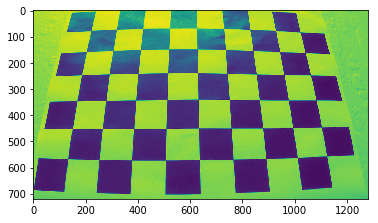

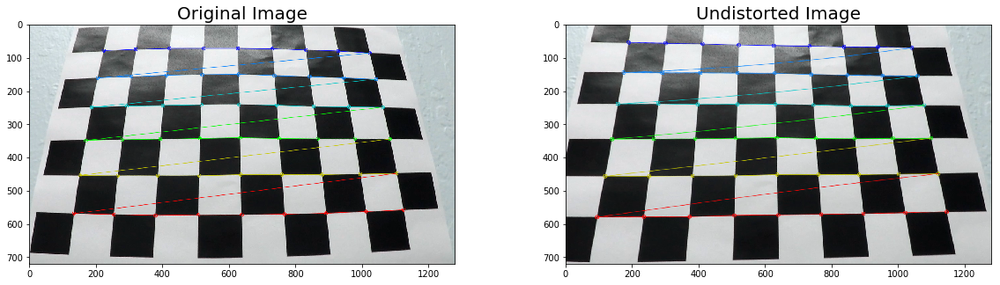

In [9]:
# call cv2 undistor
#def undistort(image, matrix, dis):
#    return cv2.undistort(image, matrix, dis, None, matrix)

nx = 9 # different than the course lecture
ny = 6
objpoints = []
imgpoints = []
# prepare object points, like (0,0,0), (1,0,0), ... 
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

img = cv2.imread('camera_cal/calibration3.jpg') # pick one
plt.imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray)

#Finding chessboard corners (for an nx x ny board):
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
# assume ret == True
imgpoints.append(corners)
objpoints.append(objp)
# Drawing detected corners on an image:
cv2.drawChessboardCorners(img, (nx, ny), corners, ret)

# Camera calibration, given object points, image points, and the shape of the grayscale image:
ret, matrix, dist, rvecs, tvecs = \
            cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
# where dist is distortion coefficent
# matrix, camera matrix to transform 3D to 2D image points

# Undistorting a test image:
undistorted = cv2.undistort(img, matrix, dist, None, matrix)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5))                             
ax1.set_title('Original Image', fontsize=20)
ax2.set_title('Undistorted Image', fontsize=20)
ax1.imshow(img)
ax2.imshow(undistorted)
plt.plot()

mkdir: cannot create directory ‘undistorted_folder’: File exists


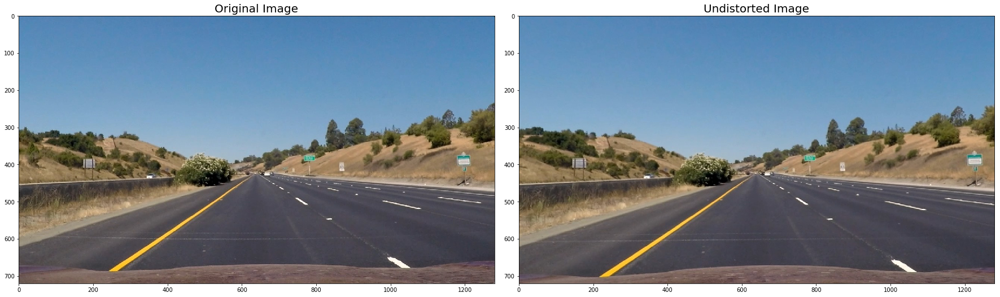

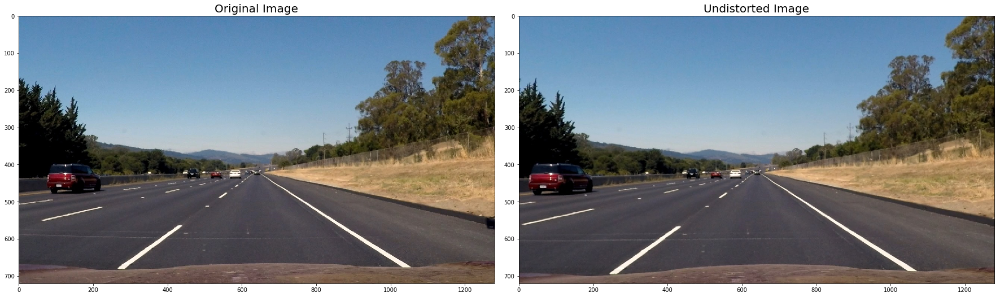

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


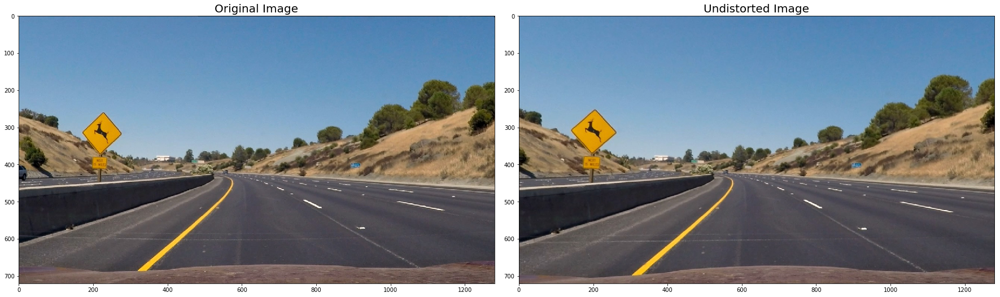

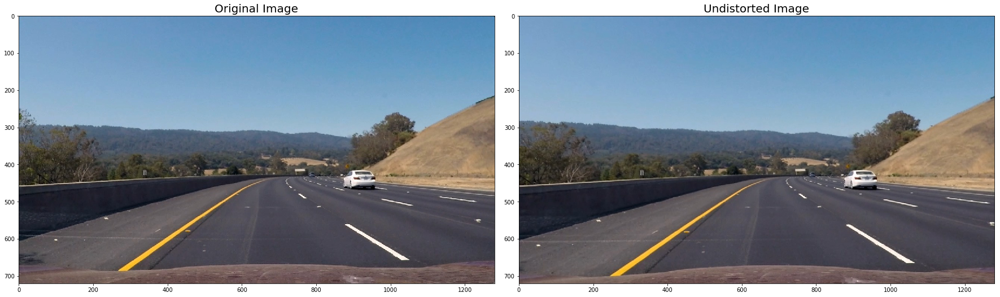

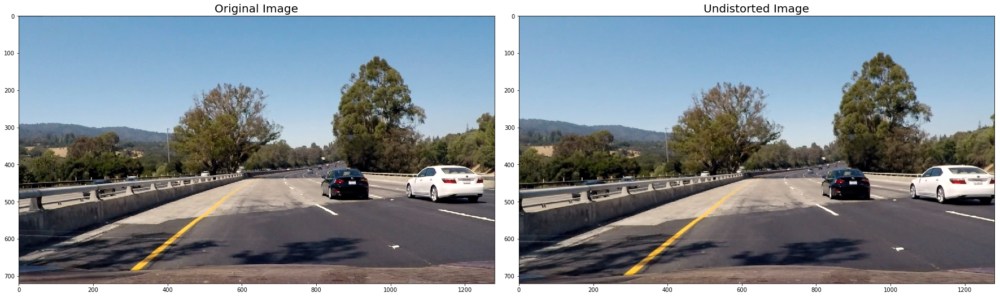

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


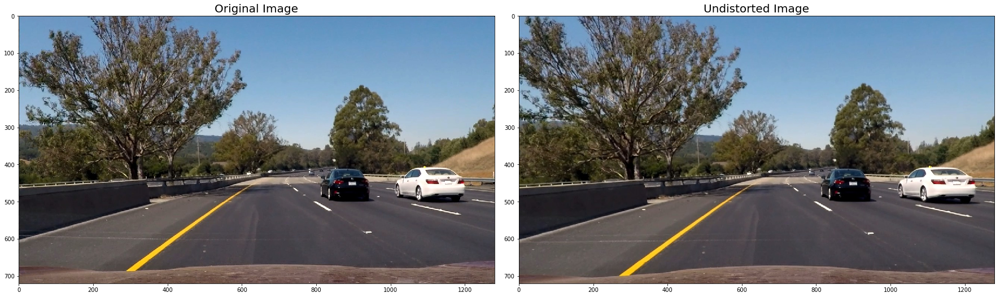

In [10]:
# mkdir system call
%mkdir undistorted_folder 

def save(dire, fname, img):
    #print(fname)
    fname = ''.join([dire,'undistorted_',fname])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.imwrite(fname,img)

images = ['straight_lines1.jpg', 'straight_lines2.jpg',
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(img, matrix, dist, None, matrix) #undistort(img, matrix, dist)          
    save('undistorted_folder/', fname, undistorted)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

In [11]:
# Code taken from Udacity lecture

# Sobel Absolute Threshold 
def abs_sobel_thresh(img, direction='x', 
                     sobel_kernel=3, thresh=(0, 255)):    
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    scaled_sobel = None
    # Sobel x
    if direction == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        abs_sobelx = np.absolute(sobelx) 
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))  
    # Sobel y
    else:
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) 
        abs_sobely = np.absolute(sobely) 
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
        
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1    
    return sxbinary

In [12]:
# Sobel Magnitude Threshold 
def mag_thresh(img, sobel_kernel=3, 
               mag_thresh=(0, 255)):
    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    magnitude = np.sqrt(np.square(sobelx)+np.square(sobely))
    abs_magnitude = np.absolute(magnitude)
    scaled_magnitude = np.uint8(255*abs_magnitude/np.max(abs_magnitude))
    mag_binary = np.zeros_like(scaled_magnitude)
    mag_binary[(scaled_magnitude >= mag_thresh[0]) & (scaled_magnitude <= mag_thresh[1])] = 1    
    return mag_binary

In [13]:
# Sobel Direction Threshold
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    arctan = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(arctan)
    dir_binary[(arctan >= thresh[0]) & (arctan <= thresh[1])] = 1    
    return dir_binary

In [14]:
def combined_sobel_gradient_thres(img, disp=False, s_thresh_min=150, s_thresh_max=255):    
    ksize = 3     # Sobel kernel size
    gradx = abs_sobel_thresh(img, direction='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(img, direction='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.4))    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1))|((mag_binary == 1) & (dir_binary == 1))] = 1    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1    
    combined_binary = np.zeros_like(combined)    
    combined_binary[(s_binary == 1) | (combined == 1)] = 1  
    fs = 30 # font size
    if disp == True:
        f, (ax1, ax2) = plt.subplots(2, 2, figsize=(40,20))
        ax1[0].set_title('Original Image', fontsize=20)
        ax1[0].imshow(img)
        ax1[1].set_title('Combined gradx, grady, mag, dir', fontsize=fs)
        ax1[1].imshow(combined, cmap='gray')
        ax2[0].set_title('Color Thresholding', fontsize=fs)
        ax2[0].imshow(s_binary, cmap='gray')
        ax2[1].set_title('Combined S Binary', fontsize=fs)
        ax2[1].imshow(combined_binary, cmap='gray')        
    return combined_binary, img, combined, s_binary

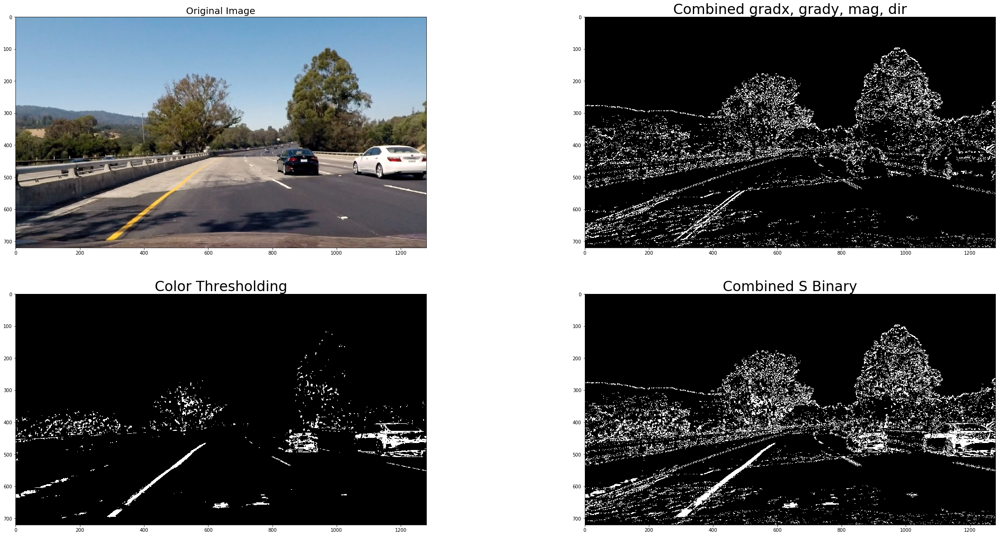

In [15]:
# check the plots
"""
img = 'undistorted_folder/undistorted_test6.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test2.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test5.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
"""
#img = 'undistorted_folder/undistorted_straight_lines1.jpg'
img = 'undistorted_folder/undistorted_test4.jpg'
img = cv2.imread(img)
combined_binary, img_color, combined_1, s_binary = combined_sobel_gradient_thres(img, disp=True)

In [16]:
def transform_image_warp(img, nx, ny): 
    offset = 100 # offset for dst points
    #type(img)
    # Grab the image shape
    
    img_size = (img.shape[1], img.shape[0])    
    #print(imgsz)
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    """
    img_size = (img.shape[1], img.shape[0])    
    #print(imgsz)
    src = np.float32(
        [[(img_size[0] / 2) - 60,    img_size[1] / 2 + 60],
        [((img_size[0] / 6) ),       img_size[1]],
        [(img_size[0] * 5 / 6),      img_size[1]],
        [(img_size[0] / 2 + 60),     img_size[1] / 2 + 60]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])    
    """
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)    
    return warped, M


def display_transformed_image(combined_binary, warped_img):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(combined_binary, cmap='gray')
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(warped_img,cmap='gray')
    ax2.set_title('Warped Image', fontsize=30)    
    plt.show()

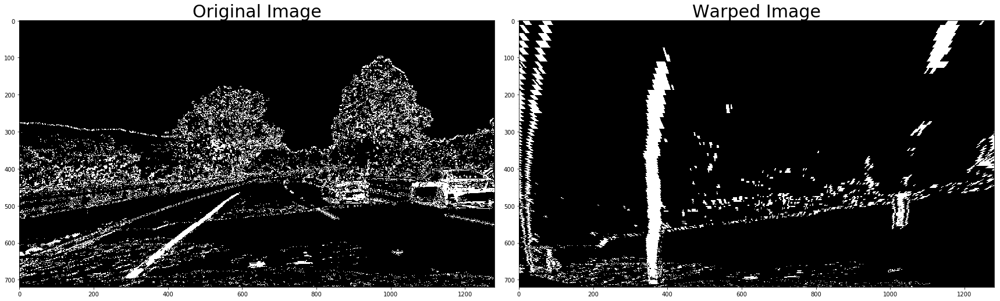

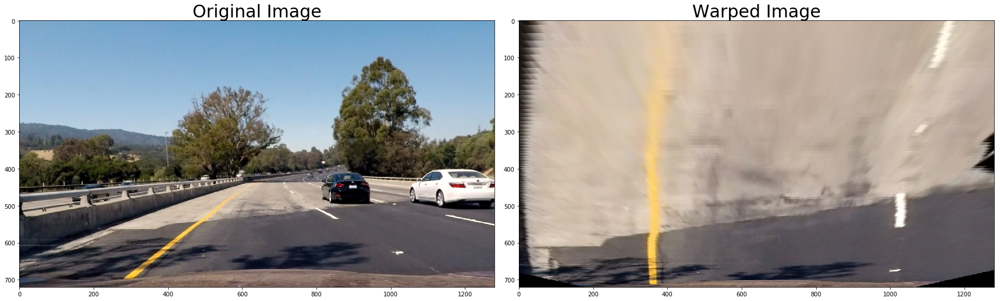

"\nimg1 = 'undistorted_folder/undistorted_test5.jpg'\nimg1 = cv2.imread(img1)\ncombined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)\nwarped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) \ndisplay_transformed_image(combined_binary_1, warped_img_1)\n"

In [17]:
#warped, M = transform_image(combined_binary, src, dst, matrix) 
warped_img, M = transform_image_warp(combined_binary, nx, ny) 
display_transformed_image(combined_binary, warped_img)

color_warped_img, color_M = transform_image_warp(img_color, nx, ny) 
display_transformed_image(img_color, color_warped_img)

"""
img1 = 'undistorted_folder/undistorted_test5.jpg'
img1 = cv2.imread(img1)
combined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)
warped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) 
display_transformed_image(combined_binary_1, warped_img_1)
"""

In [18]:
# Locating the Lanes
def locating_lanes(binary_warped, nwindows=9, margin=100, minpix=50):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []    
    ## Create an image to draw on and an image to show the selection window
    ##out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
     
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return  left_fit, right_fit,left_lane_inds, right_lane_inds, \
            nonzerox, nonzeroy, histogram


In [19]:
def display_lanes(left_fit, right_fit, left_lane_inds, 
                  right_lane_inds, binary_warped, 
                  nonzerox, nonzeroy, histogram, margin=85): #50):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]),  (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(binary_warped)
    #plt.imshow(out_img)
    #plt.imshow(result)
    plt.plot(left_fitx, ploty, color='red')
    plt.plot(right_fitx, ploty, color='red')    
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()

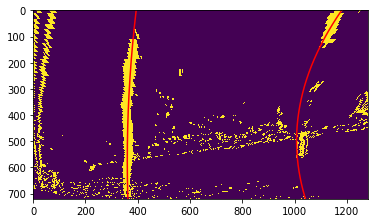

In [20]:
left_fit, right_fit, left_lane_inds, right_lane_inds,\
            nonzerox, nonzeroy, histogram = locating_lanes(warped_img)
    
display_lanes(left_fit, right_fit, left_lane_inds, \
              right_lane_inds, warped_img, nonzerox, nonzeroy, histogram)

......


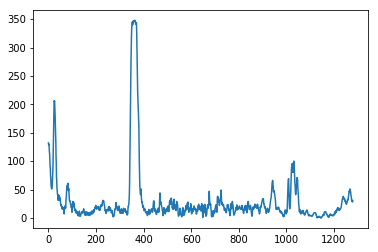

In [21]:
print('......')
plt.plot(histogram)  
plt.show()


# Radius of Curvature & Distance from Lane Center

In [181]:
def radius_curvature_center(binary_img, left_fit, right_fit):        
    ym_per_pix = 32/720#30/720 #3.048/100  # meters per pixel in y dimension
    xm_per_pix = 3.7/960#700 #3.7/380 #3.7/700 # meters per pixel in x dimension
    
    h = binary_img.shape[0] 
    ploty = np.linspace(0, h-1, h)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)    
    # follow udacity lecture formulat
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)    
    left_curv  = ((1 + (2*left_fit_cr[0] *y_eval*ym_per_pix \
                        + left_fit_cr[1])**2) **1.5) / np.absolute(2*left_fit_cr[0])
    
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)        
    right_curv = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix \
                        + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate vehicle center
    #left_lane and right lane bottom in pixels
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[1]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[1]*y_eval + right_fit[2]
    #left_lane_bottom = left_fit[2]#*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    #right_lane_bottom = right_fit[2]#*y_eval)**2 + right_fit[0]*y_eval + right_fit[2]
    #left_lane_bottom = left_fit[2]#*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    #right_lane_bottom = right_fit[2]#*y_eval)**2 + right_fit[0]*y_eval + right_fi
    # Lane center as mid of left and right lane bottom      
    
    lane_center = (left_lane_bottom + right_lane_bottom)/2.0
    center_image = binary_img.shape[1]/2 #640
    #print((right_lane_bottom - left_lane_bottom))
    #xm_per_pix = 3.7 / (right_lane_bottom - left_lane_bottom)
    center_dist = (lane_center - center_image) * xm_per_pix #Convert to meters
    #print(left_lane_bottom, right_lane_bottom, center_dis)
    return left_curv, right_curv, center_dist

In [182]:
left_curv, right_curv, center = radius_curvature_center(warped_img, left_fit, right_fit)


In [183]:
def draw_on_image(undist, warped_img, left_fit, right_fit, M, \
               left_curv, right_curv, center, show_values = False):    
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image and draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lanes the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    M_inverse = np.linalg.inv(M)
    
    # Warp the blank back to original image space using inverse perspective matrix
    unwarped = cv2.warpPerspective(color_warp, M_inverse, \
                                  (undist.shape[1], img.shape[0])) 
        
    result = cv2.addWeighted(undist, 1, unwarped, 0.3, 0)
    
    cv2.putText(result, 'left curvature: {:.2f} m'.format(left_curv), \
                (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    cv2.putText(result, 'right curvature: {:.2f} m'.format(right_curv), \
                (50, 100), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    lr = ''
    if(center > 0): lr = 'right'
    elif (center<0): lr = 'left'
    else: lr = 'center'
    
    cv2.putText(result, 'vehicle is {:.2f}m {}'.format(abs(center), lr), \
                (50, 150), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    if show_values == True:
        fig, ax = plt.subplots(figsize=(15, 8))
        ax.imshow(result)        
    return result

array([[[213, 232, 253],
        [224, 231, 240],
        [209, 203, 196],
        ..., 
        [ 51,  35,  18],
        [ 54,  38,  22],
        [ 58,  43,  27]],

       [[224, 230, 243],
        [190, 185, 186],
        [168, 152, 136],
        ..., 
        [134, 108,  78],
        [107,  80,  53],
        [ 61,  34,   7]],

       [[208, 200, 201],
        [167, 149, 138],
        [185, 155, 128],
        ..., 
        [181, 141,  99],
        [176, 136,  94],
        [133,  95,  53]],

       ..., 
       [[ 51,  57,  70],
        [ 89,  97, 110],
        [ 82,  91, 105],
        ..., 
        [ 66,  75,  95],
        [ 69,  78,  98],
        [ 73,  82, 102]],

       [[ 84,  90, 103],
        [ 61,  69,  82],
        [ 74,  83,  97],
        ..., 
        [ 52,  61,  81],
        [ 60,  69,  89],
        [ 82,  91, 111]],

       [[153, 159, 172],
        [ 49,  57,  70],
        [ 96, 105, 119],
        ..., 
        [ 48,  57,  77],
        [ 59,  68,  88],
        [ 85,  94,

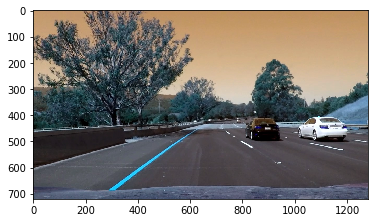

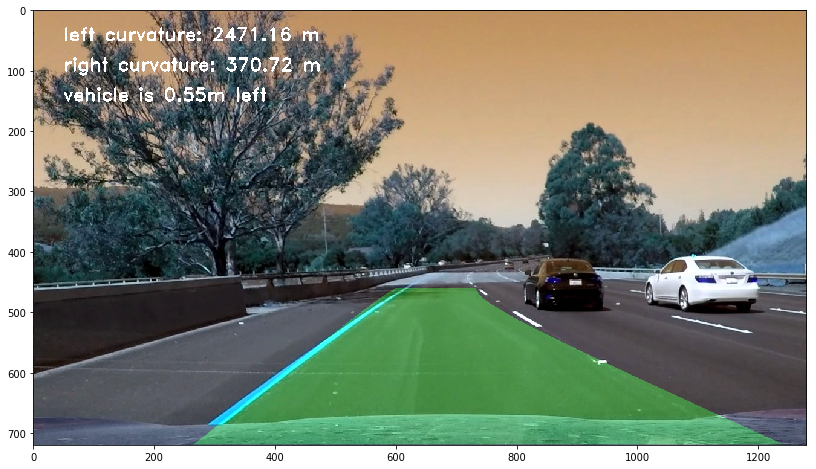

In [184]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
draw_on_image(img, warped_img, left_fit, right_fit, M, left_curv, right_curv, center, True)

# Pipeline

In [199]:
# for pipeline based on time-series images from the video
def locating_lanes_with_prev(left_fit, right_fit, binary_warped):    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                    & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                    & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]    
    left_fit_ = []
    right_fit_ = []    
    if len(leftx) != 0:        
        left_fit_ = np.polyfit(lefty, leftx, 2)    
    if len(rightx) != 0:        
        right_fit_ = np.polyfit(righty, rightx, 2)     
    return left_fit_, right_fit_


def is_good_lane(lane_class):
    status = True
    #print(lane_class.prev_left_lanes)
    #print(lane_class.right_fit)
    dist = lane_class.left_fit[2] - lane_class.right_fit[2]
    if lane_class.nlen_in > 0:
        left_diff = np.sum(np.absolute(lane_class.prev_left_lanes - lane_class.left_fit))
        right_diff = np.sum(np.absolute(lane_class.prev_right_lanes - lane_class.right_fit))        
        #print(lane_class.prev_right_lanes)
        right_m = np.mean(lane_class.prev_right_lanes, axis=0)
        left_m = np.mean(lane_class.prev_left_lanes, axis=0)
        diff_rel = 0.2 # 20%
        diff_right = np.absolute((right_m  - lane_class.right_fit)/right_m)
        diff_left = np.absolute((left_m  - lane_class.left_fit)/left_m)
        #print('mean', left_m)# - lane_class.left_fit[0])/lane_class.prev_left_lanes[0] 
        #print('right', lane_class.right_fit)
        #diff_l0 = np.absolute(lane_class.prev_left_lanes[0] - lane_class.left_fit[0])
        print('right diff' , diff_right)
        print('left_diff', diff_left)
        #print(diff_right[1], diff_right[1]>0.5)
        if diff_right[0] > diff_rel or diff_left[0] > diff_rel: 
            return False
        thres_margin = 50
        diff_threshold = thres_margin * len(lane_class.prev_right_lanes)
        if left_diff > diff_threshold or right_diff > diff_threshold:
            print('previous diff', diff_threshold, left_diff, right_diff)
            #status = False
            return False        
        #print(lane_class.left_fit)
        #print(lane_class.right_fit)
        if np.sum(lane_class.left_fit[0:1] - lane_class.right_fit[0:1]) > 1e-3:
            print('not parallel', lane_class.left_fit, lane_class.right_fit, 
                  np.sum(lane_class.left_fit - lane_class.right_fit))
            #status = False
            return False
            #break
    else:
        #status = True
        return True
    return status


In [200]:
# create a global data structure to store the time-series images
class Laneline():
    def __init__(self):
        self.last_left = None
        self.last_right = None
        self.left_fit = None
        self.right_fit = None
        self.count = 0 
        self.histograms = None
        self.prev_left_lanes = []
        self.prev_right_lanes = []
        self.bad_count = 0
        self.nlen = 50 # 50 # buffer size
        self.nlen_in = 0
        #self.current_left_lanes = None
        #self.current_right_lane = None
        

In [203]:

lane = Laneline()

def find_lanes(img):    
    img = cv2.undistort(img, matrix, dist, None, matrix)
    combined_binary, _, _, _ = combined_sobel_gradient_thres(img)
    warped_img, M = transform_image_warp(combined_binary, nx, ny) 
    #print('lane counter --> ', lane.counter)
    if lane.count == 0:
        lane.left_fit, lane.right_fit, left_lane_inds,\
                right_lane_inds, nonzerox, nonzeroy, lane.histograms = locating_lanes(warped_img)
        #lane.count += 1    
    else:
        lane.left_fit, lane.right_fit  = \
                locating_lanes_with_prev(lane.left_fit, lane.right_fit, warped_img)        
    
    #print(lane.left_fit, lane.right_fit)
    #return warped_img, lane.left_fit, lane.right_fit, M
    #status, delta_l, delta_s = is_good_lane(lane.left_fit, lane.right_fit)
    status = is_good_lane(lane)
    #status = True # open for the single image 
    #print(status)
    bc_threshold = 30
    #, delta_l, delta_s)
    if status == True: # or lane.bad_count >= bc_threshold:
        bad_count = 0
        #if lane.bad_count >= bc_threshold: lane.bad_count = 0
        lane.prev_left_lanes.append(lane.left_fit)
        lane.prev_right_lanes.append(lane.right_fit)
        nlen = lane.nlen
        lane.nlen_in += 1
        if lane.nlen_in >= nlen: #len(lane.prev_right_lanes) > nlen:
            lane.prev_right_lanes = lane.prev_right_lanes[-nlen::]            
            lane.prev_left_lanes = lane.prev_left_lanes[-nlen::]
            lane.nlen_in = nlen
    else:
        lane.bad_count += 1
        right_ls = lane.prev_right_lanes[0]
        len_rls = len(lane.prev_right_lanes)
        for i in range(1, len_rls):
            right_ls = np.add(right_ls, lane.prev_right_lanes[i])
            
        left_ls = lane.prev_left_lanes[0]
        len_lls = len(lane.prev_left_lanes)
        for i in range(1, len_lls):
            left_ls = np.add(left_ls, lane.prev_left_lanes[i])
        lane.left_fit = left_ls / len_lls
        lane.right_fit = right_ls / len_rls
    
    
    if lane.bad_count >= bc_threshold:
        print('clear bad lanes')
        lane.bad_count = 0
        lane.prev_left_lanes = []
        lane.prev_right_lanes = []
        lane.nlen_in = 0
    
    
    return warped_img, lane.left_fit, lane.right_fit, M

right diff [ 0.94909998  0.31202586  0.01332135]
left_diff [ 7.73615253  0.58683874  0.01296118]
right diff [ 2.99488291  1.98358116  0.14025119]
left_diff [  8.76182621  10.11898936   0.34998891]
right diff [ 2.89252714  2.01368511  0.10600075]
left_diff [ 4.21391026  7.51445752  0.28890029]
right diff [ 3.20089123  2.51943154  0.12859259]
left_diff [ 35.99498989   6.98833458   0.54405253]
right diff [ 10.87404005   3.26471332   0.1137471 ]
left_diff [ 3.00639147  5.01276111  0.14263771]
right diff [ 1.17793078  0.6868619   0.01596686]
left_diff [ 3.57389962  4.91902728  0.01023924]
right diff [ 0.68690461  0.89820426  0.11450318]
left_diff [ 1.0217129   3.46292648  0.39099075]


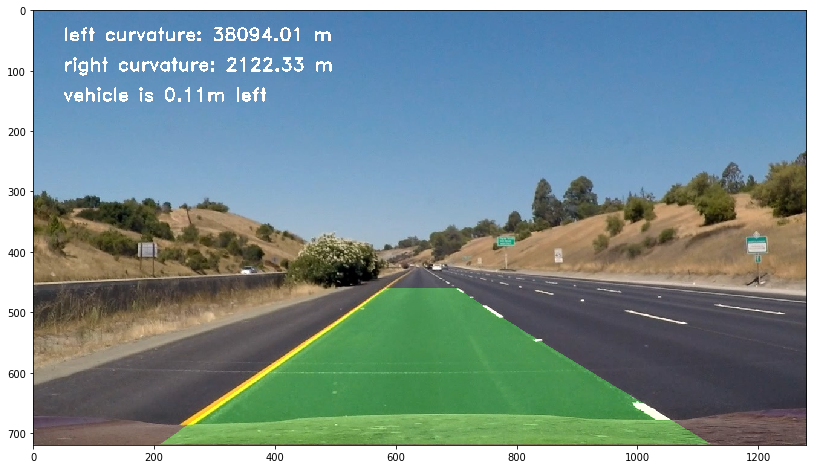

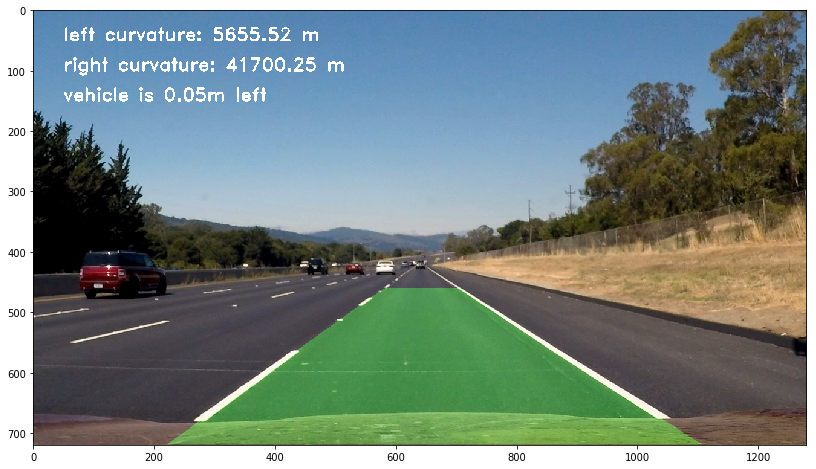

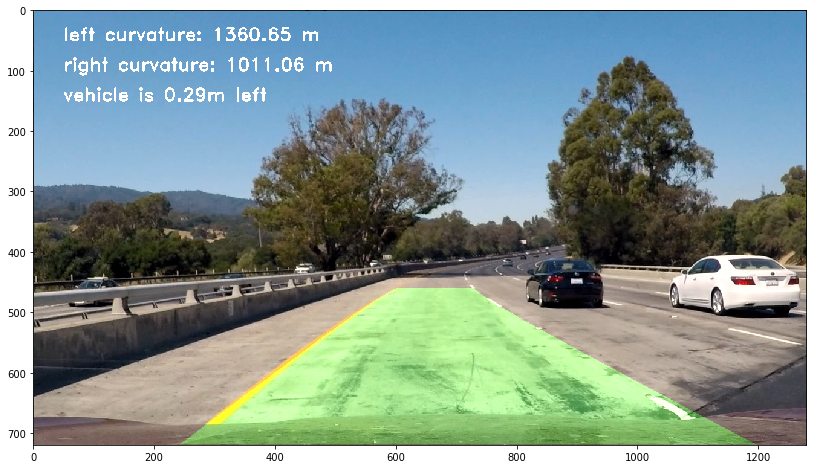

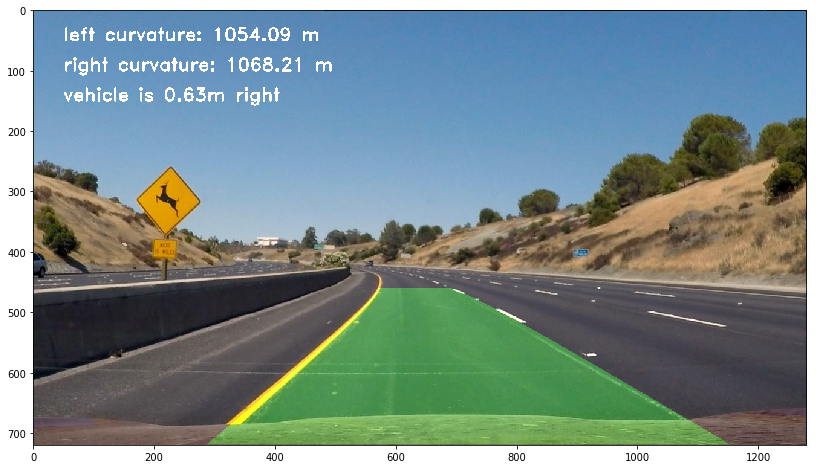

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [204]:
def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M = find_lanes(img)    
    left_curvature, right_curvature, center = \
            radius_curvature_center(warped_img, left_fit, right_fit)
    return draw_on_image(img, warped_img, left_fit,\
                         right_fit, M, left_curvature, right_curvature, center, show_values)
    
images = ['straight_lines1.jpg', 'straight_lines2.jpg',\
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', \
          'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pipeline(img, True)

# Video Generations

In [189]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML 
lane = Laneline()
def process_video(img):
    return pipeline(img)


#%mkdir videos

In [190]:
lane = Laneline()
output_file = 'videos/project_video_small.mp4'
clip = VideoFileClip("project_video.mp4").subclip(25, 42)
#lip = VideoFileClip("project_video.mp4").subclip(0,3)
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)

True
[MoviePy] >>>> Building video videos/project_video_small.mp4
[MoviePy] Writing video videos/project_video_small.mp4


  0%|          | 1/426 [00:00<01:44,  4.08it/s]

right diff [ 0.  0.  0.]
left_diff [ 0.  0.  0.]
True


  0%|          | 2/426 [00:00<01:49,  3.86it/s]

right diff [ 0.03907983  0.00061409  0.00603181]
left_diff [ 0.03387948  0.00856299  0.00586212]
True


  1%|          | 3/426 [00:00<01:50,  3.84it/s]

right diff [ 0.07677719  0.0434231   0.00380294]
left_diff [ 0.03151256  0.08377147  0.06079838]
True


  1%|          | 4/426 [00:01<01:51,  3.78it/s]

right diff [ 0.21360432  0.06435597  0.0101049 ]
left_diff [ 0.09637578  0.01997742  0.02057549]
False


  1%|          | 5/426 [00:01<01:52,  3.74it/s]

right diff [ 0.65138301  0.26615366  0.03711027]
left_diff [ 0.23013596  0.18558472  0.06438653]
False


  1%|▏         | 6/426 [00:01<01:51,  3.77it/s]

right diff [ 0.24063993  0.18206345  0.04789365]
left_diff [ 0.25346328  0.28210563  0.12906073]
False


  2%|▏         | 7/426 [00:01<01:53,  3.69it/s]

right diff [ 0.29667234  0.22508564  0.05638704]
left_diff [ 0.33724334  0.36952179  0.17045073]
False


  2%|▏         | 8/426 [00:02<01:52,  3.73it/s]

right diff [ 0.17679239  0.21286611  0.05735639]
left_diff [ 0.31281988  0.36330553  0.17377638]
False


  2%|▏         | 9/426 [00:02<01:50,  3.77it/s]

right diff [ 0.27119509  0.00873869  0.0350932 ]
left_diff [ 0.31970593  0.31579543  0.13536723]
False


  2%|▏         | 10/426 [00:02<01:48,  3.84it/s]

right diff [ 0.01478419  0.04525781  0.02249077]
left_diff [ 0.2619863   0.20682824  0.06894208]
False


  3%|▎         | 11/426 [00:02<01:50,  3.74it/s]

right diff [ 0.00448242  0.00319659  0.00475417]
left_diff [ 0.2077982   0.10113039  0.00028973]
False


  3%|▎         | 12/426 [00:03<01:50,  3.76it/s]

right diff [ 0.45308504  0.1488919   0.00124845]
left_diff [ 0.30632185  0.06279177  0.06402603]
False


  3%|▎         | 13/426 [00:03<01:50,  3.73it/s]

right diff [ 0.27425582  0.07116697  0.00038446]
left_diff [ 0.36128257  0.09672856  0.06336563]
False


  3%|▎         | 14/426 [00:03<01:46,  3.85it/s]

right diff [ 0.43670331  0.15464758  0.01237174]
left_diff [ 0.39600835  0.15570818  0.03194355]
False


  4%|▎         | 15/426 [00:04<01:51,  3.70it/s]

right diff [ 0.26488647  0.14218567  0.02799932]
left_diff [ 0.48117801  0.28094095  0.03183474]
False


  4%|▍         | 16/426 [00:04<01:51,  3.68it/s]

right diff [ 0.07453123  0.10688681  0.04204646]
left_diff [ 0.53270803  0.4011029   0.10048483]
False


  4%|▍         | 17/426 [00:04<01:51,  3.66it/s]

right diff [ 0.11546153  0.11495833  0.04692877]
left_diff [ 0.60751602  0.4605475   0.120785  ]
False


  4%|▍         | 18/426 [00:04<01:52,  3.64it/s]

right diff [ 0.44551836  0.25559689  0.05224738]
left_diff [ 0.56276469  0.42112828  0.0995037 ]
False


  4%|▍         | 19/426 [00:05<01:56,  3.50it/s]

right diff [ 0.05941044  0.09007718  0.03844204]
left_diff [ 0.60318894  0.41420698  0.07739992]
False


  5%|▍         | 20/426 [00:05<01:55,  3.51it/s]

right diff [ 0.00502583  0.06392036  0.03538792]
left_diff [ 0.6202203  0.411772   0.0680442]
False


  5%|▍         | 21/426 [00:05<01:54,  3.55it/s]

right diff [ 0.20110866  0.13601168  0.03368366]
left_diff [ 0.55865635  0.35529446  0.0385104 ]
False


  5%|▌         | 22/426 [00:05<01:48,  3.72it/s]

right diff [ 0.07949565  0.09295339  0.03316674]
left_diff [ 0.56294773  0.37789038  0.04791234]
False


  5%|▌         | 23/426 [00:06<01:52,  3.60it/s]

right diff [ 0.14419682  0.00442796  0.0268067 ]
left_diff [ 0.47954407  0.3536551   0.04890296]
False


  6%|▌         | 24/426 [00:06<01:49,  3.66it/s]

right diff [ 0.10768935  0.00110105  0.02482914]
left_diff [ 0.48700303  0.36685613  0.05277917]
False


  6%|▌         | 25/426 [00:06<01:47,  3.72it/s]

right diff [ 0.26043424  0.05915229  0.02430158]
left_diff [ 0.54210781  0.42189475  0.07656824]
False


  6%|▌         | 26/426 [00:07<01:42,  3.88it/s]

right diff [ 0.13063391  0.00220381  0.02717098]
left_diff [ 0.50484664  0.4158267   0.07642136]
False


  6%|▋         | 27/426 [00:07<01:44,  3.82it/s]

right diff [ 0.01832922  0.05217575  0.02982365]
left_diff [ 0.4577854   0.40349317  0.07730563]
False


  7%|▋         | 28/426 [00:07<01:43,  3.86it/s]

right diff [ 0.19843419  0.11044158  0.03001693]
left_diff [ 0.41581945  0.38034779  0.06883087]
False


  7%|▋         | 29/426 [00:07<01:42,  3.86it/s]

right diff [ 0.54038656  0.21943474  0.03478842]
left_diff [ 0.35140574  0.35656265  0.0662178 ]
False


  7%|▋         | 30/426 [00:08<01:40,  3.94it/s]

right diff [ 0.16037183  0.06131943  0.02461542]
left_diff [ 0.30679338  0.33143298  0.05895496]
False


  7%|▋         | 31/426 [00:08<01:42,  3.86it/s]

right diff [ 0.16948253  0.04222297  0.02215028]
left_diff [ 0.25842015  0.3159656   0.05892631]
False


  8%|▊         | 32/426 [00:08<01:37,  4.02it/s]

right diff [ 0.17043796  0.03841767  0.02252327]
left_diff [ 0.23624686  0.30733791  0.05721742]
False


  8%|▊         | 33/426 [00:08<01:43,  3.81it/s]

right diff [ 0.10936581  0.03358474  0.01942672]
left_diff [ 0.23498657  0.2810448   0.03934446]
False
clear bad lanes


  8%|▊         | 34/426 [00:09<01:39,  3.94it/s]

True


  8%|▊         | 35/426 [00:09<01:40,  3.90it/s]

right diff [ 0.12190709  0.03075264  0.00102319]
left_diff [ 0.05082987  0.01107265  0.00440882]
True


  8%|▊         | 36/426 [00:09<01:40,  3.90it/s]

right diff [ 0.28200636  0.09820682  0.00401511]
left_diff [ 0.0229739   0.00632815  0.00998438]
False


  9%|▊         | 37/426 [00:09<01:43,  3.76it/s]

right diff [ 0.46095184  0.16892181  0.00655735]
left_diff [ 0.06832687  0.06766301  0.02466966]
False


  9%|▉         | 38/426 [00:10<01:46,  3.64it/s]

right diff [ 0.20274639  0.07585452  0.0022035 ]
left_diff [ 0.03698658  0.04972694  0.02274097]
False


  9%|▉         | 39/426 [00:10<01:48,  3.58it/s]

right diff [ 0.21404385  0.07972544  0.00076871]
left_diff [ 0.0217518   0.04029533  0.02240557]
False


  9%|▉         | 40/426 [00:10<01:41,  3.80it/s]

right diff [ 0.01714684  0.03836618  0.00460963]
left_diff [ 0.03603097  0.02843034  0.01229209]
True


 10%|▉         | 41/426 [00:10<01:41,  3.80it/s]

right diff [ 0.5055854   0.12868892  0.00184861]
left_diff [ 0.05649947  0.01896267  0.00012938]
False


 10%|▉         | 42/426 [00:11<01:38,  3.91it/s]

right diff [ 0.16467678  0.01517816  0.00743276]
left_diff [ 0.09034206  0.02447504  0.00509264]
True


 10%|█         | 43/426 [00:11<01:44,  3.68it/s]

right diff [  1.22197757e-02   1.35105786e-02   6.74382623e-05]
left_diff [ 0.08429206  0.04293833  0.0066228 ]
True


 10%|█         | 44/426 [00:11<01:40,  3.82it/s]

right diff [ 0.10221035  0.05990184  0.00016924]
left_diff [ 0.06204511  0.03867379  0.00923521]
True


 11%|█         | 45/426 [00:11<01:39,  3.82it/s]

right diff [ 0.09438134  0.04811899  0.00049617]
left_diff [ 0.20892578  0.11986912  0.02059731]
False


 11%|█         | 46/426 [00:12<01:39,  3.83it/s]

right diff [ 0.02212613  0.0016623   0.00569245]
left_diff [ 0.18492736  0.10333797  0.01825672]
True


 11%|█         | 47/426 [00:12<01:39,  3.80it/s]

right diff [ 0.09362634  0.0686261   0.00464523]
left_diff [ 0.22975358  0.09394687  0.00232641]
False


 11%|█▏        | 48/426 [00:12<01:37,  3.88it/s]

right diff [ 0.22735298  0.08871451  0.00178879]
left_diff [ 0.30585078  0.14302067  0.01221584]
False


 12%|█▏        | 49/426 [00:13<01:40,  3.75it/s]

right diff [ 0.56692357  0.24481454  0.01234966]
left_diff [ 0.31201562  0.14294149  0.0090731 ]
False


 12%|█▏        | 50/426 [00:13<01:34,  3.97it/s]

right diff [ 0.57347784  0.26573576  0.01661967]
left_diff [ 0.30848618  0.14073949  0.00747886]
False


 12%|█▏        | 51/426 [00:13<01:34,  3.95it/s]

right diff [ 0.10656625  0.08608249  0.00936087]
left_diff [ 0.29680425  0.13316354  0.00240831]
False


 12%|█▏        | 52/426 [00:13<01:35,  3.93it/s]

right diff [ 0.10961217  0.00603871  0.00552331]
left_diff [ 0.30718819  0.1414813   0.00263112]
False


 12%|█▏        | 53/426 [00:14<01:35,  3.90it/s]

right diff [ 0.31650935  0.06230777  0.00077744]
left_diff [ 0.34030562  0.176558    0.01160895]
False


 13%|█▎        | 54/426 [00:14<01:32,  4.01it/s]

right diff [ 0.77632538  0.20328703  0.00294333]
left_diff [ 0.318629    0.16887281  0.00858029]
False


 13%|█▎        | 55/426 [00:14<01:34,  3.94it/s]

right diff [ 0.69981301  0.17227651  0.00094096]
left_diff [ 0.31810953  0.17872032  0.01270832]
False


 13%|█▎        | 56/426 [00:14<01:32,  3.98it/s]

right diff [ 0.06242686  0.08817842  0.01111144]
left_diff [ 0.3366565   0.18556118  0.01177297]
False


 13%|█▎        | 57/426 [00:15<01:35,  3.88it/s]

right diff [ 0.15346329  0.00656497  0.00637478]
left_diff [ 0.37523293  0.21659543  0.01906574]
False


 14%|█▎        | 58/426 [00:15<01:33,  3.95it/s]

right diff [ 0.28069354  0.05518457  0.00309319]
left_diff [ 0.3714282   0.22622479  0.02381944]
False


 14%|█▍        | 59/426 [00:15<01:32,  3.97it/s]

right diff [ 0.25550093  0.06630664  0.00103096]
left_diff [ 0.38247293  0.24709992  0.03270303]
False


 14%|█▍        | 60/426 [00:15<01:30,  4.05it/s]

right diff [ 0.03311137  0.03017153  0.00553338]
left_diff [ 0.34236289  0.23185123  0.03093488]
False


 14%|█▍        | 61/426 [00:16<01:32,  3.96it/s]

right diff [ 0.50918001  0.2635221   0.02212694]
left_diff [ 0.40411893  0.2520495   0.02740314]
False


 15%|█▍        | 62/426 [00:16<01:28,  4.13it/s]

right diff [ 0.33936328  0.19800601  0.01923905]
left_diff [ 0.32797081  0.21956365  0.02574183]
False


 15%|█▍        | 63/426 [00:16<01:30,  4.02it/s]

right diff [ 0.16055555  0.12240973  0.01380505]
left_diff [ 0.23085957  0.19708219  0.03219517]
False


 15%|█▌        | 64/426 [00:16<01:28,  4.09it/s]

right diff [ 0.18039209  0.10413683  0.00600309]
left_diff [ 0.23426264  0.23765512  0.05393451]
False


 15%|█▌        | 65/426 [00:17<01:31,  3.93it/s]

right diff [ 0.05256523  0.01886504  0.00384446]
left_diff [ 0.19466432  0.21431216  0.04873662]
True


 15%|█▌        | 66/426 [00:17<01:28,  4.06it/s]

right diff [ 0.41796392  0.08580696  0.00307577]
left_diff [ 0.09031085  0.1646729   0.0419819 ]
False


 16%|█▌        | 67/426 [00:17<01:29,  4.02it/s]

right diff [ 0.39787509  0.07843108  0.00487618]
left_diff [ 0.05637136  0.06380614  0.0208096 ]
False


 16%|█▌        | 68/426 [00:17<01:27,  4.08it/s]

right diff [ 0.03384608  0.08425108  0.01432612]
left_diff [ 0.13396648  0.01935794  0.01495418]
True


 16%|█▌        | 69/426 [00:18<01:29,  3.99it/s]

right diff [ 0.00413587  0.03884653  0.00830128]
left_diff [ 0.14188302  0.00328903  0.01442026]
True


 16%|█▋        | 70/426 [00:18<01:27,  4.09it/s]

right diff [ 0.07107883  0.02754047  0.00952281]
left_diff [ 0.11637965  0.00330566  0.01323553]
True


 17%|█▋        | 71/426 [00:18<01:28,  4.00it/s]

right diff [ 0.06386675  0.02093587  0.00717755]
left_diff [ 0.05005377  0.02439258  0.01517706]
True


 17%|█▋        | 72/426 [00:18<01:26,  4.08it/s]

right diff [ 0.2967844   0.15616578  0.01471425]
left_diff [ 0.0706087   0.01749511  0.00047619]
False


 17%|█▋        | 73/426 [00:19<01:28,  3.98it/s]

right diff [ 0.24380683  0.1530254   0.0176989 ]
left_diff [ 0.09167418  0.05022279  0.01054743]
False


 17%|█▋        | 74/426 [00:19<01:25,  4.09it/s]

right diff [ 0.08319925  0.10030441  0.01760443]
left_diff [ 0.11220916  0.07681943  0.01879398]
True


 18%|█▊        | 75/426 [00:19<01:28,  3.98it/s]

right diff [ 0.13802112  0.01047163  0.0147082 ]
left_diff [ 0.15985619  0.13256463  0.03611382]
True


 18%|█▊        | 76/426 [00:19<01:25,  4.08it/s]

right diff [ 0.37597495  0.08247497  0.01051583]
left_diff [ 0.0989476   0.10897713  0.03721687]
False


 18%|█▊        | 77/426 [00:19<01:26,  4.04it/s]

right diff [ 0.42180235  0.10477174  0.00639168]
left_diff [ 0.08891203  0.09111229  0.02840662]
False
clear bad lanes


 18%|█▊        | 78/426 [00:20<01:23,  4.16it/s]

True


 19%|█▊        | 79/426 [00:20<01:25,  4.06it/s]

right diff [ 0.10173893  0.07007018  0.00523298]
left_diff [ 0.02781974  0.01234673  0.0018286 ]
True


 19%|█▉        | 80/426 [00:20<01:24,  4.11it/s]

right diff [ 0.12625378  0.07600201  0.00706679]
left_diff [ 0.0414683   0.00503124  0.00793397]
True


 19%|█▉        | 81/426 [00:20<01:25,  4.01it/s]

right diff [ 0.03602197  0.00880459  0.00012451]
left_diff [ 0.04256896  0.01152149  0.0011947 ]
True


 19%|█▉        | 82/426 [00:21<01:26,  3.99it/s]

right diff [ 0.01251512  0.03107443  0.00313306]
left_diff [ 0.10088679  0.05520486  0.01114052]
True


 19%|█▉        | 83/426 [00:21<01:25,  4.00it/s]

right diff [ 0.18303576  0.0659002   0.00129436]
left_diff [ 0.09898282  0.04702824  0.00920941]
True


 20%|█▉        | 84/426 [00:21<01:23,  4.07it/s]

right diff [ 0.15082822  0.0508572   0.00304485]
left_diff [ 0.12365418  0.04423566  0.00173767]
True


 20%|█▉        | 85/426 [00:21<01:24,  4.03it/s]

right diff [ 0.23669357  0.10270091  0.00682051]
left_diff [ 0.12994049  0.04221624  0.00094741]
False


 20%|██        | 86/426 [00:22<01:23,  4.07it/s]

right diff [ 0.31560967  0.1307798   0.00627808]
left_diff [ 0.15677846  0.06726147  0.00545211]
False


 20%|██        | 87/426 [00:22<01:24,  3.99it/s]

right diff [ 0.2972908   0.110006    0.00322923]
left_diff [ 0.14529765  0.07743519  0.01416447]
False


 21%|██        | 88/426 [00:22<01:21,  4.13it/s]

right diff [ 0.10498461  0.00550663  0.00456272]
left_diff [ 0.13243587  0.08042475  0.01838535]
True


 21%|██        | 89/426 [00:22<01:23,  4.04it/s]

right diff [ 0.03973445  0.01104021  0.00200062]
left_diff [ 0.09676418  0.04791002  0.00637046]
True


 21%|██        | 90/426 [00:23<01:19,  4.20it/s]

right diff [ 0.20208089  0.10884019  0.00435618]
left_diff [ 0.05502489  0.00822013  0.00980783]
False


 21%|██▏       | 91/426 [00:23<01:21,  4.13it/s]

right diff [ 0.01261689  0.01401932  0.00068406]
left_diff [ 0.08211898  0.02543491  0.00690953]
True


 22%|██▏       | 92/426 [00:23<01:19,  4.18it/s]

right diff [ 0.06166491  0.00657898  0.00481033]
left_diff [ 0.06743262  0.04425023  0.00533278]
True


 22%|██▏       | 93/426 [00:23<01:21,  4.10it/s]

right diff [ 0.09667394  0.0077032   0.00844189]
left_diff [ 0.11126471  0.06782557  0.01072724]
True


 22%|██▏       | 94/426 [00:24<01:20,  4.13it/s]

right diff [ 0.02115709  0.06720272  0.01436063]
left_diff [ 0.06429413  0.04085098  0.00425759]
True


 22%|██▏       | 95/426 [00:24<01:20,  4.11it/s]

right diff [ 0.07451575  0.10926172  0.01946072]
left_diff [ 0.07509868  0.05545765  0.00987914]
True


 23%|██▎       | 96/426 [00:24<01:21,  4.05it/s]

right diff [ 0.12565826  0.16308929  0.02673572]
left_diff [ 0.17473324  0.10408545  0.01407555]
True


 23%|██▎       | 97/426 [00:24<01:22,  3.99it/s]

right diff [ 0.21838516  0.00440965  0.02015794]
left_diff [ 0.10885322  0.0726477   0.01063395]
False


 23%|██▎       | 98/426 [00:25<01:20,  4.07it/s]

right diff [ 0.43870947  0.1090552   0.0166369 ]
left_diff [ 0.09475773  0.06229691  0.00716716]
False


 23%|██▎       | 99/426 [00:25<01:21,  4.04it/s]

right diff [ 0.47856389  0.12018041  0.01811578]
left_diff [ 0.07775493  0.05145462  0.00515627]
False


 23%|██▎       | 100/426 [00:25<01:19,  4.09it/s]

right diff [ 0.37997391  0.04157583  0.02911626]
left_diff [ 0.11152158  0.08685949  0.01570877]
False


 24%|██▎       | 101/426 [00:25<01:20,  4.01it/s]

right diff [ 0.27521207  0.00468038  0.02981457]
left_diff [ 0.04741466  0.04609526  0.00516201]
False


 24%|██▍       | 102/426 [00:26<01:19,  4.10it/s]

right diff [ 0.12071782  0.06962879  0.034952  ]
left_diff [ 0.00759042  0.00112488  0.00852015]
True


 24%|██▍       | 103/426 [00:26<01:18,  4.09it/s]

right diff [ 0.28506991  0.19591493  0.03584032]
left_diff [ 0.01971134  0.01036516  0.01474869]
False


 24%|██▍       | 104/426 [00:26<01:16,  4.19it/s]

right diff [ 0.53390524  0.3077774   0.04221421]
left_diff [ 0.07558088  0.05304504  0.02597243]
False


 25%|██▍       | 105/426 [00:26<01:18,  4.09it/s]

right diff [ 0.25753759  0.2139512   0.04083589]
left_diff [ 0.08128124  0.06064253  0.03107031]
False


 25%|██▍       | 106/426 [00:27<01:18,  4.07it/s]

right diff [ 0.2083511   0.01414709  0.03101454]
left_diff [ 0.14808434  0.11167366  0.04554672]
False


 25%|██▌       | 107/426 [00:27<01:20,  3.97it/s]

right diff [ 0.00784645  0.10771461  0.03238348]
left_diff [ 0.09151892  0.12440679  0.06279182]
True


 25%|██▌       | 108/426 [00:27<01:18,  4.03it/s]

right diff [ 0.1867562  0.0070038  0.0218237]
left_diff [ 0.08495386  0.1500927   0.07771728]
True


 26%|██▌       | 109/426 [00:27<01:19,  4.00it/s]

right diff [ 0.3236014   0.06330078  0.01959534]
left_diff [ 0.02894446  0.11806037  0.07186469]
False


 26%|██▌       | 110/426 [00:28<01:16,  4.14it/s]

right diff [ 0.43935983  0.11676517  0.01810982]
left_diff [ 0.06639106  0.13108994  0.07261494]
False


 26%|██▌       | 111/426 [00:28<01:18,  3.99it/s]

right diff [ 0.35468856  0.07593942  0.02072856]
left_diff [ 0.15586521  0.17075014  0.07966522]
False


 26%|██▋       | 112/426 [00:28<01:19,  3.93it/s]

right diff [ 0.28398627  0.02175973  0.02693282]
left_diff [ 0.07282783  0.12694751  0.07435674]
False


 27%|██▋       | 113/426 [00:28<01:20,  3.88it/s]

right diff [ 0.10687385  0.03706577  0.02815643]
left_diff [ 0.0452693   0.12551892  0.08104849]
True


 27%|██▋       | 114/426 [00:29<01:17,  4.02it/s]

right diff [ 0.00909734  0.09817745  0.03421706]
left_diff [ 0.11979804  0.14188602  0.07596337]
True


 27%|██▋       | 115/426 [00:29<01:18,  3.95it/s]

right diff [ 0.3884437   0.21909526  0.03376488]
left_diff [ 0.0923999   0.14046799  0.08305939]
False


 27%|██▋       | 116/426 [00:29<01:17,  3.99it/s]

right diff [ 0.16627103  0.1448255   0.03168753]
left_diff [ 0.06276543  0.12881908  0.08347298]
True


 27%|██▋       | 117/426 [00:29<01:18,  3.95it/s]

right diff [ 0.08597088  0.10310315  0.02674203]
left_diff [ 0.0391024   0.12458973  0.08784619]
True


 28%|██▊       | 118/426 [00:30<01:16,  4.01it/s]

right diff [ 0.26754619  0.19877615  0.03184463]
left_diff [ 0.04874385  0.12160457  0.08437142]
False


 28%|██▊       | 119/426 [00:30<01:17,  3.98it/s]

right diff [ 0.00428033  0.06744378  0.02410855]
left_diff [ 0.13390064  0.17392884  0.09651341]
True


 28%|██▊       | 120/426 [00:30<01:15,  4.04it/s]

right diff [ 0.15839663  0.01714588  0.0245259 ]
left_diff [ 0.04619733  0.07703549  0.07955269]
True


 28%|██▊       | 121/426 [00:30<01:16,  3.98it/s]

right diff [ 0.16680639  0.01285958  0.02583228]
left_diff [ 0.00100758  0.07800644  0.07311681]
True


 29%|██▊       | 122/426 [00:31<01:14,  4.07it/s]

right diff [ 0.36816206  0.08244067  0.02208764]
left_diff [ 0.13509643  0.00231258  0.06103983]
False


 29%|██▉       | 123/426 [00:31<01:16,  3.95it/s]

right diff [ 0.23973076  0.00263128  0.03130706]
left_diff [ 0.17596686  0.02926447  0.05372955]
False


 29%|██▉       | 124/426 [00:31<01:15,  4.00it/s]

right diff [ 0.25786294  0.01205886  0.03703188]
left_diff [ 0.21883446  0.06800913  0.04599685]
False


 29%|██▉       | 125/426 [00:31<01:15,  3.96it/s]

right diff [ 0.03946221  0.10407329  0.04260005]
left_diff [ 0.14268325  0.02207498  0.05731968]
True


 30%|██▉       | 126/426 [00:32<01:15,  3.98it/s]

right diff [ 0.11028493  0.18652449  0.04937817]
left_diff [ 0.22340113  0.06133344  0.05326142]
False


 30%|██▉       | 127/426 [00:32<01:16,  3.89it/s]

right diff [ 0.41312844  0.30735925  0.05965662]
left_diff [ 0.25278978  0.09350558  0.04691709]
False


 30%|███       | 128/426 [00:32<01:15,  3.92it/s]

right diff [ 0.27618397  0.25456172  0.05789996]
left_diff [ 0.18036345  0.0454503   0.0600552 ]
False


 30%|███       | 129/426 [00:32<01:16,  3.91it/s]

right diff [ 0.08931807  0.11083937  0.05023578]
left_diff [ 0.16718806  0.01402295  0.0789459 ]
previous diff 1300 1060.8717057 1525.50867319
False


 31%|███       | 130/426 [00:33<01:13,  4.01it/s]

right diff [ 0.10739756  0.19723521  0.05567722]
left_diff [ 0.1408272   0.0090867   0.08878153]
previous diff 1300 1188.54515426 1691.56129165
False


 31%|███       | 131/426 [00:33<01:15,  3.92it/s]

right diff [ 0.07365153  0.21846321  0.06528455]
left_diff [ 0.09804632  0.00641275  0.08159477]
previous diff 1300 1093.58786117 1983.30502729
False


 31%|███       | 132/426 [00:33<01:15,  3.91it/s]

right diff [ 0.06333976  0.1758225   0.06761945]
left_diff [ 0.14491535  0.02907957  0.07508578]
previous diff 1300 1013.20289385 2053.67953325
False


 31%|███       | 133/426 [00:33<01:18,  3.74it/s]

right diff [ 0.25479713  0.0916622   0.06473545]
left_diff [ 0.18148949  0.05672496  0.06869109]
False
clear bad lanes


 31%|███▏      | 134/426 [00:34<01:15,  3.87it/s]

True


 32%|███▏      | 135/426 [00:34<01:17,  3.76it/s]

right diff [ 0.01146093  0.01158615  0.00093659]
left_diff [ 0.00312432  0.00405794  0.00043525]
True


 32%|███▏      | 136/426 [00:34<01:14,  3.87it/s]

right diff [ 0.06897306  0.03985852  0.00372938]
left_diff [ 0.10762253  0.03379426  0.0019676 ]
True


 32%|███▏      | 137/426 [00:34<01:14,  3.88it/s]

right diff [  5.32360258e+00   1.93804665e-01   2.22007196e-03]
left_diff [ 0.05350259  0.01951747  0.01377511]
False


 32%|███▏      | 138/426 [00:35<01:14,  3.89it/s]

right diff [ 6.23202181  0.42367665  0.01039246]
left_diff [ 0.19086557  0.03821341  0.00853493]
False


 33%|███▎      | 139/426 [00:35<01:14,  3.87it/s]

right diff [ 0.78601799  0.15920218  0.00828501]
left_diff [ 0.24920888  0.03868433  0.01443692]
False


 33%|███▎      | 140/426 [00:35<01:13,  3.90it/s]

right diff [ 0.92226951  0.20935909  0.01207457]
left_diff [ 0.31986503  0.06621012  0.01264474]
False


 33%|███▎      | 141/426 [00:36<01:16,  3.72it/s]

right diff [ 0.41290452  0.07363336  0.00300481]
left_diff [ 0.35707931  0.09747264  0.00404638]
False


 33%|███▎      | 142/426 [00:36<01:13,  3.88it/s]

right diff [ 0.02655866  0.04409611  0.00177467]
left_diff [ 0.33828035  0.07784078  0.0100357 ]
False


 34%|███▎      | 143/426 [00:36<01:13,  3.84it/s]

right diff [ 0.1208276   0.01342351  0.00234653]
left_diff [ 0.40214787  0.12201121  0.00043381]
False


 34%|███▍      | 144/426 [00:36<01:13,  3.85it/s]

right diff [ 0.05449721  0.04925645  0.00814812]
left_diff [ 0.42875998  0.15606553  0.01133327]
False


 34%|███▍      | 145/426 [00:37<01:13,  3.84it/s]

right diff [ 0.20379567  0.13767601  0.01461914]
left_diff [ 0.36960739  0.14907255  0.01653639]
False


 34%|███▍      | 146/426 [00:37<01:11,  3.89it/s]

right diff [ 0.38234617  0.18940243  0.01548765]
left_diff [ 0.40343238  0.16317989  0.01716553]
False


 35%|███▍      | 147/426 [00:37<01:12,  3.87it/s]

right diff [ 0.60664166  0.2506129   0.01506663]
left_diff [ 0.3122768   0.09965514  0.00206833]
False


 35%|███▍      | 148/426 [00:37<01:12,  3.85it/s]

right diff [ 0.3680755   0.18210831  0.01054707]
left_diff [ 0.3603447   0.11115784  0.00201139]
False


 35%|███▍      | 149/426 [00:38<01:13,  3.75it/s]

right diff [ 5.17302072  0.05515302  0.00943647]
left_diff [ 0.42076423  0.13702057  0.0012212 ]
False


 35%|███▌      | 150/426 [00:38<01:13,  3.76it/s]

right diff [ 0.42541237  0.00095033  0.00506554]
left_diff [ 0.42165703  0.14391748  0.00286991]
False


 35%|███▌      | 151/426 [00:38<01:13,  3.72it/s]

right diff [ 0.81077435  0.07168918  0.00550639]
left_diff [ 0.31471516  0.11539515  0.00764049]
False


 36%|███▌      | 152/426 [00:38<01:11,  3.82it/s]

right diff [ 0.22107241  0.09995757  0.01719719]
left_diff [ 0.2809466   0.11599933  0.01294723]
False


 36%|███▌      | 153/426 [00:39<01:12,  3.75it/s]

right diff [ 0.38104546  0.07926776  0.02276608]
left_diff [ 0.21195451  0.10834483  0.01985229]
False


 36%|███▌      | 154/426 [00:39<01:09,  3.94it/s]

right diff [ 0.51352523  0.04871889  0.02231537]
left_diff [ 0.10559701  0.06246741  0.01499372]
False


 36%|███▋      | 155/426 [00:39<01:09,  3.88it/s]

right diff [ 0.33617076  0.08615278  0.02318111]
left_diff [ 0.1076606   0.04612577  0.00899658]
False


 37%|███▋      | 156/426 [00:39<01:09,  3.88it/s]

right diff [ 0.14328647  0.13008037  0.02338856]
left_diff [ 0.10781637  0.01872663  0.00224834]
True


 37%|███▋      | 157/426 [00:40<01:14,  3.59it/s]

right diff [ 0.01961135  0.10117093  0.01306038]
left_diff [ 0.03052608  0.078614    0.02791251]
True


 37%|███▋      | 158/426 [00:40<01:11,  3.72it/s]

right diff [ 0.38592422  0.23974688  0.02365179]
left_diff [ 0.04587046  0.0727282   0.02307564]
False


 37%|███▋      | 159/426 [00:40<01:10,  3.80it/s]

right diff [ 0.28387416  0.20742905  0.02202777]
left_diff [ 0.09390741  0.11275499  0.0340787 ]
False


 38%|███▊      | 160/426 [00:40<01:08,  3.87it/s]

right diff [ 0.23625083  0.18901138  0.01984362]
left_diff [ 0.18956241  0.17983564  0.04915481]
False


 38%|███▊      | 161/426 [00:41<01:09,  3.80it/s]

right diff [ 0.07963482  0.11200762  0.01980853]
left_diff [ 0.10704151  0.13345079  0.04001595]
True


 38%|███▊      | 162/426 [00:41<01:07,  3.92it/s]

right diff [ 0.52937654  0.04929665  0.00979055]
left_diff [ 0.10004737  0.12969383  0.03894356]
False


 38%|███▊      | 163/426 [00:41<01:07,  3.90it/s]

right diff [ 0.82219342  0.09759542  0.01180119]
left_diff [ 0.01009125  0.08472178  0.02966753]
False


 38%|███▊      | 164/426 [00:42<01:08,  3.84it/s]

right diff [ 0.54652207  0.00844343  0.02073011]
left_diff [ 0.06076423  0.08359179  0.02140846]
False


 39%|███▊      | 165/426 [00:42<01:07,  3.85it/s]

right diff [ 0.23940782  0.1838167   0.02776316]
left_diff [ 0.04762111  0.08415468  0.02148976]
False


 39%|███▉      | 166/426 [00:42<01:05,  3.99it/s]

right diff [ 0.10892669  0.17186912  0.02911768]
left_diff [ 0.08810338  0.11384173  0.0276106 ]
True


 39%|███▉      | 167/426 [00:42<01:06,  3.92it/s]

right diff [ 0.11563452  0.06127643  0.01767724]
left_diff [ 0.1776135   0.15661102  0.03407903]
True


 39%|███▉      | 168/426 [00:43<01:04,  4.01it/s]

right diff [ 0.12074699  0.13777306  0.02291739]
left_diff [ 0.2338956   0.15799424  0.02684339]
False


 40%|███▉      | 169/426 [00:43<01:04,  3.97it/s]

right diff [ 0.35155163  0.23268024  0.03110922]
left_diff [ 0.30103407  0.19995418  0.03373545]
False


 40%|███▉      | 170/426 [00:43<01:02,  4.11it/s]

right diff [ 0.5795201   0.34513175  0.04261202]
left_diff [ 0.35444219  0.21887427  0.03202352]
False


 40%|████      | 171/426 [00:43<01:03,  4.03it/s]

right diff [ 0.10563297  0.19972537  0.03955461]
left_diff [ 0.35969602  0.21925143  0.02948248]
False
clear bad lanes


 40%|████      | 172/426 [00:43<01:01,  4.11it/s]

True


 41%|████      | 173/426 [00:44<01:02,  4.02it/s]

right diff [ 0.110428    0.0249925   0.00013127]
left_diff [ 0.00086614  0.03190722  0.00792914]
True


 41%|████      | 174/426 [00:44<01:01,  4.08it/s]

right diff [ 0.16341402  0.06643055  0.00625775]
left_diff [ 0.06975118  0.06203461  0.02351447]
True


 41%|████      | 175/426 [00:44<01:01,  4.09it/s]

right diff [ 0.37573573  0.14728998  0.01004329]
left_diff [ 0.06345042  0.08598037  0.03078906]
False


 41%|████▏     | 176/426 [00:44<01:02,  4.01it/s]

right diff [ 0.01229868  0.01237359  0.00240762]
left_diff [ 0.06381654  0.12582943  0.04356343]
True


 42%|████▏     | 177/426 [00:45<01:07,  3.71it/s]

right diff [ 0.47145793  0.18551583  0.00459961]
left_diff [ 0.05395605  0.12903988  0.0447116 ]
False


 42%|████▏     | 178/426 [00:45<01:05,  3.79it/s]

right diff [ 0.9508798   0.40040524  0.01673267]
left_diff [ 0.14074344  0.10162949  0.04525118]
False


 42%|████▏     | 179/426 [00:45<01:11,  3.45it/s]

right diff [ 0.607657    0.30752975  0.02249393]
left_diff [ 0.22412065  0.03394599  0.03124042]
False


 42%|████▏     | 180/426 [00:46<01:11,  3.43it/s]

right diff [ 0.73312027  0.40149953  0.03506399]
left_diff [ 0.41008243  0.06593756  0.01553659]
False


 42%|████▏     | 181/426 [00:46<01:09,  3.54it/s]

right diff [ 0.86630127  0.49390756  0.04410809]
left_diff [ 0.52943508  0.08935104  0.01880007]
False


 43%|████▎     | 182/426 [00:46<01:07,  3.64it/s]

right diff [ 0.82591857  0.490614    0.04483227]
left_diff [ 0.61264195  0.087291    0.02664954]
False


 43%|████▎     | 183/426 [00:46<01:06,  3.68it/s]

right diff [ 0.63057057  0.4336327   0.04695161]
left_diff [ 0.78523092  0.14864809  0.02217565]
False


 43%|████▎     | 184/426 [00:47<01:04,  3.75it/s]

right diff [ 0.52066388  0.34287474  0.03689454]
left_diff [ 0.96788324  0.14498425  0.03962885]
False


 43%|████▎     | 185/426 [00:47<01:03,  3.81it/s]

right diff [ 0.37438317  0.29123914  0.03291301]
left_diff [ 1.13843717  0.16781567  0.05115412]
False


 44%|████▎     | 186/426 [00:47<01:01,  3.91it/s]

right diff [ 0.14740894  0.21552352  0.03048376]
left_diff [ 1.38862669  0.22133146  0.05772473]
False


 44%|████▍     | 187/426 [00:48<01:01,  3.89it/s]

right diff [ 0.2194702   0.06060209  0.01881437]
left_diff [ 1.20834381  0.09537687  0.08516777]
False


 44%|████▍     | 188/426 [00:48<01:01,  3.89it/s]

right diff [ 0.35318485  0.01283325  0.01464101]
left_diff [ 1.36679387  0.14509164  0.08825874]
False


 44%|████▍     | 189/426 [00:48<01:01,  3.85it/s]

right diff [ 0.11542572  0.06895582  0.01808684]
left_diff [ 1.27226776  0.11630202  0.09579088]
False


 45%|████▍     | 190/426 [00:48<01:00,  3.92it/s]

right diff [ 0.17192982  0.19056217  0.02667006]
left_diff [ 1.17641882  0.11170978  0.09606957]
False


 45%|████▍     | 191/426 [00:49<01:00,  3.88it/s]

right diff [ 0.30704288  0.02902652  0.0299007 ]
left_diff [ 1.16232227  0.17855265  0.07772199]
False


 45%|████▌     | 192/426 [00:49<00:58,  3.97it/s]

right diff [ 0.06448963  0.22552116  0.04915251]
left_diff [ 1.11035338  0.2560267   0.05370298]
False


 45%|████▌     | 193/426 [00:49<00:59,  3.90it/s]

right diff [ 0.0059012   0.19204598  0.04889023]
left_diff [ 0.91381978  0.19872617  0.05681127]
False


 46%|████▌     | 194/426 [00:49<00:58,  4.00it/s]

right diff [ 0.15457166  0.2367144   0.04758481]
left_diff [ 1.02684235  0.21680853  0.0643403 ]
False


 46%|████▌     | 195/426 [00:50<00:58,  3.92it/s]

right diff [ 0.09562797  0.19629445  0.0442619 ]
left_diff [ 0.91790318  0.17931914  0.06992941]
False


 46%|████▌     | 196/426 [00:50<00:58,  3.96it/s]

right diff [ 0.05884244  0.11278147  0.03841166]
left_diff [ 0.73565258  0.07804587  0.0878273 ]
False


 46%|████▌     | 197/426 [00:50<00:58,  3.91it/s]

right diff [ 0.03104342  0.09615294  0.03239378]
left_diff [ 0.70802619  0.01251644  0.10923749]
False


 46%|████▋     | 198/426 [00:50<00:57,  3.97it/s]

right diff [ 0.23190989  0.01430737  0.02615344]
left_diff [ 0.53468819  0.06409194  0.11989666]
False


 47%|████▋     | 199/426 [00:51<00:59,  3.81it/s]

right diff [ 0.53485022  0.16998703  0.01783978]
left_diff [ 0.36836179  0.10819167  0.12163159]
False


 47%|████▋     | 200/426 [00:51<01:01,  3.66it/s]

right diff [ 0.5395982   0.17906866  0.01917441]
left_diff [ 0.3266121   0.09855145  0.11864634]
False


 47%|████▋     | 201/426 [00:51<01:02,  3.61it/s]

right diff [ 0.26875854  0.13958307  0.03502891]
left_diff [ 0.48706803  0.02342095  0.10828345]
False


 47%|████▋     | 202/426 [00:51<01:01,  3.62it/s]

right diff [ 0.00796461  0.03633644  0.03376103]
left_diff [ 0.49946811  0.00581382  0.10530007]
False


 48%|████▊     | 203/426 [00:52<01:02,  3.56it/s]

right diff [ 0.27276997  0.10185106  0.02676966]
left_diff [ 0.44007898  0.01325585  0.10554963]
False


 48%|████▊     | 204/426 [00:52<01:00,  3.68it/s]

right diff [ 0.02181702  0.02142225  0.0332369 ]
left_diff [ 0.57699491  0.03664902  0.10227297]
False


 48%|████▊     | 205/426 [00:52<01:00,  3.67it/s]

right diff [ 0.07543144  0.02595008  0.03112342]
left_diff [ 0.67765319  0.05266681  0.10709516]
False
clear bad lanes


 48%|████▊     | 206/426 [00:53<00:58,  3.77it/s]

True


 49%|████▊     | 207/426 [00:53<01:06,  3.30it/s]

right diff [ 0.12675463  0.05696183  0.00333774]
left_diff [ 0.01125121  0.01872999  0.0082062 ]
True


 49%|████▉     | 208/426 [00:53<01:02,  3.49it/s]

right diff [ 0.19387542  0.09493376  0.00540889]
left_diff [ 0.15066023  0.0806876   0.00126932]
True


 49%|████▉     | 209/426 [00:54<01:08,  3.15it/s]

right diff [ 0.28124994  0.14560037  0.01094805]
left_diff [ 0.10672238  0.0100662   0.02276351]
False


 49%|████▉     | 210/426 [00:54<01:05,  3.31it/s]

right diff [ 0.66663295  0.26650941  0.0147052 ]
left_diff [ 0.14716147  0.01717139  0.03152912]
False


 50%|████▉     | 211/426 [00:54<01:04,  3.31it/s]

right diff [ 0.60120826  0.2756502   0.01917013]
left_diff [ 0.08450723  0.07490869  0.05836285]
False


 50%|████▉     | 212/426 [00:54<01:03,  3.36it/s]

right diff [ 0.86102844  0.40138361  0.02835534]
left_diff [ 0.12496935  0.07966337  0.07437603]
False


 50%|█████     | 213/426 [00:55<01:02,  3.42it/s]

right diff [ 0.98684001  0.46432841  0.02858071]
left_diff [ 0.18176665  0.00512616  0.06312354]
False


 50%|█████     | 214/426 [00:55<00:59,  3.59it/s]

right diff [ 0.07317582  0.05175343  0.00896399]
left_diff [ 0.17128952  0.01652024  0.05921453]
True


 50%|█████     | 215/426 [00:55<00:56,  3.71it/s]

right diff [ 0.06169349  0.0868089   0.00677261]
left_diff [ 0.16659125  0.10038072  0.03009233]
True


 51%|█████     | 216/426 [00:55<00:55,  3.76it/s]

right diff [ 0.25559606  0.17063793  0.01230525]
left_diff [ 0.20065661  0.0939226   0.03584736]
False


 51%|█████     | 217/426 [00:56<00:55,  3.74it/s]

right diff [ 0.16622527  0.16715044  0.01780104]
left_diff [ 0.09706396  0.02079584  0.06724272]
True


 51%|█████     | 218/426 [00:56<00:53,  3.90it/s]

right diff [ 0.2113785   0.17659916  0.01719587]
left_diff [ 0.02394684  0.0381378   0.06072031]
False


 51%|█████▏    | 219/426 [00:56<00:53,  3.90it/s]

right diff [ 0.14220842  0.03346475  0.01186463]
left_diff [ 0.20975414  0.05437138  0.06785163]
False


 52%|█████▏    | 220/426 [00:56<00:50,  4.05it/s]

right diff [ 0.22821396  0.00837958  0.00816951]
left_diff [ 0.05351138  0.01789411  0.07146648]
False


 52%|█████▏    | 221/426 [00:57<00:51,  3.96it/s]

right diff [ 0.18443847  0.02420449  0.00264389]
left_diff [ 0.15859468  0.1087359   0.04526031]
True


 52%|█████▏    | 222/426 [00:57<00:51,  3.98it/s]

right diff [ 0.20858003  0.11432239  0.00888521]
left_diff [ 0.26026464  0.19524471  0.02891085]
False


 52%|█████▏    | 223/426 [00:57<00:51,  3.97it/s]

right diff [ 0.21525161  0.15319687  0.01695817]
left_diff [ 0.12080104  0.08559797  0.04917776]
False


 53%|█████▎    | 224/426 [00:57<00:51,  3.96it/s]

right diff [ 0.40147247  0.23436799  0.02139669]
left_diff [ 0.06602296  0.07779766  0.0458364 ]
False


 53%|█████▎    | 225/426 [00:58<00:51,  3.91it/s]

right diff [ 0.47122067  0.28328943  0.02649371]
left_diff [ 0.02184486  0.10098811  0.03280882]
False


 53%|█████▎    | 226/426 [00:58<00:51,  3.90it/s]

right diff [ 0.19529922  0.19691038  0.02409846]
left_diff [ 0.07166345  0.07512337  0.02364782]
True


 53%|█████▎    | 227/426 [00:58<00:52,  3.78it/s]

right diff [ 0.52795985  0.08447738  0.01381587]
left_diff [ 0.17515019  0.00437288  0.02478236]
False


 54%|█████▎    | 228/426 [00:59<00:54,  3.63it/s]

right diff [ 0.06521788  0.08721812  0.0194125 ]
left_diff [ 0.28346155  0.01852581  0.0104916 ]
False


 54%|█████▍    | 229/426 [00:59<00:54,  3.62it/s]

right diff [ 0.0447264   0.11978063  0.02612847]
left_diff [ 0.37009093  0.09910764  0.02545848]
False


 54%|█████▍    | 230/426 [00:59<00:51,  3.80it/s]

right diff [ 0.0569002   0.12650798  0.02904315]
left_diff [ 0.41992229  0.13526092  0.03089107]
False


 54%|█████▍    | 231/426 [00:59<00:51,  3.82it/s]

right diff [ 0.33802178  0.00821034  0.02287974]
left_diff [ 0.47037339  0.16990507  0.03137844]
False


 54%|█████▍    | 232/426 [01:00<00:50,  3.82it/s]

right diff [ 4.97079591  2.4445883   0.00887884]
left_diff [ 0.43134786  0.14930903  0.02956454]
False


 55%|█████▍    | 233/426 [01:00<00:54,  3.53it/s]

right diff [ 0.20744925  0.10959036  0.01813463]
left_diff [ 0.41417889  0.12674779  0.02098275]
False


 55%|█████▍    | 234/426 [01:00<00:52,  3.66it/s]

right diff [ 0.51174769  0.21146552  0.02057876]
left_diff [ 0.38041994  0.09642942  0.01255992]
False


 55%|█████▌    | 235/426 [01:00<00:54,  3.52it/s]

right diff [ 0.23174695  0.16654646  0.02031762]
left_diff [ 0.2954538   0.05156651  0.01236128]
False


 55%|█████▌    | 236/426 [01:01<00:52,  3.64it/s]

right diff [ 0.77616074  0.36152539  0.02707564]
left_diff [ 0.23666682  0.00360049  0.00288993]
False


 56%|█████▌    | 237/426 [01:01<00:53,  3.53it/s]

right diff [ 0.59423957  0.32401829  0.0283195 ]
left_diff [ 0.3004354   0.08113524  0.02097956]
False


 56%|█████▌    | 238/426 [01:01<00:49,  3.76it/s]

right diff [ 0.16156999  0.16511445  0.02150158]
left_diff [ 0.24595733  0.04239516  0.01919287]
False


 56%|█████▌    | 239/426 [01:02<00:52,  3.55it/s]

right diff [ 0.16441663  0.06481364  0.02133511]
left_diff [ 0.29455517  0.12998105  0.0428758 ]
False


 56%|█████▋    | 240/426 [01:02<00:50,  3.68it/s]

right diff [ 0.11976395  0.1017325   0.02762076]
left_diff [ 0.41795183  0.24666652  0.06767695]
False


 57%|█████▋    | 241/426 [01:02<00:50,  3.65it/s]

right diff [ 0.29677068  0.26514182  0.03341634]
left_diff [ 0.36590126  0.21022427  0.05897902]
False


 57%|█████▋    | 242/426 [01:02<00:47,  3.85it/s]

right diff [ 0.3021207   0.30475155  0.04273996]
left_diff [ 0.31980857  0.23426683  0.07912024]
False


 57%|█████▋    | 243/426 [01:03<00:50,  3.63it/s]

right diff [  4.79683340e+00   2.39049906e+00   1.76866998e-03]
left_diff [ 0.34804522  0.23036032  0.07143612]
False
clear bad lanes


 57%|█████▋    | 244/426 [01:03<00:47,  3.81it/s]

True


 58%|█████▊    | 245/426 [01:03<00:50,  3.60it/s]

right diff [ 0.07722308  0.04344638  0.00517842]
left_diff [ 0.19488821  0.06307003  0.00211939]
True


 58%|█████▊    | 246/426 [01:03<00:47,  3.76it/s]

right diff [ 0.43527654  0.13334981  0.00764247]
left_diff [ 0.28226991  0.14727389  0.01323003]
False


 58%|█████▊    | 247/426 [01:04<00:50,  3.56it/s]

right diff [ 0.41723997  0.15304495  0.0145074 ]
left_diff [ 0.38516239  0.14771093  0.00386632]
False


 58%|█████▊    | 248/426 [01:04<00:46,  3.80it/s]

right diff [ 0.85618693  0.28806781  0.02138069]
left_diff [ 0.50825353  0.23037415  0.00307645]
False


 58%|█████▊    | 249/426 [01:04<00:49,  3.60it/s]

right diff [ 0.60657364  0.25780736  0.02648112]
left_diff [ 0.52443297  0.20229159  0.0107923 ]
False


 59%|█████▊    | 250/426 [01:04<00:46,  3.79it/s]

right diff [ 1.01695743  0.38693718  0.03290164]
left_diff [ 0.36892629  0.1471033   0.00917689]
False


 59%|█████▉    | 251/426 [01:05<00:47,  3.69it/s]

right diff [ 0.31686617  0.02130706  0.01064333]
left_diff [ 0.37260451  0.22162041  0.01602338]
False


 59%|█████▉    | 252/426 [01:05<00:45,  3.85it/s]

right diff [ 0.39052672  0.01728845  0.0170888 ]
left_diff [ 0.25446125  0.11764701  0.0028385 ]
False


 59%|█████▉    | 253/426 [01:05<00:45,  3.79it/s]

right diff [ 0.15850687  0.05041025  0.02042944]
left_diff [ 0.25741896  0.12249145  0.00342339]
False


 60%|█████▉    | 254/426 [01:06<00:44,  3.88it/s]

right diff [ 0.21255191  0.16351284  0.02490826]
left_diff [ 0.36282371  0.21472978  0.01370711]
False


 60%|█████▉    | 255/426 [01:06<00:46,  3.69it/s]

right diff [ 2.184891    1.72624614  0.021471  ]
left_diff [ 0.49672039  0.30562442  0.02347788]
False


 60%|██████    | 256/426 [01:06<00:44,  3.80it/s]

right diff [ 1.08044091  1.50602705  0.01572642]
left_diff [ 0.58896781  0.3927522   0.03820972]
False


 60%|██████    | 257/426 [01:06<00:47,  3.58it/s]

right diff [ 0.16617711  0.02562913  0.00996552]
left_diff [ 0.56392506  0.30060132  0.01001599]
False


 61%|██████    | 258/426 [01:07<00:44,  3.74it/s]

right diff [ 0.53237848  0.1683303   0.01484124]
left_diff [ 0.5874292   0.36305671  0.02505958]
False


 61%|██████    | 259/426 [01:07<00:45,  3.68it/s]

right diff [ 0.61552222  0.16180699  0.00905982]
left_diff [ 0.62255763  0.43912623  0.04559486]
False


 61%|██████    | 260/426 [01:07<00:43,  3.81it/s]

right diff [ 0.99540481  0.26174051  0.01165218]
left_diff [ 0.40055643  0.3659835   0.05138298]
False


 61%|██████▏   | 261/426 [01:07<00:43,  3.82it/s]

right diff [ 0.96463727  0.27010148  0.00884842]
left_diff [ 0.42649517  0.50198341  0.09389157]
False


 62%|██████▏   | 262/426 [01:08<00:41,  3.92it/s]

right diff [ 0.01598105  0.02720139  0.00558035]
left_diff [ 0.04035896  0.26446577  0.07113341]
True


 62%|██████▏   | 263/426 [01:08<00:43,  3.71it/s]

right diff [ 0.25151754  0.09152921  0.00870196]
left_diff [ 0.01223543  0.21214819  0.06493028]
False


 62%|██████▏   | 264/426 [01:08<00:43,  3.76it/s]

right diff [  4.36123644e-01   1.14353345e-01   5.41080892e-05]
left_diff [ 0.13693741  0.12713553  0.06147874]
False


 62%|██████▏   | 265/426 [01:08<00:42,  3.78it/s]

right diff [ 0.57390159  0.18666101  0.00922826]
left_diff [ 0.33129751  0.02873843  0.03310008]
False


 62%|██████▏   | 266/426 [01:09<00:41,  3.87it/s]

right diff [ 0.20408319  0.06621189  0.00405304]
left_diff [ 0.35893651  0.08563912  0.02080827]
False


 63%|██████▎   | 267/426 [01:09<00:44,  3.60it/s]

right diff [ 5.17686301  2.29938116  0.03721574]
left_diff [ 0.40599984  0.15904614  0.00333066]
False


 63%|██████▎   | 268/426 [01:09<00:42,  3.74it/s]

right diff [ 3.52241895  2.05836572  0.04328456]
left_diff [ 0.42089604  0.15867254  0.00956436]
False


 63%|██████▎   | 269/426 [01:10<00:44,  3.52it/s]

right diff [ 0.94416852  1.51661065  0.02737688]
left_diff [ 0.30985234  0.10711028  0.0196731 ]
False


 63%|██████▎   | 270/426 [01:10<00:42,  3.63it/s]

right diff [ 0.17095726  0.02624154  0.00696083]
left_diff [ 0.04931937  0.06090756  0.0466209 ]
True


 64%|██████▎   | 271/426 [01:10<00:44,  3.51it/s]

right diff [ 0.51149946  0.08717743  0.00161131]
left_diff [ 0.09150138  0.03145394  0.04465985]
False


 64%|██████▍   | 272/426 [01:10<00:41,  3.70it/s]

right diff [ 0.29984548  0.08661318  0.00664016]
left_diff [ 0.07149438  0.01539885  0.03535579]
False


 64%|██████▍   | 273/426 [01:11<00:40,  3.74it/s]

right diff [ 0.28300073  0.08875296  0.00823029]
left_diff [ 0.25043925  0.08566053  0.02784631]
False


 64%|██████▍   | 274/426 [01:11<00:39,  3.87it/s]

right diff [ 0.7919422   0.25033827  0.00787738]
left_diff [ 0.26027308  0.12075757  0.01968219]
False


 65%|██████▍   | 275/426 [01:11<00:38,  3.90it/s]

right diff [ 0.359725    0.1445327   0.00885747]
left_diff [ 0.1927784   0.05777493  0.03584283]
False


 65%|██████▍   | 276/426 [01:11<00:38,  3.94it/s]

right diff [ 0.08975558  0.01690378  0.00160325]
left_diff [ 0.10167741  0.01004063  0.04785262]
True


 65%|██████▌   | 277/426 [01:12<00:38,  3.86it/s]

right diff [ 0.15508213  0.06019257  0.00262803]
left_diff [ 0.0961386   0.05006686  0.02388282]
True


 65%|██████▌   | 278/426 [01:12<00:38,  3.89it/s]

right diff [ 0.28163791  0.1172907   0.00730756]
left_diff [ 0.28223774  0.17806652  0.00116115]
False


 65%|██████▌   | 279/426 [01:12<00:37,  3.95it/s]

right diff [ 0.24457463  0.11905073  0.0057439 ]
left_diff [ 0.13491466  0.15753421  0.01170792]
False
clear bad lanes


 66%|██████▌   | 280/426 [01:12<00:35,  4.10it/s]

True


 66%|██████▌   | 281/426 [01:13<00:35,  4.04it/s]

right diff [ 0.5289666   0.13398675  0.00331357]
left_diff [ 0.08186287  0.02021311  0.0017172 ]
False


 66%|██████▌   | 282/426 [01:13<00:34,  4.15it/s]

right diff [ 0.73057105  0.22499473  0.00962813]
left_diff [ 0.24517534  0.0710529   0.01046707]
False


 66%|██████▋   | 283/426 [01:13<00:35,  4.05it/s]

right diff [ 1.27603254  0.39432954  0.0120097 ]
left_diff [ 0.31314036  0.14477061  0.00380866]
False


 67%|██████▋   | 284/426 [01:13<00:35,  4.02it/s]

right diff [ 1.17592266  0.40778187  0.01484527]
left_diff [ 0.42712251  0.22924791  0.01128466]
False


 67%|██████▋   | 285/426 [01:14<00:35,  3.95it/s]

right diff [ 0.17815163  0.07226924  0.00402238]
left_diff [ 0.2818647   0.19931619  0.01874203]
False


 67%|██████▋   | 286/426 [01:14<00:34,  4.00it/s]

right diff [ 0.13546191  0.07035237  0.00357702]
left_diff [ 0.40385554  0.25760089  0.02145045]
False


 67%|██████▋   | 287/426 [01:14<00:36,  3.80it/s]

right diff [ 0.32467746  0.15403294  0.00417513]
left_diff [ 0.44317209  0.23584315  0.00557752]
False


 68%|██████▊   | 288/426 [01:14<00:34,  3.96it/s]

right diff [ 0.54556848  0.23681828  0.00577023]
left_diff [ 0.38675348  0.26350269  0.02050328]
False


 68%|██████▊   | 289/426 [01:15<00:35,  3.90it/s]

right diff [ 0.15298304  0.09065032  0.00230668]
left_diff [ 0.5634151   0.35065538  0.02354019]
False


 68%|██████▊   | 290/426 [01:15<00:35,  3.84it/s]

right diff [ 0.02848019  0.06694715  0.00026814]
left_diff [ 0.69966861  0.38558653  0.01476443]
False


 68%|██████▊   | 291/426 [01:15<00:36,  3.73it/s]

right diff [ 0.10469561  0.06765691  0.00209682]
left_diff [ 0.77400257  0.4490086   0.02467125]
False


 69%|██████▊   | 292/426 [01:16<00:37,  3.57it/s]

right diff [ 0.1732635   0.09308579  0.00213192]
left_diff [ 0.81762927  0.42987383  0.01064496]
False


 69%|██████▉   | 293/426 [01:16<00:37,  3.53it/s]

right diff [ 0.39585589  0.15559514  0.00432968]
left_diff [ 0.96697139  0.55306331  0.02590066]
False


 69%|██████▉   | 294/426 [01:16<00:35,  3.70it/s]

right diff [ 0.8527317   0.30911992  0.01226573]
left_diff [ 1.05339466  0.59383654  0.02459635]
False


 69%|██████▉   | 295/426 [01:16<00:34,  3.77it/s]

right diff [ 0.70254125  0.28609532  0.01050159]
left_diff [ 1.11026032  0.72233268  0.04717677]
False


 69%|██████▉   | 296/426 [01:17<00:33,  3.85it/s]

right diff [ 0.54551947  0.23523085  0.00604749]
left_diff [ 1.03776148  0.73306611  0.05754622]
False


 70%|██████▉   | 297/426 [01:17<00:35,  3.68it/s]

right diff [ 0.14542239  0.0234253   0.00145229]
left_diff [ 1.02174341  0.7467166   0.05763436]
False


 70%|██████▉   | 298/426 [01:17<00:33,  3.81it/s]

right diff [ 0.22556616  0.01374359  0.00511773]
left_diff [ 0.68684664  0.61745947  0.05675676]
False


 70%|███████   | 299/426 [01:17<00:34,  3.66it/s]

right diff [ 0.10975019  0.10222784  0.00107951]
left_diff [ 0.62032586  0.59061214  0.05618753]
False


 70%|███████   | 300/426 [01:18<00:33,  3.73it/s]

right diff [ 0.17057813  0.01910067  0.01026816]
left_diff [ 0.5652253   0.63139078  0.07531505]
False


 71%|███████   | 301/426 [01:18<00:33,  3.73it/s]

right diff [ 0.35991151  0.11711409  0.01940824]
left_diff [ 0.40802092  0.56937866  0.07708946]
False


 71%|███████   | 302/426 [01:18<00:33,  3.65it/s]

right diff [ 0.35253691  0.11056081  0.01657653]
left_diff [ 0.32177415  0.49488289  0.06201472]
False


 71%|███████   | 303/426 [01:19<00:33,  3.62it/s]

right diff [ 0.11637964  0.03370612  0.01195089]
left_diff [ 0.25190027  0.45172512  0.05739597]
False


 71%|███████▏  | 304/426 [01:19<00:33,  3.69it/s]

right diff [ 0.18488417  0.04578628  0.00720931]
left_diff [ 0.10691529  0.34115512  0.04352119]
True


 72%|███████▏  | 305/426 [01:19<00:32,  3.75it/s]

right diff [ 0.47548487  0.14986445  0.00084464]
left_diff [ 0.28121291  0.28888435  0.04013436]
False


 72%|███████▏  | 306/426 [01:19<00:31,  3.79it/s]

right diff [ 0.98565178  0.30603347  0.00572596]
left_diff [ 0.07091655  0.18843297  0.03647255]
False


 72%|███████▏  | 307/426 [01:20<00:33,  3.60it/s]

right diff [ 1.03482366  0.34043956  0.00937054]
left_diff [ 0.12779388  0.09505737  0.03144382]
False


 72%|███████▏  | 308/426 [01:20<00:32,  3.59it/s]

right diff [  4.31645104e-01   1.44897632e-01   3.87048089e-04]
left_diff [ 0.17754516  0.10503799  0.04544617]
False


 73%|███████▎  | 309/426 [01:20<00:33,  3.49it/s]

right diff [ 0.11005229  0.05905356  0.00024207]
left_diff [ 0.15531775  0.08009552  0.03676883]
True


 73%|███████▎  | 310/426 [01:20<00:34,  3.36it/s]

right diff [ 0.36214728  0.14665276  0.00366164]
left_diff [ 0.2035736   0.03568679  0.03459377]
False


 73%|███████▎  | 311/426 [01:21<00:34,  3.34it/s]

right diff [ 0.43927525  0.18132545  0.00608926]
left_diff [ 0.06072255  0.09963728  0.04519016]
False


 73%|███████▎  | 312/426 [01:21<00:32,  3.48it/s]

right diff [ 0.20402275  0.11895119  0.00757038]
left_diff [ 0.09304436  0.14286544  0.04457556]
False
clear bad lanes


 73%|███████▎  | 313/426 [01:21<00:32,  3.46it/s]

True


 74%|███████▎  | 314/426 [01:22<00:31,  3.56it/s]

right diff [ 0.11708123  0.03726253  0.0010515 ]
left_diff [ 0.07907497  0.0526661   0.00819376]
True


 74%|███████▍  | 315/426 [01:22<00:30,  3.60it/s]

right diff [ 0.53031802  0.18442289  0.00973364]
left_diff [ 0.2371845   0.10576189  0.0088229 ]
False


 74%|███████▍  | 316/426 [01:22<00:29,  3.76it/s]

right diff [ 0.75831202  0.23709475  0.0113893 ]
left_diff [ 0.46321962  0.19906495  0.01584089]
False


 74%|███████▍  | 317/426 [01:22<00:29,  3.72it/s]

right diff [ 1.16781141  0.38321236  0.02075749]
left_diff [ 0.44170006  0.18116573  0.00892994]
False


 75%|███████▍  | 318/426 [01:23<00:31,  3.45it/s]

right diff [ 1.23984398  0.4297526   0.02387999]
left_diff [ 0.45822684  0.21295043  0.02011568]
False


 75%|███████▍  | 319/426 [01:23<00:31,  3.36it/s]

right diff [ 0.92009673  0.36239722  0.0275534 ]
left_diff [ 0.34475553  0.10725509  0.01130318]
False


 75%|███████▌  | 320/426 [01:23<00:30,  3.44it/s]

right diff [ 0.21028404  0.13919375  0.01499003]
left_diff [ 0.43991694  0.20956679  0.01407541]
False


 75%|███████▌  | 321/426 [01:24<00:29,  3.54it/s]

right diff [ 0.02955956  0.09136494  0.0147475 ]
left_diff [ 0.49990746  0.25017781  0.02085027]
False


 76%|███████▌  | 322/426 [01:24<00:28,  3.67it/s]

right diff [ 0.23849162  0.17935868  0.02361096]
left_diff [ 0.34939513  0.14354535  0.00268616]
False


 76%|███████▌  | 323/426 [01:24<00:27,  3.73it/s]

right diff [ 0.07934676  0.14714693  0.02206901]
left_diff [ 0.33429308  0.20042812  0.02383708]
False


 76%|███████▌  | 324/426 [01:24<00:26,  3.84it/s]

right diff [ 0.21744463  0.18387232  0.02636733]
left_diff [ 0.1891192   0.10253676  0.00470365]
False


 76%|███████▋  | 325/426 [01:25<00:28,  3.52it/s]

right diff [ 0.20493031  0.01522976  0.01627357]
left_diff [ 0.22482333  0.13175342  0.01157016]
False


 77%|███████▋  | 326/426 [01:25<00:27,  3.69it/s]

right diff [ 0.17944486  0.0106653   0.01692925]
left_diff [ 0.26204418  0.12517183  0.00411536]
False


 77%|███████▋  | 327/426 [01:25<00:28,  3.45it/s]

right diff [ 0.14103634  0.03392464  0.02402288]
left_diff [ 0.20234207  0.04578881  0.02133933]
False


 77%|███████▋  | 328/426 [01:25<00:26,  3.64it/s]

right diff [ 0.35372157  0.16098075  0.02616173]
left_diff [ 0.27719123  0.13765398  0.00720612]
False


 77%|███████▋  | 329/426 [01:26<00:28,  3.45it/s]

right diff [ 0.410113    0.20084314  0.03356068]
left_diff [ 0.27762237  0.0929787   0.01054117]
False


 77%|███████▋  | 330/426 [01:26<00:26,  3.59it/s]

right diff [ 0.7265007   0.3103494   0.03760775]
left_diff [ 0.14162921  0.07778608  0.00117926]
False


 78%|███████▊  | 331/426 [01:26<00:25,  3.67it/s]

right diff [ 0.8102786   0.34212991  0.03765061]
left_diff [ 0.09873173  0.11309252  0.02432653]
False


 78%|███████▊  | 332/426 [01:27<00:26,  3.57it/s]

right diff [ 0.02893227  0.10529641  0.03116201]
left_diff [ 0.01936111  0.04250074  0.01151755]
True


 78%|███████▊  | 333/426 [01:27<00:25,  3.59it/s]

right diff [ 0.0284019   0.05088737  0.01831788]
left_diff [ 0.05115896  0.11054646  0.03513557]
True


 78%|███████▊  | 334/426 [01:27<00:25,  3.66it/s]

right diff [ 0.04122316  0.05854935  0.01818445]
left_diff [ 0.13349453  0.10670345  0.02367246]
True


 79%|███████▊  | 335/426 [01:27<00:24,  3.65it/s]

right diff [ 0.35325688  0.09863833  0.00299968]
left_diff [ 0.07325197  0.1203428   0.04500032]
False


 79%|███████▉  | 336/426 [01:28<00:24,  3.70it/s]

right diff [ 0.63550114  0.20795729  0.00281827]
left_diff [ 0.17371232  0.1557452   0.05042624]
False


 79%|███████▉  | 337/426 [01:28<00:25,  3.52it/s]

right diff [  6.07370645e-01   2.03202908e-01   1.32838102e-04]
left_diff [ 0.09049955  0.12184139  0.05048602]
False


 79%|███████▉  | 338/426 [01:28<00:24,  3.55it/s]

right diff [ 0.36396311  0.16683497  0.00261012]
left_diff [ 0.09292056  0.17057772  0.07475974]
False


 80%|███████▉  | 339/426 [01:29<00:25,  3.40it/s]

right diff [ 0.07221981  0.06630757  0.00745689]
left_diff [ 0.04429933  0.06149324  0.0544305 ]
True


 80%|███████▉  | 340/426 [01:29<00:24,  3.44it/s]

right diff [ 0.23072537  0.00110187  0.00472869]
left_diff [ 0.12556739  0.01364022  0.04773099]
False


 80%|████████  | 341/426 [01:29<00:24,  3.50it/s]

right diff [ 0.50871716  0.07406575  0.00417296]
left_diff [ 0.1318205   0.03938736  0.06286175]
False


 80%|████████  | 342/426 [01:29<00:23,  3.61it/s]

right diff [ 0.76492441  0.15521149  0.00926714]
left_diff [ 0.01974056  0.0753655   0.06112971]
False


 81%|████████  | 343/426 [01:30<00:22,  3.64it/s]

right diff [ 0.2284427   0.15102637  0.00773309]
left_diff [ 0.1641474   0.0037916   0.06076289]
False


 81%|████████  | 344/426 [01:30<00:21,  3.76it/s]

right diff [ 0.36093293  0.18570096  0.00771589]
left_diff [ 0.26713005  0.0745715   0.04772036]
False


 81%|████████  | 345/426 [01:30<00:21,  3.77it/s]

right diff [ 0.37409877  0.17647521  0.00310184]
left_diff [ 0.3047686   0.13365906  0.02648218]
False


 81%|████████  | 346/426 [01:30<00:21,  3.73it/s]

right diff [ 0.23612376  0.14039449  0.00269042]
left_diff [ 0.98607128  0.45324831  0.00294113]
False


 81%|████████▏ | 347/426 [01:31<00:21,  3.63it/s]

right diff [ 0.17532934  0.00190461  0.00504077]
left_diff [ 0.93886912  0.47639491  0.01591646]
False


 82%|████████▏ | 348/426 [01:31<00:21,  3.61it/s]

right diff [ 0.29921534  0.18786622  0.01081729]
left_diff [ 0.42963402  0.24817909  0.00831862]
False
clear bad lanes


 82%|████████▏ | 349/426 [01:31<00:21,  3.51it/s]

True


 82%|████████▏ | 350/426 [01:32<00:21,  3.54it/s]

right diff [ 0.98621169  0.07150502  0.00382163]
left_diff [ 0.53045753  0.2907614   0.03113319]
False


 82%|████████▏ | 351/426 [01:32<00:21,  3.47it/s]

right diff [ 0.62310858  0.23144901  0.02470162]
left_diff [ 0.75817041  0.34811527  0.03512409]
False


 83%|████████▎ | 352/426 [01:32<00:20,  3.55it/s]

right diff [ 2.22897954  0.4395192   0.03503653]
left_diff [ 1.42962434  0.58507949  0.04034373]
False


 83%|████████▎ | 353/426 [01:32<00:20,  3.55it/s]

right diff [ 3.01554518  0.58982674  0.05286284]
left_diff [ 1.64138733  0.75642828  0.07228926]
False


 83%|████████▎ | 354/426 [01:33<00:20,  3.55it/s]

right diff [ 6.60340802  0.98707051  0.06244636]
left_diff [ 2.56896393  1.19302141  0.11164963]
False


 83%|████████▎ | 355/426 [01:33<00:19,  3.62it/s]

right diff [ 4.65013909  0.93307575  0.08047934]
left_diff [ 2.18034515  1.05638416  0.11183913]
False


 84%|████████▎ | 356/426 [01:33<00:19,  3.65it/s]

right diff [ 10.65435118   1.58992427   0.09435528]
left_diff [ 0.76936246  0.39626313  0.05581748]
False


 84%|████████▍ | 357/426 [01:34<00:19,  3.52it/s]

right diff [ 12.66574743   2.03845477   0.12454926]
left_diff [ 0.42166265  0.2479596   0.01293867]
False


 84%|████████▍ | 358/426 [01:34<00:18,  3.62it/s]

right diff [ 14.55021636   2.46091539   0.1523704 ]
left_diff [ 0.37885867  0.05002201  0.00111416]
False


 84%|████████▍ | 359/426 [01:34<00:18,  3.61it/s]

right diff [ 13.08179386   2.29843563   0.14808425]
left_diff [ 0.20744095  0.12771211  0.03612914]
False


 85%|████████▍ | 360/426 [01:34<00:18,  3.59it/s]

right diff [ 7.70843403  1.51488581  0.11578638]
left_diff [ 0.6848952   0.50563323  0.05761972]
False


 85%|████████▍ | 361/426 [01:35<00:18,  3.59it/s]

right diff [ 6.59485136  0.63531799  0.01508921]
left_diff [ 0.82923084  0.69581061  0.09786282]
False


 85%|████████▍ | 362/426 [01:35<00:17,  3.74it/s]

right diff [ 6.57307111  1.53705768  0.12876306]
left_diff [ 1.01252356  0.80291683  0.11744626]
False


 85%|████████▌ | 363/426 [01:35<00:16,  3.80it/s]

right diff [ 28.20184209   5.33966332   0.35690007]
left_diff [ 0.80169473  0.70276137  0.10443078]
False


 85%|████████▌ | 364/426 [01:35<00:16,  3.84it/s]

right diff [ 29.70190107   5.97915977   0.42717533]
left_diff [ 1.19957083  0.91401773  0.1406489 ]
False


 86%|████████▌ | 365/426 [01:36<00:15,  3.83it/s]

right diff [ 8.73578052  0.86675967  0.01179231]
left_diff [ 2.68445321  1.53973879  0.19972507]
False


 86%|████████▌ | 366/426 [01:36<00:15,  3.92it/s]

right diff [ 28.19946216   5.99735297   0.45258538]
left_diff [ 1.15026466  0.87387782  0.15024236]
False


 86%|████████▌ | 367/426 [01:36<00:14,  3.98it/s]

right diff [ 23.23880628   5.41591562   0.44196932]
left_diff [ 0.36537067  0.63018405  0.1551468 ]
False


 86%|████████▋ | 368/426 [01:36<00:14,  4.03it/s]

right diff [ 1.70062168  1.67888384  0.22422808]
left_diff [ 0.92508691  0.91268783  0.17925866]
False


 87%|████████▋ | 369/426 [01:37<00:14,  3.95it/s]

right diff [  1.78799378e+01   2.01256154e+00   1.72430951e-02]
left_diff [ 0.37601407  0.28280414  0.12385898]
False


 87%|████████▋ | 370/426 [01:37<00:13,  4.01it/s]

right diff [  9.98389754e+00   1.20465325e+00   3.63103013e-04]
left_diff [ 0.69819358  0.11112922  0.10492689]
False


 87%|████████▋ | 371/426 [01:37<00:13,  4.03it/s]

right diff [ 5.38716661  0.63746877  0.01907803]
left_diff [ 1.1981298   0.14190694  0.08448647]
False


 87%|████████▋ | 372/426 [01:37<00:13,  4.01it/s]

right diff [ 3.57348633  0.41995388  0.02067387]
left_diff [ 2.28448902  0.58212957  0.06514808]
False


 88%|████████▊ | 373/426 [01:38<00:13,  3.93it/s]

right diff [ 3.37375596  0.4323473   0.01855151]
left_diff [ 1.75636942  0.41921763  0.07639456]
False


 88%|████████▊ | 374/426 [01:38<00:12,  4.00it/s]

right diff [ 2.56421339  0.3966971   0.01329752]
left_diff [ 2.3237363   0.70274949  0.06616134]
False


 88%|████████▊ | 375/426 [01:38<00:12,  3.96it/s]

right diff [ 4.71697069  0.40439267  0.01962879]
left_diff [ 2.63389462  0.92760454  0.04008217]
False


 88%|████████▊ | 376/426 [01:38<00:12,  3.96it/s]

right diff [ 5.45698097  0.43542769  0.01860198]
left_diff [ 2.00255242  0.63127835  0.07901603]
False


 88%|████████▊ | 377/426 [01:39<00:12,  3.90it/s]

right diff [  4.33087769e+00   4.85798041e-01   2.90659334e-03]
left_diff [ 0.40465486  0.35575231  0.22685528]
False


 89%|████████▊ | 378/426 [01:39<00:12,  3.89it/s]

right diff [ 4.96843301  0.55189493  0.01248404]
left_diff [ 0.10171421  0.71554959  0.29832187]
False


 89%|████████▉ | 379/426 [01:39<00:12,  3.88it/s]

right diff [ 7.70951063  0.94973977  0.04000253]
left_diff [ 0.2504858   0.91350083  0.35665067]
False
clear bad lanes


 89%|████████▉ | 380/426 [01:39<00:11,  3.92it/s]

True


 89%|████████▉ | 381/426 [01:40<00:11,  3.83it/s]

right diff [ 0.7861026   0.31342739  0.01301062]
left_diff [  0.33936031  19.29281481   0.24755938]
False


 90%|████████▉ | 382/426 [01:40<00:11,  3.92it/s]

right diff [  9.93777803e-01   4.41006704e-01   8.37078927e-04]
left_diff [  0.42745756  10.81873382   0.20166045]
False


 90%|████████▉ | 383/426 [01:40<00:11,  3.90it/s]

right diff [ 0.25840668  0.12524299  0.02473373]
left_diff [  0.46878839  26.94467717   0.34218164]
False


 90%|█████████ | 384/426 [01:41<00:10,  3.91it/s]

right diff [ 0.01212933  0.03405883  0.02586196]
left_diff [  0.82177453  27.13219507   0.3111516 ]
False


 90%|█████████ | 385/426 [01:41<00:10,  3.91it/s]

right diff [ 0.16246463  0.01450437  0.02441724]
left_diff [  0.56033302  21.66352958   0.24293961]
False


 91%|█████████ | 386/426 [01:41<00:10,  3.98it/s]

right diff [ 0.09832532  0.13557766  0.01904893]
left_diff [  5.87495127e-03   1.64012449e+01   2.20272873e-01]
previous diff 50 64.7447672619 22.9901246058
False


 91%|█████████ | 387/426 [01:41<00:09,  3.94it/s]

right diff [ 0.2416748   0.00135891  0.01472236]
left_diff [  2.26472782e+00   1.27719722e+01   1.35964332e-03]
False


 91%|█████████ | 388/426 [01:42<00:09,  3.97it/s]

right diff [ 0.00592085  0.15225828  0.00507434]
left_diff [ 0.27060696  4.14060834  0.05372853]
False


 91%|█████████▏| 389/426 [01:42<00:09,  3.91it/s]

right diff [ 0.12461193  0.0072339   0.02067016]
left_diff [ 0.2393419   7.19528734  0.06160631]
False


 92%|█████████▏| 390/426 [01:42<00:09,  3.92it/s]

right diff [ 0.02767018  0.00063912  0.02636926]
left_diff [ 0.38894257  6.15414364  0.03104926]
False


 92%|█████████▏| 391/426 [01:42<00:09,  3.86it/s]

right diff [ 0.02277724  0.02380235  0.026399  ]
left_diff [ 0.96033482  9.95897765  0.04488958]
False


 92%|█████████▏| 392/426 [01:43<00:08,  3.93it/s]

right diff [ 0.13571592  0.11994711  0.01802867]
left_diff [  2.8753402   28.5315713    0.12809014]
False


 92%|█████████▏| 393/426 [01:43<00:08,  3.85it/s]

right diff [ 0.40355273  0.30429379  0.00577658]
left_diff [  1.78205623  10.88938148   0.02328078]
False


 92%|█████████▏| 394/426 [01:43<00:08,  3.86it/s]

right diff [ 0.09200164  0.08967631  0.01325548]
left_diff [  1.38864892  18.43653632   0.10458938]
False


 93%|█████████▎| 395/426 [01:43<00:08,  3.86it/s]

right diff [ 0.14731502  0.2397497   0.00200668]
left_diff [  0.55689208  11.13547208   0.06747882]
False


 93%|█████████▎| 396/426 [01:44<00:07,  3.88it/s]

right diff [ 1.05429776  0.47499391  0.05306894]
left_diff [  1.99949262  27.93915497   0.1827088 ]
False


 93%|█████████▎| 397/426 [01:44<00:07,  3.81it/s]

right diff [ 0.29576022  0.01299174  0.01238495]
left_diff [  2.01094393  27.26932355   0.15686162]
False


 93%|█████████▎| 398/426 [01:44<00:07,  3.82it/s]

right diff [ 0.80742829  0.29896513  0.0322862 ]
left_diff [  2.90601101  28.90741621   0.10514351]
False


 94%|█████████▎| 399/426 [01:44<00:07,  3.73it/s]

right diff [ 0.73201854  0.28158042  0.03339782]
left_diff [  1.86133849  18.60022678   0.04327933]
False


 94%|█████████▍| 400/426 [01:45<00:06,  3.80it/s]

right diff [ 0.94771179  0.47624067  0.05019686]
left_diff [ 0.39840168  0.87043637  0.03164425]
False


 94%|█████████▍| 401/426 [01:45<00:06,  3.72it/s]

right diff [ 0.34112887  0.12985173  0.03317929]
left_diff [  3.34581016  35.2692839    0.13794638]
False


 94%|█████████▍| 402/426 [01:45<00:06,  3.80it/s]

right diff [ 0.39174177  0.0807102   0.03889513]
left_diff [  3.37203991  41.03210294   0.20483211]
False


 95%|█████████▍| 403/426 [01:45<00:06,  3.77it/s]

right diff [ 0.01070548  0.00977663  0.03924261]
left_diff [  7.20212217  74.2810859    0.35621089]
False


 95%|█████████▍| 404/426 [01:46<00:05,  3.78it/s]

right diff [ 0.72585687  0.40717108  0.06286257]
left_diff [  6.08277336  68.16965867   0.35704868]
False


 95%|█████████▌| 405/426 [01:46<00:05,  3.74it/s]

right diff [ 0.59717643  0.33014638  0.05921269]
left_diff [  4.43860114  51.62058042   0.26582303]
False


 95%|█████████▌| 406/426 [01:46<00:05,  3.79it/s]

right diff [ 2.70175909  1.55505928  0.14976435]
left_diff [  2.84165713  48.55281616   0.31719541]
False


 96%|█████████▌| 407/426 [01:47<00:05,  3.69it/s]

right diff [ 0.91238651  0.71580103  0.11210348]
left_diff [  6.71574626  67.80703719   0.31130783]
False


 96%|█████████▌| 408/426 [01:47<00:04,  3.71it/s]

right diff [ 0.53367677  0.4769013   0.09377371]
left_diff [  5.31230796  51.78148737   0.2020328 ]
False


 96%|█████████▌| 409/426 [01:47<00:04,  3.69it/s]

right diff [ 0.49238257  0.02652946  0.08212122]
left_diff [  5.44557371  63.90078312   0.3214848 ]
False


 96%|█████████▌| 410/426 [01:47<00:04,  3.81it/s]

right diff [ 0.10640844  0.46583851  0.13572441]
left_diff [  8.79659035  86.03430985   0.37975559]
False
clear bad lanes


 96%|█████████▋| 411/426 [01:48<00:04,  3.62it/s]

True


 97%|█████████▋| 412/426 [01:48<00:03,  3.74it/s]

right diff [ 0.14267428  0.10820569  0.00884934]
left_diff [ 0.35944472  0.18309719  0.00733807]
False


 97%|█████████▋| 413/426 [01:48<00:03,  3.72it/s]

right diff [ 0.43175148  0.33445967  0.0364227 ]
left_diff [ 0.22514013  0.09581515  0.00595406]
False


 97%|█████████▋| 414/426 [01:48<00:03,  3.74it/s]

right diff [ 0.34124975  0.2996568   0.04103678]
left_diff [ 0.47645697  0.29878476  0.04741525]
False


 97%|█████████▋| 415/426 [01:49<00:02,  3.78it/s]

right diff [ 0.9100884   1.11472848  0.21029637]
left_diff [ 0.28315196  0.12891932  0.00582196]
False


 98%|█████████▊| 416/426 [01:49<00:02,  3.82it/s]

right diff [ 0.09972234  0.18437881  0.06048584]
left_diff [ 0.30039932  0.16797577  0.00854293]
False


 98%|█████████▊| 417/426 [01:49<00:02,  3.73it/s]

right diff [ 2.04964025  2.32502214  0.5717525 ]
left_diff [ 0.09935785  0.17394892  0.03044382]
False


 98%|█████████▊| 418/426 [01:49<00:02,  3.82it/s]

right diff [ 4.34018159  5.12799421  1.16252115]
left_diff [ 0.23138894  0.02653884  0.00196701]
False


 98%|█████████▊| 419/426 [01:50<00:02,  3.49it/s]

right diff [ 1.11483041  1.09302098  0.29604265]
left_diff [ 0.17169605  0.03983447  0.00379083]
False


 99%|█████████▊| 420/426 [01:50<00:01,  3.57it/s]

right diff [ 3.02480946  3.77967201  0.95958655]
left_diff [ 0.02411398  0.14287757  0.07263772]
False


 99%|█████████▉| 421/426 [01:50<00:01,  3.46it/s]

right diff [ 3.84899088  5.10485897  1.30694702]
left_diff [ 0.09736928  0.06394688  0.02101547]
False


 99%|█████████▉| 422/426 [01:51<00:01,  3.56it/s]

right diff [ 0.73621763  0.62612137  0.33247027]
left_diff [ 0.08191255  0.01234199  0.01162474]
False


 99%|█████████▉| 423/426 [01:51<00:00,  3.61it/s]

right diff [ 0.47265944  0.31771021  0.27131355]
left_diff [ 0.17814039  0.04459208  0.06851684]
False


100%|█████████▉| 424/426 [01:51<00:00,  3.74it/s]

right diff [ 6.40060013  9.04668013  2.42024493]
left_diff [ 0.00388277  0.14969969  0.09255399]
False


100%|█████████▉| 425/426 [01:51<00:00,  3.78it/s]

right diff [ 4.71571162  6.77749921  1.91254144]
left_diff [ 0.12859418  0.25813168  0.13150168]
False


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_small.mp4 

CPU times: user 3min 50s, sys: 1min 32s, total: 5min 22s
Wall time: 1min 52s


In [191]:
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))

In [192]:
lane = Laneline()
output_file = 'videos/project_video_small2.mp4'
clip = VideoFileClip("project_video.mp4").subclip(20, 25)
#lip = VideoFileClip("project_video.mp4").subclip(0,3)
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))


True
[MoviePy] >>>> Building video videos/project_video_small2.mp4
[MoviePy] Writing video videos/project_video_small2.mp4


  1%|          | 1/126 [00:00<00:34,  3.58it/s]

right diff [ 0.  0.  0.]
left_diff [ 0.  0.  0.]
True


  2%|▏         | 2/126 [00:00<00:34,  3.62it/s]

right diff [ 5.54944079  0.30631903  0.01245781]
left_diff [ 0.54105815  0.03865985  0.0271003 ]
False


  2%|▏         | 3/126 [00:00<00:32,  3.78it/s]

right diff [ 1.49543339  0.02805316  0.00214569]
left_diff [ 0.42622408  0.09729515  0.00330702]
False


  3%|▎         | 4/126 [00:01<00:32,  3.74it/s]

right diff [  8.13984607e+00   3.28229256e-01   5.34876653e-03]
left_diff [ 0.26861915  0.04919528  0.00166269]
False


  4%|▍         | 5/126 [00:01<00:31,  3.83it/s]

right diff [ 9.86923642  0.47411587  0.00989385]
left_diff [ 0.22487459  0.01687339  0.00052635]
False


  5%|▍         | 6/126 [00:01<00:31,  3.78it/s]

right diff [ 0.46108102  0.11527604  0.00326898]
left_diff [ 0.74278235  0.20236223  0.0074794 ]
False


  6%|▌         | 7/126 [00:01<00:32,  3.61it/s]

right diff [  9.35874193e+00   5.50944003e-01   9.06916539e-03]
left_diff [ 0.30477152  0.08179985  0.0166324 ]
False


  6%|▋         | 8/126 [00:02<00:34,  3.44it/s]

right diff [ 8.28829496  0.53948472  0.0126691 ]
left_diff [ 0.0893962   0.18869363  0.0141787 ]
False


  7%|▋         | 9/126 [00:02<00:32,  3.58it/s]

right diff [ 4.95423129  0.35741573  0.00754764]
left_diff [ 0.10802267  0.19489602  0.0283918 ]
False


  8%|▊         | 10/126 [00:02<00:32,  3.61it/s]

right diff [ 5.26104896  0.04703456  0.0053557 ]
left_diff [ 0.33303687  0.03093707  0.01591031]
False


  9%|▊         | 11/126 [00:02<00:30,  3.76it/s]

right diff [  1.57233879e+01   5.44880612e-01   8.39310446e-04]
left_diff [ 0.25095833  0.08024439  0.02066016]
False


 10%|▉         | 12/126 [00:03<00:31,  3.66it/s]

right diff [  1.54974573e+01   5.05748894e-01   3.57713740e-03]
left_diff [ 0.5514674   0.38324422  0.02801106]
False


 10%|█         | 13/126 [00:03<00:30,  3.74it/s]

right diff [ 6.83243072  0.55281521  0.0275889 ]
left_diff [ 1.66834277  0.68778891  0.01599715]
False


 11%|█         | 14/126 [00:03<00:29,  3.75it/s]

right diff [ 6.19345633  0.45117426  0.0219095 ]
left_diff [ 0.29600752  0.0483941   0.00817737]
False


 12%|█▏        | 15/126 [00:04<00:29,  3.80it/s]

right diff [ 0.06744777  0.27781708  0.02466899]
left_diff [ 2.13017414  0.68950974  0.02119395]
False


 13%|█▎        | 16/126 [00:04<00:28,  3.79it/s]

right diff [ 4.90774802  0.07024613  0.01256284]
left_diff [ 1.83680955  0.43066082  0.0050869 ]
False


 13%|█▎        | 17/126 [00:04<00:28,  3.86it/s]

right diff [ 5.02090649  0.33067841  0.01269479]
left_diff [ 2.62721814  0.65356946  0.00813321]
False


 14%|█▍        | 18/126 [00:04<00:28,  3.82it/s]

right diff [ 10.89091408   0.68494022   0.02214035]
left_diff [ 5.23080834  1.77236941  0.04168644]
False


 15%|█▌        | 19/126 [00:05<00:27,  3.83it/s]

right diff [ 12.67851392   0.71003497   0.01727589]
left_diff [ 5.10985859  1.71262403  0.03472602]
False


 16%|█▌        | 20/126 [00:05<00:28,  3.78it/s]

right diff [ 9.26274313  0.6533845   0.02228278]
left_diff [ 5.87514823  2.56589909  0.11320778]
False


 17%|█▋        | 21/126 [00:05<00:26,  3.91it/s]

right diff [ 1.03742986  0.27584044  0.01424069]
left_diff [ 5.0168938   2.18312239  0.09933923]
False


 17%|█▋        | 22/126 [00:05<00:27,  3.82it/s]

right diff [  1.01613289e+01   1.49043900e-01   7.08878501e-03]
left_diff [ 1.25726648  0.84960307  0.06459457]
False


 18%|█▊        | 23/126 [00:06<00:27,  3.79it/s]

right diff [  9.03124140e+00   1.67130161e-01   6.99103443e-03]
left_diff [ 1.38439904  0.83258135  0.06458898]
False


 19%|█▉        | 24/126 [00:06<00:27,  3.76it/s]

right diff [  1.69032827e+01   5.36280657e-01   4.20793449e-03]
left_diff [ 1.22147424  0.0871392   0.04716843]
False


 20%|█▉        | 25/126 [00:06<00:26,  3.85it/s]

right diff [ 1.84780303  0.24050488  0.01738542]
left_diff [ 0.14436825  0.38837585  0.0665683 ]
False


 21%|██        | 26/126 [00:06<00:26,  3.82it/s]

right diff [ 7.45234425  0.36072631  0.00764195]
left_diff [ 1.92713517  0.50971369  0.0185723 ]
False


 21%|██▏       | 27/126 [00:07<00:25,  3.86it/s]

right diff [  1.20357173e+01   5.72253594e-01   9.31025818e-03]
left_diff [ 0.63625821  0.11153649  0.0179278 ]
False


 22%|██▏       | 28/126 [00:07<00:25,  3.83it/s]

right diff [  1.95991911e+01   8.36395410e-01   5.20842889e-03]
left_diff [ 0.38788527  0.06857364  0.00292087]
False


 23%|██▎       | 29/126 [00:07<00:24,  3.90it/s]

right diff [  1.48936505e+01   7.36617014e-01   1.03970058e-02]
left_diff [ 1.90501389  0.82346996  0.03862365]
False


 24%|██▍       | 30/126 [00:07<00:25,  3.83it/s]

right diff [ 6.45071252  0.36871     0.01065633]
left_diff [ 0.30651004  0.57094803  0.09387384]
False


 25%|██▍       | 31/126 [00:08<00:24,  3.82it/s]

right diff [ 17.00902777   0.9986567    0.02839519]
left_diff [ 1.55024361  0.00303116  0.07196839]
False
clear bad lanes


 25%|██▌       | 32/126 [00:08<00:24,  3.78it/s]

True


 26%|██▌       | 33/126 [00:08<00:24,  3.84it/s]

right diff [ 1.60592617  2.69138238  0.0307567 ]
left_diff [ 0.213789    0.22604978  0.04180854]
False


 27%|██▋       | 34/126 [00:09<00:24,  3.81it/s]

right diff [ 1.32641849  2.3254128   0.02955982]
left_diff [ 0.55027846  0.6419977   0.12082238]
False


 28%|██▊       | 35/126 [00:09<00:23,  3.95it/s]

right diff [ 2.42425724  4.22948207  0.04675848]
left_diff [ 0.88194387  0.99734502  0.19087168]
False


 29%|██▊       | 36/126 [00:09<00:23,  3.86it/s]

right diff [ 2.12768593  3.16477692  0.01379551]
left_diff [ 0.43395043  0.55037188  0.12515414]
False


 29%|██▉       | 37/126 [00:09<00:22,  3.93it/s]

right diff [ 0.66200119  2.07070641  0.03889462]
left_diff [ 0.73728451  0.88524251  0.18957531]
False


 30%|███       | 38/126 [00:10<00:22,  3.88it/s]

right diff [ 0.38038625  1.05705189  0.01112256]
left_diff [ 0.73596505  1.01820796  0.25476325]
False


 31%|███       | 39/126 [00:10<00:22,  3.93it/s]

right diff [ 0.47299522  0.73081768  0.01361327]
left_diff [ 1.55528567  1.48686922  0.19855922]
False


 32%|███▏      | 40/126 [00:10<00:22,  3.87it/s]

right diff [ 1.34064556  2.43602915  0.03386327]
left_diff [ 1.72213955  1.65963511  0.22749203]
False


 33%|███▎      | 41/126 [00:10<00:21,  3.95it/s]

right diff [ 2.11562785  3.72284856  0.04246531]
left_diff [ 1.78633307  1.74848448  0.25915001]
False


 33%|███▎      | 42/126 [00:11<00:21,  3.87it/s]

right diff [ 1.94745524  3.81077308  0.05486406]
left_diff [ 1.9333655   1.92883529  0.30433376]
False


 34%|███▍      | 43/126 [00:11<00:21,  3.80it/s]

right diff [ 2.6332396   4.92741145  0.06149642]
left_diff [ 1.28804579  1.24273627  0.19200565]
False


 35%|███▍      | 44/126 [00:11<00:21,  3.83it/s]

right diff [ 0.32663518  0.6988374   0.02172028]
left_diff [ 1.11702688  1.0090288   0.12910249]
False


 36%|███▌      | 45/126 [00:11<00:20,  3.90it/s]

right diff [ 3.79271024  6.66605121  0.07848201]
left_diff [ 1.02480768  0.95417639  0.12792726]
False


 37%|███▋      | 46/126 [00:12<00:20,  3.87it/s]

right diff [ 5.60715592  9.94274061  0.1132154 ]
left_diff [ 1.11314721  1.00487578  0.12465436]
False


 37%|███▋      | 47/126 [00:12<00:20,  3.95it/s]

right diff [ 3.57518721  6.43821634  0.08530548]
left_diff [ 0.71002822  0.6027297   0.06080408]
False


 38%|███▊      | 48/126 [00:12<00:20,  3.85it/s]

right diff [ 4.33056567  8.58485341  0.11891202]
left_diff [ 0.71328842  0.51874512  0.01961958]
False


 39%|███▉      | 49/126 [00:12<00:19,  3.97it/s]

right diff [ 4.20796059  8.31227474  0.1105708 ]
left_diff [ 0.71704463  0.58468085  0.04354715]
False


 40%|███▉      | 50/126 [00:13<00:19,  3.86it/s]

right diff [ 4.32964163  9.07805813  0.14240314]
left_diff [ 0.84520266  0.61859693  0.00729402]
False


 40%|████      | 51/126 [00:13<00:19,  3.94it/s]

right diff [ 2.35402975  5.25218928  0.0938719 ]
left_diff [ 0.74624262  0.56868835  0.00698584]
False


 41%|████▏     | 52/126 [00:13<00:18,  3.90it/s]

right diff [ 2.45867543  5.45428396  0.10330083]
left_diff [ 0.73600407  0.50200291  0.03612379]
False


 42%|████▏     | 53/126 [00:13<00:18,  4.01it/s]

right diff [ 2.1969885   4.76009864  0.09622374]
left_diff [ 0.83151615  0.65916136  0.00157093]
False


 43%|████▎     | 54/126 [00:14<00:18,  3.94it/s]

right diff [ 2.26443931  5.29565579  0.10542482]
left_diff [ 0.60618764  0.40794823  0.05322486]
False


 44%|████▎     | 55/126 [00:14<00:17,  4.10it/s]

right diff [ 1.89509396  4.85966466  0.10659847]
left_diff [ 0.80239273  0.59859328  0.01685478]
False


 44%|████▍     | 56/126 [00:14<00:17,  4.01it/s]

right diff [ 2.24076675  5.31992741  0.1084491 ]
left_diff [ 0.73139719  0.55561656  0.00090836]
False


 45%|████▌     | 57/126 [00:14<00:16,  4.07it/s]

right diff [ 1.92313538  4.66616021  0.09913146]
left_diff [ 0.9455785   0.78863492  0.04894332]
False


 46%|████▌     | 58/126 [00:15<00:16,  4.04it/s]

right diff [ 1.05791018  3.50827224  0.09559928]
left_diff [ 1.07043995  0.90808204  0.0544198 ]
False


 47%|████▋     | 59/126 [00:15<00:16,  4.10it/s]

right diff [ 1.78175296  5.27706649  0.14037735]
left_diff [ 0.90488287  0.62662698  0.06744547]
False


 48%|████▊     | 60/126 [00:15<00:16,  4.02it/s]

right diff [ 1.88573577  6.17427283  0.19167774]
left_diff [ 0.8082123   0.30387328  0.24689715]
False


 48%|████▊     | 61/126 [00:15<00:15,  4.09it/s]

right diff [ 2.24143395  7.12741694  0.2158635 ]
left_diff [ 0.85103743  0.32066074  0.27666398]
False


 49%|████▉     | 62/126 [00:16<00:15,  4.02it/s]

right diff [ 2.24703773  7.53840822  0.23878044]
left_diff [ 0.81622287  0.25486671  0.32015852]
False
clear bad lanes


 50%|█████     | 63/126 [00:16<00:15,  4.05it/s]

True


 51%|█████     | 64/126 [00:16<00:15,  3.97it/s]

right diff [ 0.38289109  0.1228409   0.01456292]
left_diff [ 0.47142051  0.35142329  0.08077274]
False


 52%|█████▏    | 65/126 [00:16<00:15,  4.02it/s]

right diff [ 0.52087474  0.48337845  0.0719069 ]
left_diff [ 1.26281811  1.08517099  0.44070956]
False


 52%|█████▏    | 66/126 [00:17<00:15,  3.97it/s]

right diff [ 0.52403785  0.48585818  0.08524594]
left_diff [ 0.30623768  0.31883663  0.07219007]
False


 53%|█████▎    | 67/126 [00:17<00:14,  4.06it/s]

right diff [ 0.58431373  0.4787429   0.08925336]
left_diff [ 0.79405157  0.67531737  0.46581327]
False


 54%|█████▍    | 68/126 [00:17<00:14,  3.95it/s]

right diff [ 0.23052241  0.28883951  0.07566976]
left_diff [ 2.01238744  1.71740382  0.97991634]
False


 55%|█████▍    | 69/126 [00:17<00:14,  4.04it/s]

right diff [ 0.59687839  0.43773601  0.07343806]
left_diff [ 1.06834302  0.81051645  0.45051306]
False


 56%|█████▌    | 70/126 [00:18<00:14,  3.96it/s]

right diff [ 0.08422732  0.04487836  0.04212688]
left_diff [ 2.42489215  2.12082637  1.19248165]
False


 56%|█████▋    | 71/126 [00:18<00:13,  4.05it/s]

right diff [ 0.41727788  0.217483    0.03622752]
left_diff [ 2.15027798  1.78754527  0.94015713]
False


 57%|█████▋    | 72/126 [00:18<00:13,  3.94it/s]

right diff [ 0.78899355  0.42421735  0.04909979]
left_diff [ 1.65095591  1.43119861  0.81748091]
False


 58%|█████▊    | 73/126 [00:18<00:13,  4.06it/s]

right diff [ 1.21192951  0.60672844  0.05229948]
left_diff [ 1.55097444  1.38261918  0.79797916]
False


 59%|█████▊    | 74/126 [00:19<00:13,  3.99it/s]

right diff [ 1.55844658  0.87849855  0.07125443]
left_diff [ 1.37109058  1.27631956  0.79002348]
False


 60%|█████▉    | 75/126 [00:19<00:12,  4.10it/s]

right diff [ 1.91281714  1.16777541  0.09657439]
left_diff [ 0.88652937  0.899962    0.64718763]
False


 60%|██████    | 76/126 [00:19<00:12,  3.93it/s]

right diff [ 1.91783767  1.14687051  0.09787816]
left_diff [ 2.06768009  1.9174877   0.90895365]
False


 61%|██████    | 77/126 [00:19<00:12,  4.06it/s]

right diff [ 1.64509263  1.087951    0.10669294]
left_diff [ 1.36786197  1.29066285  0.5701939 ]
False


 62%|██████▏   | 78/126 [00:20<00:12,  3.94it/s]

right diff [ 1.75000398  1.19774996  0.12283204]
left_diff [ 0.6737528   0.77034419  0.94136606]
False


 63%|██████▎   | 79/126 [00:20<00:11,  3.93it/s]

right diff [ 2.1695578   1.43128561  0.14225574]
left_diff [ 0.719798    0.6090163   0.45374965]
False


 63%|██████▎   | 80/126 [00:20<00:11,  3.91it/s]

right diff [ 2.70789094  1.69012285  0.15721623]
left_diff [ 0.43990744  0.5046759   0.49818907]
False


 64%|██████▍   | 81/126 [00:20<00:11,  3.99it/s]

right diff [ 1.61861295  1.21810388  0.13486112]
left_diff [ 0.54400548  0.49776354  0.42036314]
False


 65%|██████▌   | 82/126 [00:21<00:11,  3.94it/s]

right diff [ 2.68397141  1.80231716  0.17250859]
left_diff [ 0.08046179  0.11266488  0.23792403]
False


 66%|██████▌   | 83/126 [00:21<00:10,  4.09it/s]

right diff [ 1.18359933  0.98480339  0.12560191]
left_diff [ 0.21711419  0.13899204  0.18144775]
False


 67%|██████▋   | 84/126 [00:21<00:10,  3.90it/s]

right diff [ 0.61479765  0.76031876  0.12462218]
left_diff [ 0.45884484  0.38308626  0.33537246]
False


 67%|██████▋   | 85/126 [00:21<00:10,  3.86it/s]

right diff [ 0.41003363  0.59691151  0.10659032]
left_diff [ 0.34576463  0.33672855  1.13749131]
False


 68%|██████▊   | 86/126 [00:22<00:10,  3.75it/s]

right diff [ 0.10676033  0.49110677  0.10801893]
left_diff [ 0.70992642  0.671371    1.0050539 ]
False


 69%|██████▉   | 87/126 [00:22<00:10,  3.86it/s]

right diff [ 0.16703623  0.33682746  0.09808445]
left_diff [ 0.87968463  0.70071516  1.0544427 ]
False


 70%|██████▉   | 88/126 [00:22<00:10,  3.72it/s]

right diff [ 0.45696161  0.25448573  0.09925693]
left_diff [ 0.89453026  0.72570908  1.03159481]
False


 71%|███████   | 89/126 [00:22<00:09,  3.81it/s]

right diff [ 0.60615163  0.16868681  0.08973871]
left_diff [ 1.06354566  0.80794658  1.03430799]
False


 71%|███████▏  | 90/126 [00:23<00:09,  3.73it/s]

right diff [ 0.06203911  0.35541507  0.07967031]
left_diff [ 1.72273725  1.3645921   0.77996871]
False


 72%|███████▏  | 91/126 [00:23<00:09,  3.68it/s]

right diff [ 0.29846655  0.38773181  0.07319167]
left_diff [ 1.46262073  1.28061662  0.7547599 ]
False


 73%|███████▎  | 92/126 [00:23<00:09,  3.62it/s]

right diff [ 0.19091784  0.12067938  0.06320163]
left_diff [ 1.44091921  1.2475754   0.73357153]
False


 74%|███████▍  | 93/126 [00:24<00:08,  3.77it/s]

right diff [ 0.27246104  0.27331438  0.06555058]
left_diff [ 0.8631797   0.7048701   0.41429216]
False
clear bad lanes


 75%|███████▍  | 94/126 [00:24<00:08,  3.79it/s]

True


 75%|███████▌  | 95/126 [00:24<00:07,  3.92it/s]

right diff [ 1.67189315  0.52730623  0.02041901]
left_diff [ 0.9080756   0.56724496  0.10651328]
False


 76%|███████▌  | 96/126 [00:24<00:07,  3.88it/s]

right diff [ 1.28021655  0.36607635  0.00451627]
left_diff [ 2.42959891  1.52216225  0.27977077]
False


 77%|███████▋  | 97/126 [00:25<00:07,  3.96it/s]

right diff [ 1.55852891  0.46326938  0.00766626]
left_diff [ 2.58607268  1.63580255  0.29991454]
False


 78%|███████▊  | 98/126 [00:25<00:07,  3.97it/s]

right diff [ 0.59783551  0.18891275  0.00283016]
left_diff [ 4.95864562  3.28327062  0.64283848]
False


 79%|███████▊  | 99/126 [00:25<00:06,  4.01it/s]

right diff [ 1.83625653  0.52985614  0.00429083]
left_diff [ 2.02371503  1.52237342  0.31981943]
False


 79%|███████▉  | 100/126 [00:25<00:06,  3.96it/s]

right diff [ 2.01341763  0.5321307   0.00291285]
left_diff [ 0.63597461  0.92871365  0.28135009]
False


 80%|████████  | 101/126 [00:26<00:06,  3.99it/s]

right diff [  2.53599414e+00   6.98360997e-01   1.36223538e-03]
left_diff [ 1.14317197  0.00453813  0.24791034]
False


 81%|████████  | 102/126 [00:26<00:06,  3.97it/s]

right diff [ 2.26658815  0.56732005  0.00916213]
left_diff [ 1.33539644  0.63985734  0.01059135]
False


 82%|████████▏ | 103/126 [00:26<00:05,  4.02it/s]

right diff [ 3.14791843  0.75556917  0.00582691]
left_diff [ 5.43283517  1.7403259   0.17153315]
False


 83%|████████▎ | 104/126 [00:26<00:05,  3.93it/s]

right diff [  2.31854526e+00   6.96644359e-01   1.54930077e-03]
left_diff [ 7.9825869   2.86423411  0.08099075]
False


 83%|████████▎ | 105/126 [00:27<00:05,  4.08it/s]

right diff [ 1.34462441  0.49950397  0.00691186]
left_diff [ 8.6933635   3.83834717  0.24148196]
False


 84%|████████▍ | 106/126 [00:27<00:05,  3.93it/s]

right diff [ 2.78208544  0.47630488  0.00466286]
left_diff [ 9.85173787  4.69394939  0.42155183]
False


 85%|████████▍ | 107/126 [00:27<00:04,  3.96it/s]

right diff [ 1.4785102   0.12148829  0.01706751]
left_diff [ 7.73095111  4.09580821  0.49838041]
False


 86%|████████▌ | 108/126 [00:27<00:04,  3.90it/s]

right diff [ 2.46346642  0.46540087  0.0034753 ]
left_diff [ 7.55619135  4.05688348  0.46805002]
False


 87%|████████▋ | 109/126 [00:28<00:04,  4.03it/s]

right diff [  2.74322893e+00   5.77111492e-01   2.12901104e-03]
left_diff [ 5.43723694  3.1447473   0.39973603]
False


 87%|████████▋ | 110/126 [00:28<00:04,  3.88it/s]

right diff [ 2.10898018  0.4332315   0.00269411]
left_diff [ 3.82787809  2.43828866  0.34870213]
False


 88%|████████▊ | 111/126 [00:28<00:03,  4.02it/s]

right diff [ 3.17055429  0.78512202  0.00962471]
left_diff [ 3.48127324  2.27622689  0.32656509]
False


 89%|████████▉ | 112/126 [00:28<00:03,  3.93it/s]

right diff [ 4.17544735  0.97091368  0.01009214]
left_diff [ 3.03171735  2.19783966  0.37619896]
False


 90%|████████▉ | 113/126 [00:29<00:03,  4.03it/s]

right diff [  2.41016885e+00   6.43851722e-01   2.21695446e-03]
left_diff [ 2.95364728  2.2502146   0.40660206]
False


 90%|█████████ | 114/126 [00:29<00:03,  3.93it/s]

right diff [ 3.59886971  0.86858674  0.00515246]
left_diff [ 3.05669168  2.38633284  0.45781142]
False


 91%|█████████▏| 115/126 [00:29<00:02,  3.97it/s]

right diff [ 3.377482   0.8967366  0.0116294]
left_diff [ 3.06642604  2.3838475   0.45266555]
False


 92%|█████████▏| 116/126 [00:29<00:02,  3.89it/s]

right diff [ 2.58505166  0.85789565  0.0118039 ]
left_diff [ 3.45091478  2.71094635  0.5457994 ]
False


 93%|█████████▎| 117/126 [00:30<00:02,  3.91it/s]

right diff [ 1.34295287  0.67729866  0.00980588]
left_diff [ 3.43449185  2.83414032  0.61286852]
False


 94%|█████████▎| 118/126 [00:30<00:02,  3.82it/s]

right diff [ 1.16052893  0.5991971   0.01007421]
left_diff [ 3.61171743  2.9260171   0.63589507]
False


 94%|█████████▍| 119/126 [00:30<00:01,  3.90it/s]

right diff [  1.22772360e+00   5.50990159e-01   7.58592340e-04]
left_diff [ 3.75680054  3.22089067  0.76063412]
False


 95%|█████████▌| 120/126 [00:30<00:01,  3.91it/s]

right diff [ 1.14518296  0.59405805  0.01074771]
left_diff [ 3.61195534  3.17135751  0.75940824]
False


 96%|█████████▌| 121/126 [00:31<00:01,  3.92it/s]

right diff [ 0.17543568  0.36790381  0.00535068]
left_diff [ 3.57165434  3.25261589  0.81399876]
False


 97%|█████████▋| 122/126 [00:31<00:01,  3.89it/s]

right diff [ 0.20767483  0.45012239  0.01920909]
left_diff [ 3.67242662  3.21198109  0.78736908]
False


 98%|█████████▊| 123/126 [00:31<00:00,  4.00it/s]

right diff [ 0.26546584  0.34991957  0.02395709]
left_diff [ 3.55448798  3.18048019  0.80690888]
False


 98%|█████████▊| 124/126 [00:31<00:00,  3.94it/s]

right diff [ 0.46777734  0.28922035  0.02527534]
left_diff [ 3.66526007  3.27792037  0.84609457]
False
clear bad lanes


 99%|█████████▉| 125/126 [00:32<00:00,  3.99it/s]

True


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_small2.mp4 

CPU times: user 1min 7s, sys: 27.4 s, total: 1min 34s
Wall time: 33 s


In [193]:
lane = Laneline()
output_file = 'videos/project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)

True
[MoviePy] >>>> Building video videos/project_video_output.mp4
[MoviePy] Writing video videos/project_video_output.mp4


  0%|          | 1/1261 [00:00<05:29,  3.82it/s]

right diff [ 0.  0.  0.]
left_diff [ 0.  0.  0.]
True


  0%|          | 2/1261 [00:00<05:35,  3.75it/s]

right diff [ 0.08090064  0.08271469  0.00887656]
left_diff [ 0.01138284  0.0136768   0.00210599]
True


  0%|          | 3/1261 [00:00<05:26,  3.85it/s]

right diff [ 0.46223395  0.3404337   0.01988831]
left_diff [ 0.12620977  0.06755865  0.02104251]
False


  0%|          | 4/1261 [00:01<05:27,  3.83it/s]

right diff [ 1.11528103  0.84621504  0.04691754]
left_diff [ 0.13334155  0.06970298  0.02388502]
False


  0%|          | 5/1261 [00:01<05:16,  3.96it/s]

right diff [ 0.87410703  0.7061279   0.04275576]
left_diff [ 0.13998073  0.05600211  0.01413192]
False


  0%|          | 6/1261 [00:01<05:22,  3.89it/s]

right diff [ 0.15094025  0.27615586  0.03212894]
left_diff [ 0.06439287  0.00121485  0.00480793]
True


  1%|          | 7/1261 [00:01<05:12,  4.02it/s]

right diff [ 0.01998699  0.08394436  0.01672373]
left_diff [ 0.08748889  0.00147256  0.01672133]
True


  1%|          | 8/1261 [00:02<05:17,  3.95it/s]

right diff [ 0.58708564  0.1741031   0.01264887]
left_diff [ 0.05781589  0.01943739  0.01892342]
False


  1%|          | 9/1261 [00:02<05:08,  4.06it/s]

right diff [ 0.76755325  0.35081111  0.00079088]
left_diff [ 0.08109995  0.01340755  0.0311544 ]
False


  1%|          | 10/1261 [00:02<05:16,  3.96it/s]

right diff [ 1.12739135  0.50511431  0.00330995]
left_diff [ 0.05429403  0.04518866  0.0523539 ]
False


  1%|          | 11/1261 [00:02<05:13,  3.99it/s]

right diff [ 0.23409319  0.00808929  0.02149128]
left_diff [ 0.17617309  0.00610679  0.05105296]
False


  1%|          | 12/1261 [00:03<05:18,  3.93it/s]

right diff [ 0.07647008  0.02331848  0.0028253 ]
left_diff [ 0.17005656  0.02412345  0.09197209]
True


  1%|          | 13/1261 [00:03<05:14,  3.97it/s]

right diff [ 0.012093    0.00818998  0.00563737]
left_diff [ 0.15142241  0.01226237  0.07151248]
True


  1%|          | 14/1261 [00:03<05:21,  3.88it/s]

right diff [ 0.46864153  0.17401776  0.00747983]
left_diff [ 0.20561487  0.01403782  0.06748869]
False


  1%|          | 15/1261 [00:03<05:18,  3.91it/s]

right diff [ 0.29611424  0.32631814  0.03843432]
left_diff [ 0.249042    0.04608238  0.04965595]
False


  1%|▏         | 16/1261 [00:04<05:22,  3.86it/s]

right diff [ 0.62079623  0.64942793  0.06851402]
left_diff [ 0.48069274  0.18086067  0.00152846]
False


  1%|▏         | 17/1261 [00:04<05:15,  3.94it/s]

right diff [ 0.44827926  0.54076678  0.06455811]
left_diff [ 0.31770028  0.08708928  0.03661278]
False


  1%|▏         | 18/1261 [00:04<05:18,  3.90it/s]

right diff [ 0.07942217  0.27756389  0.06263246]
left_diff [ 0.36300102  0.10809035  0.03109264]
False


  2%|▏         | 19/1261 [00:04<05:16,  3.93it/s]

right diff [ 0.15260406  0.29570943  0.05205277]
left_diff [ 0.36026853  0.09557162  0.05219664]
False


  2%|▏         | 20/1261 [00:05<05:22,  3.85it/s]

right diff [ 0.04405884  0.15127061  0.04052238]
left_diff [ 0.44267185  0.13410517  0.05242912]
False


  2%|▏         | 21/1261 [00:05<05:16,  3.92it/s]

right diff [ 0.87800472  0.33883997  0.01599231]
left_diff [ 0.47194725  0.14880514  0.05824194]
False


  2%|▏         | 22/1261 [00:05<05:19,  3.88it/s]

right diff [ 0.76005522  0.34087642  0.00714256]
left_diff [ 0.45341231  0.1322659   0.08269143]
False


  2%|▏         | 23/1261 [00:05<05:09,  4.00it/s]

right diff [ 0.61682468  0.34759112  0.00233044]
left_diff [ 0.37149453  0.11077271  0.09277519]
False


  2%|▏         | 24/1261 [00:06<05:14,  3.93it/s]

right diff [ 0.13598187  0.06860425  0.01558542]
left_diff [ 0.26080355  0.07075491  0.0928399 ]
False


  2%|▏         | 25/1261 [00:06<05:03,  4.07it/s]

right diff [ 0.49305432  0.30511284  0.02990777]
left_diff [ 0.18066675  0.04364885  0.09195051]
False


  2%|▏         | 26/1261 [00:06<05:13,  3.94it/s]

right diff [ 0.26289608  0.13874446  0.01520078]
left_diff [ 0.20761413  0.05724671  0.09930382]
False


  2%|▏         | 27/1261 [00:06<05:03,  4.07it/s]

right diff [ 0.42454505  0.27309962  0.00376088]
left_diff [ 0.16731588  0.04026027  0.10354206]
False


  2%|▏         | 28/1261 [00:07<05:08,  3.99it/s]

right diff [ 0.65047942  0.48594139  0.02531302]
left_diff [ 0.16897524  0.03883806  0.11464752]
False


  2%|▏         | 29/1261 [00:07<04:59,  4.12it/s]

right diff [ 0.07402048  0.02230566  0.00152723]
left_diff [ 0.2142699   0.08604734  0.08209527]
False


  2%|▏         | 30/1261 [00:07<05:06,  4.01it/s]

right diff [ 1.26452606  0.76221392  0.03843522]
left_diff [ 0.31173167  0.14560538  0.05131654]
False


  2%|▏         | 31/1261 [00:07<05:02,  4.06it/s]

right diff [ 0.47795422  0.36932311  0.03364922]
left_diff [ 0.19058083  0.09200634  0.05029105]
False


  3%|▎         | 32/1261 [00:08<05:07,  4.00it/s]

right diff [ 0.42497965  0.38203662  0.04534979]
left_diff [ 0.02285929  0.02625981  0.04643401]
False


  3%|▎         | 33/1261 [00:08<05:02,  4.06it/s]

right diff [ 0.2330324   0.17435831  0.02654016]
left_diff [ 0.06232805  0.04564702  0.04685908]
False


  3%|▎         | 34/1261 [00:08<05:09,  3.96it/s]

right diff [ 0.42267564  0.14920477  0.01819645]
left_diff [ 0.02172553  0.00200647  0.05313845]
False


  3%|▎         | 35/1261 [00:08<04:59,  4.09it/s]

right diff [ 0.13929586  0.06946201  0.03035306]
left_diff [ 0.12880225  0.06432245  0.06614788]
True


  3%|▎         | 36/1261 [00:09<05:03,  4.04it/s]

right diff [ 0.85140378  0.55819087  0.04747533]
left_diff [ 0.20663996  0.1087671   0.06625933]
False


  3%|▎         | 37/1261 [00:09<05:00,  4.08it/s]

right diff [ 0.82703324  0.58627969  0.05244263]
left_diff [ 0.25969002  0.13756073  0.07093444]
False
clear bad lanes


  3%|▎         | 38/1261 [00:09<05:10,  3.94it/s]

True


  3%|▎         | 39/1261 [00:09<05:03,  4.02it/s]

right diff [ 1.97920936  0.82778141  0.04299254]
left_diff [ 0.00711691  0.00143186  0.00086134]
False


  3%|▎         | 40/1261 [00:10<05:06,  3.99it/s]

right diff [ 1.93076596  0.8209186   0.04176236]
left_diff [ 0.01818927  0.03164393  0.02098082]
False


  3%|▎         | 41/1261 [00:10<04:53,  4.15it/s]

right diff [ 2.01981835  0.88451261  0.0450833 ]
left_diff [ 0.03123636  0.05145215  0.0363828 ]
False


  3%|▎         | 42/1261 [00:10<05:00,  4.05it/s]

right diff [ 1.6608739   0.7482432   0.03922433]
left_diff [ 0.08514227  0.00912191  0.02021231]
False


  3%|▎         | 43/1261 [00:10<05:00,  4.05it/s]

right diff [ 1.36294839  0.60622595  0.02881293]
left_diff [ 0.07924098  0.01125489  0.04154528]
False


  3%|▎         | 44/1261 [00:11<05:09,  3.93it/s]

right diff [ 1.29917106  0.52900419  0.01810656]
left_diff [ 0.06135133  0.02829229  0.05928145]
False


  4%|▎         | 45/1261 [00:11<05:01,  4.03it/s]

right diff [ 0.93689312  0.31887002  0.00305195]
left_diff [ 0.05853876  0.03779548  0.07226443]
False


  4%|▎         | 46/1261 [00:11<05:10,  3.91it/s]

right diff [ 0.47053397  0.12418967  0.00440665]
left_diff [ 0.10350319  0.01712503  0.07243969]
False


  4%|▎         | 47/1261 [00:11<05:06,  3.95it/s]

right diff [ 0.33276585  0.04179075  0.0130488 ]
left_diff [ 0.15858845  0.0068953   0.07741247]
False


  4%|▍         | 48/1261 [00:12<05:10,  3.90it/s]

right diff [ 0.04008576  0.00260424  0.00809497]
left_diff [ 0.10849111  0.02987887  0.09429763]
True


  4%|▍         | 49/1261 [00:12<05:05,  3.97it/s]

right diff [ 0.58011011  0.14139357  0.00705516]
left_diff [ 0.09199707  0.00924168  0.072229  ]
False


  4%|▍         | 50/1261 [00:12<05:13,  3.86it/s]

right diff [ 1.54510209  0.53670138  0.00991734]
left_diff [ 0.11904209  0.00455461  0.07924612]
False


  4%|▍         | 51/1261 [00:12<05:05,  3.96it/s]

right diff [ 0.96621656  0.3082691   0.00130355]
left_diff [ 0.23010153  0.0442801   0.07208951]
False


  4%|▍         | 52/1261 [00:13<05:07,  3.93it/s]

right diff [ 0.89504573  0.33578766  0.01206394]
left_diff [ 0.30372434  0.08948254  0.04948904]
False


  4%|▍         | 53/1261 [00:13<05:02,  3.99it/s]

right diff [ 1.62880938  0.71783176  0.03816415]
left_diff [ 0.39105846  0.13648484  0.03305228]
False


  4%|▍         | 54/1261 [00:13<05:05,  3.95it/s]

right diff [ 1.82578988  0.85099873  0.05012429]
left_diff [ 0.40954095  0.14628128  0.03402597]
False


  4%|▍         | 55/1261 [00:13<04:57,  4.05it/s]

right diff [ 1.73679736  0.81779166  0.04881151]
left_diff [ 0.47684993  0.17736027  0.0314578 ]
False


  4%|▍         | 56/1261 [00:14<04:59,  4.02it/s]

right diff [ 1.29019909  0.57937994  0.03343676]
left_diff [ 0.51392062  0.20075696  0.02543218]
False


  5%|▍         | 57/1261 [00:14<04:55,  4.08it/s]

right diff [ 1.05273532  0.47931326  0.0316635 ]
left_diff [ 0.54895325  0.22760624  0.01489924]
False


  5%|▍         | 58/1261 [00:14<05:02,  3.97it/s]

right diff [ 0.99701724  0.40353004  0.02698607]
left_diff [ 0.49773533  0.21030434  0.01867913]
False


  5%|▍         | 59/1261 [00:14<04:55,  4.07it/s]

right diff [ 1.01447792  0.4924438   0.04312586]
left_diff [ 0.4666519   0.21580561  0.01048537]
False


  5%|▍         | 60/1261 [00:15<04:59,  4.00it/s]

right diff [ 1.2451022   0.70871064  0.06924484]
left_diff [ 0.43419011  0.2147886   0.02795117]
False


  5%|▍         | 61/1261 [00:15<04:57,  4.03it/s]

right diff [ 0.87262864  0.49174386  0.05736554]
left_diff [ 0.28776243  0.16037809  0.02021885]
False


  5%|▍         | 62/1261 [00:15<04:58,  4.02it/s]

right diff [ 1.0077617   0.60044937  0.06885874]
left_diff [ 0.29505095  0.16984814  0.03294924]
False


  5%|▍         | 63/1261 [00:15<04:50,  4.12it/s]

right diff [ 1.05880369  0.54683556  0.05728248]
left_diff [ 0.37217542  0.22143418  0.05247887]
False


  5%|▌         | 64/1261 [00:16<04:55,  4.05it/s]

right diff [ 0.90437399  0.5456869   0.06522174]
left_diff [ 0.30253473  0.19794353  0.06011533]
False


  5%|▌         | 65/1261 [00:16<04:47,  4.15it/s]

right diff [ 1.32049688  0.67670298  0.06288817]
left_diff [ 0.27041025  0.17295917  0.0364948 ]
False


  5%|▌         | 66/1261 [00:16<04:52,  4.09it/s]

right diff [ 0.80997996  0.50995841  0.06259627]
left_diff [ 0.28909777  0.1952412   0.05795585]
False


  5%|▌         | 67/1261 [00:16<04:43,  4.21it/s]

right diff [ 0.71034263  0.43961363  0.05735759]
left_diff [ 0.26964626  0.18390945  0.05120988]
False


  5%|▌         | 68/1261 [00:17<04:47,  4.15it/s]

right diff [ 0.11128002  0.14784577  0.03897085]
left_diff [ 0.30788836  0.20044215  0.0459621 ]
False


  5%|▌         | 69/1261 [00:17<04:46,  4.17it/s]

right diff [ 0.01650352  0.08550382  0.04197851]
left_diff [ 0.29691831  0.20438946  0.05832184]
False
clear bad lanes


  6%|▌         | 70/1261 [00:17<04:49,  4.12it/s]

True


  6%|▌         | 71/1261 [00:17<04:37,  4.29it/s]

right diff [ 1.09309602  0.30553153  0.01140836]
left_diff [ 0.00268447  0.00430069  0.0048384 ]
False


  6%|▌         | 72/1261 [00:17<04:44,  4.18it/s]

right diff [ 2.07022718  0.59145462  0.01874519]
left_diff [ 0.07510277  0.03433421  0.00163899]
False


  6%|▌         | 73/1261 [00:18<04:34,  4.32it/s]

right diff [ 2.24739386  0.5956695   0.01518396]
left_diff [ 0.12258916  0.05176259  0.00273453]
False


  6%|▌         | 74/1261 [00:18<04:42,  4.20it/s]

right diff [ 1.90880137  0.49649424  0.01221104]
left_diff [ 0.14608535  0.06259604  0.00127738]
False


  6%|▌         | 75/1261 [00:18<04:40,  4.23it/s]

right diff [ 0.81140145  0.14993463  0.0054355 ]
left_diff [ 0.21174408  0.08058811  0.01591551]
False


  6%|▌         | 76/1261 [00:18<04:44,  4.16it/s]

right diff [  1.52434308e+00   3.50684882e-01   1.30243599e-03]
left_diff [ 0.3683969   0.14896733  0.00110155]
False


  6%|▌         | 77/1261 [00:19<04:44,  4.16it/s]

right diff [ 1.0933802   0.12321924  0.02139122]
left_diff [ 0.47950562  0.18383055  0.01885851]
False


  6%|▌         | 78/1261 [00:19<04:52,  4.04it/s]

right diff [ 1.76876069  0.28885806  0.02149078]
left_diff [ 0.56788514  0.22187533  0.01838209]
False


  6%|▋         | 79/1261 [00:19<04:55,  4.00it/s]

right diff [ 2.43576331  0.49034942  0.01796575]
left_diff [ 0.51395544  0.20477967  0.03036611]
False


  6%|▋         | 80/1261 [00:19<04:58,  3.96it/s]

right diff [ 2.82721977  0.6506795   0.00874165]
left_diff [ 0.59780662  0.26056939  0.01252746]
False


  6%|▋         | 81/1261 [00:20<04:46,  4.11it/s]

right diff [ 1.82758219  0.40566149  0.0076609 ]
left_diff [ 0.67490587  0.31270474  0.01340125]
False


  7%|▋         | 82/1261 [00:20<04:48,  4.08it/s]

right diff [ 1.71032896  0.34827085  0.01245283]
left_diff [ 0.60345993  0.29000184  0.00310073]
False


  7%|▋         | 83/1261 [00:20<04:41,  4.18it/s]

right diff [ 0.55962691  0.03808739  0.02988321]
left_diff [ 0.50049425  0.25480522  0.00602125]
False


  7%|▋         | 84/1261 [00:20<04:44,  4.14it/s]

right diff [ 1.07879351  0.01937237  0.04296549]
left_diff [ 0.54431638  0.26051814  0.03261543]
False


  7%|▋         | 85/1261 [00:21<04:42,  4.17it/s]

right diff [ 0.02044645  0.2692787   0.05181266]
left_diff [ 0.43656698  0.23143954  0.02946848]
False


  7%|▋         | 86/1261 [00:21<04:46,  4.10it/s]

right diff [ 1.04207869  0.60397523  0.06627589]
left_diff [ 0.33153393  0.20192125  0.02477216]
False


  7%|▋         | 87/1261 [00:21<04:40,  4.19it/s]

right diff [ 1.67873749  0.35843458  0.01133032]
left_diff [ 0.1185807   0.15121239  0.01239146]
False


  7%|▋         | 88/1261 [00:21<04:43,  4.14it/s]

right diff [ 0.13892413  0.05002659  0.01631284]
left_diff [ 0.06560619  0.0987159   0.03162371]
True


  7%|▋         | 89/1261 [00:22<04:39,  4.20it/s]

right diff [ 0.92705047  0.27824741  0.00723908]
left_diff [ 0.02512811  0.08344401  0.03783186]
False


  7%|▋         | 90/1261 [00:22<04:41,  4.16it/s]

right diff [ 2.36933661  0.85707684  0.04138579]
left_diff [ 0.06665061  0.05484039  0.06341084]
False


  7%|▋         | 91/1261 [00:22<04:45,  4.10it/s]

right diff [ 1.85676     0.6424494   0.02604263]
left_diff [ 0.12230013  0.02835041  0.05329052]
False


  7%|▋         | 92/1261 [00:22<04:44,  4.11it/s]

right diff [ 1.75103904  0.57244428  0.01961236]
left_diff [ 0.12024462  0.01553602  0.04185102]
False


  7%|▋         | 93/1261 [00:23<04:38,  4.19it/s]

right diff [ 1.27374182  0.4426573   0.02128081]
left_diff [ 0.10497802  0.02645187  0.06090373]
False


  7%|▋         | 94/1261 [00:23<04:38,  4.19it/s]

right diff [ 0.76198344  0.26053487  0.01544577]
left_diff [ 0.13981331  0.00297153  0.06155616]
False


  8%|▊         | 95/1261 [00:23<04:35,  4.24it/s]

right diff [ 0.67158382  0.14873737  0.00292822]
left_diff [ 0.05749636  0.03185496  0.05854721]
False


  8%|▊         | 96/1261 [00:23<04:39,  4.17it/s]

right diff [ 0.27601842  0.1582736   0.0107984 ]
left_diff [ 0.06961345  0.02043562  0.05528487]
False


  8%|▊         | 97/1261 [00:23<04:34,  4.24it/s]

right diff [ 0.55817924  0.07035165  0.00512897]
left_diff [ 0.07178511  0.0093778   0.04766356]
False


  8%|▊         | 98/1261 [00:24<04:40,  4.14it/s]

right diff [ 1.22861699  0.21847693  0.00755705]
left_diff [ 0.07302974  0.00412175  0.03134669]
False


  8%|▊         | 99/1261 [00:24<04:33,  4.26it/s]

right diff [ 1.4104379   0.35075095  0.0051724 ]
left_diff [ 0.10644763  0.00647449  0.04271973]
False


  8%|▊         | 100/1261 [00:24<04:38,  4.17it/s]

right diff [ 1.31958088  0.28724741  0.00270533]
left_diff [ 0.16573084  0.03994723  0.03074977]
False


  8%|▊         | 101/1261 [00:24<04:33,  4.25it/s]

right diff [ 0.31116097  0.0212857   0.01080368]
left_diff [ 0.15321857  0.0373086   0.03451448]
False
clear bad lanes


  8%|▊         | 102/1261 [00:25<04:38,  4.16it/s]

True


  8%|▊         | 103/1261 [00:25<04:29,  4.29it/s]

right diff [ 0.05905296  0.03185877  0.00327026]
left_diff [ 0.03828294  0.02275324  0.00788536]
True


  8%|▊         | 104/1261 [00:25<04:36,  4.18it/s]

right diff [ 0.08972449  0.08345546  0.00579761]
left_diff [ 0.00049131  0.00161854  0.00306661]
True


  8%|▊         | 105/1261 [00:25<04:33,  4.22it/s]

right diff [ 0.06830389  0.01792397  0.01115742]
left_diff [ 0.05963755  0.01783515  0.00708372]
True


  8%|▊         | 106/1261 [00:26<04:45,  4.04it/s]

right diff [ 0.03560578  0.07596916  0.02265163]
left_diff [ 0.06672749  0.01488603  0.00978547]
True


  8%|▊         | 107/1261 [00:26<04:39,  4.13it/s]

right diff [ 0.07826362  0.13143703  0.03058151]
left_diff [ 0.10832588  0.03070768  0.00971856]
True


  9%|▊         | 108/1261 [00:26<04:43,  4.07it/s]

right diff [ 0.23899796  0.19202252  0.02286436]
left_diff [ 0.06021418  0.0389586   0.00269811]
False


  9%|▊         | 109/1261 [00:26<04:39,  4.13it/s]

right diff [ 0.42820395  0.3161578   0.03036459]
left_diff [ 0.03754672  0.02813007  0.00493081]
False


  9%|▊         | 110/1261 [00:27<04:44,  4.05it/s]

right diff [ 0.76024395  0.53957971  0.0444365 ]
left_diff [ 0.00358958  0.00054685  0.01751856]
False


  9%|▉         | 111/1261 [00:27<04:35,  4.17it/s]

right diff [ 0.49938678  0.36278932  0.03296187]
left_diff [ 0.12981192  0.07300942  0.00135901]
False


  9%|▉         | 112/1261 [00:27<04:41,  4.08it/s]

right diff [ 0.3090496   0.31004893  0.04566314]
left_diff [ 0.12796581  0.08395849  0.01761782]
False


  9%|▉         | 113/1261 [00:27<04:43,  4.06it/s]

right diff [ 0.05172741  0.02033559  0.02267906]
left_diff [ 0.2067406   0.11783544  0.01013888]
False


  9%|▉         | 114/1261 [00:28<04:46,  4.01it/s]

right diff [ 0.0943497   0.11497978  0.02638904]
left_diff [ 0.19356957  0.10857263  0.00073673]
True


  9%|▉         | 115/1261 [00:28<04:35,  4.16it/s]

right diff [ 0.04924114  0.00148297  0.00626363]
left_diff [ 0.23160109  0.12368758  0.00418649]
False


  9%|▉         | 116/1261 [00:28<04:40,  4.08it/s]

right diff [ 0.27639148  0.28164812  0.01719507]
left_diff [ 0.16922998  0.08835412  0.02077483]
False


  9%|▉         | 117/1261 [00:28<04:40,  4.08it/s]

right diff [ 0.2316507   0.24718248  0.01411592]
left_diff [ 0.16436744  0.09148676  0.01529268]
False


  9%|▉         | 118/1261 [00:29<04:43,  4.04it/s]

right diff [ 0.06420541  0.15553752  0.01305926]
left_diff [ 0.24917444  0.14871524  0.0018549 ]
False


  9%|▉         | 119/1261 [00:29<04:40,  4.07it/s]

right diff [ 0.13801035  0.01175273  0.00538083]
left_diff [ 0.28090092  0.17233936  0.00813678]
False


 10%|▉         | 120/1261 [00:29<04:40,  4.07it/s]

right diff [ 0.35363985  0.10464315  0.00683715]
left_diff [ 0.32253666  0.18713541  0.00336273]
False


 10%|▉         | 121/1261 [00:29<04:36,  4.12it/s]

right diff [ 0.44901768  0.17543283  0.0034776 ]
left_diff [ 0.32437531  0.20508408  0.01157336]
False


 10%|▉         | 122/1261 [00:30<04:38,  4.09it/s]

right diff [ 0.30870237  0.06401366  0.00425797]
left_diff [ 0.33637731  0.21581605  0.01125702]
False


 10%|▉         | 123/1261 [00:30<04:35,  4.14it/s]

right diff [ 0.11140932  0.09239317  0.02147313]
left_diff [ 0.35800578  0.22851254  0.00563253]
False


 10%|▉         | 124/1261 [00:30<04:34,  4.15it/s]

right diff [ 0.2308304   0.03793751  0.02049077]
left_diff [ 0.41677166  0.25837342  0.01055485]
False


 10%|▉         | 125/1261 [00:30<04:29,  4.21it/s]

right diff [ 0.17993722  0.08304204  0.02470966]
left_diff [ 0.40543611  0.25855093  0.00716604]
False


 10%|▉         | 126/1261 [00:31<04:30,  4.19it/s]

right diff [ 0.19262032  0.00780467  0.00762076]
left_diff [ 0.32393314  0.23351132  0.01921799]
False


 10%|█         | 127/1261 [00:31<04:28,  4.23it/s]

right diff [ 0.40029588  0.45084159  0.03628062]
left_diff [ 0.31647657  0.2337961   0.01659896]
False


 10%|█         | 128/1261 [00:31<04:34,  4.12it/s]

right diff [ 0.35065883  0.40294801  0.0294485 ]
left_diff [ 0.24931373  0.21276149  0.02084637]
False


 10%|█         | 129/1261 [00:31<04:28,  4.21it/s]

right diff [ 0.23353002  0.41175586  0.04672102]
left_diff [ 0.3566882   0.27388864  0.02450223]
False


 10%|█         | 130/1261 [00:31<04:28,  4.21it/s]

right diff [ 0.05162886  0.26796026  0.03672654]
left_diff [ 0.33061457  0.26417422  0.0292345 ]
False


 10%|█         | 131/1261 [00:32<04:21,  4.31it/s]

right diff [ 0.04155091  0.18584897  0.0331087 ]
left_diff [ 0.27369801  0.24145292  0.0246667 ]
False


 10%|█         | 132/1261 [00:32<04:30,  4.17it/s]

right diff [ 0.15167524  0.09975434  0.03112149]
left_diff [ 0.22010782  0.21649669  0.01192354]
False


 11%|█         | 133/1261 [00:32<04:28,  4.20it/s]

right diff [ 0.16299671  0.26531994  0.03212495]
left_diff [ 0.15930478  0.18308939  0.00345095]
True


 11%|█         | 134/1261 [00:32<04:35,  4.08it/s]

right diff [ 0.23012199  0.29018812  0.03255639]
left_diff [ 0.1418508   0.16370518  0.00192908]
False


 11%|█         | 135/1261 [00:33<04:30,  4.16it/s]

right diff [ 0.26968637  0.31282116  0.02945144]
left_diff [ 0.08096336  0.13601069  0.00466375]
False


 11%|█         | 136/1261 [00:33<04:34,  4.10it/s]

right diff [ 0.10700347  0.17774966  0.0159998 ]
left_diff [ 0.09208587  0.14013657  0.00110237]
True


 11%|█         | 137/1261 [00:33<04:35,  4.09it/s]

right diff [ 0.29288907  0.10258183  0.00434635]
left_diff [ 0.05063202  0.11146515  0.00139804]
False


 11%|█         | 138/1261 [00:33<04:40,  4.01it/s]

right diff [ 0.34502414  0.18711339  0.02206072]
left_diff [  1.83642259e-02   7.28353304e-02   6.74373211e-05]
False


 11%|█         | 139/1261 [00:34<04:33,  4.11it/s]

right diff [ 0.53357082  0.31189934  0.0293645 ]
left_diff [ 0.08892281  0.03686004  0.00478205]
False


 11%|█         | 140/1261 [00:34<04:37,  4.04it/s]

right diff [ 0.5629633   0.37557565  0.04304942]
left_diff [ 0.11095943  0.03414442  0.01203658]
False
clear bad lanes


 11%|█         | 141/1261 [00:34<04:39,  4.01it/s]

True


 11%|█▏        | 142/1261 [00:34<04:36,  4.04it/s]

right diff [ 0.19907432  0.16009809  0.01216742]
left_diff [ 0.0202611   0.00014348  0.00163611]
True


 11%|█▏        | 143/1261 [00:35<04:25,  4.21it/s]

right diff [ 0.12484148  0.0361747   0.00902885]
left_diff [ 0.0044761   0.02146792  0.02240293]
True


 11%|█▏        | 144/1261 [00:35<04:29,  4.15it/s]

right diff [ 0.34490226  0.1934656   0.0020978 ]
left_diff [ 0.00211904  0.02310494  0.02153851]
False


 11%|█▏        | 145/1261 [00:35<04:23,  4.23it/s]

right diff [ 0.38544574  0.23866365  0.00596211]
left_diff [ 0.03417069  0.0443117   0.02545051]
False


 12%|█▏        | 146/1261 [00:35<04:27,  4.17it/s]

right diff [ 0.55455073  0.36383991  0.01280067]
left_diff [ 0.04250099  0.05717678  0.0390002 ]
False


 12%|█▏        | 147/1261 [00:36<04:26,  4.18it/s]

right diff [ 0.50604785  0.34449204  0.01659124]
left_diff [ 0.01733726  0.04996471  0.03823486]
False


 12%|█▏        | 148/1261 [00:36<04:31,  4.10it/s]

right diff [ 0.07807173  0.07536654  0.0217894 ]
left_diff [ 0.0620145   0.03905392  0.0659401 ]
True


 12%|█▏        | 149/1261 [00:36<04:23,  4.23it/s]

right diff [ 0.35844672  0.14803822  0.00886686]
left_diff [ 0.02607431  0.07434353  0.06657607]
False


 12%|█▏        | 150/1261 [00:36<04:26,  4.17it/s]

right diff [ 0.21430636  0.12171931  0.00193804]
left_diff [ 0.1077491   0.10562373  0.06438844]
False


 12%|█▏        | 151/1261 [00:37<04:28,  4.14it/s]

right diff [ 0.18834252  0.08162019  0.0049619 ]
left_diff [ 0.22164249  0.14528574  0.06118535]
False


 12%|█▏        | 152/1261 [00:37<04:32,  4.07it/s]

right diff [ 0.10484154  0.03519171  0.00114506]
left_diff [ 0.21307449  0.13052209  0.04367681]
False


 12%|█▏        | 153/1261 [00:37<04:27,  4.14it/s]

right diff [ 0.18665387  0.15213707  0.01918384]
left_diff [ 0.1143828   0.10240433  0.04774901]
True


 12%|█▏        | 154/1261 [00:37<04:32,  4.06it/s]

right diff [ 0.10497225  0.05678257  0.00116789]
left_diff [ 0.19734492  0.11394356  0.02625984]
True


 12%|█▏        | 155/1261 [00:38<04:24,  4.18it/s]

right diff [ 0.08819003  0.06884529  0.00820313]
left_diff [ 0.1591128   0.07435936  0.00089373]
True


 12%|█▏        | 156/1261 [00:38<04:26,  4.15it/s]

right diff [ 0.14145445  0.09541729  0.00704722]
left_diff [ 0.05240891  0.02641948  0.01134793]
True


 12%|█▏        | 157/1261 [00:38<04:24,  4.17it/s]

right diff [ 0.25741869  0.16116263  0.00835583]
left_diff [ 0.01881577  0.00334618  0.02301143]
False


 13%|█▎        | 158/1261 [00:38<04:25,  4.15it/s]

right diff [ 0.61540657  0.35874448  0.00737771]
left_diff [ 0.11619289  0.02710432  0.0127994 ]
False


 13%|█▎        | 159/1261 [00:38<04:21,  4.21it/s]

right diff [ 0.30414845  0.18661567  0.00250482]
left_diff [ 0.14268928  0.03882133  0.02718481]
False


 13%|█▎        | 160/1261 [00:39<04:21,  4.21it/s]

right diff [ 0.26571827  0.12200991  0.01026867]
left_diff [ 0.28230381  0.10338705  0.04444387]
False


 13%|█▎        | 161/1261 [00:39<04:18,  4.26it/s]

right diff [ 0.26084028  0.14472431  0.00045453]
left_diff [ 0.31163985  0.14023181  0.07580478]
False


 13%|█▎        | 162/1261 [00:39<04:21,  4.20it/s]

right diff [ 0.46737097  0.25389714  0.0052023 ]
left_diff [ 0.29499545  0.14636998  0.0897974 ]
False


 13%|█▎        | 163/1261 [00:39<04:16,  4.27it/s]

right diff [ 0.46653309  0.30482604  0.01723736]
left_diff [ 0.38656988  0.19720383  0.11553109]
False


 13%|█▎        | 164/1261 [00:40<04:23,  4.17it/s]

right diff [ 0.87046703  0.50930523  0.01786908]
left_diff [ 0.30577239  0.15612286  0.10174888]
False


 13%|█▎        | 165/1261 [00:40<04:18,  4.24it/s]

right diff [ 0.04775678  0.09678665  0.02784991]
left_diff [ 0.35070863  0.17835272  0.09948582]
False


 13%|█▎        | 166/1261 [00:40<04:22,  4.18it/s]

right diff [ 0.04216676  0.06061814  0.02703828]
left_diff [ 0.26888139  0.15329316  0.10555962]
False


 13%|█▎        | 167/1261 [00:40<04:18,  4.23it/s]

right diff [ 0.23478289  0.01038236  0.03434887]
left_diff [ 0.30643327  0.16728434  0.10344576]
False


 13%|█▎        | 168/1261 [00:41<04:23,  4.15it/s]

right diff [ 0.23330038  0.06956468  0.01862731]
left_diff [ 0.18351364  0.14540956  0.12358475]
False


 13%|█▎        | 169/1261 [00:41<04:17,  4.25it/s]

right diff [ 0.30645936  0.1486722   0.00862341]
left_diff [ 0.11249058  0.13599679  0.14153404]
False


 13%|█▎        | 170/1261 [00:41<04:20,  4.19it/s]

right diff [ 0.38591622  0.27231215  0.0098728 ]
left_diff [ 0.07016149  0.1201904   0.15435777]
False


 14%|█▎        | 171/1261 [00:41<04:16,  4.24it/s]

right diff [ 0.44601337  0.31203156  0.01222367]
left_diff [ 0.05757896  0.06803319  0.14971493]
False


 14%|█▎        | 172/1261 [00:42<04:24,  4.12it/s]

right diff [ 0.56190642  0.3823367   0.01599688]
left_diff [ 0.04649004  0.07228628  0.15547995]
False


 14%|█▎        | 173/1261 [00:42<04:21,  4.16it/s]

right diff [ 0.47918661  0.24745695  0.02756548]
left_diff [ 0.07028235  0.10978584  0.1574407 ]
False


 14%|█▍        | 174/1261 [00:42<04:25,  4.09it/s]

right diff [ 0.17995245  0.16674919  0.040062  ]
left_diff [ 0.21753074  0.15924672  0.15584745]
False


 14%|█▍        | 175/1261 [00:42<04:19,  4.18it/s]

right diff [ 0.36919849  0.33500797  0.05854179]
left_diff [ 0.07611697  0.08377963  0.13214183]
False


 14%|█▍        | 176/1261 [00:43<04:27,  4.06it/s]

right diff [ 1.05704312  0.76742089  0.08413121]
left_diff [ 0.09484685  0.08600778  0.13302439]
False


 14%|█▍        | 177/1261 [00:43<04:27,  4.06it/s]

right diff [ 0.81504488  0.58703047  0.06406562]
left_diff [ 0.05137579  0.08819877  0.15681389]
False


 14%|█▍        | 178/1261 [00:43<04:30,  4.00it/s]

right diff [ 0.6776933   0.49927992  0.05362843]
left_diff [ 0.20687085  0.15012505  0.17038416]
False
clear bad lanes


 14%|█▍        | 179/1261 [00:43<04:24,  4.09it/s]

True


 14%|█▍        | 180/1261 [00:44<04:27,  4.04it/s]

right diff [ 0.13865446  0.11195592  0.01884301]
left_diff [ 0.02088029  0.01362922  0.00105102]
True


 14%|█▍        | 181/1261 [00:44<04:27,  4.04it/s]

right diff [ 0.21543708  0.11892424  0.00446053]
left_diff [ 0.14994276  0.04071545  0.01303089]
False


 14%|█▍        | 182/1261 [00:44<04:31,  3.97it/s]

right diff [ 0.22805762  0.15091193  0.01674642]
left_diff [ 0.24798337  0.07009682  0.00644281]
False


 15%|█▍        | 183/1261 [00:44<04:25,  4.07it/s]

right diff [ 0.50858308  0.29814058  0.01866976]
left_diff [ 0.42078684  0.12641301  0.01487865]
False


 15%|█▍        | 184/1261 [00:45<04:26,  4.04it/s]

right diff [ 0.10351248  0.0107475   0.01380507]
left_diff [ 0.47892983  0.14334519  0.02614262]
False


 15%|█▍        | 185/1261 [00:45<04:23,  4.08it/s]

right diff [ 0.28986969  0.07401388  0.01911319]
left_diff [ 0.61017913  0.18512904  0.03264974]
False


 15%|█▍        | 186/1261 [00:45<04:33,  3.93it/s]

right diff [ 0.01202192  0.1536094   0.05740155]
left_diff [ 0.70496854  0.21768662  0.05603698]
False


 15%|█▍        | 187/1261 [00:45<04:26,  4.03it/s]

right diff [ 0.12251222  0.23997879  0.06532357]
left_diff [ 0.81291466  0.26251498  0.05147019]
False


 15%|█▍        | 188/1261 [00:46<04:32,  3.94it/s]

right diff [ 0.01071147  0.21033143  0.0726594 ]
left_diff [ 0.76470144  0.25164469  0.06005399]
False


 15%|█▍        | 189/1261 [00:46<04:27,  4.00it/s]

right diff [ 0.09197259  0.13598277  0.06587526]
left_diff [ 0.7170513   0.23772619  0.06650573]
False


 15%|█▌        | 190/1261 [00:46<04:28,  3.99it/s]

right diff [ 0.19249306  0.07734483  0.06235364]
left_diff [ 0.7256211   0.26210952  0.05555149]
False


 15%|█▌        | 191/1261 [00:46<04:21,  4.09it/s]

right diff [ 0.35270254  0.02590884  0.05724254]
left_diff [ 0.7242962   0.26520373  0.06563611]
False


 15%|█▌        | 192/1261 [00:47<04:25,  4.02it/s]

right diff [ 0.4697549   0.12648457  0.04233352]
left_diff [ 0.62749305  0.24177498  0.06289762]
False


 15%|█▌        | 193/1261 [00:47<04:19,  4.12it/s]

right diff [ 0.24283225  0.04978294  0.06208787]
left_diff [ 0.64296568  0.25982318  0.06229618]
False


 15%|█▌        | 194/1261 [00:47<04:23,  4.05it/s]

right diff [ 0.22236237  0.01819937  0.05140101]
left_diff [ 0.53125278  0.22163084  0.06837338]
False


 15%|█▌        | 195/1261 [00:47<04:19,  4.11it/s]

right diff [ 0.02407673  0.13739457  0.06013995]
left_diff [ 0.50946474  0.21875155  0.06588382]
False


 16%|█▌        | 196/1261 [00:48<04:25,  4.01it/s]

right diff [ 0.27344761  0.14806262  0.00219106]
left_diff [ 0.27044854  0.14070405  0.04164635]
False


 16%|█▌        | 197/1261 [00:48<04:21,  4.07it/s]

right diff [ 0.55744366  0.38185453  0.03926951]
left_diff [ 0.20168352  0.12287188  0.01109904]
False


 16%|█▌        | 198/1261 [00:48<04:22,  4.05it/s]

right diff [ 0.95456738  0.68094237  0.08434668]
left_diff [ 0.07959928  0.09286754  0.02597535]
False


 16%|█▌        | 199/1261 [00:48<04:26,  3.99it/s]

right diff [ 1.10060647  0.82171874  0.1115073 ]
left_diff [ 0.06530475  0.10595286  0.06832058]
False


 16%|█▌        | 200/1261 [00:49<04:24,  4.01it/s]

right diff [ 0.43025322  0.40529255  0.07557613]
left_diff [ 0.03711305  0.09519051  0.06976146]
False


 16%|█▌        | 201/1261 [00:49<04:23,  4.02it/s]

right diff [ 0.27323458  0.32938613  0.07481772]
left_diff [ 0.02756899  0.08592661  0.0772349 ]
False


 16%|█▌        | 202/1261 [00:49<04:35,  3.85it/s]

right diff [ 0.5604404   0.44826289  0.06577527]
left_diff [ 0.02969531  0.04904498  0.05646896]
False


 16%|█▌        | 203/1261 [00:49<04:27,  3.95it/s]

right diff [ 0.59079026  0.45244167  0.0571879 ]
left_diff [ 0.02261923  0.03486296  0.03773742]
False


 16%|█▌        | 204/1261 [00:50<04:28,  3.94it/s]

right diff [ 0.23059103  0.18670201  0.03166455]
left_diff [ 0.14610085  0.01267484  0.03182264]
False


 16%|█▋        | 205/1261 [00:50<04:26,  3.96it/s]

right diff [ 0.32245593  0.20891342  0.01933195]
left_diff [ 0.01457862  0.02239966  0.01446793]
False


 16%|█▋        | 206/1261 [00:50<04:30,  3.90it/s]

right diff [ 0.38230869  0.23567825  0.01715954]
left_diff [ 0.12528956  0.07858715  0.02355923]
False


 16%|█▋        | 207/1261 [00:50<04:21,  4.03it/s]

right diff [ 0.48953099  0.25940188  0.00166765]
left_diff [ 0.20233018  0.09041674  0.00863919]
False


 16%|█▋        | 208/1261 [00:51<04:29,  3.91it/s]

right diff [ 0.19445946  0.07131785  0.02188995]
left_diff [ 0.32727603  0.1358437   0.01269736]
False


 17%|█▋        | 209/1261 [00:51<04:22,  4.01it/s]

right diff [ 0.15156245  0.07787853  0.00975533]
left_diff [ 0.34960627  0.15529969  0.00509114]
False


 17%|█▋        | 210/1261 [00:51<04:21,  4.01it/s]

right diff [  1.85365010e-01   1.12932762e-01   1.18530722e-04]
left_diff [ 0.33763485  0.1581574   0.01928777]
False
clear bad lanes


 17%|█▋        | 211/1261 [00:51<04:13,  4.13it/s]

True


 17%|█▋        | 212/1261 [00:52<04:18,  4.06it/s]

right diff [ 0.05836829  0.00796968  0.0084506 ]
left_diff [ 0.05204968  0.02649391  0.0048036 ]
True


 17%|█▋        | 213/1261 [00:52<04:14,  4.11it/s]

right diff [ 0.37868824  0.18879855  0.00716102]
left_diff [ 0.03772424  0.02447685  0.01292595]
False


 17%|█▋        | 214/1261 [00:52<04:19,  4.03it/s]

right diff [ 0.3589172   0.16132857  0.0005389 ]
left_diff [ 0.06817324  0.04101849  0.01876342]
False


 17%|█▋        | 215/1261 [00:52<04:17,  4.06it/s]

right diff [ 0.05047392  0.09531138  0.02206006]
left_diff [ 0.0809032   0.04817961  0.02478844]
True


 17%|█▋        | 216/1261 [00:53<04:20,  4.02it/s]

right diff [ 0.09654575  0.12583308  0.025808  ]
left_diff [ 0.05215201  0.04090475  0.03310247]
True


 17%|█▋        | 217/1261 [00:53<04:18,  4.05it/s]

right diff [ 0.14936954  0.02179343  0.0178465 ]
left_diff [ 0.01539143  0.02654574  0.02839538]
True


 17%|█▋        | 218/1261 [00:53<04:24,  3.94it/s]

right diff [ 0.1709223   0.09492293  0.00018248]
left_diff [ 0.06198899  0.00430842  0.03926322]
True


 17%|█▋        | 219/1261 [00:53<04:16,  4.06it/s]

right diff [ 0.36049871  0.18974974  0.00459437]
left_diff [ 0.00429089  0.01273341  0.02614029]
False


 17%|█▋        | 220/1261 [00:54<04:20,  3.99it/s]

right diff [ 0.47904533  0.30269139  0.01171171]
left_diff [ 0.05536082  0.00566078  0.05628313]
False


 18%|█▊        | 221/1261 [00:54<04:17,  4.04it/s]

right diff [ 0.48878832  0.33737552  0.01820537]
left_diff [ 0.11706386  0.01534508  0.05842862]
False


 18%|█▊        | 222/1261 [00:54<04:19,  4.01it/s]

right diff [ 0.4438915   0.30324252  0.01509365]
left_diff [ 0.13468489  0.02308368  0.06006642]
False


 18%|█▊        | 223/1261 [00:54<04:16,  4.05it/s]

right diff [ 0.04846363  0.06875014  0.00509195]
left_diff [ 0.1153754   0.00921763  0.07356338]
True


 18%|█▊        | 224/1261 [00:55<04:17,  4.02it/s]

right diff [ 0.55160206  0.29519255  0.00139891]
left_diff [ 0.0981568   0.01709274  0.03777572]
False


 18%|█▊        | 225/1261 [00:55<04:10,  4.13it/s]

right diff [ 0.73954358  0.42104016  0.01545126]
left_diff [ 0.1392166   0.03656822  0.03947329]
False


 18%|█▊        | 226/1261 [00:55<04:14,  4.07it/s]

right diff [ 0.08631099  0.01953308  0.0208601 ]
left_diff [ 0.13625466  0.04427448  0.02322528]
True


 18%|█▊        | 227/1261 [00:55<04:12,  4.10it/s]

right diff [ 0.088398    0.07032832  0.02213003]
left_diff [ 0.22870155  0.0846698   0.018183  ]
False


 18%|█▊        | 228/1261 [00:55<04:14,  4.05it/s]

right diff [ 0.1246682   0.08533433  0.02087911]
left_diff [ 0.26093513  0.09823682  0.0289379 ]
False


 18%|█▊        | 229/1261 [00:56<04:09,  4.13it/s]

right diff [ 0.10537138  0.05003247  0.01314291]
left_diff [ 0.2850812   0.10448603  0.03443984]
False


 18%|█▊        | 230/1261 [00:56<04:10,  4.12it/s]

right diff [ 0.1393914   0.10889216  0.00125191]
left_diff [ 0.29015122  0.09482129  0.06801489]
False


 18%|█▊        | 231/1261 [00:56<04:10,  4.11it/s]

right diff [ 0.28465287  0.19887376  0.00422276]
left_diff [ 0.31694549  0.11710409  0.05332091]
False


 18%|█▊        | 232/1261 [00:56<04:11,  4.10it/s]

right diff [ 0.21568629  0.21331642  0.01230263]
left_diff [ 0.36474587  0.13107162  0.07678943]
False


 18%|█▊        | 233/1261 [00:57<04:11,  4.09it/s]

right diff [ 0.74309043  0.45331018  0.02153766]
left_diff [ 0.38073422  0.14213696  0.07890372]
False


 19%|█▊        | 234/1261 [00:57<04:11,  4.08it/s]

right diff [ 0.24716758  0.21866613  0.0081396 ]
left_diff [ 0.38093774  0.1475391   0.08156191]
False


 19%|█▊        | 235/1261 [00:57<04:05,  4.19it/s]

right diff [ 0.0135546   0.06934122  0.00304837]
left_diff [ 0.31184178  0.12292065  0.09211948]
False


 19%|█▊        | 236/1261 [00:57<04:07,  4.13it/s]

right diff [ 0.39542032  0.19956173  0.016035  ]
left_diff [ 0.35415138  0.15933918  0.05589758]
False


 19%|█▉        | 237/1261 [00:58<04:06,  4.16it/s]

right diff [ 0.01621331  0.00363475  0.02308531]
left_diff [ 0.2936116   0.1328626   0.06987912]
False


 19%|█▉        | 238/1261 [00:58<04:11,  4.07it/s]

right diff [ 0.47520737  0.30224566  0.05375859]
left_diff [ 0.24236859  0.11701395  0.06619362]
False


 19%|█▉        | 239/1261 [00:58<04:12,  4.05it/s]

right diff [ 0.62255361  0.40565515  0.06535385]
left_diff [ 0.2194775   0.12134181  0.05243986]
False


 19%|█▉        | 240/1261 [00:58<04:16,  3.99it/s]

right diff [ 0.33598042  0.23380505  0.05040787]
left_diff [ 0.25310029  0.14121823  0.05077907]
False


 19%|█▉        | 241/1261 [00:59<04:14,  4.01it/s]

right diff [ 0.18508944  0.17888619  0.05172242]
left_diff [ 0.14797517  0.08901373  0.06983174]
True


 19%|█▉        | 242/1261 [00:59<04:14,  4.00it/s]

right diff [ 0.04417807  0.03444724  0.0236376 ]
left_diff [ 0.20238966  0.10335776  0.0805169 ]
False


 19%|█▉        | 243/1261 [00:59<04:16,  3.96it/s]

right diff [ 0.1290641   0.01991028  0.03166274]
left_diff [ 0.14071156  0.09189298  0.05731679]
True


 19%|█▉        | 244/1261 [00:59<04:18,  3.93it/s]

right diff [ 0.07531834  0.05006926  0.01951411]
left_diff [ 0.14454521  0.08856828  0.05849694]
True


 19%|█▉        | 245/1261 [01:00<04:10,  4.05it/s]

right diff [ 0.41977838  0.23819935  0.04709306]
left_diff [ 0.10045439  0.08617921  0.0299913 ]
False


 20%|█▉        | 246/1261 [01:00<04:09,  4.07it/s]

right diff [ 0.10534523  0.09965137  0.04162578]
left_diff [ 0.09050112  0.08801942  0.02243184]
True


 20%|█▉        | 247/1261 [01:00<04:07,  4.10it/s]

right diff [ 0.38159873  0.13422535  0.02351959]
left_diff [ 0.0833779   0.08336601  0.02509215]
False


 20%|█▉        | 248/1261 [01:00<04:12,  4.02it/s]

right diff [ 0.35434397  0.25985272  0.05910993]
left_diff [ 0.00459806  0.06258144  0.00363562]
False


 20%|█▉        | 249/1261 [01:01<04:09,  4.06it/s]

right diff [ 0.50630656  0.30312705  0.05206577]
left_diff [ 0.00962888  0.05523753  0.02513183]
False


 20%|█▉        | 250/1261 [01:01<04:10,  4.04it/s]

right diff [ 0.63042369  0.3921555   0.06213631]
left_diff [ 0.03920525  0.03228498  0.0266408 ]
False


 20%|█▉        | 251/1261 [01:01<04:08,  4.07it/s]

right diff [ 0.41498647  0.25272327  0.0460471 ]
left_diff [ 0.04250899  0.07009256  0.02567378]
False


 20%|█▉        | 252/1261 [01:01<04:13,  3.98it/s]

right diff [ 0.15773717  0.09262479  0.02914421]
left_diff [ 0.1243455   0.10645821  0.01741008]
True


 20%|██        | 253/1261 [01:02<04:04,  4.12it/s]

right diff [ 0.02111785  0.00487473  0.02048202]
left_diff [ 0.17189296  0.13123117  0.00751247]
True


 20%|██        | 254/1261 [01:02<04:07,  4.07it/s]

right diff [ 0.130954    0.12106769  0.00137434]
left_diff [ 0.16336137  0.11761879  0.00905158]
True


 20%|██        | 255/1261 [01:02<03:59,  4.20it/s]

right diff [ 0.23829263  0.17773219  0.00057353]
left_diff [ 0.15696304  0.12892375  0.02887551]
False
clear bad lanes


 20%|██        | 256/1261 [01:02<04:06,  4.08it/s]

True


 20%|██        | 257/1261 [01:03<03:59,  4.19it/s]

right diff [ 0.8664473   0.47001619  0.02754135]
left_diff [ 0.06077478  0.00584191  0.02285043]
False


 20%|██        | 258/1261 [01:03<04:07,  4.05it/s]

right diff [ 0.6138029   0.34082793  0.02046136]
left_diff [ 0.07292743  0.00909188  0.0499188 ]
False


 21%|██        | 259/1261 [01:03<04:05,  4.08it/s]

right diff [ 0.41574663  0.23736981  0.00975311]
left_diff [ 0.03386341  0.03312242  0.0621566 ]
False


 21%|██        | 260/1261 [01:03<04:11,  3.98it/s]

right diff [ 0.2099633   0.18887005  0.01380656]
left_diff [ 0.0265805   0.08008924  0.10405965]
False


 21%|██        | 261/1261 [01:04<04:06,  4.05it/s]

right diff [ 0.43225031  0.21361624  0.00508941]
left_diff [ 0.08704064  0.09482674  0.09224698]
False


 21%|██        | 262/1261 [01:04<04:08,  4.03it/s]

right diff [ 0.72100793  0.41191285  0.00654916]
left_diff [ 0.09426005  0.11297587  0.11653108]
False


 21%|██        | 263/1261 [01:04<04:01,  4.13it/s]

right diff [ 0.60440553  0.37325193  0.00352855]
left_diff [ 0.06442468  0.10005076  0.11744794]
False


 21%|██        | 264/1261 [01:04<04:07,  4.04it/s]

right diff [ 0.27236803  0.1596976   0.01352412]
left_diff [ 0.11303151  0.13160072  0.13178726]
False


 21%|██        | 265/1261 [01:05<04:02,  4.11it/s]

right diff [ 0.30836336  0.16493867  0.01760715]
left_diff [ 0.09336211  0.12156845  0.13077071]
False


 21%|██        | 266/1261 [01:05<04:04,  4.06it/s]

right diff [ 0.16413871  0.03601427  0.03514998]
left_diff [ 0.10203263  0.11969121  0.11100315]
True


 21%|██        | 267/1261 [01:05<04:00,  4.13it/s]

right diff [ 0.11059006  0.08176994  0.01928334]
left_diff [ 0.00200015  0.06199585  0.07688825]
True


 21%|██▏       | 268/1261 [01:05<04:04,  4.06it/s]

right diff [ 0.29213698  0.21717894  0.0256676 ]
left_diff [ 0.01707724  0.05167128  0.05116998]
False


 21%|██▏       | 269/1261 [01:06<04:01,  4.11it/s]

right diff [ 0.43353296  0.32696889  0.04219226]
left_diff [ 0.00672991  0.03970883  0.03722397]
False


 21%|██▏       | 270/1261 [01:06<04:05,  4.04it/s]

right diff [ 0.47468224  0.34861725  0.04222212]
left_diff [ 0.01145304  0.05494426  0.05454092]
False


 21%|██▏       | 271/1261 [01:06<04:01,  4.10it/s]

right diff [ 0.0025714   0.04907749  0.01837709]
left_diff [ 0.08426938  0.03508146  0.06913   ]
True


 22%|██▏       | 272/1261 [01:06<04:07,  4.00it/s]

right diff [ 0.2127195   0.06971842  0.00152127]
left_diff [ 0.05306355  0.05332615  0.09371184]
False


 22%|██▏       | 273/1261 [01:07<04:01,  4.09it/s]

right diff [ 0.31776001  0.15407929  0.00847515]
left_diff [ 0.03962654  0.05606789  0.09664207]
False


 22%|██▏       | 274/1261 [01:07<04:03,  4.05it/s]

right diff [ 0.0736347   0.13715776  0.01786157]
left_diff [ 0.05513454  0.06676152  0.13052789]
True


 22%|██▏       | 275/1261 [01:07<04:00,  4.10it/s]

right diff [ 0.11354905  0.11544649  0.00874564]
left_diff [ 0.03488644  0.05685943  0.1003493 ]
True


 22%|██▏       | 276/1261 [01:07<04:06,  3.99it/s]

right diff [ 0.17046558  0.09837028  0.01174836]
left_diff [ 0.06315367  0.08567032  0.08118395]
True


 22%|██▏       | 277/1261 [01:08<04:01,  4.08it/s]

right diff [ 0.50038083  0.32450121  0.02620817]
left_diff [ 0.08397841  0.08672626  0.07299531]
False


 22%|██▏       | 278/1261 [01:08<04:02,  4.05it/s]

right diff [ 0.42925637  0.3366939   0.03740087]
left_diff [ 0.12605055  0.09970042  0.06937048]
False


 22%|██▏       | 279/1261 [01:08<03:59,  4.10it/s]

right diff [ 0.69422442  0.50179787  0.0435679 ]
left_diff [ 0.10218652  0.10718913  0.09664767]
False


 22%|██▏       | 280/1261 [01:08<04:04,  4.02it/s]

right diff [ 0.73195389  0.53494382  0.04699284]
left_diff [ 0.17988579  0.15642646  0.11696013]
False


 22%|██▏       | 281/1261 [01:09<04:02,  4.05it/s]

right diff [ 0.65055392  0.46980486  0.04719055]
left_diff [ 0.20999121  0.18579897  0.13603748]
False


 22%|██▏       | 282/1261 [01:09<04:03,  4.02it/s]

right diff [ 0.14703617  0.1962563   0.03208041]
left_diff [ 0.22032255  0.21197614  0.16369394]
False


 22%|██▏       | 283/1261 [01:09<04:02,  4.04it/s]

right diff [ 0.13701454  0.22058771  0.04188757]
left_diff [ 0.1896677   0.19180478  0.15660825]
True


 23%|██▎       | 284/1261 [01:09<04:07,  3.95it/s]

right diff [ 0.5978891   0.47899551  0.0531025 ]
left_diff [ 0.22537638  0.21449296  0.16157624]
False


 23%|██▎       | 285/1261 [01:10<04:03,  4.01it/s]

right diff [ 0.76986235  0.63266633  0.07122349]
left_diff [ 0.28417579  0.23844163  0.1653219 ]
False


 23%|██▎       | 286/1261 [01:10<04:03,  4.01it/s]

right diff [ 0.65962102  0.6341429   0.08456966]
left_diff [ 0.29778633  0.23954349  0.1574426 ]
False


 23%|██▎       | 287/1261 [01:10<04:03,  4.01it/s]

right diff [ 0.04576405  0.25382612  0.06652603]
left_diff [ 0.3701957   0.28804653  0.18002922]
False


 23%|██▎       | 288/1261 [01:10<04:00,  4.04it/s]

right diff [ 0.11844107  0.33353218  0.08054882]
left_diff [ 0.40647622  0.31397449  0.18703227]
False


 23%|██▎       | 289/1261 [01:10<03:55,  4.12it/s]

right diff [ 0.23251309  0.3524302   0.07081368]
left_diff [ 0.42745608  0.35347213  0.23282325]
False


 23%|██▎       | 290/1261 [01:11<03:57,  4.08it/s]

right diff [ 0.21367354  0.35140752  0.07618564]
left_diff [ 0.45826634  0.37575266  0.24016034]
False


 23%|██▎       | 291/1261 [01:11<03:53,  4.15it/s]

right diff [ 0.47451182  0.48163506  0.07594259]
left_diff [ 0.39631221  0.37763448  0.27648832]
False


 23%|██▎       | 292/1261 [01:11<03:58,  4.07it/s]

right diff [ 0.71671287  0.61425999  0.07954145]
left_diff [ 0.40205442  0.3991023   0.29795279]
False


 23%|██▎       | 293/1261 [01:11<03:58,  4.06it/s]

right diff [ 0.61056146  0.56626904  0.08168815]
left_diff [ 0.42694448  0.41443303  0.30000544]
False
clear bad lanes


 23%|██▎       | 294/1261 [01:12<03:59,  4.04it/s]

True


 23%|██▎       | 295/1261 [01:12<03:54,  4.12it/s]

right diff [ 0.05185421  0.02341425  0.00742368]
left_diff [ 0.04374759  0.01630345  0.00246563]
True


 23%|██▎       | 296/1261 [01:12<03:57,  4.07it/s]

right diff [ 0.45995624  0.29238379  0.00718735]
left_diff [ 0.07212404  0.03203378  0.00182722]
False


 24%|██▎       | 297/1261 [01:12<03:54,  4.12it/s]

right diff [ 0.16981701  0.1245013   0.00661529]
left_diff [ 0.04217795  0.00946839  0.00250285]
True


 24%|██▎       | 298/1261 [01:13<03:57,  4.05it/s]

right diff [ 0.13948039  0.11180542  0.00132624]
left_diff [ 0.20686577  0.07680689  0.00402941]
False


 24%|██▎       | 299/1261 [01:13<03:53,  4.13it/s]

right diff [ 0.37372325  0.27225178  0.00483171]
left_diff [ 0.20243915  0.05433576  0.01259139]
False


 24%|██▍       | 300/1261 [01:13<03:58,  4.03it/s]

right diff [ 0.37358985  0.25245406  0.00061377]
left_diff [ 0.30136701  0.09341328  0.01821171]
False


 24%|██▍       | 301/1261 [01:13<03:56,  4.07it/s]

right diff [ 0.01905445  0.032501    0.00071283]
left_diff [ 0.32502847  0.10136446  0.01647681]
False


 24%|██▍       | 302/1261 [01:14<03:59,  4.00it/s]

right diff [ 0.01918691  0.02228381  0.01248195]
left_diff [ 0.15385097  0.04036064  0.05341946]
True


 24%|██▍       | 303/1261 [01:14<03:53,  4.11it/s]

right diff [ 0.35547851  0.2580402   0.01299938]
left_diff [ 0.21529487  0.03215463  0.03236316]
False


 24%|██▍       | 304/1261 [01:14<03:56,  4.04it/s]

right diff [ 0.68108781  0.48880525  0.01954713]
left_diff [ 0.25838736  0.07257178  0.02335829]
False


 24%|██▍       | 305/1261 [01:14<03:55,  4.06it/s]

right diff [ 1.6288772   1.08056839  0.03866297]
left_diff [ 0.26280385  0.04958337  0.0355447 ]
False


 24%|██▍       | 306/1261 [01:15<03:55,  4.05it/s]

right diff [ 0.83278537  0.56995635  0.01731777]
left_diff [ 0.25147298  0.11575499  0.00101328]
False


 24%|██▍       | 307/1261 [01:15<03:52,  4.11it/s]

right diff [ 0.7211921   0.54832677  0.02640827]
left_diff [ 0.31625137  0.1218299   0.01166678]
False


 24%|██▍       | 308/1261 [01:15<03:52,  4.11it/s]

right diff [ 1.05100385  0.72597149  0.02073942]
left_diff [ 0.31745771  0.21985116  0.04290865]
False


 25%|██▍       | 309/1261 [01:15<03:50,  4.12it/s]

right diff [ 1.23994697  0.8921796   0.03042251]
left_diff [ 0.45332994  0.30345937  0.05668646]
False


 25%|██▍       | 310/1261 [01:16<03:57,  4.00it/s]

right diff [ 0.90506951  0.67172982  0.02440575]
left_diff [ 0.44671374  0.34063601  0.07706863]
False


 25%|██▍       | 311/1261 [01:16<03:55,  4.04it/s]

right diff [ 0.37104938  0.26476269  0.00658972]
left_diff [ 0.52314502  0.41265187  0.10550193]
False


 25%|██▍       | 312/1261 [01:16<03:57,  3.99it/s]

right diff [ 0.47353974  0.35980659  0.01169376]
left_diff [ 0.55416907  0.46191661  0.11899693]
False


 25%|██▍       | 313/1261 [01:16<03:49,  4.13it/s]

right diff [ 0.88565663  0.59918344  0.00878431]
left_diff [ 0.75474311  0.62960509  0.17068851]
False


 25%|██▍       | 314/1261 [01:17<03:57,  3.99it/s]

right diff [ 1.09225622  0.87441281  0.02777923]
left_diff [ 0.76219984  0.639446    0.17177578]
False


 25%|██▍       | 315/1261 [01:17<03:51,  4.09it/s]

right diff [ 1.01462386  0.83689889  0.02956397]
left_diff [ 0.89587945  0.69305131  0.17784642]
False


 25%|██▌       | 316/1261 [01:17<03:49,  4.11it/s]

right diff [ 1.08756516  0.99003785  0.04210569]
left_diff [ 0.97786235  0.73050698  0.1772304 ]
False


 25%|██▌       | 317/1261 [01:17<03:47,  4.16it/s]

right diff [ 0.60013148  0.7561938   0.0447304 ]
left_diff [ 0.91378668  0.69858247  0.17313226]
False


 25%|██▌       | 318/1261 [01:18<03:50,  4.09it/s]

right diff [ 0.56226668  0.67582395  0.03480039]
left_diff [ 0.97461246  0.80657521  0.21630976]
False


 25%|██▌       | 319/1261 [01:18<03:48,  4.11it/s]

right diff [ 0.73601044  0.85377007  0.04702338]
left_diff [ 0.90253974  0.77133313  0.21062345]
False


 25%|██▌       | 320/1261 [01:18<03:53,  4.03it/s]

right diff [ 0.20518886  0.41564039  0.02926921]
left_diff [ 0.97826851  0.86511186  0.24247664]
False


 25%|██▌       | 321/1261 [01:18<03:49,  4.10it/s]

right diff [ 0.29708114  0.51562871  0.03936254]
left_diff [ 1.0656618   0.89174521  0.23824666]
False


 26%|██▌       | 322/1261 [01:19<03:48,  4.10it/s]

right diff [ 0.10353981  0.22378976  0.03182123]
left_diff [ 1.14326842  0.92771388  0.24128214]
False


 26%|██▌       | 323/1261 [01:19<03:47,  4.12it/s]

right diff [ 0.12364118  0.18240107  0.02869501]
left_diff [ 1.31115956  1.03146356  0.25915073]
False


 26%|██▌       | 324/1261 [01:19<03:51,  4.05it/s]

right diff [ 0.08162656  0.41085177  0.04797731]
left_diff [ 1.26045314  0.95776433  0.2300876 ]
False


 26%|██▌       | 325/1261 [01:19<03:47,  4.11it/s]

right diff [ 0.41741353  0.61625165  0.05041578]
left_diff [ 1.26779825  0.98953834  0.24405785]
False


 26%|██▌       | 326/1261 [01:20<03:50,  4.05it/s]

right diff [ 0.53092059  0.71020408  0.05497422]
left_diff [ 1.28965258  1.01133357  0.2502421 ]
False


 26%|██▌       | 327/1261 [01:20<03:45,  4.14it/s]

right diff [ 0.69632053  0.89507829  0.06774772]
left_diff [ 1.26008174  0.98284591  0.23519574]
False
clear bad lanes


 26%|██▌       | 328/1261 [01:20<03:47,  4.09it/s]

True


 26%|██▌       | 329/1261 [01:20<03:44,  4.15it/s]

right diff [ 9.42645021  1.20953409  0.01536921]
left_diff [ 0.21537969  2.5203369   0.02922356]
False


 26%|██▌       | 330/1261 [01:21<03:46,  4.11it/s]

right diff [  8.77063614e+00   1.52318779e+00   1.98821222e-03]
left_diff [ 0.2715954   1.21613211  0.00931912]
False


 26%|██▌       | 331/1261 [01:21<03:46,  4.10it/s]

right diff [  1.06469541e+01   2.12226993e+00   9.83091812e-03]
left_diff [ 1.05597609  1.66147274  0.00399569]
False


 26%|██▋       | 332/1261 [01:21<03:53,  3.98it/s]

right diff [ 10.26001514   2.48314413   0.02310674]
left_diff [ 1.16174179  0.56891234  0.0373988 ]
False


 26%|██▋       | 333/1261 [01:21<03:47,  4.08it/s]

right diff [ 22.93938267   4.59128592   0.03700756]
left_diff [ 1.44298132  1.37140184  0.05206482]
False


 26%|██▋       | 334/1261 [01:22<03:49,  4.03it/s]

right diff [ 22.43935912   4.58192484   0.03602136]
left_diff [ 1.46225117  0.79854237  0.04779097]
False


 27%|██▋       | 335/1261 [01:22<03:43,  4.14it/s]

right diff [ 14.19119109   3.19303738   0.02884554]
left_diff [ 0.62894987  2.53181677  0.04873576]
False


 27%|██▋       | 336/1261 [01:22<03:52,  3.98it/s]

right diff [  1.79959423e+01   2.86584565e+00   9.64225501e-03]
left_diff [ 1.03728279  1.4711553   0.01136096]
False


 27%|██▋       | 337/1261 [01:22<03:46,  4.08it/s]

right diff [  1.34410771e+01   2.32190733e+00   7.64079865e-03]
left_diff [ 1.4789426   2.51489253  0.01084695]
False


 27%|██▋       | 338/1261 [01:23<03:51,  3.99it/s]

right diff [ 3.54307795  0.32865479  0.00553652]
left_diff [ 0.72923449  1.3024522   0.00917035]
False


 27%|██▋       | 339/1261 [01:23<03:46,  4.07it/s]

right diff [ 0.81984131  0.17352286  0.00259271]
left_diff [ 0.61855717  0.44896701  0.01634974]
False


 27%|██▋       | 340/1261 [01:23<03:47,  4.04it/s]

right diff [  7.93771256e+00   1.07127754e+00   4.48686641e-03]
left_diff [ 0.57889993  1.35717982  0.03804493]
False


 27%|██▋       | 341/1261 [01:23<03:40,  4.17it/s]

right diff [  7.06205524e+00   6.78332775e-01   1.87056722e-03]
left_diff [ 0.31226479  4.24442252  0.04765603]
False


 27%|██▋       | 342/1261 [01:23<03:44,  4.10it/s]

right diff [ 3.37096417  0.57800568  0.01532917]
left_diff [ 0.44576898  6.89795458  0.07906188]
False


 27%|██▋       | 343/1261 [01:24<03:43,  4.10it/s]

right diff [ 2.23484039  0.05515283  0.00463139]
left_diff [ 0.54852228  5.95851397  0.06353873]
False


 27%|██▋       | 344/1261 [01:24<03:46,  4.05it/s]

right diff [  1.26094069e+01   1.63400995e+00   5.53671446e-03]
left_diff [ 0.43300335  4.46547193  0.04712776]
False


 27%|██▋       | 345/1261 [01:24<03:43,  4.10it/s]

right diff [ 1.25730862  0.4860076   0.00667005]
left_diff [ 1.10583551  5.61446944  0.04321835]
False


 27%|██▋       | 346/1261 [01:24<03:46,  4.04it/s]

right diff [ 7.52914122  1.81000178  0.01851392]
left_diff [ 0.83799186  3.60338319  0.02568107]
False


 28%|██▊       | 347/1261 [01:25<03:42,  4.11it/s]

right diff [  1.12679951e+01   1.23242517e+00   1.87948382e-03]
left_diff [ 0.49339738  3.55493847  0.03843261]
False


 28%|██▊       | 348/1261 [01:25<03:46,  4.03it/s]

right diff [  1.17170167e+01   9.54581982e-01   9.98003233e-03]
left_diff [ 0.72289848  2.7658396   0.02150451]
False


 28%|██▊       | 349/1261 [01:25<03:41,  4.11it/s]

right diff [  8.97953306e+00   9.82221650e-01   3.57223900e-03]
left_diff [ 0.97607622  1.06102937  0.02410868]
False


 28%|██▊       | 350/1261 [01:25<03:45,  4.04it/s]

right diff [  1.30267445e+01   1.07094857e+00   1.10552235e-02]
left_diff [ 0.81952407  1.49500013  0.01286217]
False


 28%|██▊       | 351/1261 [01:26<03:41,  4.10it/s]

right diff [ 5.51862413  0.19813241  0.01633706]
left_diff [ 1.94029542  4.48705908  0.0093358 ]
False


 28%|██▊       | 352/1261 [01:26<03:43,  4.07it/s]

right diff [ 0.58082895  1.10956494  0.01931115]
left_diff [  2.60254520e+00   6.35913309e+00   5.04958979e-03]
False


 28%|██▊       | 353/1261 [01:26<03:41,  4.10it/s]

right diff [ 3.54185407  2.03408785  0.03184461]
left_diff [ 3.17979906  9.2731232   0.01572445]
False


 28%|██▊       | 354/1261 [01:26<03:44,  4.04it/s]

right diff [ 7.92941358  2.1202351   0.02685005]
left_diff [  3.96418337  11.31354067   0.01591597]
False


 28%|██▊       | 355/1261 [01:27<03:40,  4.11it/s]

right diff [ 8.14138275  0.10457405  0.0204288 ]
left_diff [  4.29521725  12.99225888   0.02684968]
False


 28%|██▊       | 356/1261 [01:27<03:43,  4.04it/s]

right diff [ 5.30399431  0.87205571  0.02850643]
left_diff [  4.4654502   13.1767912    0.02311225]
False


 28%|██▊       | 357/1261 [01:27<03:40,  4.10it/s]

right diff [ 3.55149095  1.53494088  0.0216594 ]
left_diff [  3.88068746e+00   1.05667436e+01   2.89784256e-03]
False


 28%|██▊       | 358/1261 [01:27<03:46,  3.98it/s]

right diff [ 2.01620392  0.7358529   0.02041975]
left_diff [  3.75053171  11.14431157   0.01172103]
False
clear bad lanes


 28%|██▊       | 359/1261 [01:28<03:43,  4.04it/s]

True


 29%|██▊       | 360/1261 [01:28<03:43,  4.03it/s]

right diff [ 0.2678821   0.75764488  0.00926221]
left_diff [ 0.35056374  0.05180371  0.00529986]
False


 29%|██▊       | 361/1261 [01:28<03:45,  3.99it/s]

right diff [ 0.05049981  0.33114466  0.00774322]
left_diff [ 1.36559922  0.2505684   0.00929369]
False


 29%|██▊       | 362/1261 [01:28<03:45,  4.00it/s]

right diff [ 0.43462046  0.89377145  0.00493665]
left_diff [ 4.06761467  1.42966812  0.01639399]
False


 29%|██▉       | 363/1261 [01:29<03:42,  4.04it/s]

right diff [ 0.60594272  1.47953475  0.01331992]
left_diff [ 6.41123496  2.25316626  0.02403473]
False


 29%|██▉       | 364/1261 [01:29<03:42,  4.04it/s]

right diff [ 1.03452786  1.7856253   0.00337332]
left_diff [ 8.15700441  3.43364433  0.06386398]
False


 29%|██▉       | 365/1261 [01:29<03:49,  3.91it/s]

right diff [ 0.36773479  0.76647546  0.00329211]
left_diff [ 9.20940437  3.70744392  0.05997825]
False


 29%|██▉       | 366/1261 [01:29<03:51,  3.87it/s]

right diff [ 0.6169511   0.98336701  0.002001  ]
left_diff [ 10.35352007   4.32371755   0.07282385]
False


 29%|██▉       | 367/1261 [01:30<03:46,  3.94it/s]

right diff [ 1.36401267  2.6511156   0.01555808]
left_diff [ 10.28963716   4.35030284   0.06887805]
False


 29%|██▉       | 368/1261 [01:30<03:50,  3.87it/s]

right diff [ 1.3704267   3.01786641  0.02395905]
left_diff [ 10.35835632   4.31445255   0.06064019]
False


 29%|██▉       | 369/1261 [01:30<03:46,  3.94it/s]

right diff [ 1.297743    2.45887206  0.01146769]
left_diff [ 11.04903459   5.07153468   0.08915451]
False


 29%|██▉       | 370/1261 [01:30<03:45,  3.96it/s]

right diff [ 0.36444669  0.87442877  0.007723  ]
left_diff [ 10.2147543    4.68234826   0.07507038]
False


 29%|██▉       | 371/1261 [01:31<03:39,  4.05it/s]

right diff [ 0.24019136  0.61938215  0.00554529]
left_diff [ 11.15072317   5.24302644   0.08618995]
False


 30%|██▉       | 372/1261 [01:31<03:41,  4.01it/s]

right diff [ 0.03076338  0.36380965  0.00944142]
left_diff [ 9.84248262  4.56577662  0.06433409]
False


 30%|██▉       | 373/1261 [01:31<03:39,  4.05it/s]

right diff [ 0.36515683  1.01973562  0.01249825]
left_diff [ 8.63669318  4.13530314  0.05299593]
False


 30%|██▉       | 374/1261 [01:31<03:44,  3.95it/s]

right diff [ 0.82986864  1.78537259  0.01022921]
left_diff [ 6.5136463   3.60851078  0.05784559]
False


 30%|██▉       | 375/1261 [01:32<03:40,  4.03it/s]

right diff [ 1.53615932  3.19704824  0.01680408]
left_diff [ 5.13655837  3.44081495  0.06694159]
False


 30%|██▉       | 376/1261 [01:32<03:41,  4.00it/s]

right diff [ 1.55529839  2.86830972  0.00394134]
left_diff [ 3.3381498   3.25334708  0.08953993]
False


 30%|██▉       | 377/1261 [01:32<03:37,  4.06it/s]

right diff [ 0.76832927  1.44827899  0.00145543]
left_diff [ 2.27908182  2.81594156  0.08053746]
False


 30%|██▉       | 378/1261 [01:32<03:38,  4.04it/s]

right diff [ 0.46069576  0.92077628  0.00521787]
left_diff [ 0.2601195   2.12749904  0.07767249]
False


 30%|███       | 379/1261 [01:33<03:33,  4.14it/s]

right diff [ 0.75695816  1.75092387  0.00583276]
left_diff [ 0.80211198  1.55958734  0.06298401]
False


 30%|███       | 380/1261 [01:33<03:35,  4.09it/s]

right diff [ 1.58133728  3.32900675  0.01704205]
left_diff [ 1.41850271  1.05239857  0.04822911]
False


 30%|███       | 381/1261 [01:33<03:29,  4.21it/s]

right diff [ 1.75688516  3.95308838  0.02698519]
left_diff [ 1.89778845  0.65801832  0.03635817]
False


 30%|███       | 382/1261 [01:33<03:33,  4.12it/s]

right diff [ 1.2705308   3.13258229  0.02475418]
left_diff [ 2.51680402  0.33741683  0.02844117]
False


 30%|███       | 383/1261 [01:34<03:34,  4.09it/s]

right diff [ 0.24446003  0.95791809  0.00839729]
left_diff [ 1.79120048  0.64772585  0.03831732]
False


 30%|███       | 384/1261 [01:34<03:39,  3.99it/s]

right diff [ 0.06130974  0.08193041  0.00106806]
left_diff [ 1.44130931  0.70378743  0.03823062]
False


 31%|███       | 385/1261 [01:34<03:36,  4.05it/s]

right diff [ 0.32673971  0.85669657  0.00553561]
left_diff [ 1.10616816  0.63539964  0.03189279]
False


 31%|███       | 386/1261 [01:34<03:40,  3.98it/s]

right diff [ 0.45087107  1.16408372  0.00946511]
left_diff [ 0.42901793  0.61141008  0.02071748]
False


 31%|███       | 387/1261 [01:35<03:34,  4.07it/s]

right diff [ 0.83942358  2.35414251  0.02412764]
left_diff [ 0.64280771  0.14206436  0.00359069]
False


 31%|███       | 388/1261 [01:35<03:39,  3.97it/s]

right diff [ 1.540754    3.57184769  0.02786183]
left_diff [ 0.48591228  0.1303993   0.00200033]
False


 31%|███       | 389/1261 [01:35<03:36,  4.03it/s]

right diff [ 1.89087189  4.14968352  0.03187199]
left_diff [ 0.17172719  0.13303412  0.01581943]
False
clear bad lanes


 31%|███       | 390/1261 [01:35<03:36,  4.03it/s]

True


 31%|███       | 391/1261 [01:36<03:37,  4.00it/s]

right diff [ 0.11594746  0.05061379  0.00054015]
left_diff [ 1.34691198  0.08246039  0.00948867]
False


 31%|███       | 392/1261 [01:36<03:39,  3.96it/s]

right diff [ 0.68451564  0.40741262  0.00862127]
left_diff [ 1.97855397  0.08311189  0.02204042]
False


 31%|███       | 393/1261 [01:36<03:34,  4.04it/s]

right diff [ 1.0475044   0.74757513  0.02635967]
left_diff [ 2.61498587  1.2302643   0.0174352 ]
False


 31%|███       | 394/1261 [01:36<03:36,  4.01it/s]

right diff [ 0.50177378  0.35461283  0.01428872]
left_diff [ 4.85289863  2.42988262  0.03857856]
False


 31%|███▏      | 395/1261 [01:37<03:29,  4.14it/s]

right diff [ 0.608041    0.45139351  0.02110103]
left_diff [ 9.36444227  3.84954123  0.04725321]
False


 31%|███▏      | 396/1261 [01:37<03:29,  4.12it/s]

right diff [ 0.77071238  0.531122    0.0216603 ]
left_diff [ 7.91536363  3.71349857  0.05677057]
False


 31%|███▏      | 397/1261 [01:37<03:26,  4.18it/s]

right diff [ 1.13105989  0.78140922  0.0262212 ]
left_diff [ 9.95715793  4.81968833  0.07680176]
False


 32%|███▏      | 398/1261 [01:37<03:31,  4.09it/s]

right diff [ 1.24760464  0.86975713  0.02873795]
left_diff [ 10.95786616   5.11624365   0.07836402]
False


 32%|███▏      | 399/1261 [01:38<03:29,  4.12it/s]

right diff [ 1.17891155  0.81293414  0.02612944]
left_diff [ 9.42064367  4.91006443  0.08651074]
False


 32%|███▏      | 400/1261 [01:38<03:32,  4.05it/s]

right diff [ 0.89878827  0.65028611  0.02527251]
left_diff [ 8.30127639  4.52615934  0.08331915]
False


 32%|███▏      | 401/1261 [01:38<03:31,  4.06it/s]

right diff [ 0.38292042  0.29653099  0.01372031]
left_diff [ 7.43079591  4.55569536  0.09312198]
False


 32%|███▏      | 402/1261 [01:38<03:32,  4.05it/s]

right diff [ 0.0353887   0.00683309  0.00641879]
left_diff [ 6.67087833  4.43786903  0.09783026]
False


 32%|███▏      | 403/1261 [01:39<03:28,  4.11it/s]

right diff [ 0.26013661  0.13884216  0.00700079]
left_diff [ 4.6779835   3.57940478  0.08558118]
False


 32%|███▏      | 404/1261 [01:39<03:32,  4.04it/s]

right diff [  3.53160184e-01   2.67412018e-01   3.13376859e-04]
left_diff [ 5.94458468  4.29522543  0.10129864]
False


 32%|███▏      | 405/1261 [01:39<03:28,  4.10it/s]

right diff [ 1.01683398  0.69506939  0.02784675]
left_diff [ 3.58894443  3.22527588  0.08635453]
False


 32%|███▏      | 406/1261 [01:39<03:32,  4.03it/s]

right diff [ 1.33188475  0.80928369  0.02309597]
left_diff [ 0.98549086  2.80367331  0.09768943]
False


 32%|███▏      | 407/1261 [01:40<03:31,  4.03it/s]

right diff [ 0.74134237  0.41290559  0.01478222]
left_diff [ 2.53565696  1.65051556  0.09476773]
False


 32%|███▏      | 408/1261 [01:40<03:32,  4.01it/s]

right diff [ 0.45233584  0.18075361  0.00899521]
left_diff [ 4.29617252  1.02014396  0.09226948]
False


 32%|███▏      | 409/1261 [01:40<03:29,  4.06it/s]

right diff [ 0.93909875  0.53509801  0.01881976]
left_diff [ 4.84446331  0.85148032  0.09496903]
False


 33%|███▎      | 410/1261 [01:40<03:33,  3.98it/s]

right diff [ 1.53389825  1.07117598  0.03972887]
left_diff [ 4.51402035  0.59664948  0.08565098]
False


 33%|███▎      | 411/1261 [01:41<03:31,  4.01it/s]

right diff [ 1.51385476  1.05158962  0.03926849]
left_diff [ 3.37576374  0.93185667  0.09131094]
False


 33%|███▎      | 412/1261 [01:41<03:30,  4.04it/s]

right diff [ 1.25735314  0.91282476  0.03895618]
left_diff [ 1.06536243  1.62116577  0.09428868]
False


 33%|███▎      | 413/1261 [01:41<03:26,  4.11it/s]

right diff [ 0.54706407  0.43418631  0.02838261]
left_diff [ 0.92391339  1.43667945  0.09233487]
False


 33%|███▎      | 414/1261 [01:41<03:28,  4.06it/s]

right diff [ 0.01758729  0.07761655  0.01890725]
left_diff [ 0.15834439  1.76051424  0.09464455]
True


 33%|███▎      | 415/1261 [01:42<03:28,  4.05it/s]

right diff [ 0.43568747  0.2032227   0.0132665 ]
left_diff [ 3.81510875  0.59698463  0.02906374]
False


 33%|███▎      | 416/1261 [01:42<03:35,  3.93it/s]

right diff [ 0.24891861  0.13565273  0.01113501]
left_diff [ 5.08347308  1.19393765  0.06115619]
False


 33%|███▎      | 417/1261 [01:42<03:27,  4.06it/s]

right diff [ 1.18790891  0.80455828  0.03011796]
left_diff [ 7.79389773  1.41532616  0.05544878]
False


 33%|███▎      | 418/1261 [01:42<03:28,  4.05it/s]

right diff [ 0.9566724   0.68123841  0.02822012]
left_diff [ 10.17588874   1.87206622   0.06839405]
False


 33%|███▎      | 419/1261 [01:43<03:27,  4.05it/s]

right diff [ 0.67641711  0.41213732  0.01845374]
left_diff [ 10.03937014   1.97063919   0.07553879]
False


 33%|███▎      | 420/1261 [01:43<03:30,  4.00it/s]

right diff [ 0.65028569  0.41386189  0.02249067]
left_diff [ 8.54989348  1.59944049  0.05988071]
False


 33%|███▎      | 421/1261 [01:43<03:28,  4.03it/s]

right diff [ 1.21949645  0.86354341  0.03431765]
left_diff [ 8.32675412  1.6353258   0.06463193]
False
clear bad lanes


 33%|███▎      | 422/1261 [01:43<03:31,  3.96it/s]

True


 34%|███▎      | 423/1261 [01:44<03:27,  4.03it/s]

right diff [  9.79743453e-01   1.42018278e+01   1.40203301e-02]
left_diff [ 0.00680934  0.05234762  0.01504627]
False


 34%|███▎      | 424/1261 [01:44<03:27,  4.03it/s]

right diff [  2.09511198e+00   2.35211104e+01   1.73724842e-02]
left_diff [ 0.25506025  0.04796741  0.01896483]
False


 34%|███▎      | 425/1261 [01:44<03:23,  4.11it/s]

right diff [  2.30365919e+00   2.29516916e+01   1.46246837e-02]
left_diff [ 0.25242815  0.01905862  0.02484855]
False


 34%|███▍      | 426/1261 [01:44<03:24,  4.08it/s]

right diff [  2.62780665e+00   3.08910394e+01   2.90284575e-02]
left_diff [ 0.28203686  0.13184235  0.05815541]
False


 34%|███▍      | 427/1261 [01:45<03:22,  4.11it/s]

right diff [  4.25870063e+00   4.40860363e+01   3.09692689e-02]
left_diff [ 0.40075802  0.04301986  0.04993439]
False


 34%|███▍      | 428/1261 [01:45<03:25,  4.05it/s]

right diff [  3.73760514e+00   4.17028506e+01   3.02652902e-02]
left_diff [ 0.51008166  0.03105255  0.05568042]
False


 34%|███▍      | 429/1261 [01:45<03:21,  4.14it/s]

right diff [  3.23293965e-01   8.67349178e+00   7.49914641e-03]
left_diff [ 0.32769571  0.057902    0.05134775]
False


 34%|███▍      | 430/1261 [01:45<03:27,  4.00it/s]

right diff [  3.22355990e+00   3.68397210e+01   2.30901402e-02]
left_diff [ 0.20007541  0.1362613   0.05736557]
False


 34%|███▍      | 431/1261 [01:46<03:22,  4.10it/s]

right diff [  2.37913398e+00   3.35934497e+01   2.89509610e-02]
left_diff [ 0.16196767  0.2724819   0.08445325]
False


 34%|███▍      | 432/1261 [01:46<03:21,  4.11it/s]

right diff [  2.74043994e+00   3.69526938e+01   2.94701260e-02]
left_diff [ 0.55381062  0.06985592  0.07721955]
False


 34%|███▍      | 433/1261 [01:46<03:17,  4.18it/s]

right diff [  0.59453417  18.51537038   0.02703172]
left_diff [ 0.69833018  0.12914998  0.1046198 ]
False


 34%|███▍      | 434/1261 [01:46<03:19,  4.14it/s]

right diff [ 0.56806778  3.3913054   0.01321625]
left_diff [ 1.09454302  0.12546663  0.08724343]
False


 34%|███▍      | 435/1261 [01:46<03:18,  4.16it/s]

right diff [ 0.22653151  6.9915172   0.01459779]
left_diff [ 1.11283387  0.12324745  0.09063791]
False


 35%|███▍      | 436/1261 [01:47<03:21,  4.09it/s]

right diff [  1.24572485e+00   1.83610138e+01   1.55243634e-02]
left_diff [ 1.45067466  0.42769996  0.06509602]
False


 35%|███▍      | 437/1261 [01:47<03:17,  4.16it/s]

right diff [  3.05687966e+00   2.84872198e+01   1.09018923e-02]
left_diff [ 1.90809687  0.82863348  0.02643431]
False


 35%|███▍      | 438/1261 [01:47<03:25,  4.01it/s]

right diff [  4.19412566e+00   4.30417651e+01   2.55717238e-02]
left_diff [ 1.87565119  0.78420223  0.04091139]
False


 35%|███▍      | 439/1261 [01:47<03:24,  4.02it/s]

right diff [  1.50685045e+00   1.72743602e+01   4.25807917e-03]
left_diff [ 2.18585988  1.16324544  0.00228746]
False


 35%|███▍      | 440/1261 [01:48<03:24,  4.01it/s]

right diff [ 0.90792005  8.2451445   0.00851811]
left_diff [ 2.43052617  1.45943181  0.0367989 ]
False


 35%|███▍      | 441/1261 [01:48<03:20,  4.09it/s]

right diff [  1.63823484e+00   1.84785103e+01   3.10582033e-03]
left_diff [ 2.5633839   1.46403898  0.0258714 ]
False


 35%|███▌      | 442/1261 [01:48<03:23,  4.02it/s]

right diff [  1.51859686e+00   1.83290676e+01   2.57473118e-03]
left_diff [ 2.32851422  1.36478281  0.02095492]
False


 35%|███▌      | 443/1261 [01:48<03:21,  4.06it/s]

right diff [  1.67054111e+00   2.70991297e+01   2.33636660e-02]
left_diff [ 2.49549691  1.16991905  0.0298157 ]
False


 35%|███▌      | 444/1261 [01:49<03:22,  4.03it/s]

right diff [ 0.07134278  8.32346316  0.00916543]
left_diff [ 2.43992283  1.2430182   0.01890194]
False


 35%|███▌      | 445/1261 [01:49<03:20,  4.07it/s]

right diff [  0.18948496  12.02982691   0.01395398]
left_diff [ 2.31953458  1.12265928  0.03739311]
False


 35%|███▌      | 446/1261 [01:49<03:23,  4.00it/s]

right diff [ 0.46726067  2.44083079  0.00277011]
left_diff [ 2.25914038  1.20096015  0.02277591]
False


 35%|███▌      | 447/1261 [01:49<03:21,  4.05it/s]

right diff [  1.21171451e-01   6.98957019e+00   1.68605372e-03]
left_diff [ 2.26324894  1.39494242  0.00924227]
False


 36%|███▌      | 448/1261 [01:50<03:23,  3.99it/s]

right diff [  1.71330195e-01   6.15164705e+00   6.47878819e-04]
left_diff [ 2.27766204  1.42260305  0.00725974]
False


 36%|███▌      | 449/1261 [01:50<03:18,  4.10it/s]

right diff [  7.72374196e-01   1.46766002e+01   2.12296255e-03]
left_diff [ 2.19018497  1.54967138  0.032158  ]
False


 36%|███▌      | 450/1261 [01:50<03:23,  3.98it/s]

right diff [  1.62896113e-01   6.24096853e+00   4.92452152e-04]
left_diff [ 2.03993148  1.4859804   0.02821015]
False


 36%|███▌      | 451/1261 [01:50<03:26,  3.92it/s]

right diff [ 0.86940315  2.83922595  0.00663638]
left_diff [ 1.69602018  1.39228611  0.0324259 ]
False


 36%|███▌      | 452/1261 [01:51<03:26,  3.92it/s]

right diff [ 1.17328747  5.56223274  0.00595524]
left_diff [ 1.42998913  1.28481167  0.02998381]
False
clear bad lanes


 36%|███▌      | 453/1261 [01:51<03:20,  4.04it/s]

True


 36%|███▌      | 454/1261 [01:51<03:21,  4.01it/s]

right diff [  1.09106899e+00   7.61520414e+00   3.76652514e-03]
left_diff [ 0.71228455  0.00583596  0.02747227]
False


 36%|███▌      | 455/1261 [01:51<03:15,  4.12it/s]

right diff [ 0.53547956  4.36933487  0.0062601 ]
left_diff [ 0.25637087  0.46976196  0.03729708]
False


 36%|███▌      | 456/1261 [01:52<03:15,  4.11it/s]

right diff [ 1.07745615  8.4978283   0.00889263]
left_diff [ 0.6130056   0.35884722  0.04423211]
False


 36%|███▌      | 457/1261 [01:52<03:15,  4.12it/s]

right diff [ 0.80807244  6.9489899   0.00840726]
left_diff [ 1.02875281  0.05167507  0.04881626]
False


 36%|███▋      | 458/1261 [01:52<03:17,  4.07it/s]

right diff [  1.04217939e-01   3.31266623e-01   6.31862999e-05]
left_diff [ 1.16876653  0.18728378  0.04739877]
False


 36%|███▋      | 459/1261 [01:52<03:14,  4.12it/s]

right diff [  1.31010422e+00   9.30801631e+00   4.16421267e-03]
left_diff [ 1.33705694  0.11420454  0.07421363]
False


 36%|███▋      | 460/1261 [01:53<03:15,  4.09it/s]

right diff [  2.37736930e+00   1.60393267e+01   1.19479959e-02]
left_diff [ 1.50151996  0.22778777  0.06330604]
False


 37%|███▋      | 461/1261 [01:53<03:10,  4.19it/s]

right diff [  3.84865201e+00   2.31943418e+01   1.65561786e-02]
left_diff [ 1.98797618  0.70175604  0.0589013 ]
False


 37%|███▋      | 462/1261 [01:53<03:14,  4.10it/s]

right diff [  4.75862914e+00   3.13642151e+01   3.02689532e-02]
left_diff [ 2.86234781  1.7093357   0.03647988]
False


 37%|███▋      | 463/1261 [01:53<03:11,  4.17it/s]

right diff [  3.2542554   26.09288868   0.03721154]
left_diff [ 3.28144076  2.54663072  0.01115983]
False


 37%|███▋      | 464/1261 [01:54<03:13,  4.12it/s]

right diff [ 0.46459403  6.18506355  0.01351187]
left_diff [ 3.76753892  2.54613627  0.03337375]
False


 37%|███▋      | 465/1261 [01:54<03:12,  4.14it/s]

right diff [  2.12267874  17.19654514   0.02252324]
left_diff [ 4.39829546  3.33539164  0.02226998]
False


 37%|███▋      | 466/1261 [01:54<03:17,  4.03it/s]

right diff [  2.71238801e+00   1.96121565e+01   1.89919338e-02]
left_diff [ 3.91905948  2.65971135  0.04233959]
False


 37%|███▋      | 467/1261 [01:54<03:16,  4.04it/s]

right diff [  2.36842486  18.25078085   0.01956884]
left_diff [ 4.13876669  3.16140296  0.02859776]
False


 37%|███▋      | 468/1261 [01:55<03:16,  4.04it/s]

right diff [  1.77185258  15.31688537   0.01919954]
left_diff [ 4.54080898  3.74889733  0.02024934]
False


 37%|███▋      | 469/1261 [01:55<03:12,  4.11it/s]

right diff [  1.2993606   11.76683059   0.0145104 ]
left_diff [ 4.51571601  3.96028544  0.0167631 ]
False


 37%|███▋      | 470/1261 [01:55<03:14,  4.06it/s]

right diff [  1.12500204  12.49697315   0.02399277]
left_diff [ 4.43428345  4.64773964  0.01836706]
False


 37%|███▋      | 471/1261 [01:55<03:09,  4.16it/s]

right diff [  2.14550731  19.59756629   0.02519018]
left_diff [ 3.4201383   3.46771653  0.00580449]
False


 37%|███▋      | 472/1261 [01:56<03:11,  4.11it/s]

right diff [  2.91292291  25.86827581   0.0335301 ]
left_diff [ 3.33155755  3.70667887  0.00640499]
False


 38%|███▊      | 473/1261 [01:56<03:07,  4.20it/s]

right diff [  4.2560136   33.39236584   0.04089347]
left_diff [ 3.00409704  3.59331862  0.00795806]
False


 38%|███▊      | 474/1261 [01:56<03:12,  4.09it/s]

right diff [  4.91816444  38.17626609   0.04245443]
left_diff [ 1.84954859  2.46706006  0.00993976]
False


 38%|███▊      | 475/1261 [01:56<03:11,  4.09it/s]

right diff [  4.95997112  42.50227931   0.0580141 ]
left_diff [ 1.7933665   3.01244036  0.02120066]
False


 38%|███▊      | 476/1261 [01:57<03:12,  4.09it/s]

right diff [  1.80110794  21.52859785   0.04031211]
left_diff [ 1.30955126  2.53486567  0.01094416]
False


 38%|███▊      | 477/1261 [01:57<03:10,  4.12it/s]

right diff [  0.22145172  10.54310265   0.0404799 ]
left_diff [ 0.93739694  2.62884221  0.03026056]
False


 38%|███▊      | 478/1261 [01:57<03:15,  4.01it/s]

right diff [  0.40201882  15.03199053   0.04691891]
left_diff [ 0.62437626  2.63718449  0.03906196]
False


 38%|███▊      | 479/1261 [01:57<03:12,  4.07it/s]

right diff [  0.9076008   18.60472995   0.05198241]
left_diff [ 0.38849386  1.86263387  0.03673942]
False


 38%|███▊      | 480/1261 [01:58<03:13,  4.03it/s]

right diff [  1.74825099  27.46744205   0.06836789]
left_diff [ 0.19338346  2.34961524  0.05832446]
False


 38%|███▊      | 481/1261 [01:58<03:15,  3.98it/s]

right diff [  1.21229428  21.94526422   0.05959049]
left_diff [ 0.11641398  2.07311933  0.04062974]
False


 38%|███▊      | 482/1261 [01:58<03:20,  3.89it/s]

right diff [  0.0448417   13.69100933   0.05729235]
left_diff [ 0.71464842  1.89404563  0.05695796]
False


 38%|███▊      | 483/1261 [01:58<03:14,  3.99it/s]

right diff [ 0.38009134  9.64178405  0.05411603]
left_diff [ 0.79264857  1.84695533  0.06185097]
False
clear bad lanes


 38%|███▊      | 484/1261 [01:59<03:14,  3.99it/s]

True


 38%|███▊      | 485/1261 [01:59<03:11,  4.06it/s]

right diff [  1.59376796e+01   8.45080492e-01   8.51096963e-03]
left_diff [ 0.09242061  0.13505083  0.00570059]
False


 39%|███▊      | 486/1261 [01:59<03:16,  3.94it/s]

right diff [  2.28585674e+01   1.21389712e+00   6.43629084e-03]
left_diff [ 0.42803018  0.48702819  0.03467815]
False


 39%|███▊      | 487/1261 [01:59<03:13,  4.00it/s]

right diff [  1.89863141e+01   1.13352241e+00   9.96275151e-03]
left_diff [ 0.7853523   0.33517965  0.04059233]
False


 39%|███▊      | 488/1261 [02:00<03:16,  3.94it/s]

right diff [ 3.54376056  0.37037845  0.01651085]
left_diff [ 0.90786472  0.91790406  0.07353603]
False


 39%|███▉      | 489/1261 [02:00<03:13,  3.99it/s]

right diff [ 5.11415033  0.15324164  0.01312505]
left_diff [ 1.62209968  0.5875298   0.08714611]
False


 39%|███▉      | 490/1261 [02:00<03:14,  3.97it/s]

right diff [  1.07759659e+01   5.30678873e-01   8.01484811e-03]
left_diff [ 1.18214812  0.94379705  0.08784417]
False


 39%|███▉      | 491/1261 [02:00<03:07,  4.11it/s]

right diff [ 6.99076399  0.75058386  0.02859757]
left_diff [ 0.39539857  1.70209209  0.10027926]
False


 39%|███▉      | 492/1261 [02:01<03:12,  4.00it/s]

right diff [ 4.45350921  0.4491564   0.01641942]
left_diff [ 1.15329579  0.47264095  0.07010296]
False


 39%|███▉      | 493/1261 [02:01<03:08,  4.07it/s]

right diff [ 7.7339043   0.73041322  0.02187508]
left_diff [ 1.4283898   0.16441574  0.06679766]
False


 39%|███▉      | 494/1261 [02:01<03:13,  3.97it/s]

right diff [ 10.35812497   0.8753192    0.01967481]
left_diff [ 0.79842887  0.17196832  0.04427969]
False


 39%|███▉      | 495/1261 [02:01<03:07,  4.07it/s]

right diff [ 6.88516287  0.61421346  0.01529653]
left_diff [ 0.79839251  0.05316143  0.03583536]
False


 39%|███▉      | 496/1261 [02:02<03:09,  4.03it/s]

right diff [ 0.40317327  0.21238135  0.01217941]
left_diff [ 0.25920783  0.91641405  0.05314006]
False


 39%|███▉      | 497/1261 [02:02<03:08,  4.06it/s]

right diff [  9.71508221e+00   3.21921058e-01   6.63346353e-03]
left_diff [ 0.96111306  0.17546492  0.04409618]
False


 39%|███▉      | 498/1261 [02:02<03:11,  3.98it/s]

right diff [  1.82113004e+01   7.97175116e-01   6.29839872e-03]
left_diff [ 1.19053475  0.18722396  0.05480808]
False


 40%|███▉      | 499/1261 [02:02<03:08,  4.04it/s]

right diff [  1.95322158e+01   9.87226931e-01   8.23178677e-04]
left_diff [ 1.45812153  0.33385848  0.0357244 ]
False


 40%|███▉      | 500/1261 [02:03<03:10,  3.99it/s]

right diff [  1.41672018e+01   8.17053932e-01   6.27590520e-03]
left_diff [  2.15302174e+00   1.59998268e+00   3.28109555e-04]
False


 40%|███▉      | 501/1261 [02:03<03:05,  4.10it/s]

right diff [ 1.78164501  0.15609024  0.00622347]
left_diff [ 2.15838935  2.09128923  0.02178946]
False


 40%|███▉      | 502/1261 [02:03<03:07,  4.04it/s]

right diff [ 6.11933774  0.51022267  0.01875881]
left_diff [ 1.53163335  2.210798    0.04829926]
False


 40%|███▉      | 503/1261 [02:03<03:05,  4.08it/s]

right diff [ 2.95054307  0.12365825  0.00406442]
left_diff [ 1.66465591  1.79052179  0.0185545 ]
False


 40%|███▉      | 504/1261 [02:04<03:08,  4.03it/s]

right diff [ 8.14411511  0.53555287  0.01160553]
left_diff [ 1.84722378  1.93921239  0.020163  ]
False


 40%|████      | 505/1261 [02:04<03:04,  4.09it/s]

right diff [ 9.49588446  0.70421097  0.01617889]
left_diff [ 1.89789703  2.03912869  0.02127458]
False


 40%|████      | 506/1261 [02:04<03:09,  3.99it/s]

right diff [ 1.42124333  0.02282073  0.00293415]
left_diff [ 1.29795819  1.46572904  0.01447303]
False


 40%|████      | 507/1261 [02:04<03:09,  3.98it/s]

right diff [  5.53356896e+00   4.80850746e-01   2.90213563e-03]
left_diff [ 1.80534527  2.34415621  0.03805945]
False


 40%|████      | 508/1261 [02:05<03:11,  3.92it/s]

right diff [ 4.69685941  0.46760278  0.00652448]
left_diff [ 2.26194496  2.67459581  0.03565921]
False


 40%|████      | 509/1261 [02:05<03:06,  4.04it/s]

right diff [  2.09080517e+00   2.57114604e-01   1.37113720e-03]
left_diff [ 2.03325704  2.6937692   0.04956262]
False


 40%|████      | 510/1261 [02:05<03:08,  3.97it/s]

right diff [  5.89391770e+00   2.10466432e-01   8.34444120e-04]
left_diff [ 1.77260299  2.18692466  0.0373531 ]
False


 41%|████      | 511/1261 [02:05<03:07,  4.01it/s]

right diff [  1.40717528e+01   7.86021390e-01   7.06800532e-03]
left_diff [ 1.86768189  2.33934785  0.04199945]
False


 41%|████      | 512/1261 [02:06<03:09,  3.96it/s]

right diff [  1.38951553e+01   7.40781593e-01   2.62407184e-03]
left_diff [ 2.79720332  3.27600797  0.04919018]
False


 41%|████      | 513/1261 [02:06<03:08,  3.97it/s]

right diff [ 3.55889039  0.48301403  0.02153713]
left_diff [ 4.09097985  4.21744368  0.03743804]
False


 41%|████      | 514/1261 [02:06<03:11,  3.91it/s]

right diff [ 3.05943925  0.36550793  0.01582238]
left_diff [ 1.81549739  2.2408894   0.02978865]
False
clear bad lanes


 41%|████      | 515/1261 [02:06<03:07,  3.98it/s]

True


 41%|████      | 516/1261 [02:07<03:08,  3.96it/s]

right diff [ 4.53446095  0.48195991  0.01241235]
left_diff [ 0.25957468  0.83367805  0.02573541]
False


 41%|████      | 517/1261 [02:07<03:06,  3.99it/s]

right diff [ 4.76684142  0.0731966   0.01227706]
left_diff [ 0.43979417  0.11575333  0.0287185 ]
False


 41%|████      | 518/1261 [02:07<03:08,  3.95it/s]

right diff [  1.02659466e+01   5.63739643e-01   2.59259625e-03]
left_diff [ 2.74350127  3.48758015  0.02006719]
False


 41%|████      | 519/1261 [02:07<03:05,  4.00it/s]

right diff [  1.19405951e+01   5.98488111e-01   7.58009290e-03]
left_diff [ 2.63648259  3.29515743  0.01325123]
False


 41%|████      | 520/1261 [02:08<03:06,  3.97it/s]

right diff [  8.74065330e+00   5.20044732e-01   2.44655589e-03]
left_diff [ 3.31362571  6.04331144  0.09010417]
False


 41%|████▏     | 521/1261 [02:08<03:01,  4.08it/s]

right diff [ 1.03506481  0.00273703  0.01069206]
left_diff [ 2.55422554  4.81049758  0.07652345]
False


 41%|████▏     | 522/1261 [02:08<03:05,  3.98it/s]

right diff [ 9.45608898  0.59107045  0.01802486]
left_diff [ 0.77236563  0.51561467  0.04249988]
False


 41%|████▏     | 523/1261 [02:08<03:01,  4.06it/s]

right diff [ 8.3974072   0.61611433  0.01812508]
left_diff [ 0.65987627  0.4607926   0.04249441]
False


 42%|████▏     | 524/1261 [02:09<03:02,  4.04it/s]

right diff [ 15.77204553   1.1272736    0.02097857]
left_diff [ 2.96560349  2.50136329  0.02543541]
False


 42%|████▏     | 525/1261 [02:09<03:03,  4.02it/s]

right diff [ 1.79423373  0.05166586  0.00746779]
left_diff [ 1.75707957  0.96986581  0.04443265]
False


 42%|████▏     | 526/1261 [02:09<03:08,  3.89it/s]

right diff [ 7.04464631  0.11480364  0.0174577 ]
left_diff [  3.58998597e+00   3.86235441e+00   2.56723768e-03]
False


 42%|████▏     | 527/1261 [02:09<03:10,  3.85it/s]

right diff [ 11.33841426   0.40770351   0.0157472 ]
left_diff [ 2.447793    2.57993996  0.00319837]
False


 42%|████▏     | 528/1261 [02:10<03:17,  3.71it/s]

right diff [ 18.42398227   0.77345824   0.01995277]
left_diff [ 1.54161099  1.99985692  0.02361434]
False


 42%|████▏     | 529/1261 [02:10<03:12,  3.80it/s]

right diff [ 14.01576602   0.63529602   0.01463296]
left_diff [ 0.19922616  0.4314474   0.01706796]
False


 42%|████▏     | 530/1261 [02:10<03:27,  3.53it/s]

right diff [ 6.1063037   0.12585858  0.01436708]
left_diff [ 2.15602543  0.38185322  0.07117149]
False


 42%|████▏     | 531/1261 [02:10<03:22,  3.61it/s]

right diff [  1.59974811e+01   9.98139951e-01   3.82044578e-03]
left_diff [ 3.25650501  2.21095043  0.04972066]
False


 42%|████▏     | 532/1261 [02:11<03:23,  3.59it/s]

right diff [ 23.8511884    1.86572629   0.03033841]
left_diff [ 11.16653481  13.25472275   0.04289224]
False


 42%|████▏     | 533/1261 [02:11<03:17,  3.69it/s]

right diff [  6.05485099e+01   4.19572676e+00   6.01620028e-02]
left_diff [ 13.34002808  16.47699962   0.08290752]
False


 42%|████▏     | 534/1261 [02:11<03:21,  3.62it/s]

right diff [ 54.16142732   3.87889727   0.05900143]
left_diff [ 16.76095994  22.406222     0.15853228]
False


 42%|████▏     | 535/1261 [02:12<03:15,  3.70it/s]

right diff [  7.92483472e+01   5.52730009e+00   7.56783081e-02]
left_diff [ 20.13284785  27.47159948   0.22557701]
False


 43%|████▎     | 536/1261 [02:12<03:10,  3.81it/s]

right diff [  7.24713405e+01   4.60555685e+00   4.37153865e-02]
left_diff [ 15.57830696  21.10012131   0.16267824]
False


 43%|████▎     | 537/1261 [02:12<03:04,  3.93it/s]

right diff [ 38.97870237   3.65839125   0.06805303]
left_diff [ 18.66216344  25.87360933   0.22433624]
False


 43%|████▎     | 538/1261 [02:12<02:59,  4.03it/s]

right diff [ 32.5434662    2.7808439    0.04112352]
left_diff [ 18.64874907  27.76899498   0.28672812]
False


 43%|████▎     | 539/1261 [02:12<02:55,  4.12it/s]

right diff [ 13.04268549   1.23303821   0.01713814]
left_diff [ 4.64533112  7.94018568  0.14715033]
False


 43%|████▎     | 540/1261 [02:13<02:55,  4.11it/s]

right diff [  6.78415593e+00   2.43208186e-01   2.49750329e-03]
left_diff [  6.34165683  10.40291563   0.17484214]
False


 43%|████▎     | 541/1261 [02:13<02:53,  4.14it/s]

right diff [  2.44934222e+01   1.35724157e+00   1.08385739e-02]
left_diff [  6.99428255  11.66943869   0.20514224]
False


 43%|████▎     | 542/1261 [02:13<02:54,  4.12it/s]

right diff [ 20.65047814   1.43336013   0.02286117]
left_diff [  8.48909286  14.24028952   0.24838796]
False


 43%|████▎     | 543/1261 [02:13<02:54,  4.10it/s]

right diff [  3.63214657e+01   2.40006332e+00   2.92923122e-02]
left_diff [ 1.92842757  4.46013821  0.14087786]
False


 43%|████▎     | 544/1261 [02:14<02:58,  4.02it/s]

right diff [  1.63871863e+01   1.26072438e+00   9.27709194e-03]
left_diff [ 0.18975787  1.12870302  0.08067276]
False


 43%|████▎     | 545/1261 [02:14<02:58,  4.02it/s]

right diff [  6.28167478e+01   3.90524947e+00   4.57625850e-02]
left_diff [ 0.7477919   0.34679712  0.07954794]
False
clear bad lanes


 43%|████▎     | 546/1261 [02:14<03:00,  3.97it/s]

True


 43%|████▎     | 547/1261 [02:14<02:59,  3.98it/s]

right diff [ 0.44104622  0.39188482  0.02507144]
left_diff [  3.56278335e+00   8.24783231e+01   5.67732464e-02]
False


 43%|████▎     | 548/1261 [02:15<03:01,  3.93it/s]

right diff [ 0.27708857  0.1518424   0.00511727]
left_diff [  3.53396961e+00   9.97031761e+01   9.33929420e-02]
False


 44%|████▎     | 549/1261 [02:15<03:04,  3.86it/s]

right diff [ 0.30370045  0.18232284  0.00237564]
left_diff [  3.50077203e+00   8.61800585e+01   7.21174519e-02]
False


 44%|████▎     | 550/1261 [02:15<03:05,  3.82it/s]

right diff [ 0.27728914  0.09669099  0.02621932]
left_diff [  2.36810576  79.2240259    0.11732349]
False


 44%|████▎     | 551/1261 [02:16<03:03,  3.86it/s]

right diff [ 0.7061029   0.52450938  0.01737624]
left_diff [  3.24271894  89.46004724   0.11704947]
False


 44%|████▍     | 552/1261 [02:16<03:06,  3.80it/s]

right diff [ 0.68338918  0.50191064  0.00890624]
left_diff [   3.3332077   103.13692621    0.14295783]
False


 44%|████▍     | 553/1261 [02:16<03:04,  3.83it/s]

right diff [ 0.74018928  0.57953621  0.01526358]
left_diff [  2.48906767  70.90444769   0.11223474]
False


 44%|████▍     | 554/1261 [02:16<03:03,  3.86it/s]

right diff [ 0.72554883  0.51964884  0.00699827]
left_diff [   4.48053096  122.42711214    0.15816346]
False


 44%|████▍     | 555/1261 [02:17<03:00,  3.90it/s]

right diff [ 0.80571659  0.56840248  0.00594397]
left_diff [  2.74646172  83.32668338   0.12582456]
False


 44%|████▍     | 556/1261 [02:17<03:00,  3.90it/s]

right diff [ 0.73068705  0.51693473  0.00428156]
left_diff [  3.37392351  92.14101276   0.11003025]
False


 44%|████▍     | 557/1261 [02:17<02:57,  3.96it/s]

right diff [ 0.7996301   0.59004064  0.01265158]
left_diff [  1.48097958  44.35001232   0.06731938]
False


 44%|████▍     | 558/1261 [02:17<02:58,  3.93it/s]

right diff [ 0.98743038  0.71951862  0.01582453]
left_diff [  0.37744858  19.85195381   0.06244991]
False


 44%|████▍     | 559/1261 [02:18<02:56,  3.99it/s]

right diff [ 0.83031767  0.52172755  0.02439955]
left_diff [  1.84064936  77.57710014   0.17080788]
False


 44%|████▍     | 560/1261 [02:18<02:56,  3.97it/s]

right diff [ 0.80774782  0.42139965  0.07048263]
left_diff [   2.69502812  143.7724069     0.33036951]
False


 44%|████▍     | 561/1261 [02:18<02:55,  3.99it/s]

right diff [ 0.73054223  0.31481665  0.09220866]
left_diff [   2.31653773  140.32937726    0.35683705]
False


 45%|████▍     | 562/1261 [02:18<02:57,  3.95it/s]

right diff [ 0.72932591  0.26885856  0.11279493]
left_diff [   2.6242304   153.82343005    0.39551074]
False


 45%|████▍     | 563/1261 [02:19<02:55,  3.98it/s]

right diff [ 0.68879845  0.3907208   0.06741449]
left_diff [   9.00820268  283.89771681    0.4195275 ]
False


 45%|████▍     | 564/1261 [02:19<02:55,  3.96it/s]

right diff [ 0.56964215  0.31587639  0.05186981]
left_diff [  12.78343371  383.3145632     0.46641386]
False


 45%|████▍     | 565/1261 [02:19<02:55,  3.96it/s]

right diff [ 0.85089548  0.68523323  0.00933998]
left_diff [  19.12110605  590.89011315    0.67534728]
False


 45%|████▍     | 566/1261 [02:19<02:56,  3.93it/s]

right diff [ 0.85187984  0.68674408  0.02357827]
left_diff [  11.46061612  374.09587045    0.46143186]
False


 45%|████▍     | 567/1261 [02:20<02:56,  3.92it/s]

right diff [ 0.87063779  0.68240889  0.02785584]
left_diff [  2.64927681  92.8519738    0.14913571]
False


 45%|████▌     | 568/1261 [02:20<02:57,  3.90it/s]

right diff [ 0.76053738  0.5667047   0.01335651]
left_diff [  7.10740381e+00   2.01951903e+02   1.49286979e-01]
False


 45%|████▌     | 569/1261 [02:20<02:54,  3.97it/s]

right diff [ 0.87454793  0.65742424  0.01097436]
left_diff [  0.45269527  54.60446327   0.15801706]
False


 45%|████▌     | 570/1261 [02:20<02:53,  3.98it/s]

right diff [ 0.66258678  0.41806425  0.02244765]
left_diff [  1.04108251e+01   3.16079222e+02   2.72675300e-01]
False


 45%|████▌     | 571/1261 [02:21<02:53,  3.97it/s]

right diff [ 0.81865597  0.52322867  0.0287447 ]
left_diff [  8.21165917e+00   2.21794759e+02   1.26207851e-01]
False


 45%|████▌     | 572/1261 [02:21<02:55,  3.92it/s]

right diff [ 0.93433446  0.6491876   0.01500466]
left_diff [  4.21298688e+00   1.20985104e+02   5.49976840e-02]
False


 45%|████▌     | 573/1261 [02:21<02:56,  3.89it/s]

right diff [ 1.06595279  0.76038782  0.01158926]
left_diff [  3.41231501e+00   1.07242092e+02   4.36774514e-02]
False


 46%|████▌     | 574/1261 [02:21<02:53,  3.95it/s]

right diff [ 1.17378944  0.92597169  0.00864353]
left_diff [  1.97176857e+00   7.71701728e+01   3.90593989e-02]
False


 46%|████▌     | 575/1261 [02:22<02:52,  3.98it/s]

right diff [ 1.28407011  1.10222207  0.03567041]
left_diff [  1.90869578  29.30052046   0.04385289]
False


 46%|████▌     | 576/1261 [02:22<02:54,  3.92it/s]

right diff [ 1.28563251  1.08948515  0.03706208]
left_diff [  25.56660391  826.35060778    0.9471501 ]
False
clear bad lanes


 46%|████▌     | 577/1261 [02:22<02:55,  3.90it/s]

True


 46%|████▌     | 578/1261 [02:22<02:54,  3.92it/s]

right diff [ 0.1626299   1.2484106   0.01806669]
left_diff [ 0.86221866  0.89974264  0.86358048]
False


 46%|████▌     | 579/1261 [02:23<02:54,  3.92it/s]

right diff [ 0.81300754  3.90370325  0.03981027]
left_diff [ 0.88166456  0.82931417  2.38233831]
False


 46%|████▌     | 580/1261 [02:23<02:53,  3.92it/s]

right diff [ 1.64751272  6.84667417  0.05655759]
left_diff [ 0.76346064  0.78376386  2.48573242]
False


 46%|████▌     | 581/1261 [02:23<02:51,  3.98it/s]

right diff [ 0.04104787  1.47983402  0.03153248]
left_diff [ 0.80742352  0.78074623  2.30466024]
False


 46%|████▌     | 582/1261 [02:23<02:51,  3.97it/s]

right diff [ 1.61043351  8.12231987  0.0736764 ]
left_diff [ 0.61165887  0.61262954  1.88019183]
False


 46%|████▌     | 583/1261 [02:24<02:49,  4.00it/s]

right diff [ 0.71539075  1.17278496  0.02116738]
left_diff [ 0.66937016  0.62412279  1.74879239]
False


 46%|████▋     | 584/1261 [02:24<02:54,  3.88it/s]

right diff [ 1.5971272   3.7251679   0.02007064]
left_diff [ 0.77145832  0.73068331  2.10691832]
False


 46%|████▋     | 585/1261 [02:24<02:54,  3.88it/s]

right diff [  1.91454521e+00   5.58310297e+00   1.14868610e-04]
left_diff [ 0.72370207  0.71044563  1.31989149]
False


 46%|████▋     | 586/1261 [02:24<02:53,  3.88it/s]

right diff [  2.38466886e+00   6.78609940e+00   1.48436143e-03]
left_diff [ 0.87749557  0.85653541  1.01175856]
False


 47%|████▋     | 587/1261 [02:25<02:54,  3.87it/s]

right diff [ 2.8090987   8.54025002  0.00963665]
left_diff [ 0.94918818  0.86934575  1.12666804]
False


 47%|████▋     | 588/1261 [02:25<02:55,  3.83it/s]

right diff [  3.25853086e+00   9.47647288e+00   8.32413140e-03]
left_diff [ 0.95545782  0.88025697  1.07350945]
False


 47%|████▋     | 589/1261 [02:25<02:54,  3.84it/s]

right diff [  3.48980001  10.45200372   0.01897917]
left_diff [ 1.02683672  0.91615815  1.07982202]
False


 47%|████▋     | 590/1261 [02:25<02:53,  3.88it/s]

right diff [ 2.45399412  8.3289095   0.0302501 ]
left_diff [ 1.30522778  1.15916445  0.48806849]
False


 47%|████▋     | 591/1261 [02:26<02:53,  3.85it/s]

right diff [ 2.08749258  7.96146927  0.03750253]
left_diff [ 1.19537487  1.12250455  3.08267795]
False


 47%|████▋     | 592/1261 [02:26<02:51,  3.91it/s]

right diff [  2.84611914  10.99784663   0.04868573]
left_diff [ 1.18620985  1.10808024  3.03338044]
False


 47%|████▋     | 593/1261 [02:26<02:53,  3.85it/s]

right diff [ 2.12780542  9.2623917   0.04605623]
left_diff [ 0.94221779  0.87115961  2.29053532]
False


 47%|████▋     | 594/1261 [02:26<02:52,  3.88it/s]

right diff [ 1.53672245  7.67046028  0.04210087]
left_diff [ 0.84384343  0.77905978  2.00376021]
False


 47%|████▋     | 595/1261 [02:27<02:48,  3.95it/s]

right diff [ 0.63937986  4.15308505  0.02082221]
left_diff [ 0.9856454   0.904387    2.32370055]
False


 47%|████▋     | 596/1261 [02:27<02:49,  3.93it/s]

right diff [ 0.84960149  5.22856253  0.03739446]
left_diff [ 1.22324127  1.11536664  2.84412452]
False


 47%|████▋     | 597/1261 [02:27<02:47,  3.95it/s]

right diff [ 0.700225    4.58024029  0.03411186]
left_diff [ 1.24767567  1.14047436  2.90463156]
False


 47%|████▋     | 598/1261 [02:28<03:18,  3.35it/s]

right diff [ 1.21585071  6.4103253   0.04505018]
left_diff [ 1.61816853  1.50446632  3.93469285]
False


 48%|████▊     | 599/1261 [02:28<03:08,  3.52it/s]

right diff [ 0.55116235  4.13607595  0.03762939]
left_diff [ 1.15985983  1.1154133   2.9644211 ]
False


 48%|████▊     | 600/1261 [02:28<03:14,  3.39it/s]

right diff [ 0.45607601  4.12090361  0.03906539]
left_diff [ 0.94315504  0.98424998  2.84886843]
False


 48%|████▊     | 601/1261 [02:28<03:10,  3.46it/s]

right diff [ 0.17559747  3.01207099  0.04352046]
left_diff [ 1.02235724  0.77805712  1.25909698]
False


 48%|████▊     | 602/1261 [02:29<03:17,  3.33it/s]

right diff [ 0.32019371  3.88617441  0.05164873]
left_diff [ 1.05237436  0.92043     2.03557408]
False


 48%|████▊     | 603/1261 [02:29<03:14,  3.38it/s]

right diff [ 0.15283603  2.63046616  0.0481731 ]
left_diff [ 1.69221635  1.16356777  1.48851575]
False


 48%|████▊     | 604/1261 [02:29<03:14,  3.38it/s]

right diff [ 0.29230717  3.02352175  0.04048634]
left_diff [ 2.09037684  1.4118843   1.76048343]
False


 48%|████▊     | 605/1261 [02:30<03:11,  3.43it/s]

right diff [ 0.81503234  4.33853888  0.03489802]
left_diff [ 2.20136927  1.62710505  2.72911411]
False


 48%|████▊     | 606/1261 [02:30<03:09,  3.46it/s]

right diff [  3.02993015  10.84763306   0.0372417 ]
left_diff [ 2.38225704  1.816142    3.27000083]
False


 48%|████▊     | 607/1261 [02:30<03:02,  3.58it/s]

right diff [ 2.33027205  8.48084308  0.0243148 ]
left_diff [ 2.05108225  1.68398855  3.50077545]
False
clear bad lanes


 48%|████▊     | 608/1261 [02:30<03:00,  3.61it/s]

True


 48%|████▊     | 609/1261 [02:31<02:57,  3.67it/s]

right diff [ 0.08077529  0.07623213  0.00135098]
left_diff [ 0.32319899  0.29838762  0.04653383]
False


 48%|████▊     | 610/1261 [02:31<02:49,  3.84it/s]

right diff [ 0.10235013  0.02195261  0.00078391]
left_diff [ 0.5686706   0.52949183  0.08129688]
False


 48%|████▊     | 611/1261 [02:31<02:53,  3.75it/s]

right diff [ 0.20415612  0.21818     0.0131457 ]
left_diff [ 0.6215374   0.58250718  0.0963761 ]
False


 49%|████▊     | 612/1261 [02:32<02:49,  3.84it/s]

right diff [ 0.49429696  0.34496555  0.01361476]
left_diff [ 0.69010707  0.60815004  0.06256671]
False


 49%|████▊     | 613/1261 [02:32<02:46,  3.89it/s]

right diff [ 0.0153885   0.12177614  0.00571211]
left_diff [ 0.70201491  0.5910166   0.04185686]
False


 49%|████▊     | 614/1261 [02:32<02:46,  3.88it/s]

right diff [ 0.32782281  0.27513691  0.00865785]
left_diff [ 0.6862978   0.54648816  0.00697428]
False


 49%|████▉     | 615/1261 [02:32<02:42,  3.96it/s]

right diff [ 0.26390196  0.29434658  0.01515738]
left_diff [ 0.68481304  0.54730119  0.01047953]
False


 49%|████▉     | 616/1261 [02:33<02:42,  3.97it/s]

right diff [ 0.03510507  0.26784124  0.01533249]
left_diff [ 0.6261679   0.44029716  0.05296099]
False


 49%|████▉     | 617/1261 [02:33<02:39,  4.04it/s]

right diff [ 0.32352372  0.14460057  0.0133275 ]
left_diff [ 0.62867285  0.39999665  0.09864685]
False


 49%|████▉     | 618/1261 [02:33<02:38,  4.06it/s]

right diff [ 0.37619464  0.09130351  0.01359676]
left_diff [ 0.60164106  0.36994095  0.11433197]
False


 49%|████▉     | 619/1261 [02:33<02:33,  4.18it/s]

right diff [ 0.35679365  0.05840674  0.00424866]
left_diff [ 0.57951189  0.2734788   0.19930118]
False


 49%|████▉     | 620/1261 [02:33<02:34,  4.15it/s]

right diff [ 0.38062545  0.08779658  0.01427261]
left_diff [ 0.60160477  0.2896826   0.19846614]
False


 49%|████▉     | 621/1261 [02:34<02:37,  4.07it/s]

right diff [ 0.66061872  0.06653269  0.00885676]
left_diff [ 0.60775179  0.26310051  0.23565188]
False


 49%|████▉     | 622/1261 [02:34<02:40,  3.99it/s]

right diff [ 0.65131037  0.01042614  0.0227635 ]
left_diff [ 0.59238124  0.27639339  0.21751238]
False


 49%|████▉     | 623/1261 [02:34<02:39,  4.01it/s]

right diff [ 0.78791936  0.07880526  0.02752805]
left_diff [ 0.61037013  0.2866983   0.23082242]
False


 49%|████▉     | 624/1261 [02:34<02:42,  3.92it/s]

right diff [ 0.84633238  0.12022684  0.02885091]
left_diff [ 0.59347433  0.25482264  0.25751476]
False


 50%|████▉     | 625/1261 [02:35<02:41,  3.93it/s]

right diff [ 0.41300176  0.11692533  0.0274849 ]
left_diff [ 0.5325789   0.09201785  0.40073736]
False


 50%|████▉     | 626/1261 [02:35<02:47,  3.79it/s]

right diff [ 0.21939665  0.23261481  0.03674686]
left_diff [ 0.54675821  0.07830015  0.43566427]
False


 50%|████▉     | 627/1261 [02:35<02:43,  3.87it/s]

right diff [ 0.2499025   0.23337175  0.04300032]
left_diff [ 0.56211381  0.08619266  0.44408031]
False


 50%|████▉     | 628/1261 [02:36<02:46,  3.81it/s]

right diff [ 0.28871708  0.17933221  0.03488074]
left_diff [ 0.53775523  0.00393922  0.52592624]
False


 50%|████▉     | 629/1261 [02:36<02:43,  3.87it/s]

right diff [ 0.08294381  0.29796444  0.048331  ]
left_diff [ 0.59187484  0.0804282   0.49038086]
False


 50%|████▉     | 630/1261 [02:36<02:39,  3.95it/s]

right diff [ 0.24786225  0.54405337  0.07635836]
left_diff [ 0.65228811  0.23582034  0.36630795]
False


 50%|█████     | 631/1261 [02:36<02:39,  3.96it/s]

right diff [ 0.06251443  0.44150675  0.08754982]
left_diff [ 0.66282398  0.32638754  0.27186203]
False


 50%|█████     | 632/1261 [02:37<02:41,  3.89it/s]

right diff [ 0.02017372  0.4939716   0.09636463]
left_diff [ 0.70066355  0.40841161  0.21141881]
False


 50%|█████     | 633/1261 [02:37<02:36,  4.00it/s]

right diff [ 0.11076062  0.47907008  0.09737066]
left_diff [ 0.6896326   0.40257879  0.20656226]
False


 50%|█████     | 634/1261 [02:37<02:37,  3.99it/s]

right diff [ 0.44928092  0.20882671  0.07426495]
left_diff [ 0.69274271  0.35799925  0.26265244]
False


 50%|█████     | 635/1261 [02:37<02:33,  4.07it/s]

right diff [ 0.25552484  0.27467454  0.0611856 ]
left_diff [ 0.66667343  0.25575349  0.35965533]
False


 50%|█████     | 636/1261 [02:38<02:34,  4.04it/s]

right diff [ 0.24096609  0.21558521  0.04277778]
left_diff [ 0.64219918  0.1565754   0.45991066]
False


 51%|█████     | 637/1261 [02:38<02:29,  4.17it/s]

right diff [ 0.09801903  0.4010546   0.03913939]
left_diff [ 0.68669774  0.12060162  0.55383314]
False


 51%|█████     | 638/1261 [02:38<02:28,  4.21it/s]

right diff [ 0.0371127   0.30627033  0.03744469]
left_diff [ 0.71152095  0.15244509  0.55286875]
False
clear bad lanes


 51%|█████     | 639/1261 [02:38<02:26,  4.26it/s]

True


 51%|█████     | 640/1261 [02:38<02:29,  4.16it/s]

right diff [ 0.11959103  0.01079283  0.01543659]
left_diff [ 0.14101133  0.14832877  0.06180405]
True


 51%|█████     | 641/1261 [02:39<02:28,  4.18it/s]

right diff [ 0.20451932  0.03616268  0.02142839]
left_diff [ 0.16764108  0.23382894  0.10053376]
False


 51%|█████     | 642/1261 [02:39<02:27,  4.20it/s]

right diff [ 0.17421843  0.02913429  0.0262141 ]
left_diff [ 0.30089203  0.30987662  0.12083282]
False


 51%|█████     | 643/1261 [02:39<02:27,  4.18it/s]

right diff [ 0.07012424  0.09332872  0.03142747]
left_diff [ 0.22117919  0.25944747  0.09955269]
False


 51%|█████     | 644/1261 [02:39<02:27,  4.18it/s]

right diff [ 0.21571332  0.0507999   0.01789528]
left_diff [ 0.29318446  0.25059303  0.07745011]
False


 51%|█████     | 645/1261 [02:40<02:24,  4.27it/s]

right diff [ 0.26341581  0.07357632  0.01490159]
left_diff [ 0.3235214   0.24747795  0.0680949 ]
False


 51%|█████     | 646/1261 [02:40<02:22,  4.30it/s]

right diff [ 0.11081344  0.01080178  0.01323105]
left_diff [ 0.21386125  0.17522605  0.0385627 ]
False


 51%|█████▏    | 647/1261 [02:40<02:22,  4.30it/s]

right diff [ 0.20084415  0.0482954   0.01272436]
left_diff [ 0.22150523  0.20413308  0.04796413]
False


 51%|█████▏    | 648/1261 [02:40<02:30,  4.08it/s]

right diff [ 0.36644476  0.13309159  0.00649016]
left_diff [ 0.07294335  0.17312881  0.0489547 ]
False


 51%|█████▏    | 649/1261 [02:41<02:28,  4.13it/s]

right diff [ 0.33941811  0.12827712  0.00455173]
left_diff [ 0.08622954  0.19001692  0.0528307 ]
False


 52%|█████▏    | 650/1261 [02:41<02:29,  4.08it/s]

right diff [ 0.45249588  0.18074357  0.00403461]
left_diff [ 0.18438435  0.26042802  0.07661847]
False


 52%|█████▏    | 651/1261 [02:41<02:28,  4.11it/s]

right diff [ 0.35640408  0.13115487  0.00684723]
left_diff [ 0.11801328  0.25266514  0.0764716 ]
False


 52%|█████▏    | 652/1261 [02:41<02:28,  4.11it/s]

right diff [ 0.24612595  0.0838031   0.00944742]
left_diff [ 0.03418594  0.23688682  0.07735583]
False


 52%|█████▏    | 653/1261 [02:42<02:32,  3.98it/s]

right diff [ 0.11279337  0.03306731  0.00963687]
left_diff [ 0.04056548  0.20727685  0.06888152]
True


 52%|█████▏    | 654/1261 [02:42<02:36,  3.89it/s]

right diff [ 0.18490546  0.07367454  0.01106611]
left_diff [ 0.13988835  0.11575385  0.04432584]
True


 52%|█████▏    | 655/1261 [02:42<02:40,  3.77it/s]

right diff [ 0.1468498   0.08244128  0.00163567]
left_diff [ 0.17712688  0.05383887  0.02610049]
True


 52%|█████▏    | 656/1261 [02:42<02:43,  3.70it/s]

right diff [ 0.37089467  0.15807652  0.00371173]
left_diff [ 0.21618513  0.0214121   0.02096016]
False


 52%|█████▏    | 657/1261 [02:43<02:45,  3.66it/s]

right diff [ 0.3716184   0.15473151  0.00334818]
left_diff [ 0.25254915  0.00906922  0.01918233]
False


 52%|█████▏    | 658/1261 [02:43<02:49,  3.56it/s]

right diff [ 0.3253571   0.15048319  0.00636638]
left_diff [ 0.25461602  0.02854602  0.00058831]
False


 52%|█████▏    | 659/1261 [02:43<02:44,  3.65it/s]

right diff [ 0.40701837  0.17076324  0.00396331]
left_diff [ 0.29192486  0.01774472  0.01434608]
False


 52%|█████▏    | 660/1261 [02:44<02:41,  3.72it/s]

right diff [ 0.33472971  0.14526202  0.00498245]
left_diff [ 0.22625649  0.00647559  0.01000051]
False


 52%|█████▏    | 661/1261 [02:44<02:39,  3.76it/s]

right diff [ 0.54829156  0.24070154  0.00847003]
left_diff [ 0.28801689  0.00570537  0.02203613]
False


 52%|█████▏    | 662/1261 [02:44<02:40,  3.72it/s]

right diff [ 0.66087081  0.30024266  0.0110009 ]
left_diff [ 0.17306095  0.05637227  0.03654264]
False


 53%|█████▎    | 663/1261 [02:44<02:39,  3.76it/s]

right diff [ 0.49842706  0.22188118  0.00666653]
left_diff [ 0.21252122  0.03821899  0.03463744]
False


 53%|█████▎    | 664/1261 [02:45<02:36,  3.81it/s]

right diff [ 0.50553458  0.22514044  0.00523815]
left_diff [ 0.23170318  0.02867316  0.03430612]
False


 53%|█████▎    | 665/1261 [02:45<02:35,  3.84it/s]

right diff [ 0.36008652  0.19031647  0.00906189]
left_diff [ 0.21372441  0.01666448  0.02431575]
False


 53%|█████▎    | 666/1261 [02:45<02:37,  3.77it/s]

right diff [ 0.04738329  0.06181185  0.00416503]
left_diff [ 0.17368502  0.01649182  0.01634806]
True


 53%|█████▎    | 667/1261 [02:45<02:37,  3.76it/s]

right diff [ 0.2572177   0.17287595  0.01270534]
left_diff [ 0.09975086  0.01932255  0.00850926]
False


 53%|█████▎    | 668/1261 [02:46<02:37,  3.77it/s]

right diff [ 0.32787158  0.17461926  0.00709343]
left_diff [ 0.0820615   0.04377032  0.01881854]
False


 53%|█████▎    | 669/1261 [02:46<02:34,  3.84it/s]

right diff [ 0.40239787  0.21555952  0.00731502]
left_diff [ 0.08966496  0.04775786  0.02269509]
False


 53%|█████▎    | 670/1261 [02:46<02:33,  3.85it/s]

right diff [ 0.40745555  0.21365736  0.00668239]
left_diff [ 0.09047653  0.13380532  0.03538986]
False


 53%|█████▎    | 671/1261 [02:46<02:30,  3.92it/s]

right diff [ 0.36017912  0.17527979  0.00152339]
left_diff [ 0.06288477  0.11753594  0.03308462]
False


 53%|█████▎    | 672/1261 [02:47<02:35,  3.80it/s]

right diff [ 0.40883608  0.23078086  0.01098327]
left_diff [ 0.13781827  0.12145741  0.01995765]
False


 53%|█████▎    | 673/1261 [02:47<02:33,  3.84it/s]

right diff [ 0.49605658  0.24737182  0.00814502]
left_diff [ 0.22299831  0.16904117  0.02967231]
False


 53%|█████▎    | 674/1261 [02:47<02:30,  3.91it/s]

right diff [ 0.71753464  0.37629441  0.01863865]
left_diff [ 0.22989897  0.1689644   0.02658511]
False
clear bad lanes


 54%|█████▎    | 675/1261 [02:47<02:26,  3.99it/s]

True


 54%|█████▎    | 676/1261 [02:48<02:26,  3.99it/s]

right diff [ 1.09469482  0.24467115  0.00738148]
left_diff [ 0.01689328  0.00881683  0.00510876]
False


 54%|█████▎    | 677/1261 [02:48<02:25,  4.01it/s]

right diff [ 1.60153465  0.35368337  0.01128389]
left_diff [ 0.00187702  0.0008633   0.00488428]
False


 54%|█████▍    | 678/1261 [02:48<02:24,  4.03it/s]

right diff [ 2.08661422  0.44676496  0.01610997]
left_diff [ 0.04601418  0.04168526  0.0041612 ]
False


 54%|█████▍    | 679/1261 [02:48<02:21,  4.12it/s]

right diff [ 3.16467316  0.63876567  0.01989362]
left_diff [ 0.01466755  0.03274131  0.00110973]
False


 54%|█████▍    | 680/1261 [02:49<02:20,  4.14it/s]

right diff [ 2.98528654  0.59653221  0.01785741]
left_diff [ 0.01391635  0.04420175  0.00526886]
False


 54%|█████▍    | 681/1261 [02:49<02:22,  4.06it/s]

right diff [ 1.19818157  0.24181668  0.00560132]
left_diff [ 0.04073718  0.0521631   0.00432647]
False


 54%|█████▍    | 682/1261 [02:49<02:27,  3.93it/s]

right diff [ 1.70434553  0.35296666  0.01041803]
left_diff [ 0.09652266  0.08828049  0.01167419]
False


 54%|█████▍    | 683/1261 [02:49<02:21,  4.08it/s]

right diff [ 2.00264246  0.43706382  0.01375509]
left_diff [ 0.09102063  0.09948705  0.01646371]
False


 54%|█████▍    | 684/1261 [02:50<02:24,  3.99it/s]

right diff [ 1.94357729  0.45221105  0.01794894]
left_diff [ 0.10699244  0.12378135  0.02541424]
False


 54%|█████▍    | 685/1261 [02:50<02:25,  3.97it/s]

right diff [ 1.42217516  0.3208167   0.01127365]
left_diff [ 0.0489892   0.10603506  0.02363277]
False


 54%|█████▍    | 686/1261 [02:50<02:24,  3.97it/s]

right diff [ 0.15074912  0.00301481  0.00560035]
left_diff [ 0.13829478  0.12954163  0.02007441]
True


 54%|█████▍    | 687/1261 [02:50<02:22,  4.04it/s]

right diff [  4.40327847e-01   9.05976925e-02   1.36912670e-04]
left_diff [ 0.04401407  0.0288315   0.00844818]
False


 55%|█████▍    | 688/1261 [02:51<02:28,  3.85it/s]

right diff [ 0.83016653  0.19339787  0.00567827]
left_diff [ 0.1948788   0.00085576  0.01501606]
False


 55%|█████▍    | 689/1261 [02:51<02:24,  3.97it/s]

right diff [ 0.78691867  0.21824641  0.01363436]
left_diff [ 0.18959204  0.05134437  0.03714129]
False


 55%|█████▍    | 690/1261 [02:51<02:31,  3.77it/s]

right diff [ 1.29481493  0.33420391  0.01583564]
left_diff [ 0.25110902  0.0222966   0.03185113]
False


 55%|█████▍    | 691/1261 [02:51<02:31,  3.77it/s]

right diff [ 2.11177431  0.47306106  0.01613096]
left_diff [ 0.37883668  0.01162759  0.03091643]
False


 55%|█████▍    | 692/1261 [02:52<02:31,  3.75it/s]

right diff [ 2.06768864  0.46305456  0.01429587]
left_diff [ 0.60116626  0.13378285  0.00949959]
False


 55%|█████▍    | 693/1261 [02:52<02:31,  3.75it/s]

right diff [ 1.12026054  0.24235166  0.00466386]
left_diff [ 0.71877896  0.18761211  0.00357653]
False


 55%|█████▌    | 694/1261 [02:52<02:36,  3.62it/s]

right diff [ 1.19532626  0.2917432   0.0091958 ]
left_diff [ 0.75654117  0.20447618  0.00469298]
False


 55%|█████▌    | 695/1261 [02:53<02:29,  3.78it/s]

right diff [ 1.34265108  0.30186099  0.00711598]
left_diff [ 0.74167543  0.20405993  0.00493354]
False


 55%|█████▌    | 696/1261 [02:53<02:27,  3.83it/s]

right diff [ 1.34191251  0.3074212   0.0086267 ]
left_diff [ 0.65553185  0.17823163  0.00808634]
False


 55%|█████▌    | 697/1261 [02:53<02:25,  3.88it/s]

right diff [  5.56242289e-01   1.24872135e-01   3.71320276e-04]
left_diff [ 0.69497971  0.22632114  0.00544712]
False


 55%|█████▌    | 698/1261 [02:53<02:19,  4.02it/s]

right diff [ 0.67348363  0.12905842  0.00265903]
left_diff [ 0.72833043  0.2657657   0.01653608]
False


 55%|█████▌    | 699/1261 [02:54<02:17,  4.08it/s]

right diff [ 1.02891418  0.19933806  0.00256311]
left_diff [ 0.76084126  0.29782091  0.02483149]
False


 56%|█████▌    | 700/1261 [02:54<02:22,  3.95it/s]

right diff [  1.50236494e+00   3.08911801e-01   9.77232283e-04]
left_diff [ 0.85212545  0.37307309  0.04376075]
False


 56%|█████▌    | 701/1261 [02:54<02:24,  3.86it/s]

right diff [ 2.05542369  0.43078716  0.00221953]
left_diff [ 0.77490064  0.35720732  0.04756725]
False


 56%|█████▌    | 702/1261 [02:54<02:24,  3.86it/s]

right diff [ 2.15718582  0.46025846  0.00639676]
left_diff [ 0.75869228  0.33534366  0.03866908]
False


 56%|█████▌    | 703/1261 [02:55<02:20,  3.98it/s]

right diff [ 2.6822447   0.55212057  0.00935607]
left_diff [ 0.74734877  0.33291017  0.03961969]
False


 56%|█████▌    | 704/1261 [02:55<02:17,  4.05it/s]

right diff [ 2.30761706  0.44336321  0.00407413]
left_diff [ 0.69873799  0.3164531   0.03771863]
False


 56%|█████▌    | 705/1261 [02:55<02:17,  4.04it/s]

right diff [  2.05368266e+00   3.83910493e-01   3.99149636e-04]
left_diff [ 0.6515917   0.33134643  0.04690993]
False


 56%|█████▌    | 706/1261 [02:55<02:18,  4.00it/s]

right diff [ 2.22725207  0.44694517  0.00421864]
left_diff [ 0.62689187  0.31161533  0.0401719 ]
False
clear bad lanes


 56%|█████▌    | 707/1261 [02:56<02:15,  4.08it/s]

True


 56%|█████▌    | 708/1261 [02:56<02:18,  3.98it/s]

right diff [ 0.19111418  0.08842165  0.00378975]
left_diff [ 0.01810247  0.00248214  0.00027959]
True


 56%|█████▌    | 709/1261 [02:56<02:15,  4.07it/s]

right diff [ 0.09875324  0.04154049  0.00386284]
left_diff [ 0.05216435  0.00616711  0.00585406]
True


 56%|█████▋    | 710/1261 [02:56<02:13,  4.12it/s]

right diff [ 0.18035898  0.08784581  0.00678819]
left_diff [ 0.05922853  0.00832233  0.00634546]
True


 56%|█████▋    | 711/1261 [02:57<02:14,  4.08it/s]

right diff [ 0.2303982   0.09654844  0.00455642]
left_diff [ 0.07454435  0.03224035  0.00167229]
False


 56%|█████▋    | 712/1261 [02:57<02:15,  4.05it/s]

right diff [ 0.2097985   0.07495654  0.0015023 ]
left_diff [ 0.06194388  0.04279607  0.01041776]
False


 57%|█████▋    | 713/1261 [02:57<02:15,  4.03it/s]

right diff [ 0.00645118  0.04510517  0.00630316]
left_diff [ 0.04782778  0.04589787  0.01465467]
True


 57%|█████▋    | 714/1261 [02:57<02:17,  3.97it/s]

right diff [ 0.06428164  0.04217848  0.00304461]
left_diff [ 0.01567244  0.01303322  0.00196115]
True


 57%|█████▋    | 715/1261 [02:58<02:14,  4.06it/s]

right diff [ 0.31234849  0.13640399  0.0051161 ]
left_diff [ 0.02141004  0.02486382  0.0139024 ]
False


 57%|█████▋    | 716/1261 [02:58<02:15,  4.04it/s]

right diff [ 0.10550484  0.03922605  0.0014412 ]
left_diff [ 0.00787558  0.00707479  0.01099235]
True


 57%|█████▋    | 717/1261 [02:58<02:15,  4.01it/s]

right diff [ 0.01047166  0.01386164  0.00543237]
left_diff [ 0.00084716  0.01587485  0.00217647]
True


 57%|█████▋    | 718/1261 [02:58<02:16,  3.98it/s]

right diff [ 0.03394655  0.01035795  0.00882241]
left_diff [ 0.05214162  0.04211056  0.00779923]
True


 57%|█████▋    | 719/1261 [02:59<02:17,  3.93it/s]

right diff [ 0.08737024  0.08468137  0.0144628 ]
left_diff [ 0.00553799  0.01535553  0.00133777]
True


 57%|█████▋    | 720/1261 [02:59<02:19,  3.88it/s]

right diff [ 0.13612453  0.12374139  0.01921561]
left_diff [ 0.02134053  0.03191092  0.00716822]
True


 57%|█████▋    | 721/1261 [02:59<02:22,  3.78it/s]

right diff [ 0.1819082   0.17425783  0.02612322]
left_diff [ 0.12976205  0.0827274   0.01142953]
True


 57%|█████▋    | 722/1261 [02:59<02:22,  3.79it/s]

right diff [ 0.18480984  0.00153532  0.01914797]
left_diff [ 0.06108563  0.05058329  0.0079647 ]
True


 57%|█████▋    | 723/1261 [03:00<02:22,  3.78it/s]

right diff [ 0.40615631  0.10384094  0.01413668]
left_diff [ 0.04173179  0.0362362   0.00387826]
False


 57%|█████▋    | 724/1261 [03:00<02:19,  3.84it/s]

right diff [ 0.44832217  0.11503125  0.01561192]
left_diff [ 0.02373303  0.02509258  0.00186071]
False


 57%|█████▋    | 725/1261 [03:00<02:19,  3.85it/s]

right diff [ 0.34401426  0.03596664  0.02658534]
left_diff [ 0.0594776   0.06148143  0.01244817]
False


 58%|█████▊    | 726/1261 [03:00<02:17,  3.89it/s]

right diff [ 0.23317655  0.00114474  0.02728194]
left_diff [ 0.00838448  0.01958427  0.00186647]
False


 58%|█████▊    | 727/1261 [03:01<02:15,  3.95it/s]

right diff [ 0.06972211  0.0758888   0.03240673]
left_diff [ 0.06661156  0.02894821  0.01186102]
True


 58%|█████▊    | 728/1261 [03:01<02:12,  4.03it/s]

right diff [ 0.35609565  0.20163525  0.03315857]
left_diff [ 0.07484051  0.03637536  0.01779005]
False


 58%|█████▊    | 729/1261 [03:01<02:11,  4.04it/s]

right diff [ 0.6186841   0.31403279  0.03951597]
left_diff [ 0.13373056  0.08015397  0.02904743]
False


 58%|█████▊    | 730/1261 [03:01<02:10,  4.08it/s]

right diff [ 0.32704162  0.2197578   0.03814122]
left_diff [ 0.1397391   0.08794704  0.03416059]
False


 58%|█████▊    | 731/1261 [03:02<02:09,  4.10it/s]

right diff [ 0.16459671  0.01899798  0.02834529]
left_diff [ 0.21015381  0.14029189  0.04868039]
False


 58%|█████▊    | 732/1261 [03:02<02:09,  4.09it/s]

right diff [ 0.06355006  0.11301306  0.02971069]
left_diff [ 0.15053027  0.15335281  0.06597717]
True


 58%|█████▊    | 733/1261 [03:02<02:08,  4.12it/s]

right diff [ 0.14503436  0.00344049  0.01910114]
left_diff [ 0.13834319  0.17630706  0.08018881]
True


 58%|█████▊    | 734/1261 [03:02<02:10,  4.05it/s]

right diff [ 0.2898407   0.06010316  0.01689761]
left_diff [ 0.0753747   0.14051251  0.07358074]
False


 58%|█████▊    | 735/1261 [03:03<02:12,  3.96it/s]

right diff [ 0.41137691  0.11375006  0.01541602]
left_diff [ 0.11451104  0.15380373  0.0743322 ]
False


 58%|█████▊    | 736/1261 [03:03<02:13,  3.93it/s]

right diff [ 0.32247949  0.07278495  0.01802784]
left_diff [ 0.20802264  0.19426036  0.08139377]
False


 58%|█████▊    | 737/1261 [03:03<02:11,  3.98it/s]

right diff [ 0.24824827  0.0184203   0.02421568]
left_diff [ 0.12123827  0.14957812  0.07607679]
False


 59%|█████▊    | 738/1261 [03:03<02:10,  4.01it/s]

right diff [ 0.06229574  0.04060601  0.02543605]
left_diff [ 0.09243618  0.14812084  0.08277926]
True


 59%|█████▊    | 739/1261 [03:04<02:08,  4.05it/s]

right diff [ 0.05737915  0.10144508  0.0314659 ]
left_diff [ 0.16677215  0.16238385  0.07703859]
True


 59%|█████▊    | 740/1261 [03:04<02:10,  4.00it/s]

right diff [ 0.45091258  0.22183879  0.03097658]
left_diff [ 0.13453098  0.15872321  0.08362164]
False


 59%|█████▉    | 741/1261 [03:04<02:08,  4.04it/s]

right diff [ 0.21874391  0.14740189  0.02890483]
left_diff [ 0.10375358  0.14688784  0.08403545]
False


 59%|█████▉    | 742/1261 [03:04<02:06,  4.09it/s]

right diff [ 0.14381611  0.11321026  0.02551778]
left_diff [ 0.08240341  0.14959972  0.09273725]
True


 59%|█████▉    | 743/1261 [03:05<02:06,  4.10it/s]

right diff [ 0.33021158  0.20823024  0.03048307]
left_diff [ 0.08966244  0.14403353  0.08828442]
False


 59%|█████▉    | 744/1261 [03:05<02:04,  4.16it/s]

right diff [ 0.0449464   0.07586212  0.0227572 ]
left_diff [ 0.17814178  0.19740414  0.10047022]
previous diff 950 967.865072026 519.653972353
False


 59%|█████▉    | 745/1261 [03:05<02:01,  4.23it/s]

right diff [ 0.11695351  0.02817369  0.02424648]
left_diff [ 0.00321356  0.10688073  0.0879947 ]
True


 59%|█████▉    | 746/1261 [03:05<02:05,  4.09it/s]

right diff [ 0.12643884  0.0231311   0.02535748]
left_diff [ 0.04217053  0.10552669  0.08034015]
True


 59%|█████▉    | 747/1261 [03:06<02:03,  4.15it/s]

right diff [ 0.33798414  0.07367916  0.0214368 ]
left_diff [ 0.09955842  0.02595228  0.06722306]
False


 59%|█████▉    | 748/1261 [03:06<02:03,  4.15it/s]

right diff [ 0.20341869  0.0068923   0.03065036]
left_diff [ 0.14210817  0.00636951  0.05987019]
False


 59%|█████▉    | 749/1261 [03:06<02:04,  4.13it/s]

right diff [ 0.22241689  0.02172271  0.03637153]
left_diff [ 0.18673715  0.04602798  0.05209242]
False


 59%|█████▉    | 750/1261 [03:06<02:03,  4.14it/s]

right diff [ 0.00641512  0.11461576  0.04193615]
left_diff [ 0.10745697  0.00098954  0.06348124]
True


 60%|█████▉    | 751/1261 [03:06<02:04,  4.11it/s]

right diff [ 0.16121024  0.19641596  0.04842973]
left_diff [ 0.19198173  0.04005377  0.05868005]
previous diff 1100 712.919293155 1246.34912773
False


 60%|█████▉    | 752/1261 [03:07<02:02,  4.15it/s]

right diff [ 0.47794424  0.31825806  0.05869888]
left_diff [ 0.22255937  0.07295526  0.05230308]
False


 60%|█████▉    | 753/1261 [03:07<02:00,  4.21it/s]

right diff [ 0.33471856  0.26502039  0.05694381]
left_diff [ 0.14720284  0.02381056  0.06550877]
False


 60%|█████▉    | 754/1261 [03:07<02:02,  4.14it/s]

right diff [ 0.04754792  0.12009989  0.04928656]
left_diff [ 0.1334944   0.00832924  0.08449666]
previous diff 1100 952.29368075 1267.65815434
False


 60%|█████▉    | 755/1261 [03:07<02:00,  4.18it/s]

right diff [ 0.15819044  0.20721597  0.05472308]
left_diff [ 0.10606704  0.0319628   0.09438289]
previous diff 1100 1063.71321843 1408.17290216
False


 60%|█████▉    | 756/1261 [03:08<02:01,  4.17it/s]

right diff [ 0.12289658  0.22862093  0.06432173]
left_diff [ 0.06155535  0.02922823  0.08715916]
previous diff 1100 982.341749983 1655.03295737
False


 60%|██████    | 757/1261 [03:08<02:02,  4.13it/s]

right diff [ 0.02037807  0.18562476  0.06665452]
left_diff [ 0.11032059  0.00706871  0.08061669]
previous diff 1100 908.553820181 1714.58039898
False


 60%|██████    | 758/1261 [03:08<02:03,  4.08it/s]

right diff [ 0.22061699  0.10076285  0.06377312]
left_diff [ 0.14837443  0.03534082  0.0741891 ]
False
clear bad lanes


 60%|██████    | 759/1261 [03:08<02:03,  4.08it/s]

True


 60%|██████    | 760/1261 [03:09<02:01,  4.12it/s]

right diff [ 0.01146093  0.01158615  0.00093659]
left_diff [ 0.00312432  0.00405794  0.00043525]
True


 60%|██████    | 761/1261 [03:09<02:00,  4.14it/s]

right diff [ 0.06897306  0.03985852  0.00372938]
left_diff [ 0.10762253  0.03379426  0.0019676 ]
True


 60%|██████    | 762/1261 [03:09<02:02,  4.08it/s]

right diff [  5.32360258e+00   1.93804665e-01   2.22007196e-03]
left_diff [ 0.05350259  0.01951747  0.01377511]
False


 61%|██████    | 763/1261 [03:09<02:00,  4.12it/s]

right diff [ 6.23202181  0.42367665  0.01039246]
left_diff [ 0.19086557  0.03821341  0.00853493]
False


 61%|██████    | 764/1261 [03:10<01:59,  4.15it/s]

right diff [ 0.78601799  0.15920218  0.00828501]
left_diff [ 0.24920888  0.03868433  0.01443692]
False


 61%|██████    | 765/1261 [03:10<01:58,  4.20it/s]

right diff [ 0.92226951  0.20935909  0.01207457]
left_diff [ 0.31986503  0.06621012  0.01264474]
False


 61%|██████    | 766/1261 [03:10<01:59,  4.13it/s]

right diff [ 0.41290452  0.07363336  0.00300481]
left_diff [ 0.35707931  0.09747264  0.00404638]
False


 61%|██████    | 767/1261 [03:10<01:58,  4.16it/s]

right diff [ 0.02655866  0.04409611  0.00177467]
left_diff [ 0.33828035  0.07784078  0.0100357 ]
False


 61%|██████    | 768/1261 [03:11<02:02,  4.01it/s]

right diff [ 0.1208276   0.01342351  0.00234653]
left_diff [ 0.40214787  0.12201121  0.00043381]
False


 61%|██████    | 769/1261 [03:11<02:03,  3.97it/s]

right diff [ 0.05449721  0.04925645  0.00814812]
left_diff [ 0.42875998  0.15606553  0.01133327]
False


 61%|██████    | 770/1261 [03:11<02:07,  3.84it/s]

right diff [ 0.20379567  0.13767601  0.01461914]
left_diff [ 0.36960739  0.14907255  0.01653639]
False


 61%|██████    | 771/1261 [03:11<02:07,  3.85it/s]

right diff [ 0.38234617  0.18940243  0.01548765]
left_diff [ 0.40343238  0.16317989  0.01716553]
False


 61%|██████    | 772/1261 [03:12<02:10,  3.76it/s]

right diff [ 0.60664166  0.2506129   0.01506663]
left_diff [ 0.3122768   0.09965514  0.00206833]
False


 61%|██████▏   | 773/1261 [03:12<02:06,  3.86it/s]

right diff [ 0.3680755   0.18210831  0.01054707]
left_diff [ 0.3603447   0.11115784  0.00201139]
False


 61%|██████▏   | 774/1261 [03:12<02:10,  3.74it/s]

right diff [ 5.17302072  0.05515302  0.00943647]
left_diff [ 0.42076423  0.13702057  0.0012212 ]
False


 61%|██████▏   | 775/1261 [03:12<02:05,  3.87it/s]

right diff [ 0.42541237  0.00095033  0.00506554]
left_diff [ 0.42165703  0.14391748  0.00286991]
False


 62%|██████▏   | 776/1261 [03:13<02:04,  3.90it/s]

right diff [ 0.81077435  0.07168918  0.00550639]
left_diff [ 0.31471516  0.11539515  0.00764049]
False


 62%|██████▏   | 777/1261 [03:13<02:02,  3.94it/s]

right diff [ 0.22107241  0.09995757  0.01719719]
left_diff [ 0.2809466   0.11599933  0.01294723]
False


 62%|██████▏   | 778/1261 [03:13<02:04,  3.87it/s]

right diff [ 0.38104546  0.07926776  0.02276608]
left_diff [ 0.21195451  0.10834483  0.01985229]
False


 62%|██████▏   | 779/1261 [03:13<02:03,  3.92it/s]

right diff [ 0.51352523  0.04871889  0.02231537]
left_diff [ 0.10559701  0.06246741  0.01499372]
False


 62%|██████▏   | 780/1261 [03:14<02:02,  3.91it/s]

right diff [ 0.33617076  0.08615278  0.02318111]
left_diff [ 0.1076606   0.04612577  0.00899658]
False


 62%|██████▏   | 781/1261 [03:14<02:05,  3.82it/s]

right diff [ 0.14328647  0.13008037  0.02338856]
left_diff [ 0.10781637  0.01872663  0.00224834]
True


 62%|██████▏   | 782/1261 [03:14<02:06,  3.78it/s]

right diff [ 0.01961135  0.10117093  0.01306038]
left_diff [ 0.03052608  0.078614    0.02791251]
True


 62%|██████▏   | 783/1261 [03:15<02:05,  3.82it/s]

right diff [ 0.38592422  0.23974688  0.02365179]
left_diff [ 0.04587046  0.0727282   0.02307564]
False


 62%|██████▏   | 784/1261 [03:15<02:05,  3.79it/s]

right diff [ 0.28387416  0.20742905  0.02202777]
left_diff [ 0.09390741  0.11275499  0.0340787 ]
False


 62%|██████▏   | 785/1261 [03:15<02:01,  3.90it/s]

right diff [ 0.23625083  0.18901138  0.01984362]
left_diff [ 0.18956241  0.17983564  0.04915481]
False


 62%|██████▏   | 786/1261 [03:15<02:00,  3.95it/s]

right diff [ 0.07963482  0.11200762  0.01980853]
left_diff [ 0.10704151  0.13345079  0.04001595]
True


 62%|██████▏   | 787/1261 [03:16<02:03,  3.85it/s]

right diff [ 0.52937654  0.04929665  0.00979055]
left_diff [ 0.10004737  0.12969383  0.03894356]
False


 62%|██████▏   | 788/1261 [03:16<02:01,  3.88it/s]

right diff [ 0.82219342  0.09759542  0.01180119]
left_diff [ 0.01009125  0.08472178  0.02966753]
False


 63%|██████▎   | 789/1261 [03:16<02:00,  3.92it/s]

right diff [ 0.54652207  0.00844343  0.02073011]
left_diff [ 0.06076423  0.08359179  0.02140846]
False


 63%|██████▎   | 790/1261 [03:16<02:00,  3.92it/s]

right diff [ 0.23940782  0.1838167   0.02776316]
left_diff [ 0.04762111  0.08415468  0.02148976]
False


 63%|██████▎   | 791/1261 [03:17<01:57,  4.02it/s]

right diff [ 0.10892669  0.17186912  0.02911768]
left_diff [ 0.08810338  0.11384173  0.0276106 ]
True


 63%|██████▎   | 792/1261 [03:17<01:58,  3.97it/s]

right diff [ 0.11563452  0.06127643  0.01767724]
left_diff [ 0.1776135   0.15661102  0.03407903]
True


 63%|██████▎   | 793/1261 [03:17<02:01,  3.84it/s]

right diff [ 0.12074699  0.13777306  0.02291739]
left_diff [ 0.2338956   0.15799424  0.02684339]
False


 63%|██████▎   | 794/1261 [03:17<02:03,  3.78it/s]

right diff [ 0.35155163  0.23268024  0.03110922]
left_diff [ 0.30103407  0.19995418  0.03373545]
False


 63%|██████▎   | 795/1261 [03:18<02:00,  3.88it/s]

right diff [ 0.5795201   0.34513175  0.04261202]
left_diff [ 0.35444219  0.21887427  0.03202352]
False


 63%|██████▎   | 796/1261 [03:18<01:59,  3.88it/s]

right diff [ 0.10563297  0.19972537  0.03955461]
left_diff [ 0.35969602  0.21925143  0.02948248]
False
clear bad lanes


 63%|██████▎   | 797/1261 [03:18<01:56,  4.00it/s]

True


 63%|██████▎   | 798/1261 [03:18<01:56,  3.99it/s]

right diff [ 0.110428    0.0249925   0.00013127]
left_diff [ 0.00086614  0.03190722  0.00792914]
True


 63%|██████▎   | 799/1261 [03:19<01:55,  4.01it/s]

right diff [ 0.16341402  0.06643055  0.00625775]
left_diff [ 0.06975118  0.06203461  0.02351447]
True


 63%|██████▎   | 800/1261 [03:19<02:00,  3.84it/s]

right diff [ 0.37573573  0.14728998  0.01004329]
left_diff [ 0.06345042  0.08598037  0.03078906]
False


 64%|██████▎   | 801/1261 [03:19<01:56,  3.93it/s]

right diff [ 0.01229868  0.01237359  0.00240762]
left_diff [ 0.06381654  0.12582943  0.04356343]
True


 64%|██████▎   | 802/1261 [03:19<01:55,  3.98it/s]

right diff [ 0.47145793  0.18551583  0.00459961]
left_diff [ 0.05395605  0.12903988  0.0447116 ]
False


 64%|██████▎   | 803/1261 [03:20<01:55,  3.98it/s]

right diff [ 0.9508798   0.40040524  0.01673267]
left_diff [ 0.14074344  0.10162949  0.04525118]
False


 64%|██████▍   | 804/1261 [03:20<01:56,  3.94it/s]

right diff [ 0.607657    0.30752975  0.02249393]
left_diff [ 0.22412065  0.03394599  0.03124042]
False


 64%|██████▍   | 805/1261 [03:20<01:54,  4.00it/s]

right diff [ 0.73312027  0.40149953  0.03506399]
left_diff [ 0.41008243  0.06593756  0.01553659]
False


 64%|██████▍   | 806/1261 [03:20<01:55,  3.94it/s]

right diff [ 0.86630127  0.49390756  0.04410809]
left_diff [ 0.52943508  0.08935104  0.01880007]
False


 64%|██████▍   | 807/1261 [03:21<01:52,  4.03it/s]

right diff [ 0.82591857  0.490614    0.04483227]
left_diff [ 0.61264195  0.087291    0.02664954]
False


 64%|██████▍   | 808/1261 [03:21<01:54,  3.97it/s]

right diff [ 0.63057057  0.4336327   0.04695161]
left_diff [ 0.78523092  0.14864809  0.02217565]
False


 64%|██████▍   | 809/1261 [03:21<01:51,  4.05it/s]

right diff [ 0.52066388  0.34287474  0.03689454]
left_diff [ 0.96788324  0.14498425  0.03962885]
False


 64%|██████▍   | 810/1261 [03:21<01:53,  3.99it/s]

right diff [ 0.37438317  0.29123914  0.03291301]
left_diff [ 1.13843717  0.16781567  0.05115412]
False


 64%|██████▍   | 811/1261 [03:22<01:51,  4.04it/s]

right diff [ 0.14740894  0.21552352  0.03048376]
left_diff [ 1.38862669  0.22133146  0.05772473]
False


 64%|██████▍   | 812/1261 [03:22<01:50,  4.06it/s]

right diff [ 0.2194702   0.06060209  0.01881437]
left_diff [ 1.20834381  0.09537687  0.08516777]
False


 64%|██████▍   | 813/1261 [03:22<01:50,  4.07it/s]

right diff [ 0.35318485  0.01283325  0.01464101]
left_diff [ 1.36679387  0.14509164  0.08825874]
False


 65%|██████▍   | 814/1261 [03:22<01:49,  4.08it/s]

right diff [ 0.11542572  0.06895582  0.01808684]
left_diff [ 1.27226776  0.11630202  0.09579088]
False


 65%|██████▍   | 815/1261 [03:23<01:52,  3.96it/s]

right diff [ 0.17192982  0.19056217  0.02667006]
left_diff [ 1.17641882  0.11170978  0.09606957]
False


 65%|██████▍   | 816/1261 [03:23<01:53,  3.93it/s]

right diff [ 0.30704288  0.02902652  0.0299007 ]
left_diff [ 1.16232227  0.17855265  0.07772199]
False


 65%|██████▍   | 817/1261 [03:23<01:52,  3.94it/s]

right diff [ 0.06448963  0.22552116  0.04915251]
left_diff [ 1.11035338  0.2560267   0.05370298]
False


 65%|██████▍   | 818/1261 [03:23<01:49,  4.03it/s]

right diff [ 0.0059012   0.19204598  0.04889023]
left_diff [ 0.91381978  0.19872617  0.05681127]
False


 65%|██████▍   | 819/1261 [03:24<01:47,  4.10it/s]

right diff [ 0.15457166  0.2367144   0.04758481]
left_diff [ 1.02684235  0.21680853  0.0643403 ]
False


 65%|██████▌   | 820/1261 [03:24<01:45,  4.16it/s]

right diff [ 0.09562797  0.19629445  0.0442619 ]
left_diff [ 0.91790318  0.17931914  0.06992941]
False


 65%|██████▌   | 821/1261 [03:24<01:45,  4.15it/s]

right diff [ 0.05884244  0.11278147  0.03841166]
left_diff [ 0.73565258  0.07804587  0.0878273 ]
False


 65%|██████▌   | 822/1261 [03:24<01:44,  4.22it/s]

right diff [ 0.03104342  0.09615294  0.03239378]
left_diff [ 0.70802619  0.01251644  0.10923749]
False


 65%|██████▌   | 823/1261 [03:25<01:44,  4.21it/s]

right diff [ 0.23190989  0.01430737  0.02615344]
left_diff [ 0.53468819  0.06409194  0.11989666]
False


 65%|██████▌   | 824/1261 [03:25<01:44,  4.20it/s]

right diff [ 0.53485022  0.16998703  0.01783978]
left_diff [ 0.36836179  0.10819167  0.12163159]
False


 65%|██████▌   | 825/1261 [03:25<01:44,  4.16it/s]

right diff [ 0.5395982   0.17906866  0.01917441]
left_diff [ 0.3266121   0.09855145  0.11864634]
False


 66%|██████▌   | 826/1261 [03:25<01:46,  4.08it/s]

right diff [ 0.26875854  0.13958307  0.03502891]
left_diff [ 0.48706803  0.02342095  0.10828345]
False


 66%|██████▌   | 827/1261 [03:26<01:45,  4.11it/s]

right diff [ 0.00796461  0.03633644  0.03376103]
left_diff [ 0.49946811  0.00581382  0.10530007]
False


 66%|██████▌   | 828/1261 [03:26<01:43,  4.18it/s]

right diff [ 0.27276997  0.10185106  0.02676966]
left_diff [ 0.44007898  0.01325585  0.10554963]
False


 66%|██████▌   | 829/1261 [03:26<01:42,  4.21it/s]

right diff [ 0.02181702  0.02142225  0.0332369 ]
left_diff [ 0.57699491  0.03664902  0.10227297]
False


 66%|██████▌   | 830/1261 [03:26<01:42,  4.22it/s]

right diff [ 0.07543144  0.02595008  0.03112342]
left_diff [ 0.67765319  0.05266681  0.10709516]
False
clear bad lanes


 66%|██████▌   | 831/1261 [03:26<01:40,  4.27it/s]

True


 66%|██████▌   | 832/1261 [03:27<01:42,  4.18it/s]

right diff [ 0.12675463  0.05696183  0.00333774]
left_diff [ 0.01125121  0.01872999  0.0082062 ]
True


 66%|██████▌   | 833/1261 [03:27<01:41,  4.23it/s]

right diff [ 0.19387542  0.09493376  0.00540889]
left_diff [ 0.15066023  0.0806876   0.00126932]
True


 66%|██████▌   | 834/1261 [03:27<01:42,  4.16it/s]

right diff [ 0.28124994  0.14560037  0.01094805]
left_diff [ 0.10672238  0.0100662   0.02276351]
False


 66%|██████▌   | 835/1261 [03:27<01:44,  4.07it/s]

right diff [ 0.66663295  0.26650941  0.0147052 ]
left_diff [ 0.14716147  0.01717139  0.03152912]
False


 66%|██████▋   | 836/1261 [03:28<01:45,  4.02it/s]

right diff [ 0.60120826  0.2756502   0.01917013]
left_diff [ 0.08450723  0.07490869  0.05836285]
False


 66%|██████▋   | 837/1261 [03:28<01:44,  4.07it/s]

right diff [ 0.86102844  0.40138361  0.02835534]
left_diff [ 0.12496935  0.07966337  0.07437603]
False


 66%|██████▋   | 838/1261 [03:28<01:47,  3.94it/s]

right diff [ 0.98684001  0.46432841  0.02858071]
left_diff [ 0.18176665  0.00512616  0.06312354]
False


 67%|██████▋   | 839/1261 [03:28<01:45,  4.00it/s]

right diff [ 0.07317582  0.05175343  0.00896399]
left_diff [ 0.17128952  0.01652024  0.05921453]
True


 67%|██████▋   | 840/1261 [03:29<01:47,  3.91it/s]

right diff [ 0.06169349  0.0868089   0.00677261]
left_diff [ 0.16659125  0.10038072  0.03009233]
True


 67%|██████▋   | 841/1261 [03:29<01:46,  3.95it/s]

right diff [ 0.25559606  0.17063793  0.01230525]
left_diff [ 0.20065661  0.0939226   0.03584736]
False


 67%|██████▋   | 842/1261 [03:29<01:49,  3.84it/s]

right diff [ 0.16622527  0.16715044  0.01780104]
left_diff [ 0.09706396  0.02079584  0.06724272]
True


 67%|██████▋   | 843/1261 [03:29<01:46,  3.91it/s]

right diff [ 0.2113785   0.17659916  0.01719587]
left_diff [ 0.02394684  0.0381378   0.06072031]
False


 67%|██████▋   | 844/1261 [03:30<01:46,  3.92it/s]

right diff [ 0.14220842  0.03346475  0.01186463]
left_diff [ 0.20975414  0.05437138  0.06785163]
False


 67%|██████▋   | 845/1261 [03:30<01:45,  3.93it/s]

right diff [ 0.22821396  0.00837958  0.00816951]
left_diff [ 0.05351138  0.01789411  0.07146648]
False


 67%|██████▋   | 846/1261 [03:30<01:49,  3.80it/s]

right diff [ 0.18443847  0.02420449  0.00264389]
left_diff [ 0.15859468  0.1087359   0.04526031]
True


 67%|██████▋   | 847/1261 [03:31<01:46,  3.88it/s]

right diff [ 0.20858003  0.11432239  0.00888521]
left_diff [ 0.26026464  0.19524471  0.02891085]
False


 67%|██████▋   | 848/1261 [03:31<01:44,  3.95it/s]

right diff [ 0.21525161  0.15319687  0.01695817]
left_diff [ 0.12080104  0.08559797  0.04917776]
False


 67%|██████▋   | 849/1261 [03:31<01:41,  4.05it/s]

right diff [ 0.40147247  0.23436799  0.02139669]
left_diff [ 0.06602296  0.07779766  0.0458364 ]
False


 67%|██████▋   | 850/1261 [03:31<01:44,  3.93it/s]

right diff [ 0.47122067  0.28328943  0.02649371]
left_diff [ 0.02184486  0.10098811  0.03280882]
False


 67%|██████▋   | 851/1261 [03:32<01:43,  3.96it/s]

right diff [ 0.19529922  0.19691038  0.02409846]
left_diff [ 0.07166345  0.07512337  0.02364782]
True


 68%|██████▊   | 852/1261 [03:32<01:43,  3.97it/s]

right diff [ 0.52795985  0.08447738  0.01381587]
left_diff [ 0.17515019  0.00437288  0.02478236]
False


 68%|██████▊   | 853/1261 [03:32<01:42,  3.98it/s]

right diff [ 0.06521788  0.08721812  0.0194125 ]
left_diff [ 0.28346155  0.01852581  0.0104916 ]
False


 68%|██████▊   | 854/1261 [03:32<01:40,  4.03it/s]

right diff [ 0.0447264   0.11978063  0.02612847]
left_diff [ 0.37009093  0.09910764  0.02545848]
False


 68%|██████▊   | 855/1261 [03:32<01:39,  4.08it/s]

right diff [ 0.0569002   0.12650798  0.02904315]
left_diff [ 0.41992229  0.13526092  0.03089107]
False


 68%|██████▊   | 856/1261 [03:33<01:39,  4.08it/s]

right diff [ 0.33802178  0.00821034  0.02287974]
left_diff [ 0.47037339  0.16990507  0.03137844]
False


 68%|██████▊   | 857/1261 [03:33<01:39,  4.07it/s]

right diff [ 4.97079591  2.4445883   0.00887884]
left_diff [ 0.43134786  0.14930903  0.02956454]
False


 68%|██████▊   | 858/1261 [03:33<01:43,  3.91it/s]

right diff [ 0.20744925  0.10959036  0.01813463]
left_diff [ 0.41417889  0.12674779  0.02098275]
False


 68%|██████▊   | 859/1261 [03:34<01:41,  3.96it/s]

right diff [ 0.51174769  0.21146552  0.02057876]
left_diff [ 0.38041994  0.09642942  0.01255992]
False


 68%|██████▊   | 860/1261 [03:34<01:41,  3.93it/s]

right diff [ 0.23174695  0.16654646  0.02031762]
left_diff [ 0.2954538   0.05156651  0.01236128]
False


 68%|██████▊   | 861/1261 [03:34<01:40,  3.97it/s]

right diff [ 0.77616074  0.36152539  0.02707564]
left_diff [ 0.23666682  0.00360049  0.00288993]
False


 68%|██████▊   | 862/1261 [03:34<01:41,  3.93it/s]

right diff [ 0.59423957  0.32401829  0.0283195 ]
left_diff [ 0.3004354   0.08113524  0.02097956]
False


 68%|██████▊   | 863/1261 [03:35<01:40,  3.96it/s]

right diff [ 0.16156999  0.16511445  0.02150158]
left_diff [ 0.24595733  0.04239516  0.01919287]
False


 69%|██████▊   | 864/1261 [03:35<01:39,  3.97it/s]

right diff [ 0.16441663  0.06481364  0.02133511]
left_diff [ 0.29455517  0.12998105  0.0428758 ]
False


 69%|██████▊   | 865/1261 [03:35<01:41,  3.92it/s]

right diff [ 0.11976395  0.1017325   0.02762076]
left_diff [ 0.41795183  0.24666652  0.06767695]
False


 69%|██████▊   | 866/1261 [03:35<01:42,  3.84it/s]

right diff [ 0.29677068  0.26514182  0.03341634]
left_diff [ 0.36590126  0.21022427  0.05897902]
False


 69%|██████▉   | 867/1261 [03:36<01:39,  3.96it/s]

right diff [ 0.3021207   0.30475155  0.04273996]
left_diff [ 0.31980857  0.23426683  0.07912024]
False


 69%|██████▉   | 868/1261 [03:36<01:41,  3.89it/s]

right diff [  4.79683340e+00   2.39049906e+00   1.76866998e-03]
left_diff [ 0.34804522  0.23036032  0.07143612]
False
clear bad lanes


 69%|██████▉   | 869/1261 [03:36<01:39,  3.92it/s]

True


 69%|██████▉   | 870/1261 [03:36<01:53,  3.44it/s]

right diff [ 0.07722308  0.04344638  0.00517842]
left_diff [ 0.19488821  0.06307003  0.00211939]
True


 69%|██████▉   | 871/1261 [03:37<01:46,  3.65it/s]

right diff [ 0.43527654  0.13334981  0.00764247]
left_diff [ 0.28226991  0.14727389  0.01323003]
False


 69%|██████▉   | 872/1261 [03:37<01:48,  3.59it/s]

right diff [ 0.41723997  0.15304495  0.0145074 ]
left_diff [ 0.38516239  0.14771093  0.00386632]
False


 69%|██████▉   | 873/1261 [03:37<01:45,  3.69it/s]

right diff [ 0.85618693  0.28806781  0.02138069]
left_diff [ 0.50825353  0.23037415  0.00307645]
False


 69%|██████▉   | 874/1261 [03:37<01:40,  3.84it/s]

right diff [ 0.60657364  0.25780736  0.02648112]
left_diff [ 0.52443297  0.20229159  0.0107923 ]
False


 69%|██████▉   | 875/1261 [03:38<01:39,  3.88it/s]

right diff [ 1.01695743  0.38693718  0.03290164]
left_diff [ 0.36892629  0.1471033   0.00917689]
False


 69%|██████▉   | 876/1261 [03:38<01:44,  3.68it/s]

right diff [ 0.31686617  0.02130706  0.01064333]
left_diff [ 0.37260451  0.22162041  0.01602338]
False


 70%|██████▉   | 877/1261 [03:38<01:42,  3.75it/s]

right diff [ 0.39052672  0.01728845  0.0170888 ]
left_diff [ 0.25446125  0.11764701  0.0028385 ]
False


 70%|██████▉   | 878/1261 [03:39<01:42,  3.75it/s]

right diff [ 0.15850687  0.05041025  0.02042944]
left_diff [ 0.25741896  0.12249145  0.00342339]
False


 70%|██████▉   | 879/1261 [03:39<01:41,  3.76it/s]

right diff [ 0.21255191  0.16351284  0.02490826]
left_diff [ 0.36282371  0.21472978  0.01370711]
False


 70%|██████▉   | 880/1261 [03:39<01:41,  3.77it/s]

right diff [ 2.184891    1.72624614  0.021471  ]
left_diff [ 0.49672039  0.30562442  0.02347788]
False


 70%|██████▉   | 881/1261 [03:39<01:39,  3.84it/s]

right diff [ 1.08044091  1.50602705  0.01572642]
left_diff [ 0.58896781  0.3927522   0.03820972]
False


 70%|██████▉   | 882/1261 [03:40<01:40,  3.78it/s]

right diff [ 0.16617711  0.02562913  0.00996552]
left_diff [ 0.56392506  0.30060132  0.01001599]
False


 70%|███████   | 883/1261 [03:40<01:37,  3.88it/s]

right diff [ 0.53237848  0.1683303   0.01484124]
left_diff [ 0.5874292   0.36305671  0.02505958]
False


 70%|███████   | 884/1261 [03:40<01:34,  3.98it/s]

right diff [ 0.61552222  0.16180699  0.00905982]
left_diff [ 0.62255763  0.43912623  0.04559486]
False


 70%|███████   | 885/1261 [03:40<01:31,  4.11it/s]

right diff [ 0.99540481  0.26174051  0.01165218]
left_diff [ 0.40055643  0.3659835   0.05138298]
False


 70%|███████   | 886/1261 [03:41<01:30,  4.15it/s]

right diff [ 0.96463727  0.27010148  0.00884842]
left_diff [ 0.42649517  0.50198341  0.09389157]
False


 70%|███████   | 887/1261 [03:41<01:28,  4.22it/s]

right diff [ 0.01598105  0.02720139  0.00558035]
left_diff [ 0.04035896  0.26446577  0.07113341]
True


 70%|███████   | 888/1261 [03:41<01:28,  4.22it/s]

right diff [ 0.25151754  0.09152921  0.00870196]
left_diff [ 0.01223543  0.21214819  0.06493028]
False


 70%|███████   | 889/1261 [03:41<01:27,  4.24it/s]

right diff [  4.36123644e-01   1.14353345e-01   5.41080892e-05]
left_diff [ 0.13693741  0.12713553  0.06147874]
False


 71%|███████   | 890/1261 [03:41<01:27,  4.23it/s]

right diff [ 0.57390159  0.18666101  0.00922826]
left_diff [ 0.33129751  0.02873843  0.03310008]
False


 71%|███████   | 891/1261 [03:42<01:26,  4.29it/s]

right diff [ 0.20408319  0.06621189  0.00405304]
left_diff [ 0.35893651  0.08563912  0.02080827]
False


 71%|███████   | 892/1261 [03:42<01:27,  4.21it/s]

right diff [ 5.17686301  2.29938116  0.03721574]
left_diff [ 0.40599984  0.15904614  0.00333066]
False


 71%|███████   | 893/1261 [03:42<01:25,  4.28it/s]

right diff [ 3.52241895  2.05836572  0.04328456]
left_diff [ 0.42089604  0.15867254  0.00956436]
False


 71%|███████   | 894/1261 [03:42<01:27,  4.19it/s]

right diff [ 0.94416852  1.51661065  0.02737688]
left_diff [ 0.30985234  0.10711028  0.0196731 ]
False


 71%|███████   | 895/1261 [03:43<01:26,  4.21it/s]

right diff [ 0.17095726  0.02624154  0.00696083]
left_diff [ 0.04931937  0.06090756  0.0466209 ]
True


 71%|███████   | 896/1261 [03:43<01:27,  4.16it/s]

right diff [ 0.51149946  0.08717743  0.00161131]
left_diff [ 0.09150138  0.03145394  0.04465985]
False


 71%|███████   | 897/1261 [03:43<01:27,  4.18it/s]

right diff [ 0.29984548  0.08661318  0.00664016]
left_diff [ 0.07149438  0.01539885  0.03535579]
False


 71%|███████   | 898/1261 [03:43<01:29,  4.04it/s]

right diff [ 0.28300073  0.08875296  0.00823029]
left_diff [ 0.25043925  0.08566053  0.02784631]
False


 71%|███████▏  | 899/1261 [03:44<01:28,  4.08it/s]

right diff [ 0.7919422   0.25033827  0.00787738]
left_diff [ 0.26027308  0.12075757  0.01968219]
False


 71%|███████▏  | 900/1261 [03:44<01:29,  4.04it/s]

right diff [ 0.359725    0.1445327   0.00885747]
left_diff [ 0.1927784   0.05777493  0.03584283]
False


 71%|███████▏  | 901/1261 [03:44<01:29,  4.04it/s]

right diff [ 0.08975558  0.01690378  0.00160325]
left_diff [ 0.10167741  0.01004063  0.04785262]
True


 72%|███████▏  | 902/1261 [03:44<01:31,  3.94it/s]

right diff [ 0.15508213  0.06019257  0.00262803]
left_diff [ 0.0961386   0.05006686  0.02388282]
True


 72%|███████▏  | 903/1261 [03:45<01:26,  4.12it/s]

right diff [ 0.28163791  0.1172907   0.00730756]
left_diff [ 0.28223774  0.17806652  0.00116115]
False


 72%|███████▏  | 904/1261 [03:45<01:26,  4.14it/s]

right diff [ 0.24457463  0.11905073  0.0057439 ]
left_diff [ 0.13491466  0.15753421  0.01170792]
False
clear bad lanes


 72%|███████▏  | 905/1261 [03:45<01:26,  4.12it/s]

True


 72%|███████▏  | 906/1261 [03:45<01:25,  4.13it/s]

right diff [ 0.5289666   0.13398675  0.00331357]
left_diff [ 0.08186287  0.02021311  0.0017172 ]
False


 72%|███████▏  | 907/1261 [03:46<01:23,  4.22it/s]

right diff [ 0.73057105  0.22499473  0.00962813]
left_diff [ 0.24517534  0.0710529   0.01046707]
False


 72%|███████▏  | 908/1261 [03:46<01:24,  4.17it/s]

right diff [ 1.27603254  0.39432954  0.0120097 ]
left_diff [ 0.31314036  0.14477061  0.00380866]
False


 72%|███████▏  | 909/1261 [03:46<01:23,  4.19it/s]

right diff [ 1.17592266  0.40778187  0.01484527]
left_diff [ 0.42712251  0.22924791  0.01128466]
False


 72%|███████▏  | 910/1261 [03:46<01:27,  4.03it/s]

right diff [ 0.17815163  0.07226924  0.00402238]
left_diff [ 0.2818647   0.19931619  0.01874203]
False


 72%|███████▏  | 911/1261 [03:47<01:25,  4.09it/s]

right diff [ 0.13546191  0.07035237  0.00357702]
left_diff [ 0.40385554  0.25760089  0.02145045]
False


 72%|███████▏  | 912/1261 [03:47<01:27,  4.01it/s]

right diff [ 0.32467746  0.15403294  0.00417513]
left_diff [ 0.44317209  0.23584315  0.00557752]
False


 72%|███████▏  | 913/1261 [03:47<01:25,  4.07it/s]

right diff [ 0.54556848  0.23681828  0.00577023]
left_diff [ 0.38675348  0.26350269  0.02050328]
False


 72%|███████▏  | 914/1261 [03:47<01:26,  4.03it/s]

right diff [ 0.15298304  0.09065032  0.00230668]
left_diff [ 0.5634151   0.35065538  0.02354019]
False


 73%|███████▎  | 915/1261 [03:48<01:22,  4.19it/s]

right diff [ 0.02848019  0.06694715  0.00026814]
left_diff [ 0.69966861  0.38558653  0.01476443]
False


 73%|███████▎  | 916/1261 [03:48<01:22,  4.19it/s]

right diff [ 0.10469561  0.06765691  0.00209682]
left_diff [ 0.77400257  0.4490086   0.02467125]
False


 73%|███████▎  | 917/1261 [03:48<01:22,  4.18it/s]

right diff [ 0.1732635   0.09308579  0.00213192]
left_diff [ 0.81762927  0.42987383  0.01064496]
False


 73%|███████▎  | 918/1261 [03:48<01:23,  4.11it/s]

right diff [ 0.39585589  0.15559514  0.00432968]
left_diff [ 0.96697139  0.55306331  0.02590066]
False


 73%|███████▎  | 919/1261 [03:48<01:24,  4.05it/s]

right diff [ 0.8527317   0.30911992  0.01226573]
left_diff [ 1.05339466  0.59383654  0.02459635]
False


 73%|███████▎  | 920/1261 [03:49<01:26,  3.93it/s]

right diff [ 0.70254125  0.28609532  0.01050159]
left_diff [ 1.11026032  0.72233268  0.04717677]
False


 73%|███████▎  | 921/1261 [03:49<01:27,  3.89it/s]

right diff [ 0.54551947  0.23523085  0.00604749]
left_diff [ 1.03776148  0.73306611  0.05754622]
False


 73%|███████▎  | 922/1261 [03:49<01:27,  3.88it/s]

right diff [ 0.14542239  0.0234253   0.00145229]
left_diff [ 1.02174341  0.7467166   0.05763436]
False


 73%|███████▎  | 923/1261 [03:50<01:25,  3.96it/s]

right diff [ 0.22556616  0.01374359  0.00511773]
left_diff [ 0.68684664  0.61745947  0.05675676]
False


 73%|███████▎  | 924/1261 [03:50<01:24,  3.98it/s]

right diff [ 0.10975019  0.10222784  0.00107951]
left_diff [ 0.62032586  0.59061214  0.05618753]
False


 73%|███████▎  | 925/1261 [03:50<01:22,  4.08it/s]

right diff [ 0.17057813  0.01910067  0.01026816]
left_diff [ 0.5652253   0.63139078  0.07531505]
False


 73%|███████▎  | 926/1261 [03:50<01:22,  4.05it/s]

right diff [ 0.35991151  0.11711409  0.01940824]
left_diff [ 0.40802092  0.56937866  0.07708946]
False


 74%|███████▎  | 927/1261 [03:51<01:22,  4.04it/s]

right diff [ 0.35253691  0.11056081  0.01657653]
left_diff [ 0.32177415  0.49488289  0.06201472]
False


 74%|███████▎  | 928/1261 [03:51<01:23,  3.98it/s]

right diff [ 0.11637964  0.03370612  0.01195089]
left_diff [ 0.25190027  0.45172512  0.05739597]
False


 74%|███████▎  | 929/1261 [03:51<01:23,  3.97it/s]

right diff [ 0.18488417  0.04578628  0.00720931]
left_diff [ 0.10691529  0.34115512  0.04352119]
True


 74%|███████▍  | 930/1261 [03:51<01:23,  3.99it/s]

right diff [ 0.47548487  0.14986445  0.00084464]
left_diff [ 0.28121291  0.28888435  0.04013436]
False


 74%|███████▍  | 931/1261 [03:52<01:22,  4.01it/s]

right diff [ 0.98565178  0.30603347  0.00572596]
left_diff [ 0.07091655  0.18843297  0.03647255]
False


 74%|███████▍  | 932/1261 [03:52<01:22,  3.99it/s]

right diff [ 1.03482366  0.34043956  0.00937054]
left_diff [ 0.12779388  0.09505737  0.03144382]
False


 74%|███████▍  | 933/1261 [03:52<01:20,  4.06it/s]

right diff [  4.31645104e-01   1.44897632e-01   3.87048089e-04]
left_diff [ 0.17754516  0.10503799  0.04544617]
False


 74%|███████▍  | 934/1261 [03:52<01:22,  3.97it/s]

right diff [ 0.11005229  0.05905356  0.00024207]
left_diff [ 0.15531775  0.08009552  0.03676883]
True


 74%|███████▍  | 935/1261 [03:53<01:22,  3.96it/s]

right diff [ 0.36214728  0.14665276  0.00366164]
left_diff [ 0.2035736   0.03568679  0.03459377]
False


 74%|███████▍  | 936/1261 [03:53<01:25,  3.80it/s]

right diff [ 0.43927525  0.18132545  0.00608926]
left_diff [ 0.06072255  0.09963728  0.04519016]
False


 74%|███████▍  | 937/1261 [03:53<01:23,  3.87it/s]

right diff [ 0.20402275  0.11895119  0.00757038]
left_diff [ 0.09304436  0.14286544  0.04457556]
False
clear bad lanes


 74%|███████▍  | 938/1261 [03:53<01:24,  3.81it/s]

True


 74%|███████▍  | 939/1261 [03:54<01:23,  3.85it/s]

right diff [ 0.11708123  0.03726253  0.0010515 ]
left_diff [ 0.07907497  0.0526661   0.00819376]
True


 75%|███████▍  | 940/1261 [03:54<01:24,  3.80it/s]

right diff [ 0.53031802  0.18442289  0.00973364]
left_diff [ 0.2371845   0.10576189  0.0088229 ]
False


 75%|███████▍  | 941/1261 [03:54<01:26,  3.70it/s]

right diff [ 0.75831202  0.23709475  0.0113893 ]
left_diff [ 0.46321962  0.19906495  0.01584089]
False


 75%|███████▍  | 942/1261 [03:54<01:25,  3.71it/s]

right diff [ 1.16781141  0.38321236  0.02075749]
left_diff [ 0.44170006  0.18116573  0.00892994]
False


 75%|███████▍  | 943/1261 [03:55<01:23,  3.81it/s]

right diff [ 1.23984398  0.4297526   0.02387999]
left_diff [ 0.45822684  0.21295043  0.02011568]
False


 75%|███████▍  | 944/1261 [03:55<01:23,  3.81it/s]

right diff [ 0.92009673  0.36239722  0.0275534 ]
left_diff [ 0.34475553  0.10725509  0.01130318]
False


 75%|███████▍  | 945/1261 [03:55<01:24,  3.74it/s]

right diff [ 0.21028404  0.13919375  0.01499003]
left_diff [ 0.43991694  0.20956679  0.01407541]
False


 75%|███████▌  | 946/1261 [03:55<01:25,  3.68it/s]

right diff [ 0.02955956  0.09136494  0.0147475 ]
left_diff [ 0.49990746  0.25017781  0.02085027]
False


 75%|███████▌  | 947/1261 [03:56<01:22,  3.81it/s]

right diff [ 0.23849162  0.17935868  0.02361096]
left_diff [ 0.34939513  0.14354535  0.00268616]
False


 75%|███████▌  | 948/1261 [03:56<01:23,  3.76it/s]

right diff [ 0.07934676  0.14714693  0.02206901]
left_diff [ 0.33429308  0.20042812  0.02383708]
False


 75%|███████▌  | 949/1261 [03:56<01:20,  3.88it/s]

right diff [ 0.21744463  0.18387232  0.02636733]
left_diff [ 0.1891192   0.10253676  0.00470365]
False


 75%|███████▌  | 950/1261 [03:56<01:20,  3.88it/s]

right diff [ 0.20493031  0.01522976  0.01627357]
left_diff [ 0.22482333  0.13175342  0.01157016]
False


 75%|███████▌  | 951/1261 [03:57<01:18,  3.96it/s]

right diff [ 0.17944486  0.0106653   0.01692925]
left_diff [ 0.26204418  0.12517183  0.00411536]
False


 75%|███████▌  | 952/1261 [03:57<01:22,  3.77it/s]

right diff [ 0.14103634  0.03392464  0.02402288]
left_diff [ 0.20234207  0.04578881  0.02133933]
False


 76%|███████▌  | 953/1261 [03:57<01:21,  3.79it/s]

right diff [ 0.35372157  0.16098075  0.02616173]
left_diff [ 0.27719123  0.13765398  0.00720612]
False


 76%|███████▌  | 954/1261 [03:58<01:21,  3.77it/s]

right diff [ 0.410113    0.20084314  0.03356068]
left_diff [ 0.27762237  0.0929787   0.01054117]
False


 76%|███████▌  | 955/1261 [03:58<01:20,  3.79it/s]

right diff [ 0.7265007   0.3103494   0.03760775]
left_diff [ 0.14162921  0.07778608  0.00117926]
False


 76%|███████▌  | 956/1261 [03:58<01:21,  3.72it/s]

right diff [ 0.8102786   0.34212991  0.03765061]
left_diff [ 0.09873173  0.11309252  0.02432653]
False


 76%|███████▌  | 957/1261 [03:58<01:20,  3.77it/s]

right diff [ 0.02893227  0.10529641  0.03116201]
left_diff [ 0.01936111  0.04250074  0.01151755]
True


 76%|███████▌  | 958/1261 [03:59<01:20,  3.74it/s]

right diff [ 0.0284019   0.05088737  0.01831788]
left_diff [ 0.05115896  0.11054646  0.03513557]
True


 76%|███████▌  | 959/1261 [03:59<01:19,  3.79it/s]

right diff [ 0.04122316  0.05854935  0.01818445]
left_diff [ 0.13349453  0.10670345  0.02367246]
True


 76%|███████▌  | 960/1261 [03:59<01:20,  3.75it/s]

right diff [ 0.35325688  0.09863833  0.00299968]
left_diff [ 0.07325197  0.1203428   0.04500032]
False


 76%|███████▌  | 961/1261 [03:59<01:20,  3.74it/s]

right diff [ 0.63550114  0.20795729  0.00281827]
left_diff [ 0.17371232  0.1557452   0.05042624]
False


 76%|███████▋  | 962/1261 [04:00<01:20,  3.74it/s]

right diff [  6.07370645e-01   2.03202908e-01   1.32838102e-04]
left_diff [ 0.09049955  0.12184139  0.05048602]
False


 76%|███████▋  | 963/1261 [04:00<01:17,  3.87it/s]

right diff [ 0.36396311  0.16683497  0.00261012]
left_diff [ 0.09292056  0.17057772  0.07475974]
False


 76%|███████▋  | 964/1261 [04:00<01:17,  3.81it/s]

right diff [ 0.07221981  0.06630757  0.00745689]
left_diff [ 0.04429933  0.06149324  0.0544305 ]
True


 77%|███████▋  | 965/1261 [04:00<01:14,  3.98it/s]

right diff [ 0.23072537  0.00110187  0.00472869]
left_diff [ 0.12556739  0.01364022  0.04773099]
False


 77%|███████▋  | 966/1261 [04:01<01:14,  3.97it/s]

right diff [ 0.50871716  0.07406575  0.00417296]
left_diff [ 0.1318205   0.03938736  0.06286175]
False


 77%|███████▋  | 967/1261 [04:01<01:13,  4.01it/s]

right diff [ 0.76492441  0.15521149  0.00926714]
left_diff [ 0.01974056  0.0753655   0.06112971]
False


 77%|███████▋  | 968/1261 [04:01<01:15,  3.91it/s]

right diff [ 0.2284427   0.15102637  0.00773309]
left_diff [ 0.1641474   0.0037916   0.06076289]
False


 77%|███████▋  | 969/1261 [04:01<01:14,  3.90it/s]

right diff [ 0.36093293  0.18570096  0.00771589]
left_diff [ 0.26713005  0.0745715   0.04772036]
False


 77%|███████▋  | 970/1261 [04:02<01:16,  3.79it/s]

right diff [ 0.37409877  0.17647521  0.00310184]
left_diff [ 0.3047686   0.13365906  0.02648218]
False


 77%|███████▋  | 971/1261 [04:02<01:15,  3.83it/s]

right diff [ 0.23612376  0.14039449  0.00269042]
left_diff [ 0.98607128  0.45324831  0.00294113]
False


 77%|███████▋  | 972/1261 [04:02<01:14,  3.90it/s]

right diff [ 0.17532934  0.00190461  0.00504077]
left_diff [ 0.93886912  0.47639491  0.01591646]
False


 77%|███████▋  | 973/1261 [04:02<01:14,  3.87it/s]

right diff [ 0.29921534  0.18786622  0.01081729]
left_diff [ 0.42963402  0.24817909  0.00831862]
False
clear bad lanes


 77%|███████▋  | 974/1261 [04:03<01:14,  3.85it/s]

True


 77%|███████▋  | 975/1261 [04:03<01:14,  3.82it/s]

right diff [ 0.98621169  0.07150502  0.00382163]
left_diff [ 0.53045753  0.2907614   0.03113319]
False


 77%|███████▋  | 976/1261 [04:03<01:16,  3.70it/s]

right diff [ 0.62310858  0.23144901  0.02470162]
left_diff [ 0.75817041  0.34811527  0.03512409]
False


 77%|███████▋  | 977/1261 [04:04<01:15,  3.75it/s]

right diff [ 2.22897954  0.4395192   0.03503653]
left_diff [ 1.42962434  0.58507949  0.04034373]
False


 78%|███████▊  | 978/1261 [04:04<01:14,  3.79it/s]

right diff [ 3.01554518  0.58982674  0.05286284]
left_diff [ 1.64138733  0.75642828  0.07228926]
False


 78%|███████▊  | 979/1261 [04:04<01:13,  3.82it/s]

right diff [ 6.60340802  0.98707051  0.06244636]
left_diff [ 2.56896393  1.19302141  0.11164963]
False


 78%|███████▊  | 980/1261 [04:04<01:17,  3.61it/s]

right diff [ 4.65013909  0.93307575  0.08047934]
left_diff [ 2.18034515  1.05638416  0.11183913]
False


 78%|███████▊  | 981/1261 [04:05<01:16,  3.65it/s]

right diff [ 10.65435118   1.58992427   0.09435528]
left_diff [ 0.76936246  0.39626313  0.05581748]
False


 78%|███████▊  | 982/1261 [04:05<01:16,  3.65it/s]

right diff [ 12.66574743   2.03845477   0.12454926]
left_diff [ 0.42166265  0.2479596   0.01293867]
False


 78%|███████▊  | 983/1261 [04:05<01:17,  3.60it/s]

right diff [ 14.55021636   2.46091539   0.1523704 ]
left_diff [ 0.37885867  0.05002201  0.00111416]
False


 78%|███████▊  | 984/1261 [04:06<01:22,  3.36it/s]

right diff [ 13.08179386   2.29843563   0.14808425]
left_diff [ 0.20744095  0.12771211  0.03612914]
False


 78%|███████▊  | 985/1261 [04:06<01:18,  3.51it/s]

right diff [ 7.70843403  1.51488581  0.11578638]
left_diff [ 0.6848952   0.50563323  0.05761972]
False


 78%|███████▊  | 986/1261 [04:06<01:15,  3.63it/s]

right diff [ 6.59485136  0.63531799  0.01508921]
left_diff [ 0.82923084  0.69581061  0.09786282]
False


 78%|███████▊  | 987/1261 [04:06<01:16,  3.60it/s]

right diff [ 6.57307111  1.53705768  0.12876306]
left_diff [ 1.01252356  0.80291683  0.11744626]
False


 78%|███████▊  | 988/1261 [04:07<01:19,  3.45it/s]

right diff [ 28.20184209   5.33966332   0.35690007]
left_diff [ 0.80169473  0.70276137  0.10443078]
False


 78%|███████▊  | 989/1261 [04:07<01:18,  3.46it/s]

right diff [ 29.70190107   5.97915977   0.42717533]
left_diff [ 1.19957083  0.91401773  0.1406489 ]
False


 79%|███████▊  | 990/1261 [04:07<01:16,  3.54it/s]

right diff [ 8.73578052  0.86675967  0.01179231]
left_diff [ 2.68445321  1.53973879  0.19972507]
False


 79%|███████▊  | 991/1261 [04:08<01:15,  3.57it/s]

right diff [ 28.19946216   5.99735297   0.45258538]
left_diff [ 1.15026466  0.87387782  0.15024236]
False


 79%|███████▊  | 992/1261 [04:08<01:17,  3.49it/s]

right diff [ 23.23880628   5.41591562   0.44196932]
left_diff [ 0.36537067  0.63018405  0.1551468 ]
False


 79%|███████▊  | 993/1261 [04:08<01:15,  3.54it/s]

right diff [ 1.70062168  1.67888384  0.22422808]
left_diff [ 0.92508691  0.91268783  0.17925866]
False


 79%|███████▉  | 994/1261 [04:08<01:15,  3.55it/s]

right diff [  1.78799378e+01   2.01256154e+00   1.72430951e-02]
left_diff [ 0.37601407  0.28280414  0.12385898]
False


 79%|███████▉  | 995/1261 [04:09<01:11,  3.70it/s]

right diff [  9.98389754e+00   1.20465325e+00   3.63103013e-04]
left_diff [ 0.69819358  0.11112922  0.10492689]
False


 79%|███████▉  | 996/1261 [04:09<01:14,  3.55it/s]

right diff [ 5.38716661  0.63746877  0.01907803]
left_diff [ 1.1981298   0.14190694  0.08448647]
False


 79%|███████▉  | 997/1261 [04:09<01:13,  3.60it/s]

right diff [ 3.57348633  0.41995388  0.02067387]
left_diff [ 2.28448902  0.58212957  0.06514808]
False


 79%|███████▉  | 998/1261 [04:09<01:12,  3.61it/s]

right diff [ 3.37375596  0.4323473   0.01855151]
left_diff [ 1.75636942  0.41921763  0.07639456]
False


 79%|███████▉  | 999/1261 [04:10<01:08,  3.80it/s]

right diff [ 2.56421339  0.3966971   0.01329752]
left_diff [ 2.3237363   0.70274949  0.06616134]
False


 79%|███████▉  | 1000/1261 [04:10<01:11,  3.64it/s]

right diff [ 4.71697069  0.40439267  0.01962879]
left_diff [ 2.63389462  0.92760454  0.04008217]
False


 79%|███████▉  | 1001/1261 [04:10<01:10,  3.71it/s]

right diff [ 5.45698097  0.43542769  0.01860198]
left_diff [ 2.00255242  0.63127835  0.07901603]
False


 79%|███████▉  | 1002/1261 [04:11<01:10,  3.69it/s]

right diff [  4.33087769e+00   4.85798041e-01   2.90659334e-03]
left_diff [ 0.40465486  0.35575231  0.22685528]
False


 80%|███████▉  | 1003/1261 [04:11<01:08,  3.76it/s]

right diff [ 4.96843301  0.55189493  0.01248404]
left_diff [ 0.10171421  0.71554959  0.29832187]
False


 80%|███████▉  | 1004/1261 [04:11<01:08,  3.75it/s]

right diff [ 7.70951063  0.94973977  0.04000253]
left_diff [ 0.2504858   0.91350083  0.35665067]
False
clear bad lanes


 80%|███████▉  | 1005/1261 [04:11<01:06,  3.83it/s]

True


 80%|███████▉  | 1006/1261 [04:12<01:06,  3.84it/s]

right diff [ 0.7861026   0.31342739  0.01301062]
left_diff [  0.33936031  19.29281481   0.24755938]
False


 80%|███████▉  | 1007/1261 [04:12<01:04,  3.94it/s]

right diff [  9.93777803e-01   4.41006704e-01   8.37078927e-04]
left_diff [  0.42745756  10.81873382   0.20166045]
False


 80%|███████▉  | 1008/1261 [04:12<01:04,  3.95it/s]

right diff [ 0.25840668  0.12524299  0.02473373]
left_diff [  0.46878839  26.94467717   0.34218164]
False


 80%|████████  | 1009/1261 [04:12<01:02,  4.06it/s]

right diff [ 0.01212933  0.03405883  0.02586196]
left_diff [  0.82177453  27.13219507   0.3111516 ]
False


 80%|████████  | 1010/1261 [04:13<01:02,  3.99it/s]

right diff [ 0.16246463  0.01450437  0.02441724]
left_diff [  0.56033302  21.66352958   0.24293961]
False


 80%|████████  | 1011/1261 [04:13<01:02,  3.99it/s]

right diff [ 0.09832532  0.13557766  0.01904893]
left_diff [  5.87495127e-03   1.64012449e+01   2.20272873e-01]
previous diff 50 64.7447672619 22.9901246058
False


 80%|████████  | 1012/1261 [04:13<01:04,  3.88it/s]

right diff [ 0.2416748   0.00135891  0.01472236]
left_diff [  2.26472782e+00   1.27719722e+01   1.35964332e-03]
False


 80%|████████  | 1013/1261 [04:13<01:03,  3.91it/s]

right diff [ 0.00592085  0.15225828  0.00507434]
left_diff [ 0.27060696  4.14060834  0.05372853]
False


 80%|████████  | 1014/1261 [04:14<01:03,  3.90it/s]

right diff [ 0.12461193  0.0072339   0.02067016]
left_diff [ 0.2393419   7.19528734  0.06160631]
False


 80%|████████  | 1015/1261 [04:14<01:00,  4.05it/s]

right diff [ 0.02767018  0.00063912  0.02636926]
left_diff [ 0.38894257  6.15414364  0.03104926]
False


 81%|████████  | 1016/1261 [04:14<01:14,  3.31it/s]

right diff [ 0.02277724  0.02380235  0.026399  ]
left_diff [ 0.96033482  9.95897765  0.04488958]
False


 81%|████████  | 1017/1261 [04:14<01:10,  3.45it/s]

right diff [ 0.13571592  0.11994711  0.01802867]
left_diff [  2.8753402   28.5315713    0.12809014]
False


 81%|████████  | 1018/1261 [04:15<01:13,  3.33it/s]

right diff [ 0.40355273  0.30429379  0.00577658]
left_diff [  1.78205623  10.88938148   0.02328078]
False


 81%|████████  | 1019/1261 [04:15<01:09,  3.49it/s]

right diff [ 0.09200164  0.08967631  0.01325548]
left_diff [  1.38864892  18.43653632   0.10458938]
False


 81%|████████  | 1020/1261 [04:16<01:20,  2.99it/s]

right diff [ 0.14731502  0.2397497   0.00200668]
left_diff [  0.55689208  11.13547208   0.06747882]
False


 81%|████████  | 1021/1261 [04:16<01:14,  3.22it/s]

right diff [ 1.05429776  0.47499391  0.05306894]
left_diff [  1.99949262  27.93915497   0.1827088 ]
False


 81%|████████  | 1022/1261 [04:16<01:10,  3.39it/s]

right diff [ 0.29576022  0.01299174  0.01238495]
left_diff [  2.01094393  27.26932355   0.15686162]
False


 81%|████████  | 1023/1261 [04:16<01:06,  3.55it/s]

right diff [ 0.80742829  0.29896513  0.0322862 ]
left_diff [  2.90601101  28.90741621   0.10514351]
False


 81%|████████  | 1024/1261 [04:17<01:09,  3.40it/s]

right diff [ 0.73201854  0.28158042  0.03339782]
left_diff [  1.86133849  18.60022678   0.04327933]
False


 81%|████████▏ | 1025/1261 [04:17<01:07,  3.52it/s]

right diff [ 0.94771179  0.47624067  0.05019686]
left_diff [ 0.39840168  0.87043637  0.03164425]
False


 81%|████████▏ | 1026/1261 [04:17<01:07,  3.47it/s]

right diff [ 0.34112887  0.12985173  0.03317929]
left_diff [  3.34581016  35.2692839    0.13794638]
False


 81%|████████▏ | 1027/1261 [04:17<01:05,  3.59it/s]

right diff [ 0.39174177  0.0807102   0.03889513]
left_diff [  3.37203991  41.03210294   0.20483211]
False


 82%|████████▏ | 1028/1261 [04:18<01:05,  3.57it/s]

right diff [ 0.01070548  0.00977663  0.03924261]
left_diff [  7.20212217  74.2810859    0.35621089]
False


 82%|████████▏ | 1029/1261 [04:18<01:03,  3.67it/s]

right diff [ 0.72585687  0.40717108  0.06286257]
left_diff [  6.08277336  68.16965867   0.35704868]
False


 82%|████████▏ | 1030/1261 [04:18<01:03,  3.63it/s]

right diff [ 0.59717643  0.33014638  0.05921269]
left_diff [  4.43860114  51.62058042   0.26582303]
False


 82%|████████▏ | 1031/1261 [04:18<01:01,  3.71it/s]

right diff [ 2.70175909  1.55505928  0.14976435]
left_diff [  2.84165713  48.55281616   0.31719541]
False


 82%|████████▏ | 1032/1261 [04:19<01:02,  3.65it/s]

right diff [ 0.91238651  0.71580103  0.11210348]
left_diff [  6.71574626  67.80703719   0.31130783]
False


 82%|████████▏ | 1033/1261 [04:19<01:01,  3.70it/s]

right diff [ 0.53367677  0.4769013   0.09377371]
left_diff [  5.31230796  51.78148737   0.2020328 ]
False


 82%|████████▏ | 1034/1261 [04:19<01:02,  3.66it/s]

right diff [ 0.49238257  0.02652946  0.08212122]
left_diff [  5.44557371  63.90078312   0.3214848 ]
False


 82%|████████▏ | 1035/1261 [04:20<01:00,  3.71it/s]

right diff [ 0.10640844  0.46583851  0.13572441]
left_diff [  8.79659035  86.03430985   0.37975559]
False
clear bad lanes


 82%|████████▏ | 1036/1261 [04:20<01:01,  3.64it/s]

True


 82%|████████▏ | 1037/1261 [04:20<01:00,  3.73it/s]

right diff [ 0.14267428  0.10820569  0.00884934]
left_diff [ 0.35944472  0.18309719  0.00733807]
False


 82%|████████▏ | 1038/1261 [04:20<01:00,  3.70it/s]

right diff [ 0.43175148  0.33445967  0.0364227 ]
left_diff [ 0.22514013  0.09581515  0.00595406]
False


 82%|████████▏ | 1039/1261 [04:21<00:58,  3.80it/s]

right diff [ 0.34124975  0.2996568   0.04103678]
left_diff [ 0.47645697  0.29878476  0.04741525]
False


 82%|████████▏ | 1040/1261 [04:21<00:57,  3.85it/s]

right diff [ 0.9100884   1.11472848  0.21029637]
left_diff [ 0.28315196  0.12891932  0.00582196]
False


 83%|████████▎ | 1041/1261 [04:21<00:56,  3.88it/s]

right diff [ 0.09972234  0.18437881  0.06048584]
left_diff [ 0.30039932  0.16797577  0.00854293]
False


 83%|████████▎ | 1042/1261 [04:21<00:57,  3.83it/s]

right diff [ 2.04964025  2.32502214  0.5717525 ]
left_diff [ 0.09935785  0.17394892  0.03044382]
False


 83%|████████▎ | 1043/1261 [04:22<00:56,  3.87it/s]

right diff [ 4.34018159  5.12799421  1.16252115]
left_diff [ 0.23138894  0.02653884  0.00196701]
False


 83%|████████▎ | 1044/1261 [04:22<00:56,  3.83it/s]

right diff [ 1.11483041  1.09302098  0.29604265]
left_diff [ 0.17169605  0.03983447  0.00379083]
False


 83%|████████▎ | 1045/1261 [04:22<00:54,  3.94it/s]

right diff [ 3.02480946  3.77967201  0.95958655]
left_diff [ 0.02411398  0.14287757  0.07263772]
False


 83%|████████▎ | 1046/1261 [04:22<00:54,  3.98it/s]

right diff [ 3.84899088  5.10485897  1.30694702]
left_diff [ 0.09736928  0.06394688  0.02101547]
False


 83%|████████▎ | 1047/1261 [04:23<00:53,  4.03it/s]

right diff [ 0.73621763  0.62612137  0.33247027]
left_diff [ 0.08191255  0.01234199  0.01162474]
False


 83%|████████▎ | 1048/1261 [04:23<00:54,  3.91it/s]

right diff [ 0.47265944  0.31771021  0.27131355]
left_diff [ 0.17814039  0.04459208  0.06851684]
False


 83%|████████▎ | 1049/1261 [04:23<00:54,  3.92it/s]

right diff [ 6.40060013  9.04668013  2.42024493]
left_diff [ 0.00388277  0.14969969  0.09255399]
False


 83%|████████▎ | 1050/1261 [04:23<00:52,  4.04it/s]

right diff [ 4.71571162  6.77749921  1.91254144]
left_diff [ 0.12859418  0.25813168  0.13150168]
False


 83%|████████▎ | 1051/1261 [04:24<00:50,  4.13it/s]

right diff [ 0.71507791  0.40697267  0.04619575]
left_diff [ 0.30270257  0.22999251  0.07212448]
False


 83%|████████▎ | 1052/1261 [04:24<00:52,  4.00it/s]

right diff [ 0.77587215  0.44807501  0.04817307]
left_diff [ 0.59305195  0.36316071  0.078932  ]
False


 84%|████████▎ | 1053/1261 [04:24<00:52,  3.96it/s]

right diff [ 0.46705141  0.21767965  0.07287705]
left_diff [ 0.42911522  0.33614649  0.09390111]
False


 84%|████████▎ | 1054/1261 [04:24<00:54,  3.83it/s]

right diff [ 0.85122626  0.54470521  0.02702501]
left_diff [ 0.55284772  0.24945224  0.01152225]
False


 84%|████████▎ | 1055/1261 [04:25<00:51,  3.99it/s]

right diff [ 0.86330588  0.55980657  0.02127134]
left_diff [ 0.67658424  0.22644489  0.06694651]
False


 84%|████████▎ | 1056/1261 [04:25<00:50,  4.04it/s]

right diff [ 0.92856809  0.64047348  0.00525304]
left_diff [ 0.71295746  0.22236961  0.09307142]
False


 84%|████████▍ | 1057/1261 [04:25<00:48,  4.17it/s]

right diff [ 0.86457524  0.58707318  0.00643675]
left_diff [ 0.59611862  0.11992304  0.13845571]
False


 84%|████████▍ | 1058/1261 [04:25<00:48,  4.16it/s]

right diff [ 0.84192764  0.57614866  0.00461985]
left_diff [ 0.60348368  0.12879606  0.14608791]
False


 84%|████████▍ | 1059/1261 [04:26<00:48,  4.17it/s]

right diff [ 0.7658734   0.52761993  0.0018955 ]
left_diff [ 0.4938977   0.02904689  0.19354745]
False


 84%|████████▍ | 1060/1261 [04:26<00:50,  4.01it/s]

right diff [ 0.70937386  0.51671956  0.00616902]
left_diff [ 0.47969398  0.00663064  0.22205433]
False


 84%|████████▍ | 1061/1261 [04:26<00:48,  4.10it/s]

right diff [ 0.64418813  0.46104125  0.00697672]
left_diff [ 0.47913801  0.03323958  0.26243942]
False


 84%|████████▍ | 1062/1261 [04:26<00:49,  3.99it/s]

right diff [ 0.63733861  0.44689437  0.00252174]
left_diff [ 0.47317081  0.00231505  0.25044638]
False


 84%|████████▍ | 1063/1261 [04:27<00:49,  4.02it/s]

right diff [ 0.73249178  0.4981811   0.01051847]
left_diff [ 0.524342    0.16705669  0.15542804]
False


 84%|████████▍ | 1064/1261 [04:27<00:50,  3.87it/s]

right diff [ 0.68361252  0.43552377  0.02824566]
left_diff [ 0.63765416  0.30127131  0.10307996]
False


 84%|████████▍ | 1065/1261 [04:27<00:49,  3.96it/s]

right diff [ 0.77966744  0.49620443  0.03494125]
left_diff [ 0.63420112  0.39581349  0.03740003]
False


 85%|████████▍ | 1066/1261 [04:27<00:50,  3.89it/s]

right diff [ 0.81125714  0.50802569  0.04259523]
left_diff [  6.81867121e-01   4.71472668e-01   6.71865219e-04]
False
clear bad lanes


 85%|████████▍ | 1067/1261 [04:28<00:47,  4.06it/s]

True


 85%|████████▍ | 1068/1261 [04:28<00:49,  3.90it/s]

right diff [ 0.19471451  0.10174731  0.00979776]
left_diff [ 0.26565148  0.01561831  0.00780177]
False


 85%|████████▍ | 1069/1261 [04:28<00:48,  3.99it/s]

right diff [ 0.28932992  0.12296128  0.00818823]
left_diff [ 0.31279127  0.09792859  0.01953379]
False


 85%|████████▍ | 1070/1261 [04:28<00:49,  3.86it/s]

right diff [ 0.28533913  0.15534079  0.01416492]
left_diff [ 0.47547702  0.14766181  0.02846087]
False


 85%|████████▍ | 1071/1261 [04:29<00:47,  4.04it/s]

right diff [ 0.10539815  0.05821383  0.0003248 ]
left_diff [ 0.46785073  0.06947544  0.00400373]
False


 85%|████████▌ | 1072/1261 [04:29<00:47,  3.96it/s]

right diff [ 0.22999076  0.00394374  0.0051648 ]
left_diff [ 0.1027698   0.01358531  0.01524976]
False


 85%|████████▌ | 1073/1261 [04:29<00:47,  3.93it/s]

right diff [ 0.02404324  0.01114364  0.00304443]
left_diff [ 0.1314844   0.03106     0.00147605]
True


 85%|████████▌ | 1074/1261 [04:29<00:49,  3.79it/s]

right diff [ 0.3155758   0.10943565  0.0076609 ]
left_diff [ 0.44017687  0.13433816  0.02148044]
False


 85%|████████▌ | 1075/1261 [04:30<00:47,  3.93it/s]

right diff [ 0.39087299  0.16068099  0.01158318]
left_diff [ 0.82903738  0.27210853  0.04299507]
False


 85%|████████▌ | 1076/1261 [04:30<00:47,  3.88it/s]

right diff [ 0.03542034  0.04220622  0.01028833]
left_diff [ 0.94588854  0.2773571   0.03860057]
False


 85%|████████▌ | 1077/1261 [04:30<00:46,  3.95it/s]

right diff [ 0.38825168  0.15210247  0.01053126]
left_diff [ 0.59663175  0.29159352  0.07706511]
False


 85%|████████▌ | 1078/1261 [04:30<00:46,  3.95it/s]

right diff [ 0.23550888  0.08585077  0.00533262]
left_diff [ 0.64359662  0.30729561  0.08626773]
False


 86%|████████▌ | 1079/1261 [04:31<00:44,  4.06it/s]

right diff [ 0.22983072  0.07002135  0.00023377]
left_diff [ 0.69674864  0.30326669  0.08214892]
False


 86%|████████▌ | 1080/1261 [04:31<00:45,  3.95it/s]

right diff [ 0.45876066  0.1599643   0.0011752 ]
left_diff [ 0.84799322  0.30526166  0.07777683]
False


 86%|████████▌ | 1081/1261 [04:31<00:44,  4.03it/s]

right diff [ 0.51625686  0.14213269  0.01263604]
left_diff [ 0.98880386  0.21185024  0.03881249]
False


 86%|████████▌ | 1082/1261 [04:31<00:44,  4.00it/s]

right diff [ 0.52711188  0.1795633   0.0068808 ]
left_diff [ 0.87630789  0.21476677  0.05067369]
False


 86%|████████▌ | 1083/1261 [04:32<00:44,  4.00it/s]

right diff [ 0.32116094  0.13536518  0.00812196]
left_diff [ 1.32302854  0.32481524  0.05526532]
False


 86%|████████▌ | 1084/1261 [04:32<00:45,  3.91it/s]

right diff [ 0.11242876  0.01162845  0.017786  ]
left_diff [ 1.0477462   0.22550766  0.041337  ]
False


 86%|████████▌ | 1085/1261 [04:32<00:45,  3.83it/s]

right diff [ 0.16987892  0.0476315   0.0179894 ]
left_diff [ 1.03946688  0.26139713  0.05313846]
False


 86%|████████▌ | 1086/1261 [04:33<00:46,  3.78it/s]

right diff [ 0.33697258  0.13339084  0.02890079]
left_diff [ 1.20534402  0.24039388  0.02946092]
False


 86%|████████▌ | 1087/1261 [04:33<00:45,  3.79it/s]

right diff [ 0.21506771  0.10291168  0.02544493]
left_diff [ 0.88208208  0.22347613  0.04612825]
False


 86%|████████▋ | 1088/1261 [04:33<00:47,  3.62it/s]

right diff [ 0.01057851  0.01517904  0.01742627]
left_diff [ 0.89290964  0.2510036   0.05755155]
False


 86%|████████▋ | 1089/1261 [04:33<00:45,  3.75it/s]

right diff [ 0.48616327  0.1834731   0.00397146]
left_diff [ 0.86942079  0.264204    0.06306275]
False


 86%|████████▋ | 1090/1261 [04:34<00:46,  3.65it/s]

right diff [ 0.04111456  0.0146996   0.00803477]
left_diff [ 0.84327391  0.30682252  0.08339247]
False


 87%|████████▋ | 1091/1261 [04:34<00:46,  3.65it/s]

right diff [ 0.0339723   0.0077726   0.01238796]
left_diff [ 0.84004877  0.21070576  0.05455589]
False


 87%|████████▋ | 1092/1261 [04:34<00:49,  3.42it/s]

right diff [ 0.19343618  0.0652915   0.00786787]
left_diff [ 0.80449116  0.18106506  0.04636814]
False


 87%|████████▋ | 1093/1261 [04:35<00:48,  3.44it/s]

right diff [ 0.31613595  0.13377188  0.00130489]
left_diff [ 0.87895213  0.14655175  0.03495026]
False


 87%|████████▋ | 1094/1261 [04:35<00:47,  3.49it/s]

right diff [  3.49956684e-01   1.68961545e-01   2.53640881e-04]
left_diff [ 0.95317143  0.10922768  0.01796664]
False


 87%|████████▋ | 1095/1261 [04:35<00:48,  3.44it/s]

right diff [ 0.1468123   0.12461     0.00733504]
left_diff [ 0.83292985  0.16657635  0.04783282]
False


 87%|████████▋ | 1096/1261 [04:35<00:49,  3.35it/s]

right diff [ 0.15496721  0.01442533  0.00352771]
left_diff [ 0.46507972  0.06927231  0.04396598]
False


 87%|████████▋ | 1097/1261 [04:36<00:48,  3.36it/s]

right diff [ 0.19233786  0.01131136  0.00255588]
left_diff [ 0.07799382  0.06957181  0.04023228]
True


 87%|████████▋ | 1098/1261 [04:36<00:48,  3.34it/s]

right diff [ 0.09683428  0.07144922  0.00663823]
left_diff [ 0.17154487  0.05664826  0.03326775]
True


 87%|████████▋ | 1099/1261 [04:36<00:46,  3.49it/s]

right diff [ 0.80661423  0.33185048  0.0149462 ]
left_diff [ 0.46645929  0.16116259  0.01364869]
False


 87%|████████▋ | 1100/1261 [04:37<00:45,  3.50it/s]

right diff [ 0.65334072  0.27988917  0.01375653]
left_diff [ 0.52385776  0.18563512  0.01588098]
False
clear bad lanes


 87%|████████▋ | 1101/1261 [04:37<00:44,  3.63it/s]

True


 87%|████████▋ | 1102/1261 [04:37<00:42,  3.76it/s]

right diff [ 0.33118024  0.02920766  0.01615154]
left_diff [ 0.81962731  0.30576519  0.05217823]
False


 87%|████████▋ | 1103/1261 [04:37<00:41,  3.76it/s]

right diff [ 0.10856917  0.01856309  0.01561806]
left_diff [ 1.00177826  0.07058837  0.03389802]
False


 88%|████████▊ | 1104/1261 [04:38<00:43,  3.62it/s]

right diff [ 0.11338391  0.03414181  0.02122331]
left_diff [ 1.97677531  0.01332355  0.03921516]
False


 88%|████████▊ | 1105/1261 [04:38<00:41,  3.77it/s]

right diff [ 0.65640829  0.19354314  0.00593387]
left_diff [ 3.29216317  0.14673795  0.03334234]
False


 88%|████████▊ | 1106/1261 [04:38<00:40,  3.86it/s]

right diff [ 0.02178384  0.06419592  0.00218906]
left_diff [  3.79282093e+00   3.24425575e-01   1.25026726e-03]
False


 88%|████████▊ | 1107/1261 [04:38<00:38,  4.00it/s]

right diff [ 0.22499132  0.00089917  0.01209982]
left_diff [ 4.28623096  0.25074416  0.03175883]
False


 88%|████████▊ | 1108/1261 [04:39<00:39,  3.91it/s]

right diff [ 0.75777021  0.12057463  0.009038  ]
left_diff [ 4.50635161  0.37420304  0.00884409]
False


 88%|████████▊ | 1109/1261 [04:39<00:38,  3.90it/s]

right diff [ 0.86305586  0.18936227  0.01813519]
left_diff [ 5.13703605  0.39256881  0.02074522]
False


 88%|████████▊ | 1110/1261 [04:39<00:38,  3.92it/s]

right diff [ 1.05175059  0.24924618  0.01797333]
left_diff [ 4.61021458  0.36936001  0.01700237]
False


 88%|████████▊ | 1111/1261 [04:39<00:37,  3.96it/s]

right diff [ 0.87922222  0.16787961  0.0044096 ]
left_diff [  4.33230432e+00   4.36322893e-01   3.78365323e-03]
False


 88%|████████▊ | 1112/1261 [04:40<00:38,  3.88it/s]

right diff [ 0.56130591  0.09783644  0.00403191]
left_diff [ 3.8794847   0.33235762  0.01467281]
False


 88%|████████▊ | 1113/1261 [04:40<00:39,  3.75it/s]

right diff [ 1.2014091   0.29382774  0.00715185]
left_diff [ 3.14047649  0.25882779  0.01007291]
False


 88%|████████▊ | 1114/1261 [04:40<00:40,  3.60it/s]

right diff [ 1.27885316  0.34914484  0.01227533]
left_diff [ 2.94304292  0.19103674  0.02410756]
False


 88%|████████▊ | 1115/1261 [04:40<00:40,  3.60it/s]

right diff [ 0.68988637  0.16181527  0.004615  ]
left_diff [ 2.17349681  0.00752224  0.05209737]
False


 89%|████████▊ | 1116/1261 [04:41<00:39,  3.70it/s]

right diff [ 0.46386207  0.0379747   0.01312725]
left_diff [ 2.38240829  0.13223222  0.01892916]
False


 89%|████████▊ | 1117/1261 [04:41<00:37,  3.85it/s]

right diff [ 1.0172201   0.21551048  0.00659114]
left_diff [ 3.27400971  0.27985282  0.00609107]
False


 89%|████████▊ | 1118/1261 [04:41<00:36,  3.92it/s]

right diff [ 1.13022636  0.24464157  0.0062555 ]
left_diff [ 2.30989609  0.15806419  0.01289123]
False


 89%|████████▊ | 1119/1261 [04:41<00:35,  4.00it/s]

right diff [  1.16148734e+00   2.86456835e-01   7.49334202e-04]
left_diff [ 2.11997783  0.07458318  0.02771207]
False


 89%|████████▉ | 1120/1261 [04:42<00:35,  3.96it/s]

right diff [ 1.50926345  0.41302901  0.01160574]
left_diff [ 1.32995917  0.10563367  0.05345308]
False


 89%|████████▉ | 1121/1261 [04:42<00:34,  4.04it/s]

right diff [ 1.54750084  0.45651582  0.01844444]
left_diff [ 0.45291813  0.32136067  0.07944612]
False


 89%|████████▉ | 1122/1261 [04:42<00:34,  4.03it/s]

right diff [ 1.52008374  0.49401764  0.02776905]
left_diff [ 0.89882677  0.34885029  0.09859068]
False


 89%|████████▉ | 1123/1261 [04:42<00:33,  4.13it/s]

right diff [ 2.03629152  0.71451409  0.04834983]
left_diff [ 0.64761504  0.48647213  0.12740716]
False


 89%|████████▉ | 1124/1261 [04:43<00:34,  3.99it/s]

right diff [ 0.15150655  0.02862667  0.01203642]
left_diff [ 1.13810583  0.35068776  0.10430778]
False


 89%|████████▉ | 1125/1261 [04:43<00:33,  4.04it/s]

right diff [ 0.03464694  0.11839567  0.02366925]
left_diff [ 1.99100026  0.32977517  0.12282805]
False


 89%|████████▉ | 1126/1261 [04:43<00:34,  3.97it/s]

right diff [ 0.38882376  0.22519885  0.02828707]
left_diff [ 2.69775352  0.2094971   0.11369291]
False


 89%|████████▉ | 1127/1261 [04:43<00:33,  4.00it/s]

right diff [ 0.24156457  0.17593783  0.02400295]
left_diff [ 4.45811051  0.08722254  0.08834688]
False


 89%|████████▉ | 1128/1261 [04:44<00:32,  4.07it/s]

right diff [ 0.14841615  0.13983144  0.02569174]
left_diff [ 5.08734033  0.12196523  0.09966793]
False


 90%|████████▉ | 1129/1261 [04:44<00:33,  3.94it/s]

right diff [ 0.29506392  0.08076256  0.00926275]
left_diff [ 6.47063422  0.48476018  0.05271565]
False


 90%|████████▉ | 1130/1261 [04:44<00:33,  3.87it/s]

right diff [ 0.61332312  0.16426584  0.01028359]
left_diff [ 7.65730842  0.73556333  0.02919894]
False


 90%|████████▉ | 1131/1261 [04:44<00:32,  4.01it/s]

right diff [ 1.12147473  0.32417664  0.0182792 ]
left_diff [ 7.49790265  0.76245437  0.02516028]
False
clear bad lanes


 90%|████████▉ | 1132/1261 [04:45<00:31,  4.05it/s]

True


 90%|████████▉ | 1133/1261 [04:45<00:31,  4.06it/s]

right diff [ 0.01890146  0.03288653  0.01181324]
left_diff [ 0.13595743  0.16447868  0.04521403]
True


 90%|████████▉ | 1134/1261 [04:45<00:31,  4.09it/s]

right diff [ 0.63665122  0.30770634  0.01790279]
left_diff [ 0.22142585  0.11934308  0.0153589 ]
False


 90%|█████████ | 1135/1261 [04:45<00:30,  4.14it/s]

right diff [ 0.5715977   0.28171704  0.0182819 ]
left_diff [ 0.41097156  0.21627492  0.0224439 ]
False


 90%|█████████ | 1136/1261 [04:46<00:30,  4.09it/s]

right diff [ 0.443393    0.22044558  0.01708267]
left_diff [ 0.35767119  0.17733685  0.017439  ]
False


 90%|█████████ | 1137/1261 [04:46<00:29,  4.17it/s]

right diff [ 0.66448786  0.37441259  0.03488218]
left_diff [ 0.47711206  0.19895765  0.00123197]
False


 90%|█████████ | 1138/1261 [04:46<00:29,  4.11it/s]

right diff [ 0.76252388  0.42260667  0.03565321]
left_diff [ 0.59176536  0.29239222  0.01668099]
False


 90%|█████████ | 1139/1261 [04:46<00:29,  4.08it/s]

right diff [ 0.64989094  0.38151036  0.03680158]
left_diff [ 0.33297304  0.13589756  0.00088214]
False


 90%|█████████ | 1140/1261 [04:47<00:29,  4.04it/s]

right diff [ 0.44549339  0.29788559  0.03429703]
left_diff [ 0.48490089  0.22931536  0.00703693]
False


 90%|█████████ | 1141/1261 [04:47<00:29,  4.04it/s]

right diff [ 0.27677503  0.23378134  0.02641911]
left_diff [ 0.35954418  0.22196114  0.02849502]
False


 91%|█████████ | 1142/1261 [04:47<00:29,  4.06it/s]

right diff [ 0.07827232  0.13278438  0.02345867]
left_diff [ 0.61738617  0.38092416  0.04053795]
False


 91%|█████████ | 1143/1261 [04:47<00:28,  4.15it/s]

right diff [ 0.15227302  0.13528743  0.02162511]
left_diff [ 0.55821617  0.33426415  0.03425023]
False


 91%|█████████ | 1144/1261 [04:48<00:29,  3.94it/s]

right diff [ 0.04990846  0.07937837  0.0179542 ]
left_diff [ 0.5928944   0.36313841  0.03755489]
False


 91%|█████████ | 1145/1261 [04:48<00:31,  3.74it/s]

right diff [ 0.41352566  0.2871277   0.03992954]
left_diff [ 0.56037414  0.29718954  0.0124519 ]
False


 91%|█████████ | 1146/1261 [04:48<00:33,  3.48it/s]

right diff [ 0.4470246   0.28168839  0.0323936 ]
left_diff [ 0.5691304   0.36545449  0.03700104]
False


 91%|█████████ | 1147/1261 [04:49<00:32,  3.51it/s]

right diff [ 0.34025326  0.21558658  0.02813938]
left_diff [ 0.58493269  0.36360631  0.03430115]
False


 91%|█████████ | 1148/1261 [04:49<00:32,  3.49it/s]

right diff [ 0.42175229  0.25409059  0.03144238]
left_diff [ 0.41477258  0.26852438  0.02353779]
False


 91%|█████████ | 1149/1261 [04:49<00:31,  3.58it/s]

right diff [ 0.41106719  0.22469885  0.02159019]
left_diff [ 0.41339272  0.35933278  0.05848875]
False


 91%|█████████ | 1150/1261 [04:49<00:29,  3.74it/s]

right diff [ 0.61826794  0.3753055   0.0395556 ]
left_diff [ 0.14190743  0.18427445  0.03555266]
False


 91%|█████████▏| 1151/1261 [04:50<00:27,  3.93it/s]

right diff [ 0.51314713  0.32809022  0.03631635]
left_diff [ 0.16075655  0.20539329  0.04122598]
False


 91%|█████████▏| 1152/1261 [04:50<00:27,  4.01it/s]

right diff [ 0.26966473  0.2233288   0.03123783]
left_diff [ 0.26501734  0.26292012  0.04741784]
False


 91%|█████████▏| 1153/1261 [04:50<00:26,  4.07it/s]

right diff [ 0.0611183   0.11666508  0.02582897]
left_diff [ 0.29277922  0.27031538  0.04597766]
False


 92%|█████████▏| 1154/1261 [04:50<00:27,  3.94it/s]

right diff [ 0.14597438  0.12657172  0.01729375]
left_diff [ 0.37105556  0.39311485  0.08318903]
False


 92%|█████████▏| 1155/1261 [04:51<00:26,  4.01it/s]

right diff [ 0.03821324  0.06034077  0.01452666]
left_diff [ 0.40151111  0.3698148   0.07246119]
False


 92%|█████████▏| 1156/1261 [04:51<00:26,  4.02it/s]

right diff [ 0.05164908  0.01145941  0.00600867]
left_diff [ 0.36905832  0.35987583  0.07563468]
False


 92%|█████████▏| 1157/1261 [04:51<00:25,  4.05it/s]

right diff [ 0.00172265  0.03005254  0.00600559]
left_diff [ 0.50825149  0.50166869  0.11143287]
False


 92%|█████████▏| 1158/1261 [04:51<00:25,  3.99it/s]

right diff [ 0.56454914  0.27405171  0.01632419]
left_diff [ 0.2209476   0.28830415  0.07988746]
False


 92%|█████████▏| 1159/1261 [04:52<00:25,  4.00it/s]

right diff [ 0.40759463  0.17820073  0.00789902]
left_diff [ 0.06235021  0.18913802  0.07241219]
False


 92%|█████████▏| 1160/1261 [04:52<00:25,  3.92it/s]

right diff [ 0.40124829  0.17650102  0.00928067]
left_diff [ 0.15570349  0.00931552  0.03804947]
False


 92%|█████████▏| 1161/1261 [04:52<00:25,  3.90it/s]

right diff [ 0.51244722  0.27098271  0.02406718]
left_diff [ 0.23847779  0.15146336  0.00067459]
False


 92%|█████████▏| 1162/1261 [04:52<00:25,  3.85it/s]

right diff [ 0.57006103  0.29758188  0.02148644]
left_diff [ 0.25045907  0.12140306  0.01397987]
False


 92%|█████████▏| 1163/1261 [04:53<00:25,  3.92it/s]

right diff [ 0.22301937  0.15902092  0.01875064]
left_diff [ 0.32743532  0.25471815  0.01896173]
False
clear bad lanes


 92%|█████████▏| 1164/1261 [04:53<00:25,  3.76it/s]

True


 92%|█████████▏| 1165/1261 [04:53<00:26,  3.69it/s]

right diff [ 0.05889603  0.06274685  0.01104799]
left_diff [ 0.11448898  0.11196737  0.03299113]
True


 92%|█████████▏| 1166/1261 [04:53<00:25,  3.69it/s]

right diff [ 0.01980628  0.06123672  0.01006235]
left_diff [ 0.08585752  0.04593005  0.00654823]
True


 93%|█████████▎| 1167/1261 [04:54<00:25,  3.73it/s]

right diff [ 0.12078662  0.11522732  0.01450137]
left_diff [ 0.1116347   0.05028583  0.00573499]
True


 93%|█████████▎| 1168/1261 [04:54<00:25,  3.64it/s]

right diff [ 0.01042395  0.04503689  0.01028794]
left_diff [ 0.25966293  0.1101722   0.00471907]
False


 93%|█████████▎| 1169/1261 [04:54<00:25,  3.63it/s]

right diff [ 0.38426015  0.15299031  0.00611386]
left_diff [ 0.31104829  0.08698267  0.01707626]
False


 93%|█████████▎| 1170/1261 [04:55<00:25,  3.63it/s]

right diff [ 0.2382693   0.056964    0.00404945]
left_diff [ 0.40421977  0.14245805  0.01173485]
False


 93%|█████████▎| 1171/1261 [04:55<00:24,  3.67it/s]

right diff [ 0.38995897  0.14320108  0.00429444]
left_diff [ 0.34305959  0.07090039  0.03667518]
False


 93%|█████████▎| 1172/1261 [04:55<00:24,  3.66it/s]

right diff [ 0.58494722  0.27451825  0.01647559]
left_diff [ 0.40255207  0.10868293  0.03440231]
False


 93%|█████████▎| 1173/1261 [04:55<00:23,  3.76it/s]

right diff [ 0.52226549  0.24127     0.01042709]
left_diff [ 0.37385873  0.11893596  0.02665121]
False


 93%|█████████▎| 1174/1261 [04:56<00:22,  3.83it/s]

right diff [ 0.25839981  0.14482011  0.01041621]
left_diff [ 0.33086675  0.03057075  0.05907591]
False


 93%|█████████▎| 1175/1261 [04:56<00:22,  3.87it/s]

right diff [ 0.02576955  0.04498752  0.00195689]
left_diff [ 0.40579583  0.09989231  0.04788795]
False


 93%|█████████▎| 1176/1261 [04:56<00:22,  3.76it/s]

right diff [ 0.06084169  0.00697331  0.00719959]
left_diff [ 0.50209108  0.16980105  0.03725758]
False


 93%|█████████▎| 1177/1261 [04:56<00:22,  3.78it/s]

right diff [ 0.06611928  0.00714533  0.00822033]
left_diff [ 0.61429849  0.21453012  0.0463989 ]
False


 93%|█████████▎| 1178/1261 [04:57<00:21,  3.87it/s]

right diff [ 0.2236927   0.04259997  0.01440543]
left_diff [ 0.66554795  0.27547928  0.02846315]
False


 93%|█████████▎| 1179/1261 [04:57<00:20,  3.97it/s]

right diff [  6.40294443e-01   2.58471066e-01   3.86182829e-04]
left_diff [ 0.71509472  0.28696999  0.03785064]
False


 94%|█████████▎| 1180/1261 [04:57<00:20,  4.00it/s]

right diff [ 0.55502532  0.21257789  0.00332943]
left_diff [ 0.77904781  0.32928276  0.03631171]
False


 94%|█████████▎| 1181/1261 [04:57<00:20,  3.98it/s]

right diff [ 0.51111404  0.18276377  0.00948929]
left_diff [ 0.74958962  0.35143579  0.02457091]
False


 94%|█████████▎| 1182/1261 [04:58<00:19,  3.99it/s]

right diff [ 0.48969783  0.16328151  0.01189454]
left_diff [ 0.59607947  0.26441831  0.03954041]
False


 94%|█████████▍| 1183/1261 [04:58<00:19,  4.04it/s]

right diff [ 0.60346866  0.22046532  0.01210244]
left_diff [ 0.60068924  0.27955265  0.03558068]
False


 94%|█████████▍| 1184/1261 [04:58<00:19,  3.99it/s]

right diff [ 0.66439854  0.28057085  0.00620245]
left_diff [ 0.4989953   0.22712662  0.04576346]
False


 94%|█████████▍| 1185/1261 [04:58<00:18,  4.12it/s]

right diff [ 0.4207938   0.18569651  0.00598171]
left_diff [ 0.40487397  0.13815767  0.07341383]
False


 94%|█████████▍| 1186/1261 [04:59<00:18,  4.00it/s]

right diff [ 0.22001445  0.09833925  0.01570842]
left_diff [ 0.44530226  0.20609829  0.05203351]
False


 94%|█████████▍| 1187/1261 [04:59<00:18,  3.95it/s]

right diff [ 0.12682576  0.04815921  0.01769332]
left_diff [ 0.43502597  0.19593812  0.05760924]
False


 94%|█████████▍| 1188/1261 [04:59<00:19,  3.79it/s]

right diff [ 0.14453606  0.03645132  0.01985738]
left_diff [ 0.40387526  0.17543377  0.06082692]
False


 94%|█████████▍| 1189/1261 [04:59<00:19,  3.78it/s]

right diff [ 0.09639446  0.02064987  0.0305302 ]
left_diff [ 0.29994966  0.15566666  0.04643387]
False


 94%|█████████▍| 1190/1261 [05:00<00:18,  3.74it/s]

right diff [ 0.66126022  0.27900327  0.00669487]
left_diff [ 0.33905895  0.15455721  0.05747315]
False


 94%|█████████▍| 1191/1261 [05:00<00:18,  3.81it/s]

right diff [ 0.55738675  0.23130981  0.00740443]
left_diff [ 0.23408834  0.09437482  0.06231287]
False


 95%|█████████▍| 1192/1261 [05:00<00:18,  3.74it/s]

right diff [ 0.36379199  0.14161249  0.00849705]
left_diff [ 0.0885002   0.02024836  0.08350962]
False


 95%|█████████▍| 1193/1261 [05:00<00:17,  3.82it/s]

right diff [ 0.60662189  0.29790238  0.00832305]
left_diff [ 0.00624841  0.09589934  0.10145582]
False


 95%|█████████▍| 1194/1261 [05:01<00:17,  3.78it/s]

right diff [ 0.64905077  0.31969481  0.00658411]
left_diff [ 0.00749475  0.04139648  0.07831042]
False


 95%|█████████▍| 1195/1261 [05:01<00:16,  3.93it/s]

right diff [ 0.61406085  0.33108786  0.0159414 ]
left_diff [ 0.04613662  0.11578624  0.10139538]
False


 95%|█████████▍| 1196/1261 [05:01<00:16,  3.98it/s]

right diff [ 0.43374553  0.24211291  0.01177667]
left_diff [ 0.06799363  0.14955477  0.11283602]
False


 95%|█████████▍| 1197/1261 [05:01<00:16,  3.97it/s]

right diff [ 0.23422193  0.14327019  0.00155372]
left_diff [ 0.02070936  0.06650719  0.09358181]
False
clear bad lanes


 95%|█████████▌| 1198/1261 [05:02<00:16,  3.91it/s]

True


 95%|█████████▌| 1199/1261 [05:02<00:15,  3.89it/s]

right diff [ 0.11712866  0.01363913  0.01191663]
left_diff [ 0.1785384   0.18571082  0.049801  ]
True


 95%|█████████▌| 1200/1261 [05:02<00:15,  3.84it/s]

right diff [ 0.09292603  0.0006257   0.01552538]
left_diff [ 0.09395614  0.16384232  0.05121635]
True


 95%|█████████▌| 1201/1261 [05:03<00:15,  3.88it/s]

right diff [ 0.13340125  0.07951078  0.01081697]
left_diff [ 0.15125186  0.10454877  0.0156586 ]
True


 95%|█████████▌| 1202/1261 [05:03<00:15,  3.88it/s]

right diff [ 0.21718767  0.16826929  0.02404244]
left_diff [ 0.14684366  0.09408034  0.01452163]
False


 95%|█████████▌| 1203/1261 [05:03<00:14,  3.90it/s]

right diff [ 0.51480086  0.19195572  0.00148165]
left_diff [ 0.07885314  0.00624307  0.00872935]
False


 95%|█████████▌| 1204/1261 [05:03<00:14,  3.91it/s]

right diff [ 0.24363641  0.07422163  0.00206655]
left_diff [ 0.06889449  0.13975887  0.04157643]
False


 96%|█████████▌| 1205/1261 [05:04<00:14,  3.96it/s]

right diff [ 0.02213207  0.04667909  0.01171889]
left_diff [ 0.25938674  0.28774416  0.07000358]
False


 96%|█████████▌| 1206/1261 [05:04<00:14,  3.89it/s]

right diff [ 0.37872574  0.15382456  0.00828751]
left_diff [ 0.37397538  0.47560751  0.12127109]
False


 96%|█████████▌| 1207/1261 [05:04<00:13,  3.89it/s]

right diff [ 0.21502557  0.102457    0.01096694]
left_diff [ 0.52652249  0.61317793  0.1520505 ]
False


 96%|█████████▌| 1208/1261 [05:04<00:13,  3.87it/s]

right diff [ 0.06166345  0.02221003  0.00137105]
left_diff [ 0.45146396  0.56280295  0.14552232]
False


 96%|█████████▌| 1209/1261 [05:05<00:13,  3.93it/s]

right diff [ 0.17417062  0.0849981   0.00036653]
left_diff [ 0.40789776  0.62058984  0.17583941]
False


 96%|█████████▌| 1210/1261 [05:05<00:13,  3.92it/s]

right diff [ 0.32556311  0.17821744  0.01125917]
left_diff [ 0.28656321  0.51786414  0.1586747 ]
False


 96%|█████████▌| 1211/1261 [05:05<00:12,  3.96it/s]

right diff [ 0.09590225  0.11407019  0.01265163]
left_diff [ 0.16404393  0.4538973   0.15589949]
previous diff 200 280.136990606 62.7668683806
False


 96%|█████████▌| 1212/1261 [05:05<00:12,  3.98it/s]

right diff [ 0.01847928  0.08442541  0.01194791]
left_diff [ 0.12067176  0.41863171  0.1505821 ]
previous diff 200 270.565112409 59.2273628359
False


 96%|█████████▌| 1213/1261 [05:06<00:11,  4.05it/s]

right diff [ 0.4613656   0.09665586  0.01293396]
left_diff [ 0.01193373  0.26222613  0.11130138]
False


 96%|█████████▋| 1214/1261 [05:06<00:11,  3.97it/s]

right diff [ 0.27041134  0.00724727  0.01844685]
left_diff [ 0.0384144   0.29370122  0.12011251]
False


 96%|█████████▋| 1215/1261 [05:06<00:11,  3.98it/s]

right diff [ 0.05955716  0.10771175  0.02702664]
left_diff [ 0.07325986  0.32397877  0.12669448]
previous diff 200 227.619686939 133.802249926
False


 96%|█████████▋| 1216/1261 [05:06<00:11,  3.92it/s]

right diff [ 0.15835677  0.07625384  0.03075141]
left_diff [ 0.06057546  0.22001093  0.10643527]
True


 97%|█████████▋| 1217/1261 [05:07<00:11,  3.99it/s]

right diff [ 0.49315873  0.142127    0.00643061]
left_diff [ 0.05893742  0.18915742  0.09690105]
False


 97%|█████████▋| 1218/1261 [05:07<00:10,  3.98it/s]

right diff [ 0.44189713  0.12089169  0.01017949]
left_diff [ 0.17682987  0.28699168  0.09971174]
False


 97%|█████████▋| 1219/1261 [05:07<00:10,  3.90it/s]

right diff [ 0.427153    0.13475697  0.00772153]
left_diff [ 0.31095114  0.34456961  0.1027557 ]
False


 97%|█████████▋| 1220/1261 [05:07<00:10,  3.93it/s]

right diff [ 0.24821481  0.0788051   0.00692843]
left_diff [ 0.13818287  0.30613727  0.11591994]
False


 97%|█████████▋| 1221/1261 [05:08<00:10,  3.89it/s]

right diff [ 0.21501503  0.04346771  0.01433501]
left_diff [ 0.09583121  0.15788434  0.09541505]
False


 97%|█████████▋| 1222/1261 [05:08<00:09,  3.93it/s]

right diff [ 0.17728727  0.11654216  0.02118414]
left_diff [ 0.18408828  0.14505774  0.10768434]
True


 97%|█████████▋| 1223/1261 [05:08<00:09,  3.95it/s]

right diff [ 0.30513414  0.10108377  0.00107119]
left_diff [ 0.16431504  0.15236744  0.10711686]
False


 97%|█████████▋| 1224/1261 [05:08<00:09,  3.94it/s]

right diff [  4.88416254e-01   1.71535598e-01   1.61311172e-04]
left_diff [ 0.3068212   0.05408225  0.09328891]
False


 97%|█████████▋| 1225/1261 [05:09<00:09,  3.85it/s]

right diff [ 0.0186581   0.02758219  0.00837402]
left_diff [ 0.30010148  0.06484537  0.10150344]
False


 97%|█████████▋| 1226/1261 [05:09<00:09,  3.85it/s]

right diff [ 0.11640465  0.01096449  0.01420099]
left_diff [ 0.19224751  0.03794384  0.07794095]
True


 97%|█████████▋| 1227/1261 [05:09<00:08,  3.80it/s]

right diff [ 0.22716624  0.01985665  0.01913388]
left_diff [ 0.32308335  0.12231766  0.02909878]
False


 97%|█████████▋| 1228/1261 [05:09<00:08,  3.79it/s]

right diff [ 0.11825614  0.03083288  0.02236877]
left_diff [ 0.26429713  0.13158205  0.01907948]
False


 97%|█████████▋| 1229/1261 [05:10<00:08,  3.97it/s]

right diff [ 0.27655375  0.03738711  0.0217787 ]
left_diff [ 0.23900758  0.20444485  0.00961859]
False


 98%|█████████▊| 1230/1261 [05:10<00:07,  4.06it/s]

right diff [ 0.46657847  0.15630126  0.00861549]
left_diff [ 0.03780961  0.11796255  0.00293372]
False


 98%|█████████▊| 1231/1261 [05:10<00:07,  4.01it/s]

right diff [ 0.35870281  0.14880454  0.00067041]
left_diff [ 0.14209927  0.00405037  0.01464711]
False


 98%|█████████▊| 1232/1261 [05:10<00:07,  3.96it/s]

right diff [  3.47096112e-01   1.39428498e-01   1.78641667e-04]
left_diff [ 0.03618686  0.09086784  0.00690813]
False


 98%|█████████▊| 1233/1261 [05:11<00:07,  3.88it/s]

right diff [ 0.08496949  0.05700668  0.0019418 ]
left_diff [ 0.36289456  0.19481943  0.01673698]
False


 98%|█████████▊| 1234/1261 [05:11<00:07,  3.83it/s]

right diff [ 0.28027141  0.12066231  0.0034525 ]
left_diff [ 0.49699493  0.25751175  0.010891  ]
False
clear bad lanes


 98%|█████████▊| 1235/1261 [05:11<00:06,  3.83it/s]

True


 98%|█████████▊| 1236/1261 [05:11<00:06,  3.86it/s]

right diff [ 0.61695667  0.16514169  0.0117868 ]
left_diff [ 0.34954055  0.13965697  0.01085126]
False


 98%|█████████▊| 1237/1261 [05:12<00:06,  3.88it/s]

right diff [ 0.20267857  0.06824979  0.00157446]
left_diff [ 0.57529263  0.28169623  0.03268511]
False


 98%|█████████▊| 1238/1261 [05:12<00:05,  3.86it/s]

right diff [ 0.24950164  0.01093834  0.00210712]
left_diff [ 0.37997711  0.27802605  0.03899418]
False


 98%|█████████▊| 1239/1261 [05:12<00:05,  3.98it/s]

right diff [ 0.4031063   0.18032231  0.01682768]
left_diff [ 0.20167489  0.21559038  0.02929346]
False


 98%|█████████▊| 1240/1261 [05:12<00:05,  3.93it/s]

right diff [ 1.05174028  0.33286552  0.02459388]
left_diff [ 0.05477673  0.23897872  0.03857524]
False


 98%|█████████▊| 1241/1261 [05:13<00:04,  4.02it/s]

right diff [ 0.44144702  0.24823128  0.02665976]
left_diff [ 0.44636894  0.0770778   0.02556188]
False


 98%|█████████▊| 1242/1261 [05:13<00:04,  3.98it/s]

right diff [ 0.27552638  0.15786437  0.02742901]
left_diff [ 0.27287113  0.13613314  0.02876208]
False


 99%|█████████▊| 1243/1261 [05:13<00:04,  3.98it/s]

right diff [ 0.15411151  0.17336884  0.02519488]
left_diff [ 0.01416383  0.30194132  0.05552516]
True


 99%|█████████▊| 1244/1261 [05:13<00:04,  3.96it/s]

right diff [ 0.72462614  0.0089229   0.01543357]
left_diff [ 0.24562909  0.25290987  0.02681528]
False


 99%|█████████▊| 1245/1261 [05:14<00:03,  4.00it/s]

right diff [ 1.08625889  0.09133999  0.01158857]
left_diff [ 0.58100061  0.45476349  0.0494089 ]
False


 99%|█████████▉| 1246/1261 [05:14<00:03,  3.94it/s]

right diff [ 0.4948645   0.25637903  0.02586749]
left_diff [ 0.37937683  0.45592616  0.05734629]
False


 99%|█████████▉| 1247/1261 [05:14<00:03,  3.87it/s]

right diff [ 0.22750427  0.28417552  0.04245936]
left_diff [ 0.06981127  0.27058945  0.03044028]
False


 99%|█████████▉| 1248/1261 [05:15<00:03,  3.84it/s]

right diff [ 0.11622264  0.17741044  0.03283442]
left_diff [ 0.50667662  0.50124801  0.0527128 ]
False


 99%|█████████▉| 1249/1261 [05:15<00:03,  3.92it/s]

right diff [ 0.77508777  0.43675524  0.05036674]
left_diff [ 1.33443478  0.81683749  0.07022995]
False


 99%|█████████▉| 1250/1261 [05:15<00:02,  3.96it/s]

right diff [ 1.5546793   0.6879535   0.07173024]
left_diff [ 0.42667416  0.48670247  0.05125978]
False


 99%|█████████▉| 1251/1261 [05:15<00:02,  4.06it/s]

right diff [ 1.52976238  0.64561946  0.06166581]
left_diff [ 0.00832303  0.44527207  0.06995136]
False


 99%|█████████▉| 1252/1261 [05:15<00:02,  4.08it/s]

right diff [ 1.29251441  0.61654571  0.06490301]
left_diff [ 0.01087196  0.51383896  0.08419698]
False


 99%|█████████▉| 1253/1261 [05:16<00:01,  4.19it/s]

right diff [ 1.10498993  0.55732686  0.06400873]
left_diff [ 0.10720539  0.58329542  0.09470185]
False


 99%|█████████▉| 1254/1261 [05:16<00:01,  4.13it/s]

right diff [ 0.77531225  0.49746269  0.06069282]
left_diff [ 0.12402928  0.6083729   0.11493045]
False


100%|█████████▉| 1255/1261 [05:16<00:01,  4.01it/s]

right diff [ 0.83803435  0.22957027  0.06024679]
left_diff [ 0.41926126  0.74772781  0.11736529]
False


100%|█████████▉| 1256/1261 [05:16<00:01,  4.02it/s]

right diff [ 1.12837102  0.16256506  0.05878729]
left_diff [ 0.25715262  0.74934564  0.13033224]
False


100%|█████████▉| 1257/1261 [05:17<00:00,  4.01it/s]

right diff [ 1.24988819  0.69548977  0.0859241 ]
left_diff [ 0.40307272  0.82780067  0.14153746]
False


100%|█████████▉| 1258/1261 [05:17<00:00,  4.07it/s]

right diff [ 0.06468444  0.49935197  0.08974396]
left_diff [ 0.61308433  0.86909002  0.14214287]
False


100%|█████████▉| 1259/1261 [05:17<00:00,  4.08it/s]

right diff [ 0.16818185  0.4764616   0.08269785]
left_diff [ 0.59079879  0.99525975  0.1712298 ]
False


100%|█████████▉| 1260/1261 [05:17<00:00,  3.88it/s]

right diff [ 0.38390203  0.55687987  0.09058248]
left_diff [ 1.08530401  1.19455036  0.18921566]
False


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_output.mp4 

CPU times: user 11min 19s, sys: 4min 23s, total: 15min 43s
Wall time: 5min 18s


In [194]:
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))